# iLykei Lecture Series

# Advanced Machine Learning and Artificial Intelligence (MScA 32017)

# Reinforcement Learning

## Notebook 4: Interacting with Environments of GYM

## Yuri Balasanov, Mihail Tselishchev, &copy; iLykei 2018

##### Main text:

1. **Hands-On Machine Learning with Scikit-Learn and TensorFlow, Aurelien Geron, &copy; Aurelien Geron 2017, O'Reilly Media, Inc**

2. **[Documentation for gym](https://gym.openai.com/)**

# Gym Toolkit

This notebook shows how to work with a popular toolkit for developing and comparing reinforcement learning algorithms *gym*. It has a collection of simulated environments that can be used to train the agent to perform different tasks.

Install gym by

`pip install gym[all]`

Select the simplest of the environments: CartPole. In this environment the agent balances a pole standing on a cart that can move right or left. 

To start the environment use `gym.make()`

In [5]:
import gym
env=gym.make("CartPole-v0")

Interaction starts with observation of the environment. The first observation can be obtained by `reset()`

In [2]:
obs=env.reset()
obs

array([0.00609247, 0.01512548, 0.00226138, 0.02155803])

Observation `obs` is a vector of 4 real numbers representing: cart position, cart velocity, angle of the pole (positive means quadrant 1) and angular velocity (positive means clockwise).

Rendering the environment is done by `render()`.

Environment element `action_space` contains all available actions. In this example there are just 2 of them.

In [3]:
img=env.render(mode='rgb_array')
print('Image shape: ',img.shape)
print('Actions: ',env.action_space)

Image shape:  (800, 1200, 3)
Actions:  Discrete(2)


If it is necessary to close image of the environment close it by `env.close()`.

To find the new state, i.e. what the action selected by the agent does to the environment use `step()`.

The environment’s step function returns four values:

- observation (object): an environment-specific object representing your observation of the environment after the action
- reward (float): amount of reward achieved by the action. The goal is always to increase the total reward
- done (boolean): whether it’s time to reset the environment again. Most (but not all) tasks are divided up into well-defined episodes, and done being True indicates the episode has terminated
- info (dict): diagnostic information useful for debugging. This information is not allowed to be used by the agent in the process of learning.

In [4]:
action=1
obs, reward, done, info=env.step(action)
#print(action)
print('Obs: ',obs)
print('Reward: ',reward)
print('Done: ',done)
print('Info: ',info)
env.render()

Obs:  [ 0.00639497  0.21021492  0.00269254 -0.27041055]
Reward:  1.0
Done:  False
Info:  {}


True

Run the previous cell for several manual steps, each time observing the result of the previous action and selecting the new one. How long can you balance the pole?

Put together all parts of interaction of the agent having random policy with the CartPole environment. Repeat the game 3 times printing out sequences of observations. Once the game is over (`done=True`) print the total reward of the game and reset.

In [5]:
for i_episode in range(3):
    observation = env.reset()
    episode_reward = 0
    for t in range(100):
        print(observation)
        action = env.action_space.sample()
        observation, reward, done, info = env.step(action)
        episode_reward += reward
        if done:
            print("Episode finished after {} timesteps".format(t+1))
            print('Episode reward = ',episode_reward)
            break

[ 0.03797782  0.0313815  -0.04629363 -0.04650636]
[ 0.03860545  0.22713564 -0.04722375 -0.35342846]
[ 0.04314817  0.03271589 -0.05429232 -0.07600258]
[ 0.04380248 -0.1615874  -0.05581237  0.19906881]
[ 0.04057074 -0.3558685  -0.051831    0.47363636]
[ 0.03345337 -0.16005434 -0.04235827  0.16507808]
[ 0.03025228 -0.35454515 -0.03905671  0.444103  ]
[ 0.02316138 -0.54909335 -0.03017465  0.724223  ]
[ 0.01217951 -0.35356737 -0.01569019  0.42219755]
[ 0.00510816 -0.15822668 -0.00724624  0.12460985]
[ 0.00194363 -0.35324407 -0.00475404  0.41499789]
[-0.00512125 -0.54829832  0.00354592  0.70617827]
[-0.01608722 -0.74346922  0.01766948  0.99997528]
[-0.0309566  -0.54858784  0.03766899  0.7128934 ]
[-0.04192836 -0.74421053  0.05192686  1.01719134]
[-0.05681257 -0.54981788  0.07227068  0.74125502]
[-0.06780893 -0.74585919  0.08709578  1.05577847]
[-0.08272611 -0.55199275  0.10821135  0.79165487]
[-0.09376597 -0.35850972  0.12404445  0.53487997]
[-0.10093616 -0.55513768  0.13474205  0.86393129]


Now repeat the game 500 times and calculate average score for random policy together with other summary statistics.

In [6]:
import numpy as np

total_rewards=[]
for i_episode in range(500):
    observation = env.reset()
    episode_reward = 0
    for t in range(1000):
        action = env.action_space.sample()
        observation, reward, done, info = env.step(action)
        episode_reward += reward
        if done:
            break
        total_rewards.append(episode_reward)
        
rand_mean,rand_std,rand_min,rand_max, rand_median = \
np.mean(total_rewards),np.std(total_rewards),np.min(total_rewards),np.max(total_rewards),np.median(total_rewards)
print(rand_mean,rand_std,rand_min,rand_max,rand_median)

14.757896692679301 12.752223371917106 1.0 100.0 11.0


Try to define a better strategy than random selection of action. 

For example, define selection based on the angle, like the function below.

In [7]:
def basic_policy(obs):
    angle=obs[2]
    return 0 if angle < 0 else 1    

Run the strategy:

In [8]:
episode_reward=0
obs=env.reset()

for one_step in range(200):
    action=basic_policy(obs)
    obs, reward, done, info =env.step(action)
    episode_reward += reward
    env.render()
    if done:
        break
print('Reward: ',episode_reward)

Reward:  40.0


Repeat the same experiment as with random strategy to estimate average score.

In [9]:
total_rewards=[]
for episode in range(500):
    episode_reward=0
    obs=env.reset()
    for step in range(1000):
        action=basic_policy(obs)
        obs, reward, done, info =env.step(action)
        episode_reward += reward
        if done:
            break
    total_rewards.append(episode_reward)
basic_mean,basic_std,basic_min,basic_max, basic_median = \
np.mean(total_rewards), np.std(total_rewards), \
np.min(total_rewards), np.max(total_rewards), np.median(total_rewards)

Compare the results with the random policy.

In [10]:
from tabulate import tabulate
all_summaries = np.array([['Random',rand_mean,rand_std,rand_min,rand_max,rand_median], \
                          ['Basic',basic_mean,basic_std,basic_min,basic_max,basic_median]])
headers = ['Policy','Mean','Std','Min','Max','Median']
summary_table = tabulate(all_summaries,headers)
print(summary_table)


Policy       Mean       Std    Min    Max    Median
--------  -------  --------  -----  -----  --------
Random    14.2031  11.8519       1    103        11
Basic     42.444    8.71636     24     72        41


# DQN-Learning Example

## Network architecture

This section shows a solution of the cartpole problem using a neural network with architecture that follows general [DQN approach developed at Google DeepMind](https://www.nature.com/articles/nature14236).
The same approach, but with a more complex architecture will also be used to obtain a Q-Learning strategy for the Pac-Man project in the remaining project documents.

In [1]:
import random
import gc
import time
import numpy as np

from keras.models import Sequential, clone_model
from keras.layers import Dense, InputLayer
from keras.optimizers import Adam
from keras.callbacks import CSVLogger, TensorBoard
import keras.backend as K

Using TensorFlow backend.


Create a function constructing DQN with 3 hidden layers of 8 units each, input with the shape of observation of the environment and output with the shape of available actions.

In [16]:
def create_dqn_model(input_shape, nb_actions):
    model = Sequential()
    model.add(Dense(units=8, input_shape=input_shape, activation='relu'))
    model.add(Dense(units=8, activation='relu'))
    model.add(Dense(units=8, activation='relu'))
    model.add(Dense(nb_actions, activation='linear'))
    return model

Compile the online network using Adam optimizer and loss function of type `mse`.
Clone the online network as target network fixing the same weights as in online network.

In [17]:
input_shape = env.observation_space.shape
nb_actions = env.action_space.n
print('input_shape: ',input_shape)
print('nb_actions: ',nb_actions)

online_network = create_dqn_model(input_shape, nb_actions)
online_network.compile(optimizer=Adam(), loss='mse')
target_network = clone_model(online_network)
target_network.set_weights(online_network.get_weights())

input_shape:  (4,)
nb_actions:  2


Visualize the online network showing the architecture and number of weights by layer

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 8)                 40        
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 18        
Total params: 202
Trainable params: 202
Non-trainable params: 0
_________________________________________________________________
None


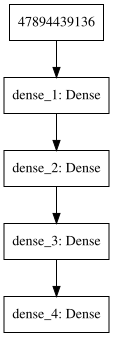

In [18]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
print(online_network.summary())

SVG(model_to_dot(online_network).create(prog='dot', format='svg'))

Prepare plot of the model with more information. First, create a file with the plot.

In [19]:
from keras.utils import plot_model
plot_model(online_network, to_file='online_network.png',show_shapes=True,show_layer_names=True)

Plot the architecture of the network saved as *online_network.png*. (To see the plot log into iLykei.com, then rerun this cell).

![Model plot](https://ilykei.com/api/fileProxy/documents%2FAdvanced%20Machine%20Learning%2FReinforced%20Learning%2Fonline_network.png)

## Prepare tools for the strategy

- Create `replay_memory` - a storage of experienced transitions - as `deque`. 

In [20]:
from collections import deque
replay_memory_maxlen = 1_000_000
replay_memory = deque([], maxlen=replay_memory_maxlen)

- Create a function selecting action according to $\varepsilon$-greedy algorithm, i.e. select action randomly with probability $\varepsilon$ and action with best known Q-value with probability $1-\varepsilon$

In [21]:
def epsilon_greedy(q_values, epsilon, n_outputs):
    if random.random() < epsilon:
        return random.randrange(n_outputs)  # random action
    else:
        return np.argmax(q_values)  # q-optimal action

- Set global variables necessary for the learning process.

In [22]:
n_steps = 100_000 # number of times 
warmup = 1_000 # first iterations after random initiation before training starts
training_interval = 4 # number of steps after which dqn is retrained
copy_steps = 2_000 # number of steps after which weights of 
                   # online network copied into target network
gamma = 0.99 # discount rate
batch_size = 64 # size of batch from replay memory 
eps_max = 1.0 # parameters of decaying sequence of eps
eps_min = 0.05
eps_decay_steps = 50_000

## Description of steps of the learning process 

Example outputs below correspond to the very beginning of the learning process. 

### Preliminary operations of step

- Observe the environment and obtain Q-values of available actions from the online network.

In [23]:
step = 0
iteration = 0
done = True 

obs = env.reset()
print('Observtion: ',[obs])
q_values = online_network.predict(np.array([obs]))
print('Q-values',q_values)

Observtion:  [array([ 0.00632148,  0.03452651, -0.02119053,  0.04699328])]
Q-values [[ 0.00861686 -0.00502278]]


- Calculate $\varepsilon$ and select the next action according to the $\varepsilon$-greedy policy. Value of $\varepsilon$ gradually declines from `eps_max` to `eps_min` in `eps_decay_steps` steps.

In [27]:
epsilon = max(eps_min, eps_max - (eps_max-eps_min) * step/eps_decay_steps)
action = epsilon_greedy(q_values, epsilon, nb_actions)
print('Epsilon: ',epsilon, ', Action: ', action)

Epsilon:  1.0 , Action:  1


- Execute the selected action. Record the transition (last state, action, reward, new state, flag of end of the session) to the replay memory. Make next observation current.

In [29]:
next_obs, reward, done, info = env.step(action)
replay_memory.append((obs, action, reward, next_obs, done))
obs = next_obs

In [22]:
print('Record in replay memory')
print('Previous state: ',replay_memory[0][0])
print('Action: ',replay_memory[0][1])
print('Reward: ',replay_memory[0][2])
print('Next state: ',replay_memory[0][3])
print('Game end: ',replay_memory[0][4])

Record in replay memory
Previous state:  [-0.04294008 -0.03278549 -0.04743456 -0.0091914 ]
Action:  0
Reward:  1.0
Next state:  [-0.04359579 -0.2271962  -0.04761838  0.26815612]
Game end:  False


### Training iterations step by step

Repeat preliminary iterations `warmup` number of times, updating replay memory at each iteration. Reset the environment every time the game is over.

In [34]:
step = 0
iteration = 0
done = True
warmup = 64

for iter in range(warmup):
    if done:
        obs = env.reset()
    q_values = online_network.predict(np.array([obs]))[0]  
    epsilon = max(eps_min, eps_max - (eps_max-eps_min) * step/eps_decay_steps)
    action = epsilon_greedy(q_values, epsilon, nb_actions)
    next_obs, reward, done, info = env.step(action)
    replay_memory.append((obs, action, reward, next_obs, done))
    obs = next_obs
len(replay_memory)    

65

After that continue the iterations while doing the following every `training_interval` number of iterations:

- Select randomly `batch_size` number of records from replay memory. Create an array for each field of the selected replay memory records.

In [37]:
minibatch = random.sample(replay_memory, batch_size)
replay_state = np.array([x[0] for x in minibatch])
replay_action = np.array([x[1] for x in minibatch])
replay_rewards = np.array([x[2] for x in minibatch])
replay_next_state = np.array([x[3] for x in minibatch])
replay_done = np.array([x[4] for x in minibatch], dtype=int)
replay_action

array([0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0])

- Predict Q-values for each record in the batch using the target network.

In [38]:
target_predict = target_network.predict(replay_next_state)
print('Target prediction shape: ', target_predict.shape)
print('Example of predicted values: ',target_predict[3])

Target prediction shape:  (64, 2)
Example of predicted values:  [ 0.01175147 -0.036856  ]


- Calculate vector of values $\max_a Q(\text{next_state}, a\ |\ \theta_\text{target})$ for each record in the batch. Here notation "$|\ \theta_\text{target}$" means that the target network was used for calculation of $Q(\text{next_state}, a)$. There are only 2 available actions in each state. So, maximum is selected in each row of 2 numbers in `target_predict`:

In [39]:
print('Shape of the max: ',np.amax(target_predict,axis=1).shape)

Shape of the max:  (64,)


 - Now use the discounted $\max_a Q(\text{next_state}, a\ |\ \theta_\text{target})$ in Bellman-type formula
$$y_\text{target} = \text{reward} + \gamma \cdot \max_a Q(\text{next_state}, a\ |\ \theta_\text{target}),$$ where $\gamma$ is the discount rate. The formula above is used if the pole is still balancing. If the game has ended then $$ y_\text{target} = \text{reward}.$$
The result $y_\text{target}$ is now going to be the target for training online network.
Note that the target is first prepared as prediction of Q-values by the online network. Then in each row the value of the column corresponding to the action recorded in the replay memory is replaced with the Q-value predicted by the target network.
When the original values predicted by online network are used as target they will not affect training. 

In [41]:
target_for_action = replay_rewards + (1-replay_done) * gamma * \
                                    np.amax(target_predict, axis=1)
target = online_network.predict(replay_state)  # targets coincide with predictions ...
print('Target predicted by online network')
print(target[:5])

Target predicted by online network
[[ 3.9333948e-03 -3.3612084e-04]
 [ 4.0103953e-02 -2.8147483e-02]
 [ 8.5084414e-01 -9.3402997e-02]
 [ 2.3954574e-02 -6.4176414e-04]
 [ 4.2815909e-02 -7.7538505e-02]]


In [27]:
target_for_action = replay_rewards + (1-replay_done) * gamma * \
                                    np.amax(target_predict, axis=1)
target = online_network.predict(replay_state)  # targets coincide with predictions ...
print('Target predicted by online network')
print(target[:5])
target[np.arange(batch_size), replay_action] = target_for_action
print('Update with values predicted by target network')
print(target[:5])
print('Replay actions and target_for_action')
for i in range(5):
    print(replay_action[i],target_for_action[i])

Target predicted by online network
[[-0.00781324 -0.01353711]
 [-0.01925613 -0.04272511]
 [ 0.00505941 -0.00438376]
 [ 0.00692422 -0.00772058]
 [ 0.01805113 -0.01679181]]
Update with values predicted by target network
[[ 0.99648905 -0.01353711]
 [-0.01925613  0.96014595]
 [ 0.00505941  1.00216019]
 [ 0.00692422  1.00710988]
 [ 0.01805113  1.        ]]
Replay actions and target_for_action
0 0.996489050866
1 0.960145950429
1 1.00216018262
1 1.00710986718
1 1.0


- Finally, fit the online network to reproduce target. The pair of arguments `initial_epoch=step-1` and `epochs=step` means that for every `step` fit has only 1 epoch and the last epoch number equals `step`. After every `copy_steps` steps update the weights of target network with weights of the current online network.

`online_network.fit(replay_state, target, epochs=step, verbose=2, initial_epoch=step-1)
 if step % copy_steps == 0:
    target_network.set_weights(online_network.get_weights())`

## Putting it together

Collecting all previously described steps together and running them for large enough number of steps `n_steps` allows training DQN for prediction of the Q-values. 

In [28]:
step = 0
iteration = 0
done = True

while step < n_steps:
    if done:
        obs = env.reset()
    iteration += 1
    q_values = online_network.predict(np.array([obs]))[0]  
    epsilon = max(eps_min, eps_max - (eps_max-eps_min) * step/eps_decay_steps)
    action = epsilon_greedy(q_values, epsilon, nb_actions)
    next_obs, reward, done, info = env.step(action)
    replay_memory.append((obs, action, reward, next_obs, done))
    obs = next_obs

    if iteration >= warmup and iteration % training_interval == 0:
        step += 1
        minibatch = random.sample(replay_memory, batch_size)
        replay_state = np.array([x[0] for x in minibatch])
        replay_action = np.array([x[1] for x in minibatch])
        replay_rewards = np.array([x[2] for x in minibatch])
        replay_next_state = np.array([x[3] for x in minibatch])
        replay_done = np.array([x[4] for x in minibatch], dtype=int)
        target_for_action = replay_rewards + (1-replay_done) * gamma * \
                                    np.amax(target_network.predict(replay_next_state), axis=1)
        target = online_network.predict(replay_state)  # targets coincide with predictions ...
        target[np.arange(batch_size), replay_action] = target_for_action  #...except for targets with actions from replay
        online_network.fit(replay_state, target, epochs=step, verbose=1, initial_epoch=step-1)
        if step % copy_steps == 0:
            target_network.set_weights(online_network.get_weights())

def test_dqn(n_games, model, nb_actions=9, skip_start=90, eps=0.05, render=False, sleep_time=0.01):
    env = gym.make("MsPacman-ram-v0")
    scores = []
    for i in range(n_games):
        obs = env.reset()
        score = 0
        done = False
        for skip in range(skip_start):  # skip the start of each game (it's just freezing time before game starts)
            obs, reward, done, info = env.step(0)
            score += reward
        while not done:
            state = obs
            q_values = model.predict(np.array([state]))[0]
            action = epsilon_greedy(q_values, eps, nb_actions)
            obs, reward, done, info = env.step(action)
            score += reward
            if render:
                env.render()
                time.sleep(sleep_time)
                if done:
                    time.sleep(1)
        scores.append(score)
        print('{}/{}: {}'.format(i+1, n_games, score))
        env.close()
    return scores

Epoch 1/1
64/64 [==============================] - 0s 4ms/step - loss: 0.5041
Epoch 2/2
64/64 [==============================] - 0s 141us/step - loss: 0.4956
Epoch 3/3
64/64 [==============================] - 0s 150us/step - loss: 0.4896
Epoch 4/4
64/64 [==============================] - 0s 126us/step - loss: 0.4841
Epoch 5/5
64/64 [==============================] - 0s 85us/step - loss: 0.4770
Epoch 6/6
64/64 [==============================] - 0s 149us/step - loss: 0.4718
Epoch 7/7
64/64 [==============================] - 0s 122us/step - loss: 0.4640
Epoch 8/8
64/64 [==============================] - 0s 105us/step - loss: 0.4539
Epoch 9/9
64/64 [==============================] - 0s 159us/step - loss: 0.4535
Epoch 10/10
64/64 [==============================] - 0s 175us/step - loss: 0.4506
Epoch 11/11
64/64 [==============================] - 0s 118us/step - loss: 0.4389
Epoch 12/12
64/64 [==============================] - 0s 309us/step - loss: 0.4321
Epoch 13/13
64/64 [==================

64/64 [==============================] - 0s 91us/step - loss: 0.0025
Epoch 199/199
64/64 [==============================] - 0s 166us/step - loss: 0.0036
Epoch 200/200
64/64 [==============================] - 0s 246us/step - loss: 0.0033
Epoch 201/201
64/64 [==============================] - 0s 299us/step - loss: 0.0031
Epoch 202/202
64/64 [==============================] - 0s 108us/step - loss: 0.0027
Epoch 203/203
64/64 [==============================] - 0s 247us/step - loss: 0.0029
Epoch 204/204
64/64 [==============================] - 0s 171us/step - loss: 0.0020
Epoch 205/205
64/64 [==============================] - 0s 262us/step - loss: 0.0036
Epoch 206/206
64/64 [==============================] - 0s 260us/step - loss: 0.0022
Epoch 207/207
64/64 [==============================] - 0s 338us/step - loss: 0.0035
Epoch 208/208
64/64 [==============================] - 0s 290us/step - loss: 0.0023
Epoch 209/209
64/64 [==============================] - 0s 104us/step - loss: 0.0041
Epoch 2

64/64 [==============================] - 0s 93us/step - loss: 8.5359e-04
Epoch 390/390
64/64 [==============================] - 0s 514us/step - loss: 0.0010
Epoch 391/391
64/64 [==============================] - 0s 106us/step - loss: 7.1492e-04
Epoch 392/392
64/64 [==============================] - 0s 294us/step - loss: 6.2132e-04
Epoch 393/393
64/64 [==============================] - 0s 105us/step - loss: 3.8355e-04
Epoch 394/394
64/64 [==============================] - 0s 100us/step - loss: 6.2204e-04
Epoch 395/395
64/64 [==============================] - 0s 196us/step - loss: 3.6650e-04
Epoch 396/396
64/64 [==============================] - 0s 258us/step - loss: 4.7209e-04
Epoch 397/397
64/64 [==============================] - 0s 269us/step - loss: 6.6054e-04
Epoch 398/398
64/64 [==============================] - 0s 140us/step - loss: 6.0504e-04
Epoch 399/399
64/64 [==============================] - 0s 141us/step - loss: 4.9161e-04
Epoch 400/400
64/64 [==============================

64/64 [==============================] - 0s 228us/step - loss: 4.1296e-04
Epoch 483/483
64/64 [==============================] - 0s 338us/step - loss: 4.0866e-04
Epoch 484/484
64/64 [==============================] - 0s 260us/step - loss: 3.3536e-04
Epoch 485/485
64/64 [==============================] - 0s 185us/step - loss: 4.2634e-04
Epoch 486/486
64/64 [==============================] - 0s 100us/step - loss: 2.6529e-04
Epoch 487/487
64/64 [==============================] - 0s 116us/step - loss: 4.8033e-04
Epoch 488/488
64/64 [==============================] - 0s 295us/step - loss: 2.8101e-04
Epoch 489/489
64/64 [==============================] - 0s 87us/step - loss: 4.0748e-04
Epoch 490/490
64/64 [==============================] - 0s 144us/step - loss: 4.9459e-04
Epoch 491/491
64/64 [==============================] - 0s 146us/step - loss: 3.0422e-04
Epoch 492/492
64/64 [==============================] - 0s 237us/step - loss: 8.4272e-04
Epoch 493/493
64/64 [==========================

Epoch 575/575
64/64 [==============================] - 0s 246us/step - loss: 2.7785e-04
Epoch 576/576
64/64 [==============================] - 0s 114us/step - loss: 2.3002e-04
Epoch 577/577
64/64 [==============================] - 0s 173us/step - loss: 2.3667e-04
Epoch 578/578
64/64 [==============================] - 0s 161us/step - loss: 2.6393e-04
Epoch 579/579
64/64 [==============================] - 0s 160us/step - loss: 2.6375e-04
Epoch 580/580
64/64 [==============================] - 0s 160us/step - loss: 2.8169e-04
Epoch 581/581
64/64 [==============================] - 0s 151us/step - loss: 1.8207e-04
Epoch 582/582
64/64 [==============================] - 0s 272us/step - loss: 2.9486e-04
Epoch 583/583
64/64 [==============================] - 0s 392us/step - loss: 2.8753e-04
Epoch 584/584
64/64 [==============================] - 0s 274us/step - loss: 4.4448e-04
Epoch 585/585
64/64 [==============================] - 0s 252us/step - loss: 3.0635e-04
Epoch 586/586
64/64 [===========

64/64 [==============================] - 0s 239us/step - loss: 2.5305e-04
Epoch 761/761
64/64 [==============================] - 0s 274us/step - loss: 1.5351e-04
Epoch 762/762
64/64 [==============================] - 0s 207us/step - loss: 2.5643e-04
Epoch 763/763
64/64 [==============================] - 0s 207us/step - loss: 1.4389e-04
Epoch 764/764
64/64 [==============================] - 0s 165us/step - loss: 1.8032e-04
Epoch 765/765
64/64 [==============================] - 0s 210us/step - loss: 1.4538e-04
Epoch 766/766
64/64 [==============================] - 0s 189us/step - loss: 2.7323e-04
Epoch 767/767
64/64 [==============================] - 0s 91us/step - loss: 1.0716e-04
Epoch 768/768
64/64 [==============================] - 0s 133us/step - loss: 3.5451e-04
Epoch 769/769
64/64 [==============================] - 0s 99us/step - loss: 2.2715e-04
Epoch 770/770
64/64 [==============================] - 0s 103us/step - loss: 1.1716e-04
Epoch 771/771
64/64 [===========================

64/64 [==============================] - 0s 416us/step - loss: 2.3452e-04
Epoch 947/947
64/64 [==============================] - 0s 426us/step - loss: 1.9044e-04
Epoch 948/948
64/64 [==============================] - 0s 321us/step - loss: 4.7911e-04
Epoch 949/949
64/64 [==============================] - 0s 106us/step - loss: 2.5792e-04
Epoch 950/950
64/64 [==============================] - ETA: 0s - loss: 1.1804e-0 - 0s 196us/step - loss: 9.7996e-05
Epoch 951/951
64/64 [==============================] - 0s 124us/step - loss: 2.5540e-04
Epoch 952/952
64/64 [==============================] - 0s 171us/step - loss: 2.0376e-04
Epoch 953/953
64/64 [==============================] - 0s 135us/step - loss: 2.0994e-04
Epoch 954/954
64/64 [==============================] - 0s 246us/step - loss: 1.7128e-04
Epoch 955/955
64/64 [==============================] - 0s 190us/step - loss: 1.8828e-04
Epoch 956/956
64/64 [==============================] - 0s 157us/step - loss: 1.7300e-04
Epoch 957/957
64/6

64/64 [==============================] - 0s 167us/step - loss: 1.7255e-04
Epoch 1039/1039
64/64 [==============================] - 0s 129us/step - loss: 4.3518e-04
Epoch 1040/1040
64/64 [==============================] - 0s 144us/step - loss: 3.6056e-04
Epoch 1041/1041
64/64 [==============================] - 0s 132us/step - loss: 1.8092e-04
Epoch 1042/1042
64/64 [==============================] - 0s 148us/step - loss: 1.4737e-04
Epoch 1043/1043
64/64 [==============================] - 0s 116us/step - loss: 3.8036e-04
Epoch 1044/1044
64/64 [==============================] - 0s 130us/step - loss: 1.8441e-04
Epoch 1045/1045
64/64 [==============================] - 0s 81us/step - loss: 3.1342e-04
Epoch 1046/1046
64/64 [==============================] - 0s 197us/step - loss: 1.7564e-04
Epoch 1047/1047
64/64 [==============================] - 0s 89us/step - loss: 2.7558e-04
Epoch 1048/1048
64/64 [==============================] - 0s 172us/step - loss: 1.3262e-04
Epoch 1049/1049
64/64 [=====

Epoch 1129/1129
64/64 [==============================] - 0s 160us/step - loss: 1.2310e-04
Epoch 1130/1130
64/64 [==============================] - 0s 209us/step - loss: 7.6863e-05
Epoch 1131/1131
64/64 [==============================] - 0s 114us/step - loss: 2.4053e-04
Epoch 1132/1132
64/64 [==============================] - 0s 237us/step - loss: 1.4999e-04
Epoch 1133/1133
64/64 [==============================] - 0s 216us/step - loss: 2.0548e-04
Epoch 1134/1134
64/64 [==============================] - 0s 358us/step - loss: 1.8276e-04
Epoch 1135/1135
64/64 [==============================] - 0s 194us/step - loss: 2.1437e-04
Epoch 1136/1136
64/64 [==============================] - 0s 137us/step - loss: 2.0390e-04
Epoch 1137/1137
64/64 [==============================] - 0s 283us/step - loss: 1.8394e-04
Epoch 1138/1138
64/64 [==============================] - 0s 262us/step - loss: 1.8110e-04
Epoch 1139/1139
64/64 [==============================] - 0s 303us/step - loss: 1.4905e-04
Epoch 1140

64/64 [==============================] - 0s 255us/step - loss: 2.4956e-04
Epoch 1311/1311
64/64 [==============================] - 0s 360us/step - loss: 1.6187e-04
Epoch 1312/1312
64/64 [==============================] - 0s 178us/step - loss: 1.2060e-04
Epoch 1313/1313
64/64 [==============================] - 0s 143us/step - loss: 1.1341e-04
Epoch 1314/1314
64/64 [==============================] - 0s 171us/step - loss: 2.2547e-04
Epoch 1315/1315
64/64 [==============================] - 0s 101us/step - loss: 1.4306e-04
Epoch 1316/1316
64/64 [==============================] - 0s 170us/step - loss: 5.6493e-04
Epoch 1317/1317
64/64 [==============================] - 0s 133us/step - loss: 1.3634e-04
Epoch 1318/1318
64/64 [==============================] - 0s 328us/step - loss: 3.7236e-04
Epoch 1319/1319
64/64 [==============================] - 0s 471us/step - loss: 1.2498e-04
Epoch 1320/1320
64/64 [==============================] - 0s 559us/step - loss: 2.5321e-04
Epoch 1321/1321
64/64 [===

64/64 [==============================] - 0s 218us/step - loss: 2.0140e-04
Epoch 1493/1493
64/64 [==============================] - 0s 291us/step - loss: 1.1194e-04
Epoch 1494/1494
64/64 [==============================] - 0s 173us/step - loss: 1.6303e-04
Epoch 1495/1495
64/64 [==============================] - 0s 144us/step - loss: 1.3235e-04
Epoch 1496/1496
64/64 [==============================] - 0s 112us/step - loss: 1.6553e-04
Epoch 1497/1497
64/64 [==============================] - 0s 120us/step - loss: 7.9407e-05
Epoch 1498/1498
64/64 [==============================] - 0s 172us/step - loss: 1.0447e-04
Epoch 1499/1499
64/64 [==============================] - 0s 126us/step - loss: 1.5048e-04
Epoch 1500/1500
64/64 [==============================] - 0s 126us/step - loss: 1.9131e-04
Epoch 1501/1501
64/64 [==============================] - 0s 92us/step - loss: 1.5572e-04
Epoch 1502/1502
64/64 [==============================] - 0s 355us/step - loss: 2.5897e-04
Epoch 1503/1503
64/64 [====

64/64 [==============================] - 0s 242us/step - loss: 1.8385e-04
Epoch 1675/1675
64/64 [==============================] - 0s 241us/step - loss: 2.3653e-04
Epoch 1676/1676
64/64 [==============================] - 0s 121us/step - loss: 2.7847e-04
Epoch 1677/1677
64/64 [==============================] - 0s 203us/step - loss: 1.8245e-04
Epoch 1678/1678
64/64 [==============================] - 0s 128us/step - loss: 2.4970e-04
Epoch 1679/1679
64/64 [==============================] - 0s 119us/step - loss: 3.4063e-04
Epoch 1680/1680
64/64 [==============================] - 0s 112us/step - loss: 9.9276e-05
Epoch 1681/1681
64/64 [==============================] - 0s 115us/step - loss: 2.9991e-04
Epoch 1682/1682
64/64 [==============================] - 0s 167us/step - loss: 1.9761e-04
Epoch 1683/1683
64/64 [==============================] - 0s 135us/step - loss: 1.5003e-04
Epoch 1684/1684
64/64 [==============================] - 0s 116us/step - loss: 2.8157e-04
Epoch 1685/1685
64/64 [===

Epoch 1856/1856
64/64 [==============================] - 0s 241us/step - loss: 1.5094e-04
Epoch 1857/1857
64/64 [==============================] - 0s 143us/step - loss: 5.7426e-05
Epoch 1858/1858
64/64 [==============================] - 0s 290us/step - loss: 8.8554e-05
Epoch 1859/1859
64/64 [==============================] - 0s 234us/step - loss: 1.3266e-04
Epoch 1860/1860
64/64 [==============================] - 0s 123us/step - loss: 1.0508e-04
Epoch 1861/1861
64/64 [==============================] - 0s 75us/step - loss: 4.8255e-04
Epoch 1862/1862
64/64 [==============================] - 0s 142us/step - loss: 1.9820e-04
Epoch 1863/1863
64/64 [==============================] - 0s 273us/step - loss: 7.5519e-05
Epoch 1864/1864
64/64 [==============================] - 0s 130us/step - loss: 1.1291e-04
Epoch 1865/1865
64/64 [==============================] - 0s 170us/step - loss: 5.7479e-04
Epoch 1866/1866
64/64 [==============================] - 0s 132us/step - loss: 1.3462e-04
Epoch 1867/

64/64 [==============================] - 0s 258us/step - loss: 0.0080
Epoch 2039/2039
64/64 [==============================] - 0s 135us/step - loss: 0.0396
Epoch 2040/2040
64/64 [==============================] - 0s 340us/step - loss: 0.0294
Epoch 2041/2041
64/64 [==============================] - 0s 211us/step - loss: 0.0163
Epoch 2042/2042
64/64 [==============================] - 0s 167us/step - loss: 0.0252
Epoch 2043/2043
64/64 [==============================] - 0s 337us/step - loss: 0.0351
Epoch 2044/2044
64/64 [==============================] - 0s 403us/step - loss: 0.0027
Epoch 2045/2045
64/64 [==============================] - 0s 259us/step - loss: 0.0214
Epoch 2046/2046
64/64 [==============================] - 0s 65us/step - loss: 0.0290
Epoch 2047/2047
64/64 [==============================] - 0s 133us/step - loss: 0.0146
Epoch 2048/2048
64/64 [==============================] - 0s 167us/step - loss: 0.0267
Epoch 2049/2049
64/64 [==============================] - 0s 134us/step 

64/64 [==============================] - 0s 136us/step - loss: 0.0123
Epoch 2229/2229
64/64 [==============================] - 0s 93us/step - loss: 0.0114
Epoch 2230/2230
64/64 [==============================] - 0s 86us/step - loss: 0.0073
Epoch 2231/2231
64/64 [==============================] - 0s 130us/step - loss: 0.0287
Epoch 2232/2232
64/64 [==============================] - 0s 92us/step - loss: 0.0279
Epoch 2233/2233
64/64 [==============================] - 0s 85us/step - loss: 0.0183
Epoch 2234/2234
64/64 [==============================] - 0s 100us/step - loss: 0.0215
Epoch 2235/2235
64/64 [==============================] - 0s 115us/step - loss: 0.0217
Epoch 2236/2236
64/64 [==============================] - 0s 150us/step - loss: 0.0189
Epoch 2237/2237
64/64 [==============================] - 0s 108us/step - loss: 0.0324
Epoch 2238/2238
64/64 [==============================] - 0s 173us/step - loss: 0.0244
Epoch 2239/2239
64/64 [==============================] - 0s 175us/step - l

64/64 [==============================] - 0s 202us/step - loss: 0.0083
Epoch 2419/2419
64/64 [==============================] - 0s 307us/step - loss: 0.0171
Epoch 2420/2420
64/64 [==============================] - 0s 392us/step - loss: 0.0021
Epoch 2421/2421
64/64 [==============================] - 0s 200us/step - loss: 0.0211
Epoch 2422/2422
64/64 [==============================] - 0s 207us/step - loss: 0.0280
Epoch 2423/2423
64/64 [==============================] - 0s 211us/step - loss: 0.0297
Epoch 2424/2424
64/64 [==============================] - 0s 162us/step - loss: 0.0152
Epoch 2425/2425
64/64 [==============================] - 0s 232us/step - loss: 0.0354
Epoch 2426/2426
64/64 [==============================] - 0s 306us/step - loss: 0.0274
Epoch 2427/2427
64/64 [==============================] - 0s 327us/step - loss: 0.0365
Epoch 2428/2428
64/64 [==============================] - 0s 125us/step - loss: 0.0190
Epoch 2429/2429
64/64 [==============================] - 0s 107us/step

64/64 [==============================] - 0s 162us/step - loss: 0.0021
Epoch 2609/2609
64/64 [==============================] - 0s 413us/step - loss: 0.0139
Epoch 2610/2610
64/64 [==============================] - 0s 306us/step - loss: 0.0188
Epoch 2611/2611
64/64 [==============================] - 0s 283us/step - loss: 0.0358
Epoch 2612/2612
64/64 [==============================] - 0s 257us/step - loss: 0.0136
Epoch 2613/2613
64/64 [==============================] - 0s 424us/step - loss: 0.0325
Epoch 2614/2614
64/64 [==============================] - 0s 508us/step - loss: 0.0121
Epoch 2615/2615
64/64 [==============================] - 0s 225us/step - loss: 0.0149
Epoch 2616/2616
64/64 [==============================] - 0s 278us/step - loss: 0.0196
Epoch 2617/2617
64/64 [==============================] - 0s 259us/step - loss: 0.0137
Epoch 2618/2618
64/64 [==============================] - 0s 619us/step - loss: 0.0130
Epoch 2619/2619
64/64 [==============================] - 0s 230us/step

64/64 [==============================] - 0s 162us/step - loss: 0.0221
Epoch 2799/2799
64/64 [==============================] - 0s 175us/step - loss: 0.0239
Epoch 2800/2800
64/64 [==============================] - 0s 167us/step - loss: 0.0103
Epoch 2801/2801
64/64 [==============================] - 0s 85us/step - loss: 0.0237
Epoch 2802/2802
64/64 [==============================] - 0s 98us/step - loss: 0.0113
Epoch 2803/2803
64/64 [==============================] - 0s 162us/step - loss: 0.0099
Epoch 2804/2804
64/64 [==============================] - 0s 181us/step - loss: 0.0054
Epoch 2805/2805
64/64 [==============================] - 0s 93us/step - loss: 0.0238
Epoch 2806/2806
64/64 [==============================] - 0s 95us/step - loss: 0.0276
Epoch 2807/2807
64/64 [==============================] - 0s 135us/step - loss: 0.0242
Epoch 2808/2808
64/64 [==============================] - 0s 178us/step - loss: 0.0071
Epoch 2809/2809
64/64 [==============================] - 0s 258us/step - l

64/64 [==============================] - 0s 104us/step - loss: 0.0269
Epoch 2989/2989
64/64 [==============================] - 0s 93us/step - loss: 0.0131
Epoch 2990/2990
64/64 [==============================] - 0s 103us/step - loss: 0.0210
Epoch 2991/2991
64/64 [==============================] - 0s 105us/step - loss: 0.0089
Epoch 2992/2992
64/64 [==============================] - 0s 141us/step - loss: 0.0177
Epoch 2993/2993
64/64 [==============================] - 0s 167us/step - loss: 0.0215
Epoch 2994/2994
64/64 [==============================] - 0s 114us/step - loss: 0.0033
Epoch 2995/2995
64/64 [==============================] - 0s 120us/step - loss: 0.0044
Epoch 2996/2996
64/64 [==============================] - 0s 100us/step - loss: 0.0131
Epoch 2997/2997
64/64 [==============================] - 0s 154us/step - loss: 0.0316
Epoch 2998/2998
64/64 [==============================] - 0s 153us/step - loss: 0.0032
Epoch 2999/2999
64/64 [==============================] - 0s 396us/step 

64/64 [==============================] - 0s 257us/step - loss: 0.0199
Epoch 3178/3178
64/64 [==============================] - 0s 213us/step - loss: 0.0188
Epoch 3179/3179
64/64 [==============================] - 0s 262us/step - loss: 0.0173
Epoch 3180/3180
64/64 [==============================] - 0s 248us/step - loss: 0.0168
Epoch 3181/3181
64/64 [==============================] - 0s 200us/step - loss: 0.0196
Epoch 3182/3182
64/64 [==============================] - 0s 254us/step - loss: 0.0179
Epoch 3183/3183
64/64 [==============================] - 0s 173us/step - loss: 0.0085
Epoch 3184/3184
64/64 [==============================] - 0s 121us/step - loss: 0.0069
Epoch 3185/3185
64/64 [==============================] - 0s 142us/step - loss: 0.0114
Epoch 3186/3186
64/64 [==============================] - 0s 70us/step - loss: 0.0150
Epoch 3187/3187
64/64 [==============================] - 0s 75us/step - loss: 0.0029
Epoch 3188/3188
64/64 [==============================] - 0s 103us/step -

64/64 [==============================] - 0s 223us/step - loss: 0.0117
Epoch 3368/3368
64/64 [==============================] - 0s 169us/step - loss: 0.0149
Epoch 3369/3369
64/64 [==============================] - 0s 199us/step - loss: 0.0092
Epoch 3370/3370
64/64 [==============================] - 0s 262us/step - loss: 0.0107
Epoch 3371/3371
64/64 [==============================] - 0s 240us/step - loss: 0.0190
Epoch 3372/3372
64/64 [==============================] - 0s 86us/step - loss: 0.0107
Epoch 3373/3373
64/64 [==============================] - 0s 269us/step - loss: 0.0123
Epoch 3374/3374
64/64 [==============================] - 0s 219us/step - loss: 0.0085
Epoch 3375/3375
64/64 [==============================] - 0s 81us/step - loss: 0.0153
Epoch 3376/3376
64/64 [==============================] - 0s 169us/step - loss: 0.0106
Epoch 3377/3377
64/64 [==============================] - 0s 308us/step - loss: 0.0086
Epoch 3378/3378
64/64 [==============================] - 0s 219us/step -

64/64 [==============================] - 0s 256us/step - loss: 0.0083
Epoch 3558/3558
64/64 [==============================] - 0s 208us/step - loss: 0.0049
Epoch 3559/3559
64/64 [==============================] - 0s 209us/step - loss: 0.0133
Epoch 3560/3560
64/64 [==============================] - 0s 260us/step - loss: 0.0109
Epoch 3561/3561
64/64 [==============================] - 0s 297us/step - loss: 0.0079
Epoch 3562/3562
64/64 [==============================] - 0s 289us/step - loss: 0.0104
Epoch 3563/3563
64/64 [==============================] - 0s 401us/step - loss: 0.0222
Epoch 3564/3564
64/64 [==============================] - 0s 133us/step - loss: 0.0111
Epoch 3565/3565
64/64 [==============================] - 0s 172us/step - loss: 0.0118
Epoch 3566/3566
64/64 [==============================] - 0s 386us/step - loss: 0.0106
Epoch 3567/3567
64/64 [==============================] - 0s 87us/step - loss: 0.0113
Epoch 3568/3568
64/64 [==============================] - 0s 81us/step -

64/64 [==============================] - 0s 102us/step - loss: 0.0198
Epoch 3747/3747
64/64 [==============================] - 0s 148us/step - loss: 0.0095
Epoch 3748/3748
64/64 [==============================] - 0s 206us/step - loss: 0.0107
Epoch 3749/3749
64/64 [==============================] - 0s 134us/step - loss: 0.0114
Epoch 3750/3750
64/64 [==============================] - 0s 321us/step - loss: 0.0091
Epoch 3751/3751
64/64 [==============================] - 0s 325us/step - loss: 0.0235
Epoch 3752/3752
64/64 [==============================] - 0s 749us/step - loss: 0.0048
Epoch 3753/3753
64/64 [==============================] - 0s 327us/step - loss: 0.0177
Epoch 3754/3754
64/64 [==============================] - 0s 405us/step - loss: 0.0052
Epoch 3755/3755
64/64 [==============================] - 0s 119us/step - loss: 0.0127
Epoch 3756/3756
64/64 [==============================] - 0s 267us/step - loss: 0.0130
Epoch 3757/3757
64/64 [==============================] - 0s 727us/step

64/64 [==============================] - 0s 265us/step - loss: 0.0071
Epoch 3936/3936
64/64 [==============================] - 0s 165us/step - loss: 0.0119
Epoch 3937/3937
64/64 [==============================] - 0s 164us/step - loss: 0.0094
Epoch 3938/3938
64/64 [==============================] - 0s 274us/step - loss: 0.0045
Epoch 3939/3939
64/64 [==============================] - 0s 203us/step - loss: 0.0062
Epoch 3940/3940
64/64 [==============================] - 0s 94us/step - loss: 0.0151
Epoch 3941/3941
64/64 [==============================] - 0s 197us/step - loss: 0.0109
Epoch 3942/3942
64/64 [==============================] - 0s 121us/step - loss: 0.0143
Epoch 3943/3943
64/64 [==============================] - 0s 189us/step - loss: 0.0126
Epoch 3944/3944
64/64 [==============================] - 0s 126us/step - loss: 0.0032
Epoch 3945/3945
64/64 [==============================] - 0s 171us/step - loss: 0.0127
Epoch 3946/3946
64/64 [==============================] - 0s 156us/step 

64/64 [==============================] - 0s 230us/step - loss: 0.0521
Epoch 4126/4126
64/64 [==============================] - 0s 117us/step - loss: 0.0212
Epoch 4127/4127
64/64 [==============================] - 0s 100us/step - loss: 0.0370
Epoch 4128/4128
64/64 [==============================] - 0s 111us/step - loss: 0.0260
Epoch 4129/4129
64/64 [==============================] - 0s 129us/step - loss: 0.0277
Epoch 4130/4130
64/64 [==============================] - 0s 111us/step - loss: 0.0237
Epoch 4131/4131
64/64 [==============================] - 0s 114us/step - loss: 0.0202
Epoch 4132/4132
64/64 [==============================] - 0s 229us/step - loss: 0.0281
Epoch 4133/4133
64/64 [==============================] - 0s 117us/step - loss: 0.0300
Epoch 4134/4134
64/64 [==============================] - 0s 209us/step - loss: 0.0412
Epoch 4135/4135
64/64 [==============================] - 0s 288us/step - loss: 0.0278
Epoch 4136/4136
64/64 [==============================] - 0s 246us/step

64/64 [==============================] - 0s 329us/step - loss: 0.0032
Epoch 4316/4316
64/64 [==============================] - 0s 374us/step - loss: 0.0213
Epoch 4317/4317
64/64 [==============================] - 0s 160us/step - loss: 0.0290
Epoch 4318/4318
64/64 [==============================] - 0s 246us/step - loss: 0.0255
Epoch 4319/4319
64/64 [==============================] - 0s 119us/step - loss: 0.0211
Epoch 4320/4320
64/64 [==============================] - 0s 170us/step - loss: 0.0129
Epoch 4321/4321
64/64 [==============================] - 0s 163us/step - loss: 0.0421
Epoch 4322/4322
64/64 [==============================] - 0s 165us/step - loss: 0.0350
Epoch 4323/4323
64/64 [==============================] - 0s 127us/step - loss: 0.0222
Epoch 4324/4324
64/64 [==============================] - 0s 124us/step - loss: 0.0262
Epoch 4325/4325
64/64 [==============================] - 0s 177us/step - loss: 0.0132
Epoch 4326/4326
64/64 [==============================] - 0s 158us/step

64/64 [==============================] - 0s 183us/step - loss: 0.0169
Epoch 4506/4506
64/64 [==============================] - 0s 162us/step - loss: 0.0308
Epoch 4507/4507
64/64 [==============================] - 0s 246us/step - loss: 0.0215
Epoch 4508/4508
64/64 [==============================] - 0s 499us/step - loss: 0.0501
Epoch 4509/4509
64/64 [==============================] - 0s 284us/step - loss: 0.0443
Epoch 4510/4510
64/64 [==============================] - 0s 137us/step - loss: 0.0415
Epoch 4511/4511
64/64 [==============================] - 0s 383us/step - loss: 0.0272
Epoch 4512/4512
64/64 [==============================] - 0s 412us/step - loss: 0.0193
Epoch 4513/4513
64/64 [==============================] - 0s 264us/step - loss: 0.0187
Epoch 4514/4514
64/64 [==============================] - 0s 319us/step - loss: 0.0071
Epoch 4515/4515
64/64 [==============================] - 0s 312us/step - loss: 0.0274
Epoch 4516/4516
64/64 [==============================] - 0s 191us/step

64/64 [==============================] - 0s 245us/step - loss: 0.0292
Epoch 4696/4696
64/64 [==============================] - 0s 208us/step - loss: 0.0075
Epoch 4697/4697
64/64 [==============================] - 0s 252us/step - loss: 0.0179
Epoch 4698/4698
64/64 [==============================] - 0s 299us/step - loss: 0.0304
Epoch 4699/4699
64/64 [==============================] - 0s 279us/step - loss: 0.0574
Epoch 4700/4700
64/64 [==============================] - 0s 335us/step - loss: 0.0196
Epoch 4701/4701
64/64 [==============================] - 0s 213us/step - loss: 0.0306
Epoch 4702/4702
64/64 [==============================] - ETA: 0s - loss: 0.032 - 0s 264us/step - loss: 0.0328
Epoch 4703/4703
64/64 [==============================] - 0s 196us/step - loss: 0.0198
Epoch 4704/4704
64/64 [==============================] - 0s 226us/step - loss: 0.0087
Epoch 4705/4705
64/64 [==============================] - 0s 224us/step - loss: 0.0186
Epoch 4706/4706
64/64 [=======================

64/64 [==============================] - 0s 136us/step - loss: 0.0078
Epoch 4791/4791
64/64 [==============================] - 0s 213us/step - loss: 0.0299
Epoch 4792/4792
64/64 [==============================] - 0s 238us/step - loss: 0.0225
Epoch 4793/4793
64/64 [==============================] - 0s 155us/step - loss: 0.0245
Epoch 4794/4794
64/64 [==============================] - 0s 246us/step - loss: 0.0204
Epoch 4795/4795
64/64 [==============================] - 0s 155us/step - loss: 0.0167
Epoch 4796/4796
64/64 [==============================] - 0s 402us/step - loss: 0.0172
Epoch 4797/4797
64/64 [==============================] - 0s 319us/step - loss: 0.0314
Epoch 4798/4798
64/64 [==============================] - 0s 137us/step - loss: 0.0351
Epoch 4799/4799
64/64 [==============================] - 0s 130us/step - loss: 0.0165
Epoch 4800/4800
64/64 [==============================] - 0s 109us/step - loss: 0.0096
Epoch 4801/4801
64/64 [==============================] - 0s 198us/step

64/64 [==============================] - 0s 132us/step - loss: 0.0413
Epoch 4981/4981
64/64 [==============================] - 0s 210us/step - loss: 0.0566
Epoch 4982/4982
64/64 [==============================] - 0s 174us/step - loss: 0.0171
Epoch 4983/4983
64/64 [==============================] - 0s 113us/step - loss: 0.0353
Epoch 4984/4984
64/64 [==============================] - 0s 71us/step - loss: 0.0075
Epoch 4985/4985
64/64 [==============================] - 0s 199us/step - loss: 0.0173
Epoch 4986/4986
64/64 [==============================] - 0s 103us/step - loss: 0.0118
Epoch 4987/4987
64/64 [==============================] - 0s 131us/step - loss: 0.0185
Epoch 4988/4988
64/64 [==============================] - 0s 93us/step - loss: 0.0246
Epoch 4989/4989
64/64 [==============================] - 0s 269us/step - loss: 0.0368
Epoch 4990/4990
64/64 [==============================] - 0s 271us/step - loss: 0.0111
Epoch 4991/4991
64/64 [==============================] - 0s 291us/step -

64/64 [==============================] - 0s 107us/step - loss: 0.0102
Epoch 5171/5171
64/64 [==============================] - 0s 263us/step - loss: 0.0311
Epoch 5172/5172
64/64 [==============================] - 0s 220us/step - loss: 0.0129
Epoch 5173/5173
64/64 [==============================] - 0s 128us/step - loss: 0.0210
Epoch 5174/5174
64/64 [==============================] - 0s 245us/step - loss: 0.0327
Epoch 5175/5175
64/64 [==============================] - 0s 98us/step - loss: 0.0171
Epoch 5176/5176
64/64 [==============================] - 0s 125us/step - loss: 0.0427
Epoch 5177/5177
64/64 [==============================] - 0s 173us/step - loss: 0.0479
Epoch 5178/5178
64/64 [==============================] - 0s 181us/step - loss: 0.0113
Epoch 5179/5179
64/64 [==============================] - 0s 250us/step - loss: 0.0263
Epoch 5180/5180
64/64 [==============================] - 0s 131us/step - loss: 0.0319
Epoch 5181/5181
64/64 [==============================] - 0s 192us/step 

64/64 [==============================] - 0s 239us/step - loss: 0.0105
Epoch 5361/5361
64/64 [==============================] - 0s 116us/step - loss: 0.0186
Epoch 5362/5362
64/64 [==============================] - 0s 123us/step - loss: 0.0086
Epoch 5363/5363
64/64 [==============================] - 0s 215us/step - loss: 0.0405
Epoch 5364/5364
64/64 [==============================] - 0s 129us/step - loss: 0.0384
Epoch 5365/5365
64/64 [==============================] - 0s 151us/step - loss: 0.0118
Epoch 5366/5366
64/64 [==============================] - 0s 116us/step - loss: 0.0078
Epoch 5367/5367
64/64 [==============================] - 0s 237us/step - loss: 0.0040
Epoch 5368/5368
64/64 [==============================] - 0s 157us/step - loss: 0.0316
Epoch 5369/5369
64/64 [==============================] - 0s 123us/step - loss: 0.0098
Epoch 5370/5370
64/64 [==============================] - 0s 100us/step - loss: 0.0153
Epoch 5371/5371
64/64 [==============================] - 0s 416us/step

64/64 [==============================] - 0s 391us/step - loss: 0.0405
Epoch 5551/5551
64/64 [==============================] - 0s 136us/step - loss: 0.0175
Epoch 5552/5552
64/64 [==============================] - 0s 73us/step - loss: 0.0138
Epoch 5553/5553
64/64 [==============================] - 0s 90us/step - loss: 0.0079
Epoch 5554/5554
64/64 [==============================] - 0s 120us/step - loss: 0.0106
Epoch 5555/5555
64/64 [==============================] - 0s 420us/step - loss: 0.0072
Epoch 5556/5556
64/64 [==============================] - 0s 162us/step - loss: 0.0193
Epoch 5557/5557
64/64 [==============================] - 0s 159us/step - loss: 0.0044
Epoch 5558/5558
64/64 [==============================] - 0s 122us/step - loss: 0.0322
Epoch 5559/5559
64/64 [==============================] - 0s 157us/step - loss: 0.0287
Epoch 5560/5560
64/64 [==============================] - 0s 179us/step - loss: 0.0226
Epoch 5561/5561
64/64 [==============================] - 0s 242us/step -

64/64 [==============================] - 0s 244us/step - loss: 0.0075
Epoch 5741/5741
64/64 [==============================] - 0s 235us/step - loss: 0.0486
Epoch 5742/5742
64/64 [==============================] - 0s 231us/step - loss: 0.0170
Epoch 5743/5743
64/64 [==============================] - 0s 240us/step - loss: 0.0139
Epoch 5744/5744
64/64 [==============================] - 0s 248us/step - loss: 0.0189
Epoch 5745/5745
64/64 [==============================] - 0s 263us/step - loss: 0.0147
Epoch 5746/5746
64/64 [==============================] - 0s 290us/step - loss: 0.0439
Epoch 5747/5747
64/64 [==============================] - 0s 139us/step - loss: 0.0305
Epoch 5748/5748
64/64 [==============================] - 0s 154us/step - loss: 0.0102
Epoch 5749/5749
64/64 [==============================] - 0s 237us/step - loss: 0.0183
Epoch 5750/5750
64/64 [==============================] - 0s 200us/step - loss: 0.0076
Epoch 5751/5751
64/64 [==============================] - 0s 181us/step

64/64 [==============================] - 0s 213us/step - loss: 0.0284
Epoch 5931/5931
64/64 [==============================] - 0s 154us/step - loss: 0.0099
Epoch 5932/5932
64/64 [==============================] - 0s 313us/step - loss: 0.0164
Epoch 5933/5933
64/64 [==============================] - 0s 290us/step - loss: 0.0500
Epoch 5934/5934
64/64 [==============================] - 0s 149us/step - loss: 0.0283
Epoch 5935/5935
64/64 [==============================] - 0s 245us/step - loss: 0.0165
Epoch 5936/5936
64/64 [==============================] - 0s 167us/step - loss: 0.0251
Epoch 5937/5937
64/64 [==============================] - 0s 182us/step - loss: 0.0277
Epoch 5938/5938
64/64 [==============================] - 0s 144us/step - loss: 0.0137
Epoch 5939/5939
64/64 [==============================] - 0s 160us/step - loss: 0.0193
Epoch 5940/5940
64/64 [==============================] - 0s 160us/step - loss: 0.0107
Epoch 5941/5941
64/64 [==============================] - 0s 219us/step

64/64 [==============================] - 0s 184us/step - loss: 0.0070
Epoch 6121/6121
64/64 [==============================] - 0s 102us/step - loss: 0.0256
Epoch 6122/6122
64/64 [==============================] - 0s 394us/step - loss: 0.0037
Epoch 6123/6123
64/64 [==============================] - 0s 184us/step - loss: 0.0620
Epoch 6124/6124
64/64 [==============================] - 0s 182us/step - loss: 0.0136
Epoch 6125/6125
64/64 [==============================] - 0s 214us/step - loss: 0.0296
Epoch 6126/6126
64/64 [==============================] - 0s 450us/step - loss: 0.0102
Epoch 6127/6127
64/64 [==============================] - 0s 306us/step - loss: 0.0102
Epoch 6128/6128
64/64 [==============================] - 0s 86us/step - loss: 0.0409
Epoch 6129/6129
64/64 [==============================] - 0s 89us/step - loss: 0.0494
Epoch 6130/6130
64/64 [==============================] - 0s 92us/step - loss: 0.0501
Epoch 6131/6131
64/64 [==============================] - 0s 153us/step - 

Epoch 6215/6215
64/64 [==============================] - 0s 244us/step - loss: 0.0244
Epoch 6216/6216
64/64 [==============================] - 0s 225us/step - loss: 0.0329
Epoch 6217/6217
64/64 [==============================] - 0s 116us/step - loss: 0.0252
Epoch 6218/6218
64/64 [==============================] - 0s 226us/step - loss: 0.0206
Epoch 6219/6219
64/64 [==============================] - 0s 119us/step - loss: 0.0319
Epoch 6220/6220
64/64 [==============================] - 0s 387us/step - loss: 0.0159
Epoch 6221/6221
64/64 [==============================] - 0s 332us/step - loss: 0.0497
Epoch 6222/6222
64/64 [==============================] - 0s 222us/step - loss: 0.0153
Epoch 6223/6223
64/64 [==============================] - 0s 240us/step - loss: 0.0124
Epoch 6224/6224
64/64 [==============================] - 0s 214us/step - loss: 0.0222
Epoch 6225/6225
64/64 [==============================] - 0s 185us/step - loss: 0.0371
Epoch 6226/6226
64/64 [==============================]

64/64 [==============================] - 0s 378us/step - loss: 0.0335
Epoch 6406/6406
64/64 [==============================] - 0s 289us/step - loss: 0.0143
Epoch 6407/6407
64/64 [==============================] - 0s 269us/step - loss: 0.0207
Epoch 6408/6408
64/64 [==============================] - 0s 98us/step - loss: 0.0246
Epoch 6409/6409
64/64 [==============================] - 0s 137us/step - loss: 0.0126
Epoch 6410/6410
64/64 [==============================] - 0s 217us/step - loss: 0.0103
Epoch 6411/6411
64/64 [==============================] - 0s 137us/step - loss: 0.0154
Epoch 6412/6412
64/64 [==============================] - 0s 170us/step - loss: 0.0167
Epoch 6413/6413
64/64 [==============================] - 0s 155us/step - loss: 0.0175
Epoch 6414/6414
64/64 [==============================] - 0s 213us/step - loss: 0.0137
Epoch 6415/6415
64/64 [==============================] - 0s 212us/step - loss: 0.0375
Epoch 6416/6416
64/64 [==============================] - 0s 232us/step 

64/64 [==============================] - 0s 110us/step - loss: 0.0321
Epoch 6596/6596
64/64 [==============================] - 0s 112us/step - loss: 0.0079
Epoch 6597/6597
64/64 [==============================] - 0s 126us/step - loss: 0.0232
Epoch 6598/6598
64/64 [==============================] - 0s 221us/step - loss: 0.0228
Epoch 6599/6599
64/64 [==============================] - 0s 154us/step - loss: 0.0322
Epoch 6600/6600
64/64 [==============================] - 0s 161us/step - loss: 0.0451
Epoch 6601/6601
64/64 [==============================] - 0s 150us/step - loss: 0.0050
Epoch 6602/6602
64/64 [==============================] - 0s 199us/step - loss: 0.0311
Epoch 6603/6603
64/64 [==============================] - 0s 158us/step - loss: 0.0116
Epoch 6604/6604
64/64 [==============================] - 0s 188us/step - loss: 0.0142
Epoch 6605/6605
64/64 [==============================] - 0s 101us/step - loss: 0.0080
Epoch 6606/6606
64/64 [==============================] - 0s 401us/step

64/64 [==============================] - 0s 134us/step - loss: 0.0532
Epoch 6786/6786
64/64 [==============================] - 0s 222us/step - loss: 0.0450
Epoch 6787/6787
64/64 [==============================] - 0s 163us/step - loss: 0.0220
Epoch 6788/6788
64/64 [==============================] - 0s 105us/step - loss: 0.0347
Epoch 6789/6789
64/64 [==============================] - 0s 119us/step - loss: 0.0240
Epoch 6790/6790
64/64 [==============================] - 0s 164us/step - loss: 0.0403
Epoch 6791/6791
64/64 [==============================] - 0s 329us/step - loss: 0.0364
Epoch 6792/6792
64/64 [==============================] - 0s 141us/step - loss: 0.0256
Epoch 6793/6793
64/64 [==============================] - 0s 124us/step - loss: 0.0185
Epoch 6794/6794
64/64 [==============================] - 0s 168us/step - loss: 0.0152
Epoch 6795/6795
64/64 [==============================] - 0s 111us/step - loss: 0.0065
Epoch 6796/6796
64/64 [==============================] - 0s 242us/step

64/64 [==============================] - 0s 238us/step - loss: 0.0313
Epoch 6975/6975
64/64 [==============================] - 0s 219us/step - loss: 0.0189
Epoch 6976/6976
64/64 [==============================] - 0s 108us/step - loss: 0.0142
Epoch 6977/6977
64/64 [==============================] - 0s 103us/step - loss: 0.0243
Epoch 6978/6978
64/64 [==============================] - 0s 197us/step - loss: 0.0612
Epoch 6979/6979
64/64 [==============================] - 0s 183us/step - loss: 0.0212
Epoch 6980/6980
64/64 [==============================] - 0s 106us/step - loss: 0.0158
Epoch 6981/6981
64/64 [==============================] - 0s 210us/step - loss: 0.0236
Epoch 6982/6982
64/64 [==============================] - 0s 139us/step - loss: 0.0300
Epoch 6983/6983
64/64 [==============================] - 0s 236us/step - loss: 0.0119
Epoch 6984/6984
64/64 [==============================] - 0s 223us/step - loss: 0.0327
Epoch 6985/6985
64/64 [==============================] - ETA: 0s - los

64/64 [==============================] - 0s 259us/step - loss: 0.0318
Epoch 7165/7165
64/64 [==============================] - 0s 316us/step - loss: 0.0109
Epoch 7166/7166
64/64 [==============================] - 0s 245us/step - loss: 0.0232
Epoch 7167/7167
64/64 [==============================] - 0s 195us/step - loss: 0.0075
Epoch 7168/7168
64/64 [==============================] - 0s 190us/step - loss: 0.0340
Epoch 7169/7169
64/64 [==============================] - 0s 190us/step - loss: 0.0358
Epoch 7170/7170
64/64 [==============================] - 0s 260us/step - loss: 0.0091
Epoch 7171/7171
64/64 [==============================] - 0s 99us/step - loss: 0.0540
Epoch 7172/7172
64/64 [==============================] - 0s 135us/step - loss: 0.0225
Epoch 7173/7173
64/64 [==============================] - 0s 156us/step - loss: 0.0125
Epoch 7174/7174
64/64 [==============================] - 0s 216us/step - loss: 0.0161
Epoch 7175/7175
64/64 [==============================] - 0s 253us/step 

Epoch 7353/7353
64/64 [==============================] - 0s 234us/step - loss: 0.0231
Epoch 7354/7354
64/64 [==============================] - 0s 218us/step - loss: 0.0228
Epoch 7355/7355
64/64 [==============================] - 0s 168us/step - loss: 0.0414
Epoch 7356/7356
64/64 [==============================] - 0s 133us/step - loss: 0.0176
Epoch 7357/7357
64/64 [==============================] - 0s 188us/step - loss: 0.0149
Epoch 7358/7358
64/64 [==============================] - 0s 201us/step - loss: 0.0318
Epoch 7359/7359
64/64 [==============================] - 0s 142us/step - loss: 0.0313
Epoch 7360/7360
64/64 [==============================] - 0s 288us/step - loss: 0.0113
Epoch 7361/7361
64/64 [==============================] - 0s 127us/step - loss: 0.0109
Epoch 7362/7362
64/64 [==============================] - 0s 170us/step - loss: 0.0774
Epoch 7363/7363
64/64 [==============================] - 0s 201us/step - loss: 0.0142
Epoch 7364/7364
64/64 [==============================]

64/64 [==============================] - 0s 236us/step - loss: 0.0217
Epoch 7544/7544
64/64 [==============================] - 0s 191us/step - loss: 0.0173
Epoch 7545/7545
64/64 [==============================] - 0s 218us/step - loss: 0.0208
Epoch 7546/7546
64/64 [==============================] - 0s 253us/step - loss: 0.0120
Epoch 7547/7547
64/64 [==============================] - 0s 171us/step - loss: 0.0270
Epoch 7548/7548
64/64 [==============================] - 0s 93us/step - loss: 0.0164
Epoch 7549/7549
64/64 [==============================] - 0s 191us/step - loss: 0.0294
Epoch 7550/7550
64/64 [==============================] - 0s 118us/step - loss: 0.0277
Epoch 7551/7551
64/64 [==============================] - 0s 94us/step - loss: 0.0207
Epoch 7552/7552
64/64 [==============================] - 0s 111us/step - loss: 0.0134
Epoch 7553/7553
64/64 [==============================] - 0s 116us/step - loss: 0.0175
Epoch 7554/7554
64/64 [==============================] - 0s 100us/step -

64/64 [==============================] - 0s 209us/step - loss: 0.0095
Epoch 7734/7734
64/64 [==============================] - 0s 214us/step - loss: 0.0243
Epoch 7735/7735
64/64 [==============================] - 0s 183us/step - loss: 0.0200
Epoch 7736/7736
64/64 [==============================] - 0s 299us/step - loss: 0.0112
Epoch 7737/7737
64/64 [==============================] - 0s 266us/step - loss: 0.0079
Epoch 7738/7738
64/64 [==============================] - 0s 147us/step - loss: 0.0197
Epoch 7739/7739
64/64 [==============================] - 0s 144us/step - loss: 0.0195
Epoch 7740/7740
64/64 [==============================] - 0s 397us/step - loss: 0.0194
Epoch 7741/7741
64/64 [==============================] - 0s 278us/step - loss: 0.0338
Epoch 7742/7742
64/64 [==============================] - 0s 152us/step - loss: 0.0153
Epoch 7743/7743
64/64 [==============================] - 0s 70us/step - loss: 0.0091
Epoch 7744/7744
64/64 [==============================] - 0s 78us/step -

64/64 [==============================] - 0s 126us/step - loss: 0.0174
Epoch 7924/7924
64/64 [==============================] - 0s 98us/step - loss: 0.0062
Epoch 7925/7925
64/64 [==============================] - 0s 157us/step - loss: 0.0168
Epoch 7926/7926
64/64 [==============================] - 0s 156us/step - loss: 0.0056
Epoch 7927/7927
64/64 [==============================] - 0s 271us/step - loss: 0.0458
Epoch 7928/7928
64/64 [==============================] - 0s 155us/step - loss: 0.0072
Epoch 7929/7929
64/64 [==============================] - 0s 299us/step - loss: 0.0220
Epoch 7930/7930
64/64 [==============================] - 0s 370us/step - loss: 0.0276
Epoch 7931/7931
64/64 [==============================] - 0s 149us/step - loss: 0.0076
Epoch 7932/7932
64/64 [==============================] - 0s 232us/step - loss: 0.0267
Epoch 7933/7933
64/64 [==============================] - 0s 141us/step - loss: 0.0092
Epoch 7934/7934
64/64 [==============================] - 0s 172us/step 

64/64 [==============================] - 0s 682us/step - loss: 0.0349
Epoch 8114/8114
64/64 [==============================] - 0s 361us/step - loss: 0.0241
Epoch 8115/8115
64/64 [==============================] - 0s 305us/step - loss: 0.1011
Epoch 8116/8116
64/64 [==============================] - 0s 138us/step - loss: 0.0113
Epoch 8117/8117
64/64 [==============================] - 0s 170us/step - loss: 0.0469
Epoch 8118/8118
64/64 [==============================] - 0s 220us/step - loss: 0.0271
Epoch 8119/8119
64/64 [==============================] - 0s 232us/step - loss: 0.0269
Epoch 8120/8120
64/64 [==============================] - 0s 232us/step - loss: 0.0616
Epoch 8121/8121
64/64 [==============================] - 0s 279us/step - loss: 0.0190
Epoch 8122/8122
64/64 [==============================] - 0s 240us/step - loss: 0.0070
Epoch 8123/8123
64/64 [==============================] - 0s 166us/step - loss: 0.0144
Epoch 8124/8124
64/64 [==============================] - 0s 175us/step

64/64 [==============================] - 0s 219us/step - loss: 0.0080
Epoch 8304/8304
64/64 [==============================] - 0s 255us/step - loss: 0.0533
Epoch 8305/8305
64/64 [==============================] - 0s 178us/step - loss: 0.0153
Epoch 8306/8306
64/64 [==============================] - 0s 185us/step - loss: 0.0230
Epoch 8307/8307
64/64 [==============================] - 0s 215us/step - loss: 0.0271
Epoch 8308/8308
64/64 [==============================] - 0s 249us/step - loss: 0.0221
Epoch 8309/8309
64/64 [==============================] - 0s 231us/step - loss: 0.0468
Epoch 8310/8310
64/64 [==============================] - 0s 193us/step - loss: 0.0359
Epoch 8311/8311
64/64 [==============================] - 0s 237us/step - loss: 0.0361
Epoch 8312/8312
64/64 [==============================] - 0s 231us/step - loss: 0.0307
Epoch 8313/8313
64/64 [==============================] - 0s 287us/step - loss: 0.0796
Epoch 8314/8314
64/64 [==============================] - 0s 87us/step 

64/64 [==============================] - 0s 327us/step - loss: 0.0222
Epoch 8494/8494
64/64 [==============================] - 0s 237us/step - loss: 0.0142
Epoch 8495/8495
64/64 [==============================] - 0s 96us/step - loss: 0.0345
Epoch 8496/8496
64/64 [==============================] - 0s 182us/step - loss: 0.0214
Epoch 8497/8497
64/64 [==============================] - 0s 394us/step - loss: 0.0768
Epoch 8498/8498
64/64 [==============================] - 0s 323us/step - loss: 0.0325
Epoch 8499/8499
64/64 [==============================] - 0s 240us/step - loss: 0.0210
Epoch 8500/8500
64/64 [==============================] - 0s 106us/step - loss: 0.0732
Epoch 8501/8501
64/64 [==============================] - 0s 162us/step - loss: 0.0748
Epoch 8502/8502
64/64 [==============================] - 0s 149us/step - loss: 0.0287
Epoch 8503/8503
64/64 [==============================] - 0s 155us/step - loss: 0.0118
Epoch 8504/8504
64/64 [==============================] - 0s 143us/step 

64/64 [==============================] - 0s 211us/step - loss: 0.0610
Epoch 8684/8684
64/64 [==============================] - 0s 198us/step - loss: 0.0208
Epoch 8685/8685
64/64 [==============================] - 0s 350us/step - loss: 0.0092
Epoch 8686/8686
64/64 [==============================] - 0s 401us/step - loss: 0.0504
Epoch 8687/8687
64/64 [==============================] - 0s 140us/step - loss: 0.0248
Epoch 8688/8688
64/64 [==============================] - 0s 175us/step - loss: 0.0159
Epoch 8689/8689
64/64 [==============================] - 0s 120us/step - loss: 0.0423
Epoch 8690/8690
64/64 [==============================] - 0s 136us/step - loss: 0.0240
Epoch 8691/8691
64/64 [==============================] - 0s 129us/step - loss: 0.0209
Epoch 8692/8692
64/64 [==============================] - 0s 207us/step - loss: 0.0286
Epoch 8693/8693
64/64 [==============================] - 0s 202us/step - loss: 0.0778
Epoch 8694/8694
64/64 [==============================] - 0s 260us/step

64/64 [==============================] - 0s 316us/step - loss: 0.0494
Epoch 8874/8874
64/64 [==============================] - 0s 220us/step - loss: 0.0580
Epoch 8875/8875
64/64 [==============================] - 0s 136us/step - loss: 0.0523
Epoch 8876/8876
64/64 [==============================] - 0s 115us/step - loss: 0.0134
Epoch 8877/8877
64/64 [==============================] - 0s 180us/step - loss: 0.0150
Epoch 8878/8878
64/64 [==============================] - 0s 179us/step - loss: 0.0183
Epoch 8879/8879
64/64 [==============================] - 0s 168us/step - loss: 0.0055
Epoch 8880/8880
64/64 [==============================] - 0s 94us/step - loss: 0.0336
Epoch 8881/8881
64/64 [==============================] - 0s 103us/step - loss: 0.0244
Epoch 8882/8882
64/64 [==============================] - 0s 217us/step - loss: 0.0265
Epoch 8883/8883
64/64 [==============================] - 0s 125us/step - loss: 0.0180
Epoch 8884/8884
64/64 [==============================] - 0s 92us/step -

64/64 [==============================] - 0s 150us/step - loss: 0.0095
Epoch 9064/9064
64/64 [==============================] - 0s 123us/step - loss: 0.0146
Epoch 9065/9065
64/64 [==============================] - 0s 119us/step - loss: 0.0264
Epoch 9066/9066
64/64 [==============================] - 0s 82us/step - loss: 0.0152
Epoch 9067/9067
64/64 [==============================] - 0s 72us/step - loss: 0.0167
Epoch 9068/9068
64/64 [==============================] - 0s 141us/step - loss: 0.0370
Epoch 9069/9069
64/64 [==============================] - 0s 155us/step - loss: 0.0083
Epoch 9070/9070
64/64 [==============================] - 0s 148us/step - loss: 0.0320
Epoch 9071/9071
64/64 [==============================] - 0s 94us/step - loss: 0.0128
Epoch 9072/9072
64/64 [==============================] - 0s 146us/step - loss: 0.0189
Epoch 9073/9073
64/64 [==============================] - 0s 99us/step - loss: 0.0252
Epoch 9074/9074
64/64 [==============================] - 0s 108us/step - l

Epoch 9253/9253
64/64 [==============================] - 0s 182us/step - loss: 0.0312
Epoch 9254/9254
64/64 [==============================] - 0s 191us/step - loss: 0.0318
Epoch 9255/9255
64/64 [==============================] - 0s 239us/step - loss: 0.0993
Epoch 9256/9256
64/64 [==============================] - 0s 402us/step - loss: 0.0163
Epoch 9257/9257
64/64 [==============================] - 0s 182us/step - loss: 0.0249
Epoch 9258/9258
64/64 [==============================] - 0s 175us/step - loss: 0.0166
Epoch 9259/9259
64/64 [==============================] - 0s 119us/step - loss: 0.0461
Epoch 9260/9260
64/64 [==============================] - 0s 124us/step - loss: 0.0328
Epoch 9261/9261
64/64 [==============================] - 0s 189us/step - loss: 0.0459
Epoch 9262/9262
64/64 [==============================] - 0s 267us/step - loss: 0.0153
Epoch 9263/9263
64/64 [==============================] - 0s 150us/step - loss: 0.0223
Epoch 9264/9264
64/64 [==============================]

64/64 [==============================] - 0s 177us/step - loss: 0.0611
Epoch 9444/9444
64/64 [==============================] - 0s 150us/step - loss: 0.0549
Epoch 9445/9445
64/64 [==============================] - 0s 205us/step - loss: 0.0796
Epoch 9446/9446
64/64 [==============================] - 0s 254us/step - loss: 0.0181
Epoch 9447/9447
64/64 [==============================] - 0s 255us/step - loss: 0.0317
Epoch 9448/9448
64/64 [==============================] - 0s 94us/step - loss: 0.0186
Epoch 9449/9449
64/64 [==============================] - 0s 325us/step - loss: 0.0121
Epoch 9450/9450
64/64 [==============================] - 0s 135us/step - loss: 0.0268
Epoch 9451/9451
64/64 [==============================] - 0s 162us/step - loss: 0.0251
Epoch 9452/9452
64/64 [==============================] - 0s 81us/step - loss: 0.0242
Epoch 9453/9453
64/64 [==============================] - 0s 119us/step - loss: 0.0526
Epoch 9454/9454
64/64 [==============================] - 0s 122us/step -

64/64 [==============================] - 0s 161us/step - loss: 0.0184
Epoch 9634/9634
64/64 [==============================] - 0s 169us/step - loss: 0.0130
Epoch 9635/9635
64/64 [==============================] - 0s 84us/step - loss: 0.0236
Epoch 9636/9636
64/64 [==============================] - 0s 81us/step - loss: 0.0166
Epoch 9637/9637
64/64 [==============================] - 0s 79us/step - loss: 0.0197
Epoch 9638/9638
64/64 [==============================] - 0s 121us/step - loss: 0.0095
Epoch 9639/9639
64/64 [==============================] - 0s 220us/step - loss: 0.0094
Epoch 9640/9640
64/64 [==============================] - 0s 132us/step - loss: 0.0508
Epoch 9641/9641
64/64 [==============================] - 0s 225us/step - loss: 0.0168
Epoch 9642/9642
64/64 [==============================] - 0s 95us/step - loss: 0.0131
Epoch 9643/9643
64/64 [==============================] - 0s 95us/step - loss: 0.0364
Epoch 9644/9644
64/64 [==============================] - 0s 179us/step - lo

64/64 [==============================] - 0s 217us/step - loss: 0.0469
Epoch 9824/9824
64/64 [==============================] - 0s 281us/step - loss: 0.1129
Epoch 9825/9825
64/64 [==============================] - 0s 188us/step - loss: 0.0713
Epoch 9826/9826
64/64 [==============================] - 0s 300us/step - loss: 0.0267
Epoch 9827/9827
64/64 [==============================] - 0s 137us/step - loss: 0.0161
Epoch 9828/9828
64/64 [==============================] - 0s 124us/step - loss: 0.0221
Epoch 9829/9829
64/64 [==============================] - 0s 182us/step - loss: 0.0439
Epoch 9830/9830
64/64 [==============================] - 0s 142us/step - loss: 0.0075
Epoch 9831/9831
64/64 [==============================] - 0s 270us/step - loss: 0.0213
Epoch 9832/9832
64/64 [==============================] - 0s 288us/step - loss: 0.0188
Epoch 9833/9833
64/64 [==============================] - 0s 316us/step - loss: 0.0383
Epoch 9834/9834
64/64 [==============================] - 0s 139us/step

64/64 [==============================] - 0s 393us/step - loss: 0.0238
Epoch 10013/10013
64/64 [==============================] - 0s 102us/step - loss: 0.0294
Epoch 10014/10014
64/64 [==============================] - 0s 318us/step - loss: 0.0684
Epoch 10015/10015
64/64 [==============================] - 0s 187us/step - loss: 0.0435
Epoch 10016/10016
64/64 [==============================] - 0s 236us/step - loss: 0.0409
Epoch 10017/10017
64/64 [==============================] - 0s 244us/step - loss: 0.1077
Epoch 10018/10018
64/64 [==============================] - 0s 126us/step - loss: 0.1010
Epoch 10019/10019
64/64 [==============================] - 0s 176us/step - loss: 0.0525
Epoch 10020/10020
64/64 [==============================] - 0s 161us/step - loss: 0.2031
Epoch 10021/10021
64/64 [==============================] - 0s 126us/step - loss: 0.0425
Epoch 10022/10022
64/64 [==============================] - 0s 137us/step - loss: 0.0198
Epoch 10023/10023
64/64 [=========================

64/64 [==============================] - 0s 278us/step - loss: 0.0330
Epoch 10199/10199
64/64 [==============================] - 0s 325us/step - loss: 0.0269
Epoch 10200/10200
64/64 [==============================] - 0s 342us/step - loss: 0.0210
Epoch 10201/10201
64/64 [==============================] - 0s 221us/step - loss: 0.0559
Epoch 10202/10202
64/64 [==============================] - 0s 249us/step - loss: 0.0253
Epoch 10203/10203
64/64 [==============================] - 0s 79us/step - loss: 0.0942
Epoch 10204/10204
64/64 [==============================] - 0s 201us/step - loss: 0.0247
Epoch 10205/10205
64/64 [==============================] - 0s 133us/step - loss: 0.0799
Epoch 10206/10206
64/64 [==============================] - 0s 236us/step - loss: 0.0454
Epoch 10207/10207
64/64 [==============================] - 0s 227us/step - loss: 0.0301
Epoch 10208/10208
64/64 [==============================] - 0s 242us/step - loss: 0.0266
Epoch 10209/10209
64/64 [==========================

64/64 [==============================] - 0s 331us/step - loss: 0.0178
Epoch 10292/10292
64/64 [==============================] - 0s 529us/step - loss: 0.0464
Epoch 10293/10293
64/64 [==============================] - 0s 263us/step - loss: 0.1002
Epoch 10294/10294
64/64 [==============================] - 0s 283us/step - loss: 0.0302
Epoch 10295/10295
64/64 [==============================] - 0s 113us/step - loss: 0.0733
Epoch 10296/10296
64/64 [==============================] - 0s 133us/step - loss: 0.0580
Epoch 10297/10297
64/64 [==============================] - 0s 165us/step - loss: 0.1170
Epoch 10298/10298
64/64 [==============================] - 0s 116us/step - loss: 0.0354
Epoch 10299/10299
64/64 [==============================] - 0s 151us/step - loss: 0.0539
Epoch 10300/10300
64/64 [==============================] - 0s 253us/step - loss: 0.0205
Epoch 10301/10301
64/64 [==============================] - 0s 197us/step - loss: 0.0298
Epoch 10302/10302
64/64 [=========================

64/64 [==============================] - 0s 111us/step - loss: 0.0361
Epoch 10478/10478
64/64 [==============================] - 0s 137us/step - loss: 0.0387
Epoch 10479/10479
64/64 [==============================] - 0s 129us/step - loss: 0.0686
Epoch 10480/10480
64/64 [==============================] - 0s 122us/step - loss: 0.0517
Epoch 10481/10481
64/64 [==============================] - 0s 101us/step - loss: 0.0340
Epoch 10482/10482
64/64 [==============================] - 0s 212us/step - loss: 0.0211
Epoch 10483/10483
64/64 [==============================] - 0s 238us/step - loss: 0.1472
Epoch 10484/10484
64/64 [==============================] - 0s 264us/step - loss: 0.0461
Epoch 10485/10485
64/64 [==============================] - ETA: 0s - loss: 0.038 - 0s 286us/step - loss: 0.0252
Epoch 10486/10486
64/64 [==============================] - 0s 151us/step - loss: 0.0819
Epoch 10487/10487
64/64 [==============================] - 0s 201us/step - loss: 0.0712
Epoch 10488/10488
64/64 [=

64/64 [==============================] - 0s 144us/step - loss: 0.0203
Epoch 10663/10663
64/64 [==============================] - 0s 181us/step - loss: 0.0289
Epoch 10664/10664
64/64 [==============================] - 0s 115us/step - loss: 0.0283
Epoch 10665/10665
64/64 [==============================] - 0s 79us/step - loss: 0.0220
Epoch 10666/10666
64/64 [==============================] - 0s 298us/step - loss: 0.0230
Epoch 10667/10667
64/64 [==============================] - 0s 238us/step - loss: 0.0172
Epoch 10668/10668
64/64 [==============================] - 0s 130us/step - loss: 0.0113
Epoch 10669/10669
64/64 [==============================] - 0s 313us/step - loss: 0.0507
Epoch 10670/10670
64/64 [==============================] - 0s 244us/step - loss: 0.1002
Epoch 10671/10671
64/64 [==============================] - 0s 245us/step - loss: 0.0416
Epoch 10672/10672
64/64 [==============================] - 0s 188us/step - loss: 0.0471
Epoch 10673/10673
64/64 [==========================

64/64 [==============================] - 0s 125us/step - loss: 0.0242
Epoch 10849/10849
64/64 [==============================] - 0s 234us/step - loss: 0.0508
Epoch 10850/10850
64/64 [==============================] - 0s 134us/step - loss: 0.0474
Epoch 10851/10851
64/64 [==============================] - 0s 232us/step - loss: 0.0249
Epoch 10852/10852
64/64 [==============================] - 0s 134us/step - loss: 0.0652
Epoch 10853/10853
64/64 [==============================] - 0s 241us/step - loss: 0.0215
Epoch 10854/10854
64/64 [==============================] - 0s 259us/step - loss: 0.0398
Epoch 10855/10855
64/64 [==============================] - 0s 86us/step - loss: 0.0168
Epoch 10856/10856
64/64 [==============================] - 0s 105us/step - loss: 0.0293
Epoch 10857/10857
64/64 [==============================] - 0s 113us/step - loss: 0.0428
Epoch 10858/10858
64/64 [==============================] - 0s 235us/step - loss: 0.0267
Epoch 10859/10859
64/64 [==========================

64/64 [==============================] - 0s 156us/step - loss: 0.0301
Epoch 11035/11035
64/64 [==============================] - 0s 236us/step - loss: 0.0344
Epoch 11036/11036
64/64 [==============================] - 0s 109us/step - loss: 0.0361
Epoch 11037/11037
64/64 [==============================] - 0s 382us/step - loss: 0.0336
Epoch 11038/11038
64/64 [==============================] - 0s 400us/step - loss: 0.0222
Epoch 11039/11039
64/64 [==============================] - 0s 86us/step - loss: 0.0216
Epoch 11040/11040
64/64 [==============================] - 0s 173us/step - loss: 0.0611
Epoch 11041/11041
64/64 [==============================] - 0s 162us/step - loss: 0.0213
Epoch 11042/11042
64/64 [==============================] - 0s 175us/step - loss: 0.0485
Epoch 11043/11043
64/64 [==============================] - 0s 256us/step - loss: 0.0273
Epoch 11044/11044
64/64 [==============================] - 0s 253us/step - loss: 0.0526
Epoch 11045/11045
64/64 [==========================

64/64 [==============================] - 0s 399us/step - loss: 0.0194
Epoch 11221/11221
64/64 [==============================] - 0s 261us/step - loss: 0.0331
Epoch 11222/11222
64/64 [==============================] - 0s 116us/step - loss: 0.0786
Epoch 11223/11223
64/64 [==============================] - 0s 190us/step - loss: 0.0309
Epoch 11224/11224
64/64 [==============================] - 0s 128us/step - loss: 0.0171
Epoch 11225/11225
64/64 [==============================] - 0s 99us/step - loss: 0.0483
Epoch 11226/11226
64/64 [==============================] - 0s 149us/step - loss: 0.0260
Epoch 11227/11227
64/64 [==============================] - 0s 149us/step - loss: 0.0370
Epoch 11228/11228
64/64 [==============================] - 0s 157us/step - loss: 0.0637
Epoch 11229/11229
64/64 [==============================] - 0s 253us/step - loss: 0.0327
Epoch 11230/11230
64/64 [==============================] - 0s 358us/step - loss: 0.0875
Epoch 11231/11231
64/64 [==========================

64/64 [==============================] - 0s 147us/step - loss: 0.0257
Epoch 11407/11407
64/64 [==============================] - 0s 161us/step - loss: 0.0228
Epoch 11408/11408
64/64 [==============================] - 0s 129us/step - loss: 0.0213
Epoch 11409/11409
64/64 [==============================] - 0s 143us/step - loss: 0.0179
Epoch 11410/11410
64/64 [==============================] - 0s 140us/step - loss: 0.0547
Epoch 11411/11411
64/64 [==============================] - 0s 177us/step - loss: 0.0162
Epoch 11412/11412
64/64 [==============================] - 0s 117us/step - loss: 0.0287
Epoch 11413/11413
64/64 [==============================] - 0s 110us/step - loss: 0.0136
Epoch 11414/11414
64/64 [==============================] - 0s 274us/step - loss: 0.0264
Epoch 11415/11415
64/64 [==============================] - 0s 120us/step - loss: 0.0467
Epoch 11416/11416
64/64 [==============================] - 0s 81us/step - loss: 0.0452
Epoch 11417/11417
64/64 [==========================

64/64 [==============================] - 0s 180us/step - loss: 0.0304
Epoch 11593/11593
64/64 [==============================] - 0s 212us/step - loss: 0.0114
Epoch 11594/11594
64/64 [==============================] - 0s 140us/step - loss: 0.0139
Epoch 11595/11595
64/64 [==============================] - 0s 299us/step - loss: 0.0866
Epoch 11596/11596
64/64 [==============================] - 0s 471us/step - loss: 0.0468
Epoch 11597/11597
64/64 [==============================] - 0s 342us/step - loss: 0.1980
Epoch 11598/11598
64/64 [==============================] - 0s 320us/step - loss: 0.0206
Epoch 11599/11599
64/64 [==============================] - 0s 185us/step - loss: 0.0868
Epoch 11600/11600
64/64 [==============================] - 0s 160us/step - loss: 0.0256
Epoch 11601/11601
64/64 [==============================] - 0s 222us/step - loss: 0.0732
Epoch 11602/11602
64/64 [==============================] - 0s 361us/step - loss: 0.0299
Epoch 11603/11603
64/64 [=========================

64/64 [==============================] - 0s 200us/step - loss: 0.0258
Epoch 11779/11779
64/64 [==============================] - 0s 115us/step - loss: 0.0894
Epoch 11780/11780
64/64 [==============================] - 0s 133us/step - loss: 0.0568
Epoch 11781/11781
64/64 [==============================] - 0s 116us/step - loss: 0.0201
Epoch 11782/11782
64/64 [==============================] - 0s 211us/step - loss: 0.0989
Epoch 11783/11783
64/64 [==============================] - 0s 134us/step - loss: 0.0343
Epoch 11784/11784
64/64 [==============================] - 0s 98us/step - loss: 0.0225
Epoch 11785/11785
64/64 [==============================] - 0s 91us/step - loss: 0.0230
Epoch 11786/11786
64/64 [==============================] - 0s 221us/step - loss: 0.0179
Epoch 11787/11787
64/64 [==============================] - 0s 268us/step - loss: 0.0169
Epoch 11788/11788
64/64 [==============================] - 0s 122us/step - loss: 0.0228
Epoch 11789/11789
64/64 [===========================

64/64 [==============================] - 0s 497us/step - loss: 0.0219
Epoch 11965/11965
64/64 [==============================] - 0s 133us/step - loss: 0.0454
Epoch 11966/11966
64/64 [==============================] - 0s 308us/step - loss: 0.0353
Epoch 11967/11967
64/64 [==============================] - 0s 332us/step - loss: 0.0798
Epoch 11968/11968
64/64 [==============================] - 0s 222us/step - loss: 0.0116
Epoch 11969/11969
64/64 [==============================] - 0s 219us/step - loss: 0.0656
Epoch 11970/11970
64/64 [==============================] - 0s 248us/step - loss: 0.0295
Epoch 11971/11971
64/64 [==============================] - 0s 101us/step - loss: 0.0242
Epoch 11972/11972
64/64 [==============================] - 0s 118us/step - loss: 0.0197
Epoch 11973/11973
64/64 [==============================] - 0s 211us/step - loss: 0.0322
Epoch 11974/11974
64/64 [==============================] - 0s 578us/step - loss: 0.1191
Epoch 11975/11975
64/64 [=========================

64/64 [==============================] - 0s 374us/step - loss: 0.0773
Epoch 12058/12058
64/64 [==============================] - 0s 308us/step - loss: 0.0433
Epoch 12059/12059
64/64 [==============================] - 0s 279us/step - loss: 0.0430
Epoch 12060/12060
64/64 [==============================] - 0s 234us/step - loss: 0.0343
Epoch 12061/12061
64/64 [==============================] - 0s 253us/step - loss: 0.0375
Epoch 12062/12062
64/64 [==============================] - 0s 127us/step - loss: 0.0545
Epoch 12063/12063
64/64 [==============================] - 0s 270us/step - loss: 0.0857
Epoch 12064/12064
64/64 [==============================] - 0s 112us/step - loss: 0.0270
Epoch 12065/12065
64/64 [==============================] - 0s 238us/step - loss: 0.0390
Epoch 12066/12066
64/64 [==============================] - 0s 372us/step - loss: 0.0457
Epoch 12067/12067
64/64 [==============================] - 0s 128us/step - loss: 0.0534
Epoch 12068/12068
64/64 [=========================

64/64 [==============================] - 0s 118us/step - loss: 0.0298
Epoch 12151/12151
64/64 [==============================] - 0s 173us/step - loss: 0.0249
Epoch 12152/12152
64/64 [==============================] - 0s 127us/step - loss: 0.0186
Epoch 12153/12153
64/64 [==============================] - 0s 114us/step - loss: 0.0339
Epoch 12154/12154
64/64 [==============================] - 0s 136us/step - loss: 0.0299
Epoch 12155/12155
64/64 [==============================] - 0s 114us/step - loss: 0.0672
Epoch 12156/12156
64/64 [==============================] - 0s 119us/step - loss: 0.0471
Epoch 12157/12157
64/64 [==============================] - 0s 110us/step - loss: 0.0647
Epoch 12158/12158
64/64 [==============================] - 0s 108us/step - loss: 0.0414
Epoch 12159/12159
64/64 [==============================] - 0s 214us/step - loss: 0.0338
Epoch 12160/12160
64/64 [==============================] - 0s 198us/step - loss: 0.0232
Epoch 12161/12161
64/64 [=========================

64/64 [==============================] - 0s 199us/step - loss: 0.0513
Epoch 12244/12244
64/64 [==============================] - 0s 159us/step - loss: 0.0307
Epoch 12245/12245
64/64 [==============================] - 0s 104us/step - loss: 0.0387
Epoch 12246/12246
64/64 [==============================] - 0s 79us/step - loss: 0.0234
Epoch 12247/12247
64/64 [==============================] - 0s 119us/step - loss: 0.0322
Epoch 12248/12248
64/64 [==============================] - 0s 141us/step - loss: 0.0872
Epoch 12249/12249
64/64 [==============================] - 0s 216us/step - loss: 0.0460
Epoch 12250/12250
64/64 [==============================] - 0s 257us/step - loss: 0.1336
Epoch 12251/12251
64/64 [==============================] - 0s 293us/step - loss: 0.0669
Epoch 12252/12252
64/64 [==============================] - 0s 102us/step - loss: 0.0489
Epoch 12253/12253
64/64 [==============================] - 0s 133us/step - loss: 0.0306
Epoch 12254/12254
64/64 [==========================

64/64 [==============================] - 0s 165us/step - loss: 0.0485
Epoch 12430/12430
64/64 [==============================] - 0s 137us/step - loss: 0.0590
Epoch 12431/12431
64/64 [==============================] - 0s 112us/step - loss: 0.0340
Epoch 12432/12432
64/64 [==============================] - 0s 211us/step - loss: 0.0376
Epoch 12433/12433
64/64 [==============================] - 0s 213us/step - loss: 0.0574
Epoch 12434/12434
64/64 [==============================] - 0s 146us/step - loss: 0.0923
Epoch 12435/12435
64/64 [==============================] - 0s 177us/step - loss: 0.0774
Epoch 12436/12436
64/64 [==============================] - ETA: 0s - loss: 0.034 - 0s 181us/step - loss: 0.1010
Epoch 12437/12437
64/64 [==============================] - 0s 184us/step - loss: 0.0266
Epoch 12438/12438
64/64 [==============================] - 0s 85us/step - loss: 0.0388
Epoch 12439/12439
64/64 [==============================] - 0s 234us/step - loss: 0.0402
Epoch 12440/12440
64/64 [==

64/64 [==============================] - 0s 139us/step - loss: 0.0434
Epoch 12523/12523
64/64 [==============================] - 0s 285us/step - loss: 0.1431
Epoch 12524/12524
64/64 [==============================] - 0s 216us/step - loss: 0.0288
Epoch 12525/12525
64/64 [==============================] - 0s 147us/step - loss: 0.1570
Epoch 12526/12526
64/64 [==============================] - 0s 158us/step - loss: 0.0882
Epoch 12527/12527
64/64 [==============================] - 0s 439us/step - loss: 0.0331
Epoch 12528/12528
64/64 [==============================] - 0s 236us/step - loss: 0.0159
Epoch 12529/12529
64/64 [==============================] - 0s 201us/step - loss: 0.0279
Epoch 12530/12530
64/64 [==============================] - 0s 188us/step - loss: 0.0371
Epoch 12531/12531
64/64 [==============================] - 0s 241us/step - loss: 0.0390
Epoch 12532/12532
64/64 [==============================] - 0s 205us/step - loss: 0.0530
Epoch 12533/12533
64/64 [=========================

64/64 [==============================] - 0s 320us/step - loss: 0.0259
Epoch 12709/12709
64/64 [==============================] - 0s 86us/step - loss: 0.0785
Epoch 12710/12710
64/64 [==============================] - 0s 1ms/step - loss: 0.0352
Epoch 12711/12711
64/64 [==============================] - 0s 121us/step - loss: 0.0775
Epoch 12712/12712
64/64 [==============================] - 0s 135us/step - loss: 0.0411
Epoch 12713/12713
64/64 [==============================] - 0s 160us/step - loss: 0.0542
Epoch 12714/12714
64/64 [==============================] - 0s 140us/step - loss: 0.0256
Epoch 12715/12715
64/64 [==============================] - 0s 178us/step - loss: 0.0850
Epoch 12716/12716
64/64 [==============================] - 0s 155us/step - loss: 0.0402
Epoch 12717/12717
64/64 [==============================] - 0s 348us/step - loss: 0.0343
Epoch 12718/12718
64/64 [==============================] - 0s 232us/step - loss: 0.0792
Epoch 12719/12719
64/64 [============================

64/64 [==============================] - 0s 142us/step - loss: 0.0455
Epoch 12895/12895
64/64 [==============================] - 0s 267us/step - loss: 0.0455
Epoch 12896/12896
64/64 [==============================] - 0s 160us/step - loss: 0.0469
Epoch 12897/12897
64/64 [==============================] - 0s 289us/step - loss: 0.1568
Epoch 12898/12898
64/64 [==============================] - 0s 154us/step - loss: 0.0589
Epoch 12899/12899
64/64 [==============================] - 0s 133us/step - loss: 0.0578
Epoch 12900/12900
64/64 [==============================] - 0s 146us/step - loss: 0.0313
Epoch 12901/12901
64/64 [==============================] - 0s 218us/step - loss: 0.0318
Epoch 12902/12902
64/64 [==============================] - 0s 115us/step - loss: 0.0231
Epoch 12903/12903
64/64 [==============================] - 0s 126us/step - loss: 0.0471
Epoch 12904/12904
64/64 [==============================] - 0s 129us/step - loss: 0.0291
Epoch 12905/12905
64/64 [=========================

64/64 [==============================] - 0s 173us/step - loss: 0.0267
Epoch 12988/12988
64/64 [==============================] - 0s 203us/step - loss: 0.0947
Epoch 12989/12989
64/64 [==============================] - 0s 193us/step - loss: 0.0459
Epoch 12990/12990
64/64 [==============================] - 0s 154us/step - loss: 0.0496
Epoch 12991/12991
64/64 [==============================] - 0s 538us/step - loss: 0.0539
Epoch 12992/12992
64/64 [==============================] - 0s 103us/step - loss: 0.0427
Epoch 12993/12993
64/64 [==============================] - 0s 586us/step - loss: 0.0901
Epoch 12994/12994
64/64 [==============================] - 0s 234us/step - loss: 0.0599
Epoch 12995/12995
64/64 [==============================] - 0s 168us/step - loss: 0.0583
Epoch 12996/12996
64/64 [==============================] - 0s 282us/step - loss: 0.0555
Epoch 12997/12997
64/64 [==============================] - 0s 199us/step - loss: 0.0449
Epoch 12998/12998
64/64 [=========================

64/64 [==============================] - 0s 138us/step - loss: 0.0499
Epoch 13173/13173
64/64 [==============================] - 0s 211us/step - loss: 0.0349
Epoch 13174/13174
64/64 [==============================] - 0s 275us/step - loss: 0.0125
Epoch 13175/13175
64/64 [==============================] - 0s 239us/step - loss: 0.0356
Epoch 13176/13176
64/64 [==============================] - 0s 309us/step - loss: 0.0372
Epoch 13177/13177
64/64 [==============================] - 0s 264us/step - loss: 0.0538
Epoch 13178/13178
64/64 [==============================] - 0s 240us/step - loss: 0.0676
Epoch 13179/13179
64/64 [==============================] - 0s 82us/step - loss: 0.0705
Epoch 13180/13180
64/64 [==============================] - 0s 204us/step - loss: 0.1361
Epoch 13181/13181
64/64 [==============================] - 0s 116us/step - loss: 0.0514
Epoch 13182/13182
64/64 [==============================] - 0s 154us/step - loss: 0.0864
Epoch 13183/13183
64/64 [==========================

64/64 [==============================] - 0s 192us/step - loss: 0.0403
Epoch 13359/13359
64/64 [==============================] - 0s 69us/step - loss: 0.0431
Epoch 13360/13360
64/64 [==============================] - 0s 97us/step - loss: 0.0185
Epoch 13361/13361
64/64 [==============================] - 0s 171us/step - loss: 0.0454
Epoch 13362/13362
64/64 [==============================] - 0s 117us/step - loss: 0.0494
Epoch 13363/13363
64/64 [==============================] - 0s 1ms/step - loss: 0.1502
Epoch 13364/13364
64/64 [==============================] - 0s 95us/step - loss: 0.0760
Epoch 13365/13365
64/64 [==============================] - 0s 376us/step - loss: 0.0949
Epoch 13366/13366
64/64 [==============================] - 0s 271us/step - loss: 0.0205
Epoch 13367/13367
64/64 [==============================] - ETA: 0s - loss: 0.021 - 0s 223us/step - loss: 0.0446
Epoch 13368/13368
64/64 [==============================] - 0s 237us/step - loss: 0.1422
Epoch 13369/13369
64/64 [======

64/64 [==============================] - 0s 244us/step - loss: 0.0146
Epoch 13452/13452
64/64 [==============================] - 0s 164us/step - loss: 0.0361
Epoch 13453/13453
64/64 [==============================] - 0s 189us/step - loss: 0.0627
Epoch 13454/13454
64/64 [==============================] - 0s 221us/step - loss: 0.0325
Epoch 13455/13455
64/64 [==============================] - 0s 128us/step - loss: 0.0560
Epoch 13456/13456
64/64 [==============================] - 0s 212us/step - loss: 0.0350
Epoch 13457/13457
64/64 [==============================] - 0s 255us/step - loss: 0.0519
Epoch 13458/13458
64/64 [==============================] - 0s 329us/step - loss: 0.0821
Epoch 13459/13459
64/64 [==============================] - 0s 229us/step - loss: 0.0500
Epoch 13460/13460
64/64 [==============================] - 0s 347us/step - loss: 0.0336
Epoch 13461/13461
64/64 [==============================] - 0s 364us/step - loss: 0.0558
Epoch 13462/13462
64/64 [=========================

64/64 [==============================] - 0s 147us/step - loss: 0.0398
Epoch 13638/13638
64/64 [==============================] - 0s 126us/step - loss: 0.0344
Epoch 13639/13639
64/64 [==============================] - 0s 89us/step - loss: 0.0437
Epoch 13640/13640
64/64 [==============================] - 0s 197us/step - loss: 0.0243
Epoch 13641/13641
64/64 [==============================] - 0s 136us/step - loss: 0.0510
Epoch 13642/13642
64/64 [==============================] - 0s 120us/step - loss: 0.0716
Epoch 13643/13643
64/64 [==============================] - 0s 108us/step - loss: 0.0383
Epoch 13644/13644
64/64 [==============================] - 0s 116us/step - loss: 0.0575
Epoch 13645/13645
64/64 [==============================] - 0s 144us/step - loss: 0.0292
Epoch 13646/13646
64/64 [==============================] - 0s 304us/step - loss: 0.0837
Epoch 13647/13647
64/64 [==============================] - 0s 276us/step - loss: 0.0452
Epoch 13648/13648
64/64 [==========================

64/64 [==============================] - 0s 237us/step - loss: 0.0404
Epoch 13824/13824
64/64 [==============================] - 0s 225us/step - loss: 0.0690
Epoch 13825/13825
64/64 [==============================] - 0s 277us/step - loss: 0.0409
Epoch 13826/13826
64/64 [==============================] - 0s 233us/step - loss: 0.0372
Epoch 13827/13827
64/64 [==============================] - 0s 161us/step - loss: 0.0562
Epoch 13828/13828
64/64 [==============================] - 0s 218us/step - loss: 0.0675
Epoch 13829/13829
64/64 [==============================] - 0s 160us/step - loss: 0.0377
Epoch 13830/13830
64/64 [==============================] - 0s 135us/step - loss: 0.0912
Epoch 13831/13831
64/64 [==============================] - 0s 249us/step - loss: 0.0875
Epoch 13832/13832
64/64 [==============================] - 0s 214us/step - loss: 0.0633
Epoch 13833/13833
64/64 [==============================] - 0s 223us/step - loss: 0.0225
Epoch 13834/13834
64/64 [=========================

64/64 [==============================] - 0s 344us/step - loss: 0.0532
Epoch 14010/14010
64/64 [==============================] - 0s 226us/step - loss: 0.0896
Epoch 14011/14011
64/64 [==============================] - 0s 132us/step - loss: 0.1085
Epoch 14012/14012
64/64 [==============================] - 0s 189us/step - loss: 0.0569
Epoch 14013/14013
64/64 [==============================] - 0s 223us/step - loss: 0.0734
Epoch 14014/14014
64/64 [==============================] - 0s 257us/step - loss: 0.1090
Epoch 14015/14015
64/64 [==============================] - 0s 379us/step - loss: 0.0900
Epoch 14016/14016
64/64 [==============================] - 0s 163us/step - loss: 0.1000
Epoch 14017/14017
64/64 [==============================] - 0s 502us/step - loss: 0.1076
Epoch 14018/14018
64/64 [==============================] - 0s 82us/step - loss: 0.0379
Epoch 14019/14019
64/64 [==============================] - 0s 209us/step - loss: 0.0857
Epoch 14020/14020
64/64 [==========================

64/64 [==============================] - 0s 117us/step - loss: 0.1396
Epoch 14196/14196
64/64 [==============================] - 0s 113us/step - loss: 0.0858
Epoch 14197/14197
64/64 [==============================] - 0s 564us/step - loss: 0.1182
Epoch 14198/14198
64/64 [==============================] - 0s 1ms/step - loss: 0.0715
Epoch 14199/14199
64/64 [==============================] - 0s 75us/step - loss: 0.0744
Epoch 14200/14200
64/64 [==============================] - 0s 158us/step - loss: 0.0723
Epoch 14201/14201
64/64 [==============================] - 0s 191us/step - loss: 0.0524
Epoch 14202/14202
64/64 [==============================] - 0s 198us/step - loss: 0.0402
Epoch 14203/14203
64/64 [==============================] - 0s 231us/step - loss: 0.0515
Epoch 14204/14204
64/64 [==============================] - 0s 403us/step - loss: 0.0713
Epoch 14205/14205
64/64 [==============================] - 0s 233us/step - loss: 0.0735
Epoch 14206/14206
64/64 [============================

64/64 [==============================] - 0s 320us/step - loss: 0.0449
Epoch 14382/14382
64/64 [==============================] - 0s 358us/step - loss: 0.0811
Epoch 14383/14383
64/64 [==============================] - 0s 193us/step - loss: 0.0335
Epoch 14384/14384
64/64 [==============================] - 0s 173us/step - loss: 0.0905
Epoch 14385/14385
64/64 [==============================] - 0s 258us/step - loss: 0.0739
Epoch 14386/14386
64/64 [==============================] - 0s 187us/step - loss: 0.0898
Epoch 14387/14387
64/64 [==============================] - 0s 129us/step - loss: 0.0366
Epoch 14388/14388
64/64 [==============================] - 0s 453us/step - loss: 0.0965
Epoch 14389/14389
64/64 [==============================] - 0s 271us/step - loss: 0.1402
Epoch 14390/14390
64/64 [==============================] - 0s 264us/step - loss: 0.0280
Epoch 14391/14391
64/64 [==============================] - 0s 248us/step - loss: 0.1202
Epoch 14392/14392
64/64 [=========================

64/64 [==============================] - 0s 142us/step - loss: 0.0454
Epoch 14568/14568
64/64 [==============================] - 0s 126us/step - loss: 0.0984
Epoch 14569/14569
64/64 [==============================] - 0s 129us/step - loss: 0.0391
Epoch 14570/14570
64/64 [==============================] - 0s 168us/step - loss: 0.1127
Epoch 14571/14571
64/64 [==============================] - 0s 302us/step - loss: 0.1319
Epoch 14572/14572
64/64 [==============================] - 0s 127us/step - loss: 0.1049
Epoch 14573/14573
64/64 [==============================] - 0s 104us/step - loss: 0.0593
Epoch 14574/14574
64/64 [==============================] - 0s 246us/step - loss: 0.0674
Epoch 14575/14575
64/64 [==============================] - 0s 186us/step - loss: 0.0286
Epoch 14576/14576
64/64 [==============================] - 0s 621us/step - loss: 0.0964
Epoch 14577/14577
64/64 [==============================] - 0s 176us/step - loss: 0.1284
Epoch 14578/14578
64/64 [=========================

64/64 [==============================] - 0s 93us/step - loss: 0.0436
Epoch 14753/14753
64/64 [==============================] - 0s 246us/step - loss: 0.1052
Epoch 14754/14754
64/64 [==============================] - 0s 196us/step - loss: 0.1688
Epoch 14755/14755
64/64 [==============================] - 0s 175us/step - loss: 0.0828
Epoch 14756/14756
64/64 [==============================] - ETA: 0s - loss: 0.059 - 0s 243us/step - loss: 0.0648
Epoch 14757/14757
64/64 [==============================] - 0s 117us/step - loss: 0.0976
Epoch 14758/14758
64/64 [==============================] - 0s 429us/step - loss: 0.0483
Epoch 14759/14759
64/64 [==============================] - 0s 155us/step - loss: 0.1365
Epoch 14760/14760
64/64 [==============================] - 0s 262us/step - loss: 0.0507
Epoch 14761/14761
64/64 [==============================] - 0s 279us/step - loss: 0.0671
Epoch 14762/14762
64/64 [==============================] - 0s 384us/step - loss: 0.0619
Epoch 14763/14763
64/64 [==

64/64 [==============================] - 0s 230us/step - loss: 0.0550
Epoch 14846/14846
64/64 [==============================] - 0s 147us/step - loss: 0.1091
Epoch 14847/14847
64/64 [==============================] - 0s 479us/step - loss: 0.0968
Epoch 14848/14848
64/64 [==============================] - 0s 410us/step - loss: 0.0853
Epoch 14849/14849
64/64 [==============================] - 0s 318us/step - loss: 0.0539
Epoch 14850/14850
64/64 [==============================] - 0s 175us/step - loss: 0.0570
Epoch 14851/14851
64/64 [==============================] - 0s 189us/step - loss: 0.0523
Epoch 14852/14852
64/64 [==============================] - 0s 122us/step - loss: 0.0431
Epoch 14853/14853
64/64 [==============================] - 0s 233us/step - loss: 0.0562
Epoch 14854/14854
64/64 [==============================] - 0s 222us/step - loss: 0.0492
Epoch 14855/14855
64/64 [==============================] - 0s 151us/step - loss: 0.1244
Epoch 14856/14856
64/64 [=========================

64/64 [==============================] - 0s 231us/step - loss: 0.0675
Epoch 15032/15032
64/64 [==============================] - 0s 96us/step - loss: 0.0608
Epoch 15033/15033
64/64 [==============================] - 0s 226us/step - loss: 0.0773
Epoch 15034/15034
64/64 [==============================] - 0s 240us/step - loss: 0.0738
Epoch 15035/15035
64/64 [==============================] - 0s 243us/step - loss: 0.1039
Epoch 15036/15036
64/64 [==============================] - 0s 450us/step - loss: 0.0310
Epoch 15037/15037
64/64 [==============================] - 0s 192us/step - loss: 0.0261
Epoch 15038/15038
64/64 [==============================] - 0s 144us/step - loss: 0.0659
Epoch 15039/15039
64/64 [==============================] - 0s 180us/step - loss: 0.0931
Epoch 15040/15040
64/64 [==============================] - 0s 172us/step - loss: 0.0324
Epoch 15041/15041
64/64 [==============================] - 0s 189us/step - loss: 0.0521
Epoch 15042/15042
64/64 [==========================

64/64 [==============================] - 0s 226us/step - loss: 0.1597
Epoch 15125/15125
64/64 [==============================] - 0s 158us/step - loss: 0.0979
Epoch 15126/15126
64/64 [==============================] - 0s 246us/step - loss: 0.0478
Epoch 15127/15127
64/64 [==============================] - 0s 101us/step - loss: 0.0333
Epoch 15128/15128
64/64 [==============================] - 0s 256us/step - loss: 0.0891
Epoch 15129/15129
64/64 [==============================] - 0s 360us/step - loss: 0.0882
Epoch 15130/15130
64/64 [==============================] - 0s 391us/step - loss: 0.0405
Epoch 15131/15131
64/64 [==============================] - 0s 161us/step - loss: 0.0569
Epoch 15132/15132
64/64 [==============================] - 0s 233us/step - loss: 0.1128
Epoch 15133/15133
64/64 [==============================] - 0s 226us/step - loss: 0.1854
Epoch 15134/15134
64/64 [==============================] - 0s 223us/step - loss: 0.0394
Epoch 15135/15135
64/64 [=========================

64/64 [==============================] - 0s 119us/step - loss: 0.0935
Epoch 15310/15310
64/64 [==============================] - 0s 446us/step - loss: 0.1679
Epoch 15311/15311
64/64 [==============================] - 0s 126us/step - loss: 0.0352
Epoch 15312/15312
64/64 [==============================] - 0s 224us/step - loss: 0.0608
Epoch 15313/15313
64/64 [==============================] - 0s 178us/step - loss: 0.0440
Epoch 15314/15314
64/64 [==============================] - 0s 170us/step - loss: 0.1580
Epoch 15315/15315
64/64 [==============================] - 0s 165us/step - loss: 0.0298
Epoch 15316/15316
64/64 [==============================] - 0s 161us/step - loss: 0.0562
Epoch 15317/15317
64/64 [==============================] - 0s 127us/step - loss: 0.0552
Epoch 15318/15318
64/64 [==============================] - 0s 125us/step - loss: 0.0669
Epoch 15319/15319
64/64 [==============================] - 0s 244us/step - loss: 0.0880
Epoch 15320/15320
64/64 [=========================

64/64 [==============================] - 0s 310us/step - loss: 0.0572
Epoch 15496/15496
64/64 [==============================] - 0s 176us/step - loss: 0.0592
Epoch 15497/15497
64/64 [==============================] - 0s 264us/step - loss: 0.0916
Epoch 15498/15498
64/64 [==============================] - 0s 170us/step - loss: 0.0177
Epoch 15499/15499
64/64 [==============================] - 0s 114us/step - loss: 0.1325
Epoch 15500/15500
64/64 [==============================] - 0s 129us/step - loss: 0.0322
Epoch 15501/15501
64/64 [==============================] - 0s 305us/step - loss: 0.0867
Epoch 15502/15502
64/64 [==============================] - 0s 221us/step - loss: 0.0621
Epoch 15503/15503
64/64 [==============================] - 0s 240us/step - loss: 0.0523
Epoch 15504/15504
64/64 [==============================] - 0s 224us/step - loss: 0.1602
Epoch 15505/15505
64/64 [==============================] - 0s 255us/step - loss: 0.0675
Epoch 15506/15506
64/64 [=========================

64/64 [==============================] - 0s 238us/step - loss: 0.1123
Epoch 15682/15682
64/64 [==============================] - 0s 169us/step - loss: 0.1007
Epoch 15683/15683
64/64 [==============================] - 0s 150us/step - loss: 0.0548
Epoch 15684/15684
64/64 [==============================] - 0s 197us/step - loss: 0.1714
Epoch 15685/15685
64/64 [==============================] - 0s 142us/step - loss: 0.0700
Epoch 15686/15686
64/64 [==============================] - 0s 131us/step - loss: 0.0694
Epoch 15687/15687
64/64 [==============================] - 0s 156us/step - loss: 0.0673
Epoch 15688/15688
64/64 [==============================] - 0s 145us/step - loss: 0.0711
Epoch 15689/15689
64/64 [==============================] - 0s 205us/step - loss: 0.0420
Epoch 15690/15690
64/64 [==============================] - 0s 106us/step - loss: 0.0608
Epoch 15691/15691
64/64 [==============================] - 0s 321us/step - loss: 0.0969
Epoch 15692/15692
64/64 [=========================

64/64 [==============================] - 0s 181us/step - loss: 0.0301
Epoch 15868/15868
64/64 [==============================] - 0s 221us/step - loss: 0.0566
Epoch 15869/15869
64/64 [==============================] - 0s 129us/step - loss: 0.0870
Epoch 15870/15870
64/64 [==============================] - 0s 126us/step - loss: 0.1238
Epoch 15871/15871
64/64 [==============================] - 0s 136us/step - loss: 0.0458
Epoch 15872/15872
64/64 [==============================] - 0s 179us/step - loss: 0.0617
Epoch 15873/15873
64/64 [==============================] - 0s 144us/step - loss: 0.0661
Epoch 15874/15874
64/64 [==============================] - 0s 132us/step - loss: 0.1221
Epoch 15875/15875
64/64 [==============================] - 0s 128us/step - loss: 0.0394
Epoch 15876/15876
64/64 [==============================] - 0s 138us/step - loss: 0.0729
Epoch 15877/15877
64/64 [==============================] - 0s 133us/step - loss: 0.2393
Epoch 15878/15878
64/64 [=========================

64/64 [==============================] - 0s 2ms/step - loss: 0.0934
Epoch 16054/16054
64/64 [==============================] - 0s 302us/step - loss: 0.0760
Epoch 16055/16055
64/64 [==============================] - 0s 237us/step - loss: 0.0882
Epoch 16056/16056
64/64 [==============================] - 0s 317us/step - loss: 0.3209
Epoch 16057/16057
64/64 [==============================] - 0s 241us/step - loss: 0.0479
Epoch 16058/16058
64/64 [==============================] - 0s 202us/step - loss: 0.0604
Epoch 16059/16059
64/64 [==============================] - 0s 224us/step - loss: 0.1547
Epoch 16060/16060
64/64 [==============================] - 0s 269us/step - loss: 0.0491
Epoch 16061/16061
64/64 [==============================] - 0s 92us/step - loss: 0.1020
Epoch 16062/16062
64/64 [==============================] - 0s 135us/step - loss: 0.0964
Epoch 16063/16063
64/64 [==============================] - 0s 228us/step - loss: 0.1075
Epoch 16064/16064
64/64 [============================

64/64 [==============================] - 0s 100us/step - loss: 0.1684
Epoch 16240/16240
64/64 [==============================] - 0s 243us/step - loss: 0.1106
Epoch 16241/16241
64/64 [==============================] - 0s 154us/step - loss: 0.0905
Epoch 16242/16242
64/64 [==============================] - 0s 190us/step - loss: 0.1053
Epoch 16243/16243
64/64 [==============================] - 0s 276us/step - loss: 0.0879
Epoch 16244/16244
64/64 [==============================] - 0s 263us/step - loss: 0.0824
Epoch 16245/16245
64/64 [==============================] - 0s 291us/step - loss: 0.0697
Epoch 16246/16246
64/64 [==============================] - 0s 239us/step - loss: 0.0835
Epoch 16247/16247
64/64 [==============================] - 0s 270us/step - loss: 0.1075
Epoch 16248/16248
64/64 [==============================] - 0s 127us/step - loss: 0.2346
Epoch 16249/16249
64/64 [==============================] - 0s 211us/step - loss: 0.0510
Epoch 16250/16250
64/64 [=========================

64/64 [==============================] - 0s 177us/step - loss: 0.0669
Epoch 16333/16333
64/64 [==============================] - 0s 79us/step - loss: 0.0973
Epoch 16334/16334
64/64 [==============================] - 0s 176us/step - loss: 0.3542
Epoch 16335/16335
64/64 [==============================] - 0s 126us/step - loss: 0.0903
Epoch 16336/16336
64/64 [==============================] - 0s 72us/step - loss: 0.3041
Epoch 16337/16337
64/64 [==============================] - 0s 105us/step - loss: 0.0761
Epoch 16338/16338
64/64 [==============================] - 0s 357us/step - loss: 0.0883
Epoch 16339/16339
64/64 [==============================] - 0s 92us/step - loss: 0.0903
Epoch 16340/16340
64/64 [==============================] - 0s 98us/step - loss: 0.1498
Epoch 16341/16341
64/64 [==============================] - 0s 258us/step - loss: 0.1029
Epoch 16342/16342
64/64 [==============================] - 0s 180us/step - loss: 0.1050
Epoch 16343/16343
64/64 [=============================

64/64 [==============================] - 0s 324us/step - loss: 0.0724
Epoch 16426/16426
64/64 [==============================] - 0s 148us/step - loss: 0.0655
Epoch 16427/16427
64/64 [==============================] - 0s 207us/step - loss: 0.1227
Epoch 16428/16428
64/64 [==============================] - 0s 290us/step - loss: 0.2845
Epoch 16429/16429
64/64 [==============================] - 0s 146us/step - loss: 0.0845
Epoch 16430/16430
64/64 [==============================] - 0s 160us/step - loss: 0.0839
Epoch 16431/16431
64/64 [==============================] - 0s 105us/step - loss: 0.1025
Epoch 16432/16432
64/64 [==============================] - 0s 159us/step - loss: 0.0698
Epoch 16433/16433
64/64 [==============================] - 0s 431us/step - loss: 0.0614
Epoch 16434/16434
64/64 [==============================] - 0s 134us/step - loss: 0.1271
Epoch 16435/16435
64/64 [==============================] - 0s 217us/step - loss: 0.0585
Epoch 16436/16436
64/64 [=========================

64/64 [==============================] - 0s 147us/step - loss: 0.1426
Epoch 16519/16519
64/64 [==============================] - 0s 231us/step - loss: 0.0646
Epoch 16520/16520
64/64 [==============================] - 0s 490us/step - loss: 0.0980
Epoch 16521/16521
64/64 [==============================] - 0s 378us/step - loss: 0.0641
Epoch 16522/16522
64/64 [==============================] - 0s 566us/step - loss: 0.2964
Epoch 16523/16523
64/64 [==============================] - 0s 175us/step - loss: 0.0861
Epoch 16524/16524
64/64 [==============================] - 0s 266us/step - loss: 0.1162
Epoch 16525/16525
64/64 [==============================] - 0s 131us/step - loss: 0.0526
Epoch 16526/16526
64/64 [==============================] - 0s 162us/step - loss: 0.0674
Epoch 16527/16527
64/64 [==============================] - 0s 226us/step - loss: 0.0687
Epoch 16528/16528
64/64 [==============================] - 0s 161us/step - loss: 0.1887
Epoch 16529/16529
64/64 [=========================

64/64 [==============================] - 0s 385us/step - loss: 0.0518
Epoch 16705/16705
64/64 [==============================] - 0s 447us/step - loss: 0.0819
Epoch 16706/16706
64/64 [==============================] - 0s 490us/step - loss: 0.0836
Epoch 16707/16707
64/64 [==============================] - 0s 230us/step - loss: 0.1845
Epoch 16708/16708
64/64 [==============================] - 0s 493us/step - loss: 0.0591
Epoch 16709/16709
64/64 [==============================] - 0s 186us/step - loss: 0.1561
Epoch 16710/16710
64/64 [==============================] - 0s 121us/step - loss: 0.1669
Epoch 16711/16711
64/64 [==============================] - 0s 166us/step - loss: 0.1056
Epoch 16712/16712
64/64 [==============================] - 0s 177us/step - loss: 0.0755
Epoch 16713/16713
64/64 [==============================] - 0s 151us/step - loss: 0.2291
Epoch 16714/16714
64/64 [==============================] - 0s 260us/step - loss: 0.1037
Epoch 16715/16715
64/64 [=========================

64/64 [==============================] - 0s 222us/step - loss: 0.0518
Epoch 16891/16891
64/64 [==============================] - 0s 250us/step - loss: 0.0697
Epoch 16892/16892
64/64 [==============================] - 0s 213us/step - loss: 0.1224
Epoch 16893/16893
64/64 [==============================] - 0s 877us/step - loss: 0.0920
Epoch 16894/16894
64/64 [==============================] - 0s 120us/step - loss: 0.1687
Epoch 16895/16895
64/64 [==============================] - 0s 318us/step - loss: 0.1949
Epoch 16896/16896
64/64 [==============================] - 0s 342us/step - loss: 0.0536
Epoch 16897/16897
64/64 [==============================] - 0s 258us/step - loss: 0.0914
Epoch 16898/16898
64/64 [==============================] - 0s 260us/step - loss: 0.1159
Epoch 16899/16899
64/64 [==============================] - 0s 216us/step - loss: 0.0644
Epoch 16900/16900
64/64 [==============================] - 0s 152us/step - loss: 0.0523
Epoch 16901/16901
64/64 [=========================

64/64 [==============================] - 0s 131us/step - loss: 0.0583
Epoch 17077/17077
64/64 [==============================] - 0s 268us/step - loss: 0.0949
Epoch 17078/17078
64/64 [==============================] - 0s 259us/step - loss: 0.0647
Epoch 17079/17079
64/64 [==============================] - 0s 277us/step - loss: 0.1159
Epoch 17080/17080
64/64 [==============================] - 0s 270us/step - loss: 0.2164
Epoch 17081/17081
64/64 [==============================] - 0s 169us/step - loss: 0.0981
Epoch 17082/17082
64/64 [==============================] - 0s 230us/step - loss: 0.0583
Epoch 17083/17083
64/64 [==============================] - ETA: 0s - loss: 0.062 - 0s 249us/step - loss: 0.0593
Epoch 17084/17084
64/64 [==============================] - 0s 290us/step - loss: 0.1739
Epoch 17085/17085
64/64 [==============================] - 0s 221us/step - loss: 0.0557
Epoch 17086/17086
64/64 [==============================] - 0s 242us/step - loss: 0.1111
Epoch 17087/17087
64/64 [=

64/64 [==============================] - 0s 201us/step - loss: 0.0949
Epoch 17170/17170
64/64 [==============================] - 0s 257us/step - loss: 0.2084
Epoch 17171/17171
64/64 [==============================] - 0s 260us/step - loss: 0.1964
Epoch 17172/17172
64/64 [==============================] - 0s 128us/step - loss: 0.0983
Epoch 17173/17173
64/64 [==============================] - 0s 168us/step - loss: 0.0567
Epoch 17174/17174
64/64 [==============================] - 0s 172us/step - loss: 0.1775
Epoch 17175/17175
64/64 [==============================] - 0s 281us/step - loss: 0.0997
Epoch 17176/17176
64/64 [==============================] - 0s 323us/step - loss: 0.0652
Epoch 17177/17177
64/64 [==============================] - 0s 421us/step - loss: 0.0742
Epoch 17178/17178
64/64 [==============================] - 0s 229us/step - loss: 0.1406
Epoch 17179/17179
64/64 [==============================] - 0s 236us/step - loss: 0.1157
Epoch 17180/17180
64/64 [=========================

64/64 [==============================] - 0s 314us/step - loss: 0.0662
Epoch 17356/17356
64/64 [==============================] - 0s 232us/step - loss: 0.1586
Epoch 17357/17357
64/64 [==============================] - 0s 391us/step - loss: 0.0384
Epoch 17358/17358
64/64 [==============================] - 0s 115us/step - loss: 0.0967
Epoch 17359/17359
64/64 [==============================] - 0s 291us/step - loss: 0.1309
Epoch 17360/17360
64/64 [==============================] - 0s 260us/step - loss: 0.0520
Epoch 17361/17361
64/64 [==============================] - 0s 273us/step - loss: 0.0574
Epoch 17362/17362
64/64 [==============================] - 0s 260us/step - loss: 0.1196
Epoch 17363/17363
64/64 [==============================] - 0s 206us/step - loss: 0.0712
Epoch 17364/17364
64/64 [==============================] - 0s 166us/step - loss: 0.0497
Epoch 17365/17365
64/64 [==============================] - 0s 274us/step - loss: 0.0887
Epoch 17366/17366
64/64 [=========================

64/64 [==============================] - 0s 188us/step - loss: 0.0625
Epoch 17542/17542
64/64 [==============================] - 0s 113us/step - loss: 0.0871
Epoch 17543/17543
64/64 [==============================] - 0s 307us/step - loss: 0.0682
Epoch 17544/17544
64/64 [==============================] - 0s 145us/step - loss: 0.0812
Epoch 17545/17545
64/64 [==============================] - 0s 351us/step - loss: 0.0397
Epoch 17546/17546
64/64 [==============================] - 0s 285us/step - loss: 0.0609
Epoch 17547/17547
64/64 [==============================] - 0s 137us/step - loss: 0.1656
Epoch 17548/17548
64/64 [==============================] - 0s 230us/step - loss: 0.0907
Epoch 17549/17549
64/64 [==============================] - 0s 266us/step - loss: 0.1835
Epoch 17550/17550
64/64 [==============================] - 0s 166us/step - loss: 0.5605
Epoch 17551/17551
64/64 [==============================] - 0s 375us/step - loss: 0.1365
Epoch 17552/17552
64/64 [=========================

64/64 [==============================] - 0s 227us/step - loss: 0.0950
Epoch 17727/17727
64/64 [==============================] - 0s 243us/step - loss: 0.1035
Epoch 17728/17728
64/64 [==============================] - 0s 293us/step - loss: 0.1458
Epoch 17729/17729
64/64 [==============================] - 0s 255us/step - loss: 0.0653
Epoch 17730/17730
64/64 [==============================] - 0s 273us/step - loss: 0.1439
Epoch 17731/17731
64/64 [==============================] - 0s 371us/step - loss: 0.0676
Epoch 17732/17732
64/64 [==============================] - 0s 269us/step - loss: 0.1819
Epoch 17733/17733
64/64 [==============================] - 0s 170us/step - loss: 0.1638
Epoch 17734/17734
64/64 [==============================] - 0s 165us/step - loss: 0.0688
Epoch 17735/17735
64/64 [==============================] - 0s 163us/step - loss: 0.0653
Epoch 17736/17736
64/64 [==============================] - 0s 250us/step - loss: 0.0554
Epoch 17737/17737
64/64 [=========================

64/64 [==============================] - 0s 182us/step - loss: 0.0847
Epoch 17820/17820
64/64 [==============================] - 0s 232us/step - loss: 0.0850
Epoch 17821/17821
64/64 [==============================] - 0s 2ms/step - loss: 0.0962
Epoch 17822/17822
64/64 [==============================] - 0s 437us/step - loss: 0.1209
Epoch 17823/17823
64/64 [==============================] - 0s 324us/step - loss: 0.0858
Epoch 17824/17824
64/64 [==============================] - 0s 253us/step - loss: 0.1239
Epoch 17825/17825
64/64 [==============================] - 0s 217us/step - loss: 0.0578
Epoch 17826/17826
64/64 [==============================] - 0s 229us/step - loss: 0.0737
Epoch 17827/17827
64/64 [==============================] - 0s 216us/step - loss: 0.0710
Epoch 17828/17828
64/64 [==============================] - 0s 215us/step - loss: 0.0708
Epoch 17829/17829
64/64 [==============================] - 0s 218us/step - loss: 0.0930
Epoch 17830/17830
64/64 [===========================

64/64 [==============================] - 0s 345us/step - loss: 0.0561
Epoch 18006/18006
64/64 [==============================] - 0s 170us/step - loss: 0.1777
Epoch 18007/18007
64/64 [==============================] - 0s 259us/step - loss: 0.1924
Epoch 18008/18008
64/64 [==============================] - 0s 242us/step - loss: 0.1384
Epoch 18009/18009
64/64 [==============================] - 0s 216us/step - loss: 0.1371
Epoch 18010/18010
64/64 [==============================] - 0s 327us/step - loss: 0.0960
Epoch 18011/18011
64/64 [==============================] - 0s 194us/step - loss: 0.1379
Epoch 18012/18012
64/64 [==============================] - 0s 376us/step - loss: 0.1012
Epoch 18013/18013
64/64 [==============================] - 0s 238us/step - loss: 0.0641
Epoch 18014/18014
64/64 [==============================] - 0s 414us/step - loss: 0.0959
Epoch 18015/18015
64/64 [==============================] - 0s 173us/step - loss: 0.1396
Epoch 18016/18016
64/64 [=========================

64/64 [==============================] - 0s 276us/step - loss: 0.0888
Epoch 18192/18192
64/64 [==============================] - 0s 259us/step - loss: 0.1044
Epoch 18193/18193
64/64 [==============================] - 0s 692us/step - loss: 0.1957
Epoch 18194/18194
64/64 [==============================] - 0s 259us/step - loss: 0.1074
Epoch 18195/18195
64/64 [==============================] - 0s 225us/step - loss: 0.1122
Epoch 18196/18196
64/64 [==============================] - 0s 98us/step - loss: 0.0953
Epoch 18197/18197
64/64 [==============================] - 0s 316us/step - loss: 0.1380
Epoch 18198/18198
64/64 [==============================] - 0s 134us/step - loss: 0.0543
Epoch 18199/18199
64/64 [==============================] - 0s 225us/step - loss: 0.0973
Epoch 18200/18200
64/64 [==============================] - 0s 116us/step - loss: 0.1421
Epoch 18201/18201
64/64 [==============================] - 0s 282us/step - loss: 0.2664
Epoch 18202/18202
64/64 [==========================

64/64 [==============================] - 0s 327us/step - loss: 0.2186
Epoch 18378/18378
64/64 [==============================] - 0s 445us/step - loss: 0.1417
Epoch 18379/18379
64/64 [==============================] - 0s 101us/step - loss: 0.0771
Epoch 18380/18380
64/64 [==============================] - 0s 191us/step - loss: 0.2203
Epoch 18381/18381
64/64 [==============================] - 0s 209us/step - loss: 0.1885
Epoch 18382/18382
64/64 [==============================] - 0s 213us/step - loss: 0.1320
Epoch 18383/18383
64/64 [==============================] - 0s 157us/step - loss: 0.0577
Epoch 18384/18384
64/64 [==============================] - 0s 126us/step - loss: 0.0908
Epoch 18385/18385
64/64 [==============================] - 0s 127us/step - loss: 0.1012
Epoch 18386/18386
64/64 [==============================] - 0s 115us/step - loss: 0.1085
Epoch 18387/18387
64/64 [==============================] - 0s 125us/step - loss: 0.1234
Epoch 18388/18388
64/64 [=========================

64/64 [==============================] - 0s 165us/step - loss: 0.0797
Epoch 18564/18564
64/64 [==============================] - 0s 231us/step - loss: 0.0601
Epoch 18565/18565
64/64 [==============================] - 0s 121us/step - loss: 0.0638
Epoch 18566/18566
64/64 [==============================] - 0s 247us/step - loss: 0.0855
Epoch 18567/18567
64/64 [==============================] - 0s 231us/step - loss: 0.1921
Epoch 18568/18568
64/64 [==============================] - 0s 346us/step - loss: 0.0684
Epoch 18569/18569
64/64 [==============================] - 0s 153us/step - loss: 0.0525
Epoch 18570/18570
64/64 [==============================] - 0s 103us/step - loss: 0.1198
Epoch 18571/18571
64/64 [==============================] - 0s 91us/step - loss: 0.0880
Epoch 18572/18572
64/64 [==============================] - 0s 286us/step - loss: 0.1235
Epoch 18573/18573
64/64 [==============================] - 0s 219us/step - loss: 0.1379
Epoch 18574/18574
64/64 [==========================

64/64 [==============================] - 0s 150us/step - loss: 0.0913
Epoch 18749/18749
64/64 [==============================] - 0s 251us/step - loss: 0.0611
Epoch 18750/18750
64/64 [==============================] - 0s 252us/step - loss: 0.0793
Epoch 18751/18751
64/64 [==============================] - 0s 239us/step - loss: 0.1787
Epoch 18752/18752
64/64 [==============================] - 0s 216us/step - loss: 0.0879
Epoch 18753/18753
64/64 [==============================] - 0s 204us/step - loss: 0.2769
Epoch 18754/18754
64/64 [==============================] - 0s 137us/step - loss: 0.1034
Epoch 18755/18755
64/64 [==============================] - 0s 104us/step - loss: 0.1262
Epoch 18756/18756
64/64 [==============================] - 0s 119us/step - loss: 0.0766
Epoch 18757/18757
64/64 [==============================] - 0s 237us/step - loss: 0.1750
Epoch 18758/18758
64/64 [==============================] - 0s 258us/step - loss: 0.1195
Epoch 18759/18759
64/64 [=========================

64/64 [==============================] - 0s 195us/step - loss: 0.0626
Epoch 18842/18842
64/64 [==============================] - 0s 274us/step - loss: 0.1433
Epoch 18843/18843
64/64 [==============================] - 0s 189us/step - loss: 0.0979
Epoch 18844/18844
64/64 [==============================] - 0s 123us/step - loss: 0.0883
Epoch 18845/18845
64/64 [==============================] - 0s 118us/step - loss: 0.0864
Epoch 18846/18846
64/64 [==============================] - 0s 115us/step - loss: 0.1605
Epoch 18847/18847
64/64 [==============================] - 0s 127us/step - loss: 0.0410
Epoch 18848/18848
64/64 [==============================] - 0s 302us/step - loss: 0.2110
Epoch 18849/18849
64/64 [==============================] - 0s 397us/step - loss: 0.0696
Epoch 18850/18850
64/64 [==============================] - 0s 272us/step - loss: 0.1012
Epoch 18851/18851
64/64 [==============================] - 0s 319us/step - loss: 0.0968
Epoch 18852/18852
64/64 [=========================

64/64 [==============================] - 0s 320us/step - loss: 0.1117
Epoch 19028/19028
64/64 [==============================] - 0s 155us/step - loss: 0.0882
Epoch 19029/19029
64/64 [==============================] - 0s 147us/step - loss: 0.0680
Epoch 19030/19030
64/64 [==============================] - 0s 150us/step - loss: 0.2422
Epoch 19031/19031
64/64 [==============================] - 0s 127us/step - loss: 0.1316
Epoch 19032/19032
64/64 [==============================] - 0s 148us/step - loss: 0.1530
Epoch 19033/19033
64/64 [==============================] - 0s 122us/step - loss: 0.1330
Epoch 19034/19034
64/64 [==============================] - 0s 212us/step - loss: 0.0732
Epoch 19035/19035
64/64 [==============================] - 0s 137us/step - loss: 0.0625
Epoch 19036/19036
64/64 [==============================] - 0s 144us/step - loss: 0.1784
Epoch 19037/19037
64/64 [==============================] - 0s 113us/step - loss: 0.0753
Epoch 19038/19038
64/64 [=========================

64/64 [==============================] - 0s 182us/step - loss: 0.1238
Epoch 19121/19121
64/64 [==============================] - 0s 326us/step - loss: 0.0611
Epoch 19122/19122
64/64 [==============================] - 0s 206us/step - loss: 0.0285
Epoch 19123/19123
64/64 [==============================] - 0s 230us/step - loss: 0.1435
Epoch 19124/19124
64/64 [==============================] - 0s 304us/step - loss: 0.0925
Epoch 19125/19125
64/64 [==============================] - 0s 206us/step - loss: 0.1021
Epoch 19126/19126
64/64 [==============================] - 0s 199us/step - loss: 0.0501
Epoch 19127/19127
64/64 [==============================] - 0s 128us/step - loss: 0.6748
Epoch 19128/19128
64/64 [==============================] - 0s 495us/step - loss: 0.0897
Epoch 19129/19129
64/64 [==============================] - 0s 285us/step - loss: 0.0578
Epoch 19130/19130
64/64 [==============================] - 0s 390us/step - loss: 0.0715
Epoch 19131/19131
64/64 [=========================

64/64 [==============================] - 0s 236us/step - loss: 0.1178
Epoch 19307/19307
64/64 [==============================] - 0s 313us/step - loss: 0.2027
Epoch 19308/19308
64/64 [==============================] - 0s 264us/step - loss: 0.0684
Epoch 19309/19309
64/64 [==============================] - 0s 554us/step - loss: 0.0783
Epoch 19310/19310
64/64 [==============================] - 0s 266us/step - loss: 0.1116
Epoch 19311/19311
64/64 [==============================] - 0s 340us/step - loss: 0.1046
Epoch 19312/19312
64/64 [==============================] - 0s 228us/step - loss: 0.1330
Epoch 19313/19313
64/64 [==============================] - 0s 137us/step - loss: 0.0902
Epoch 19314/19314
64/64 [==============================] - 0s 375us/step - loss: 0.1131
Epoch 19315/19315
64/64 [==============================] - 0s 155us/step - loss: 0.0385
Epoch 19316/19316
64/64 [==============================] - 0s 262us/step - loss: 0.2093
Epoch 19317/19317
64/64 [=========================

64/64 [==============================] - 0s 140us/step - loss: 0.0602
Epoch 19493/19493
64/64 [==============================] - 0s 146us/step - loss: 0.0841
Epoch 19494/19494
64/64 [==============================] - 0s 89us/step - loss: 0.0927
Epoch 19495/19495
64/64 [==============================] - 0s 161us/step - loss: 0.0576
Epoch 19496/19496
64/64 [==============================] - 0s 151us/step - loss: 0.0567
Epoch 19497/19497
64/64 [==============================] - 0s 275us/step - loss: 0.4426
Epoch 19498/19498
64/64 [==============================] - 0s 1ms/step - loss: 0.0777
Epoch 19499/19499
64/64 [==============================] - 0s 109us/step - loss: 0.0818
Epoch 19500/19500
64/64 [==============================] - 0s 1ms/step - loss: 0.0758
Epoch 19501/19501
64/64 [==============================] - 0s 151us/step - loss: 0.0791
Epoch 19502/19502
64/64 [==============================] - 0s 145us/step - loss: 0.0463
Epoch 19503/19503
64/64 [==============================

64/64 [==============================] - 0s 115us/step - loss: 0.0835
Epoch 19586/19586
64/64 [==============================] - 0s 111us/step - loss: 0.0645
Epoch 19587/19587
64/64 [==============================] - 0s 176us/step - loss: 0.0577
Epoch 19588/19588
64/64 [==============================] - 0s 89us/step - loss: 0.1039
Epoch 19589/19589
64/64 [==============================] - 0s 133us/step - loss: 0.0910
Epoch 19590/19590
64/64 [==============================] - 0s 165us/step - loss: 0.1382
Epoch 19591/19591
64/64 [==============================] - 0s 170us/step - loss: 0.1000
Epoch 19592/19592
64/64 [==============================] - 0s 202us/step - loss: 0.0745
Epoch 19593/19593
64/64 [==============================] - 0s 184us/step - loss: 0.0679
Epoch 19594/19594
64/64 [==============================] - 0s 257us/step - loss: 0.0701
Epoch 19595/19595
64/64 [==============================] - 0s 273us/step - loss: 0.0744
Epoch 19596/19596
64/64 [==========================

64/64 [==============================] - 0s 148us/step - loss: 0.1679
Epoch 19772/19772
64/64 [==============================] - 0s 218us/step - loss: 0.0696
Epoch 19773/19773
64/64 [==============================] - 0s 135us/step - loss: 0.0770
Epoch 19774/19774
64/64 [==============================] - 0s 247us/step - loss: 0.1539
Epoch 19775/19775
64/64 [==============================] - 0s 238us/step - loss: 0.0923
Epoch 19776/19776
64/64 [==============================] - 0s 268us/step - loss: 0.0916
Epoch 19777/19777
64/64 [==============================] - 0s 342us/step - loss: 0.1814
Epoch 19778/19778
64/64 [==============================] - 0s 227us/step - loss: 0.0398
Epoch 19779/19779
64/64 [==============================] - 0s 442us/step - loss: 0.0923
Epoch 19780/19780
64/64 [==============================] - 0s 203us/step - loss: 0.1113
Epoch 19781/19781
64/64 [==============================] - 0s 272us/step - loss: 0.1594
Epoch 19782/19782
64/64 [=========================

64/64 [==============================] - 0s 117us/step - loss: 0.2871
Epoch 19958/19958
64/64 [==============================] - 0s 119us/step - loss: 0.1401
Epoch 19959/19959
64/64 [==============================] - 0s 112us/step - loss: 0.0466
Epoch 19960/19960
64/64 [==============================] - 0s 108us/step - loss: 0.0724
Epoch 19961/19961
64/64 [==============================] - 0s 133us/step - loss: 0.0935
Epoch 19962/19962
64/64 [==============================] - 0s 105us/step - loss: 0.2032
Epoch 19963/19963
64/64 [==============================] - 0s 102us/step - loss: 0.0896
Epoch 19964/19964
64/64 [==============================] - 0s 106us/step - loss: 0.1000
Epoch 19965/19965
64/64 [==============================] - 0s 120us/step - loss: 0.1156
Epoch 19966/19966
64/64 [==============================] - 0s 109us/step - loss: 0.0835
Epoch 19967/19967
64/64 [==============================] - 0s 92us/step - loss: 0.0705
Epoch 19968/19968
64/64 [==========================

64/64 [==============================] - 0s 100us/step - loss: 0.1017
Epoch 20051/20051
64/64 [==============================] - 0s 122us/step - loss: 0.2906
Epoch 20052/20052
64/64 [==============================] - 0s 86us/step - loss: 0.2253
Epoch 20053/20053
64/64 [==============================] - 0s 66us/step - loss: 0.1006
Epoch 20054/20054
64/64 [==============================] - 0s 87us/step - loss: 0.1550
Epoch 20055/20055
64/64 [==============================] - 0s 91us/step - loss: 0.1273
Epoch 20056/20056
64/64 [==============================] - 0s 139us/step - loss: 0.0885
Epoch 20057/20057
64/64 [==============================] - 0s 132us/step - loss: 0.1118
Epoch 20058/20058
64/64 [==============================] - 0s 94us/step - loss: 0.2071
Epoch 20059/20059
64/64 [==============================] - 0s 90us/step - loss: 0.2501
Epoch 20060/20060
64/64 [==============================] - 0s 95us/step - loss: 0.2130
Epoch 20061/20061
64/64 [==============================] 

64/64 [==============================] - 0s 215us/step - loss: 0.2476
Epoch 20237/20237
64/64 [==============================] - 0s 158us/step - loss: 0.0954
Epoch 20238/20238
64/64 [==============================] - 0s 294us/step - loss: 0.1214
Epoch 20239/20239
64/64 [==============================] - 0s 136us/step - loss: 0.0805
Epoch 20240/20240
64/64 [==============================] - 0s 142us/step - loss: 0.1041
Epoch 20241/20241
64/64 [==============================] - 0s 155us/step - loss: 0.1963
Epoch 20242/20242
64/64 [==============================] - 0s 171us/step - loss: 0.2879
Epoch 20243/20243
64/64 [==============================] - 0s 116us/step - loss: 0.2375
Epoch 20244/20244
64/64 [==============================] - 0s 372us/step - loss: 0.1646
Epoch 20245/20245
64/64 [==============================] - 0s 132us/step - loss: 0.8579
Epoch 20246/20246
64/64 [==============================] - 0s 115us/step - loss: 0.3670
Epoch 20247/20247
64/64 [=========================

64/64 [==============================] - 0s 159us/step - loss: 0.1274
Epoch 20423/20423
64/64 [==============================] - 0s 115us/step - loss: 0.1434
Epoch 20424/20424
64/64 [==============================] - 0s 104us/step - loss: 0.1044
Epoch 20425/20425
64/64 [==============================] - 0s 163us/step - loss: 0.0791
Epoch 20426/20426
64/64 [==============================] - 0s 107us/step - loss: 0.1351
Epoch 20427/20427
64/64 [==============================] - 0s 113us/step - loss: 0.0725
Epoch 20428/20428
64/64 [==============================] - 0s 202us/step - loss: 0.1279
Epoch 20429/20429
64/64 [==============================] - 0s 191us/step - loss: 0.4556
Epoch 20430/20430
64/64 [==============================] - 0s 157us/step - loss: 0.4272
Epoch 20431/20431
64/64 [==============================] - 0s 134us/step - loss: 0.1886
Epoch 20432/20432
64/64 [==============================] - 0s 233us/step - loss: 0.0996
Epoch 20433/20433
64/64 [=========================

64/64 [==============================] - 0s 97us/step - loss: 0.0871
Epoch 20609/20609
64/64 [==============================] - 0s 167us/step - loss: 0.1975
Epoch 20610/20610
64/64 [==============================] - 0s 178us/step - loss: 0.1384
Epoch 20611/20611
64/64 [==============================] - 0s 157us/step - loss: 0.3458
Epoch 20612/20612
64/64 [==============================] - 0s 137us/step - loss: 0.0728
Epoch 20613/20613
64/64 [==============================] - 0s 190us/step - loss: 0.1266
Epoch 20614/20614
64/64 [==============================] - 0s 121us/step - loss: 0.1706
Epoch 20615/20615
64/64 [==============================] - 0s 162us/step - loss: 0.2229
Epoch 20616/20616
64/64 [==============================] - 0s 108us/step - loss: 0.4311
Epoch 20617/20617
64/64 [==============================] - 0s 134us/step - loss: 0.2774
Epoch 20618/20618
64/64 [==============================] - 0s 142us/step - loss: 0.1073
Epoch 20619/20619
64/64 [==========================

64/64 [==============================] - 0s 175us/step - loss: 0.1415
Epoch 20702/20702
64/64 [==============================] - 0s 178us/step - loss: 0.0992
Epoch 20703/20703
64/64 [==============================] - 0s 134us/step - loss: 0.2295
Epoch 20704/20704
64/64 [==============================] - 0s 125us/step - loss: 0.1686
Epoch 20705/20705
64/64 [==============================] - 0s 154us/step - loss: 0.0635
Epoch 20706/20706
64/64 [==============================] - 0s 114us/step - loss: 0.4740
Epoch 20707/20707
64/64 [==============================] - 0s 153us/step - loss: 0.2166
Epoch 20708/20708
64/64 [==============================] - 0s 122us/step - loss: 0.0865
Epoch 20709/20709
64/64 [==============================] - 0s 187us/step - loss: 0.0977
Epoch 20710/20710
64/64 [==============================] - 0s 145us/step - loss: 0.0973
Epoch 20711/20711
64/64 [==============================] - 0s 191us/step - loss: 0.0760
Epoch 20712/20712
64/64 [=========================

64/64 [==============================] - 0s 146us/step - loss: 0.3195
Epoch 20888/20888
64/64 [==============================] - 0s 135us/step - loss: 0.7046
Epoch 20889/20889
64/64 [==============================] - 0s 140us/step - loss: 0.0891
Epoch 20890/20890
64/64 [==============================] - 0s 140us/step - loss: 0.1241
Epoch 20891/20891
64/64 [==============================] - 0s 130us/step - loss: 0.1524
Epoch 20892/20892
64/64 [==============================] - 0s 124us/step - loss: 0.0646
Epoch 20893/20893
64/64 [==============================] - 0s 187us/step - loss: 0.1101
Epoch 20894/20894
64/64 [==============================] - 0s 124us/step - loss: 0.1270
Epoch 20895/20895
64/64 [==============================] - 0s 153us/step - loss: 0.3262
Epoch 20896/20896
64/64 [==============================] - 0s 86us/step - loss: 0.1117
Epoch 20897/20897
64/64 [==============================] - 0s 179us/step - loss: 0.1008
Epoch 20898/20898
64/64 [==========================

64/64 [==============================] - 0s 134us/step - loss: 0.0941
Epoch 21074/21074
64/64 [==============================] - 0s 116us/step - loss: 0.0991
Epoch 21075/21075
64/64 [==============================] - 0s 98us/step - loss: 0.1302
Epoch 21076/21076
64/64 [==============================] - 0s 138us/step - loss: 0.1242
Epoch 21077/21077
64/64 [==============================] - 0s 108us/step - loss: 0.0885
Epoch 21078/21078
64/64 [==============================] - 0s 121us/step - loss: 0.0965
Epoch 21079/21079
64/64 [==============================] - 0s 91us/step - loss: 0.3369
Epoch 21080/21080
64/64 [==============================] - 0s 119us/step - loss: 0.1777
Epoch 21081/21081
64/64 [==============================] - 0s 90us/step - loss: 0.1979
Epoch 21082/21082
64/64 [==============================] - 0s 81us/step - loss: 0.1127
Epoch 21083/21083
64/64 [==============================] - 0s 85us/step - loss: 0.1268
Epoch 21084/21084
64/64 [==============================

64/64 [==============================] - 0s 161us/step - loss: 0.0803
Epoch 21260/21260
64/64 [==============================] - 0s 180us/step - loss: 0.1756
Epoch 21261/21261
64/64 [==============================] - 0s 157us/step - loss: 0.2988
Epoch 21262/21262
64/64 [==============================] - 0s 109us/step - loss: 0.2049
Epoch 21263/21263
64/64 [==============================] - 0s 90us/step - loss: 0.1667
Epoch 21264/21264
64/64 [==============================] - 0s 103us/step - loss: 0.1167
Epoch 21265/21265
64/64 [==============================] - 0s 94us/step - loss: 0.0855
Epoch 21266/21266
64/64 [==============================] - 0s 93us/step - loss: 0.1227
Epoch 21267/21267
64/64 [==============================] - 0s 101us/step - loss: 0.0951
Epoch 21268/21268
64/64 [==============================] - 0s 154us/step - loss: 0.0787
Epoch 21269/21269
64/64 [==============================] - 0s 119us/step - loss: 0.1743
Epoch 21270/21270
64/64 [============================

64/64 [==============================] - 0s 138us/step - loss: 0.3133
Epoch 21446/21446
64/64 [==============================] - 0s 195us/step - loss: 0.0930
Epoch 21447/21447
64/64 [==============================] - 0s 130us/step - loss: 0.0891
Epoch 21448/21448
64/64 [==============================] - 0s 116us/step - loss: 0.2162
Epoch 21449/21449
64/64 [==============================] - 0s 120us/step - loss: 0.1487
Epoch 21450/21450
64/64 [==============================] - 0s 115us/step - loss: 0.1460
Epoch 21451/21451
64/64 [==============================] - 0s 214us/step - loss: 0.0955
Epoch 21452/21452
64/64 [==============================] - 0s 365us/step - loss: 0.1187
Epoch 21453/21453
64/64 [==============================] - 0s 185us/step - loss: 0.1777
Epoch 21454/21454
64/64 [==============================] - 0s 175us/step - loss: 0.1358
Epoch 21455/21455
64/64 [==============================] - 0s 216us/step - loss: 0.1487
Epoch 21456/21456
64/64 [=========================

64/64 [==============================] - 0s 172us/step - loss: 0.1181
Epoch 21632/21632
64/64 [==============================] - 0s 266us/step - loss: 0.2114
Epoch 21633/21633
64/64 [==============================] - 0s 321us/step - loss: 0.2203
Epoch 21634/21634
64/64 [==============================] - 0s 182us/step - loss: 0.3316
Epoch 21635/21635
64/64 [==============================] - 0s 279us/step - loss: 0.2623
Epoch 21636/21636
64/64 [==============================] - 0s 118us/step - loss: 0.1021
Epoch 21637/21637
64/64 [==============================] - 0s 229us/step - loss: 0.3775
Epoch 21638/21638
64/64 [==============================] - 0s 165us/step - loss: 0.0883
Epoch 21639/21639
64/64 [==============================] - 0s 183us/step - loss: 0.2665
Epoch 21640/21640
64/64 [==============================] - 0s 175us/step - loss: 0.1284
Epoch 21641/21641
64/64 [==============================] - 0s 119us/step - loss: 0.1018
Epoch 21642/21642
64/64 [=========================

64/64 [==============================] - 0s 112us/step - loss: 0.1797
Epoch 21818/21818
64/64 [==============================] - 0s 132us/step - loss: 0.8740
Epoch 21819/21819
64/64 [==============================] - 0s 111us/step - loss: 0.2251
Epoch 21820/21820
64/64 [==============================] - 0s 98us/step - loss: 0.1236
Epoch 21821/21821
64/64 [==============================] - 0s 95us/step - loss: 0.4201
Epoch 21822/21822
64/64 [==============================] - 0s 123us/step - loss: 0.1122
Epoch 21823/21823
64/64 [==============================] - 0s 124us/step - loss: 0.1287
Epoch 21824/21824
64/64 [==============================] - 0s 117us/step - loss: 0.5010
Epoch 21825/21825
64/64 [==============================] - 0s 117us/step - loss: 0.1380
Epoch 21826/21826
64/64 [==============================] - 0s 110us/step - loss: 0.0655
Epoch 21827/21827
64/64 [==============================] - 0s 110us/step - loss: 0.1049
Epoch 21828/21828
64/64 [===========================

64/64 [==============================] - 0s 121us/step - loss: 0.4133
Epoch 22004/22004
64/64 [==============================] - 0s 143us/step - loss: 0.2793
Epoch 22005/22005
64/64 [==============================] - 0s 142us/step - loss: 0.2080
Epoch 22006/22006
64/64 [==============================] - 0s 124us/step - loss: 0.2327
Epoch 22007/22007
64/64 [==============================] - 0s 114us/step - loss: 0.2743
Epoch 22008/22008
64/64 [==============================] - 0s 209us/step - loss: 0.1997
Epoch 22009/22009
64/64 [==============================] - 0s 692us/step - loss: 0.1890
Epoch 22010/22010
64/64 [==============================] - 0s 141us/step - loss: 0.7211
Epoch 22011/22011
64/64 [==============================] - 0s 268us/step - loss: 0.0978
Epoch 22012/22012
64/64 [==============================] - 0s 130us/step - loss: 0.1341
Epoch 22013/22013
64/64 [==============================] - 0s 128us/step - loss: 0.1759
Epoch 22014/22014
64/64 [=========================

64/64 [==============================] - 0s 225us/step - loss: 0.3584
Epoch 22190/22190
64/64 [==============================] - 0s 332us/step - loss: 0.0919
Epoch 22191/22191
64/64 [==============================] - 0s 203us/step - loss: 0.3783
Epoch 22192/22192
64/64 [==============================] - 0s 152us/step - loss: 0.1519
Epoch 22193/22193
64/64 [==============================] - 0s 120us/step - loss: 0.1925
Epoch 22194/22194
64/64 [==============================] - 0s 114us/step - loss: 0.1578
Epoch 22195/22195
64/64 [==============================] - ETA: 0s - loss: 0.093 - 0s 107us/step - loss: 0.0838
Epoch 22196/22196
64/64 [==============================] - 0s 109us/step - loss: 0.2131
Epoch 22197/22197
64/64 [==============================] - 0s 100us/step - loss: 0.2927
Epoch 22198/22198
64/64 [==============================] - 0s 103us/step - loss: 0.1473
Epoch 22199/22199
64/64 [==============================] - 0s 114us/step - loss: 0.1509
Epoch 22200/22200
64/64 [=

64/64 [==============================] - 0s 275us/step - loss: 0.1204
Epoch 22375/22375
64/64 [==============================] - 0s 262us/step - loss: 0.1971
Epoch 22376/22376
64/64 [==============================] - 0s 121us/step - loss: 0.1686
Epoch 22377/22377
64/64 [==============================] - 0s 123us/step - loss: 0.2137
Epoch 22378/22378
64/64 [==============================] - 0s 170us/step - loss: 0.1092
Epoch 22379/22379
64/64 [==============================] - 0s 219us/step - loss: 0.2576
Epoch 22380/22380
64/64 [==============================] - 0s 223us/step - loss: 0.1129
Epoch 22381/22381
64/64 [==============================] - 0s 266us/step - loss: 0.1142
Epoch 22382/22382
64/64 [==============================] - 0s 240us/step - loss: 0.2870
Epoch 22383/22383
64/64 [==============================] - 0s 157us/step - loss: 0.2228
Epoch 22384/22384
64/64 [==============================] - 0s 218us/step - loss: 0.1402
Epoch 22385/22385
64/64 [=========================

64/64 [==============================] - 0s 164us/step - loss: 0.1164
Epoch 22561/22561
64/64 [==============================] - 0s 131us/step - loss: 0.1517
Epoch 22562/22562
64/64 [==============================] - 0s 174us/step - loss: 0.1914
Epoch 22563/22563
64/64 [==============================] - 0s 121us/step - loss: 0.2588
Epoch 22564/22564
64/64 [==============================] - 0s 93us/step - loss: 0.3721
Epoch 22565/22565
64/64 [==============================] - 0s 134us/step - loss: 0.1221
Epoch 22566/22566
64/64 [==============================] - 0s 145us/step - loss: 0.3967
Epoch 22567/22567
64/64 [==============================] - 0s 176us/step - loss: 0.1308
Epoch 22568/22568
64/64 [==============================] - 0s 172us/step - loss: 0.1341
Epoch 22569/22569
64/64 [==============================] - 0s 102us/step - loss: 0.1233
Epoch 22570/22570
64/64 [==============================] - 0s 112us/step - loss: 0.1943
Epoch 22571/22571
64/64 [==========================

64/64 [==============================] - 0s 188us/step - loss: 0.0915
Epoch 22747/22747
64/64 [==============================] - 0s 201us/step - loss: 0.2175
Epoch 22748/22748
64/64 [==============================] - 0s 92us/step - loss: 0.0834
Epoch 22749/22749
64/64 [==============================] - 0s 197us/step - loss: 0.1248
Epoch 22750/22750
64/64 [==============================] - 0s 161us/step - loss: 0.1071
Epoch 22751/22751
64/64 [==============================] - 0s 131us/step - loss: 0.4048
Epoch 22752/22752
64/64 [==============================] - 0s 109us/step - loss: 0.4458
Epoch 22753/22753
64/64 [==============================] - 0s 97us/step - loss: 0.2571
Epoch 22754/22754
64/64 [==============================] - 0s 108us/step - loss: 0.0788
Epoch 22755/22755
64/64 [==============================] - 0s 95us/step - loss: 0.0832
Epoch 22756/22756
64/64 [==============================] - 0s 102us/step - loss: 0.1071
Epoch 22757/22757
64/64 [============================

64/64 [==============================] - 0s 119us/step - loss: 0.1938
Epoch 22933/22933
64/64 [==============================] - 0s 122us/step - loss: 0.1055
Epoch 22934/22934
64/64 [==============================] - 0s 112us/step - loss: 0.5638
Epoch 22935/22935
64/64 [==============================] - 0s 92us/step - loss: 0.1305
Epoch 22936/22936
64/64 [==============================] - 0s 108us/step - loss: 0.1294
Epoch 22937/22937
64/64 [==============================] - 0s 83us/step - loss: 0.1511
Epoch 22938/22938
64/64 [==============================] - 0s 137us/step - loss: 0.1101
Epoch 22939/22939
64/64 [==============================] - 0s 225us/step - loss: 0.1338
Epoch 22940/22940
64/64 [==============================] - 0s 215us/step - loss: 0.2871
Epoch 22941/22941
64/64 [==============================] - 0s 235us/step - loss: 0.1226
Epoch 22942/22942
64/64 [==============================] - 0s 161us/step - loss: 0.0700
Epoch 22943/22943
64/64 [===========================

64/64 [==============================] - 0s 74us/step - loss: 0.2716
Epoch 23119/23119
64/64 [==============================] - 0s 259us/step - loss: 0.0980
Epoch 23120/23120
64/64 [==============================] - 0s 88us/step - loss: 0.1513
Epoch 23121/23121
64/64 [==============================] - 0s 125us/step - loss: 0.2419
Epoch 23122/23122
64/64 [==============================] - 0s 119us/step - loss: 0.2140
Epoch 23123/23123
64/64 [==============================] - 0s 103us/step - loss: 0.1761
Epoch 23124/23124
64/64 [==============================] - 0s 97us/step - loss: 0.6915
Epoch 23125/23125
64/64 [==============================] - 0s 103us/step - loss: 0.1522
Epoch 23126/23126
64/64 [==============================] - 0s 102us/step - loss: 0.1149
Epoch 23127/23127
64/64 [==============================] - 0s 116us/step - loss: 0.1257
Epoch 23128/23128
64/64 [==============================] - 0s 91us/step - loss: 0.1567
Epoch 23129/23129
64/64 [=============================

64/64 [==============================] - 0s 102us/step - loss: 0.2114
Epoch 23305/23305
64/64 [==============================] - 0s 107us/step - loss: 0.1627
Epoch 23306/23306
64/64 [==============================] - 0s 96us/step - loss: 0.1006
Epoch 23307/23307
64/64 [==============================] - 0s 94us/step - loss: 0.0994
Epoch 23308/23308
64/64 [==============================] - 0s 102us/step - loss: 0.0946
Epoch 23309/23309
64/64 [==============================] - 0s 112us/step - loss: 0.1008
Epoch 23310/23310
64/64 [==============================] - 0s 104us/step - loss: 0.1235
Epoch 23311/23311
64/64 [==============================] - 0s 110us/step - loss: 0.1470
Epoch 23312/23312
64/64 [==============================] - 0s 118us/step - loss: 0.2137
Epoch 23313/23313
64/64 [==============================] - 0s 96us/step - loss: 0.1818
Epoch 23314/23314
64/64 [==============================] - 0s 92us/step - loss: 0.1641
Epoch 23315/23315
64/64 [=============================

64/64 [==============================] - 0s 93us/step - loss: 0.3064
Epoch 23491/23491
64/64 [==============================] - 0s 75us/step - loss: 0.1054
Epoch 23492/23492
64/64 [==============================] - 0s 186us/step - loss: 0.1323
Epoch 23493/23493
64/64 [==============================] - 0s 129us/step - loss: 0.2093
Epoch 23494/23494
64/64 [==============================] - 0s 146us/step - loss: 0.1937
Epoch 23495/23495
64/64 [==============================] - 0s 106us/step - loss: 0.1559
Epoch 23496/23496
64/64 [==============================] - 0s 108us/step - loss: 0.0957
Epoch 23497/23497
64/64 [==============================] - 0s 105us/step - loss: 0.1424
Epoch 23498/23498
64/64 [==============================] - 0s 101us/step - loss: 0.1547
Epoch 23499/23499
64/64 [==============================] - 0s 129us/step - loss: 0.2090
Epoch 23500/23500
64/64 [==============================] - 0s 110us/step - loss: 0.1404
Epoch 23501/23501
64/64 [===========================

64/64 [==============================] - 0s 147us/step - loss: 0.0883
Epoch 23676/23676
64/64 [==============================] - 0s 131us/step - loss: 0.2389
Epoch 23677/23677
64/64 [==============================] - 0s 109us/step - loss: 0.0948
Epoch 23678/23678
64/64 [==============================] - 0s 118us/step - loss: 0.0695
Epoch 23679/23679
64/64 [==============================] - 0s 128us/step - loss: 0.4415
Epoch 23680/23680
64/64 [==============================] - 0s 115us/step - loss: 0.2485
Epoch 23681/23681
64/64 [==============================] - 0s 109us/step - loss: 0.1961
Epoch 23682/23682
64/64 [==============================] - 0s 106us/step - loss: 0.1293
Epoch 23683/23683
64/64 [==============================] - 0s 193us/step - loss: 0.1408
Epoch 23684/23684
64/64 [==============================] - 0s 208us/step - loss: 0.4104
Epoch 23685/23685
64/64 [==============================] - 0s 209us/step - loss: 0.1258
Epoch 23686/23686
64/64 [=========================

64/64 [==============================] - 0s 163us/step - loss: 0.1215
Epoch 23862/23862
64/64 [==============================] - 0s 153us/step - loss: 0.0744
Epoch 23863/23863
64/64 [==============================] - 0s 138us/step - loss: 0.0784
Epoch 23864/23864
64/64 [==============================] - 0s 242us/step - loss: 0.0758
Epoch 23865/23865
64/64 [==============================] - 0s 148us/step - loss: 0.1549
Epoch 23866/23866
64/64 [==============================] - 0s 202us/step - loss: 0.2381
Epoch 23867/23867
64/64 [==============================] - 0s 188us/step - loss: 0.1395
Epoch 23868/23868
64/64 [==============================] - 0s 176us/step - loss: 0.1202
Epoch 23869/23869
64/64 [==============================] - 0s 278us/step - loss: 0.0955
Epoch 23870/23870
64/64 [==============================] - 0s 288us/step - loss: 0.1025
Epoch 23871/23871
64/64 [==============================] - 0s 134us/step - loss: 0.1551
Epoch 23872/23872
64/64 [=========================

64/64 [==============================] - 0s 134us/step - loss: 0.1391
Epoch 24048/24048
64/64 [==============================] - 0s 216us/step - loss: 0.0941
Epoch 24049/24049
64/64 [==============================] - 0s 129us/step - loss: 0.1396
Epoch 24050/24050
64/64 [==============================] - 0s 163us/step - loss: 0.1541
Epoch 24051/24051
64/64 [==============================] - 0s 221us/step - loss: 0.1993
Epoch 24052/24052
64/64 [==============================] - 0s 93us/step - loss: 1.3619
Epoch 24053/24053
64/64 [==============================] - 0s 127us/step - loss: 0.1029
Epoch 24054/24054
64/64 [==============================] - 0s 161us/step - loss: 0.1169
Epoch 24055/24055
64/64 [==============================] - 0s 353us/step - loss: 0.1354
Epoch 24056/24056
64/64 [==============================] - 0s 471us/step - loss: 0.1124
Epoch 24057/24057
64/64 [==============================] - 0s 474us/step - loss: 0.2289
Epoch 24058/24058
64/64 [==========================

64/64 [==============================] - 0s 278us/step - loss: 0.0922
Epoch 24234/24234
64/64 [==============================] - 0s 271us/step - loss: 0.1542
Epoch 24235/24235
64/64 [==============================] - 0s 337us/step - loss: 0.2704
Epoch 24236/24236
64/64 [==============================] - 0s 316us/step - loss: 0.1858
Epoch 24237/24237
64/64 [==============================] - 0s 198us/step - loss: 0.1300
Epoch 24238/24238
64/64 [==============================] - 0s 135us/step - loss: 0.1681
Epoch 24239/24239
64/64 [==============================] - 0s 109us/step - loss: 0.1030
Epoch 24240/24240
64/64 [==============================] - 0s 151us/step - loss: 0.4144
Epoch 24241/24241
64/64 [==============================] - 0s 136us/step - loss: 0.2528
Epoch 24242/24242
64/64 [==============================] - 0s 238us/step - loss: 0.1710
Epoch 24243/24243
64/64 [==============================] - 0s 122us/step - loss: 0.5332
Epoch 24244/24244
64/64 [=========================

64/64 [==============================] - 0s 89us/step - loss: 0.2691
Epoch 24327/24327
64/64 [==============================] - 0s 108us/step - loss: 0.1681
Epoch 24328/24328
64/64 [==============================] - 0s 90us/step - loss: 0.2148
Epoch 24329/24329
64/64 [==============================] - 0s 95us/step - loss: 0.1518
Epoch 24330/24330
64/64 [==============================] - 0s 93us/step - loss: 0.1602
Epoch 24331/24331
64/64 [==============================] - 0s 234us/step - loss: 0.2381
Epoch 24332/24332
64/64 [==============================] - 0s 97us/step - loss: 0.1432
Epoch 24333/24333
64/64 [==============================] - 0s 284us/step - loss: 0.1818
Epoch 24334/24334
64/64 [==============================] - 0s 194us/step - loss: 0.2670
Epoch 24335/24335
64/64 [==============================] - 0s 181us/step - loss: 0.3306
Epoch 24336/24336
64/64 [==============================] - 0s 94us/step - loss: 0.1358
Epoch 24337/24337
64/64 [==============================]

64/64 [==============================] - 0s 123us/step - loss: 0.1423
Epoch 24513/24513
64/64 [==============================] - 0s 138us/step - loss: 0.4515
Epoch 24514/24514
64/64 [==============================] - 0s 102us/step - loss: 0.1916
Epoch 24515/24515
64/64 [==============================] - 0s 119us/step - loss: 0.3078
Epoch 24516/24516
64/64 [==============================] - 0s 219us/step - loss: 0.1192
Epoch 24517/24517
64/64 [==============================] - 0s 156us/step - loss: 0.1538
Epoch 24518/24518
64/64 [==============================] - 0s 134us/step - loss: 0.3908
Epoch 24519/24519
64/64 [==============================] - 0s 138us/step - loss: 0.1459
Epoch 24520/24520
64/64 [==============================] - ETA: 0s - loss: 0.082 - 0s 121us/step - loss: 0.1057
Epoch 24521/24521
64/64 [==============================] - 0s 124us/step - loss: 0.1430
Epoch 24522/24522
64/64 [==============================] - 0s 158us/step - loss: 0.1848
Epoch 24523/24523
64/64 [=

Epoch 24605/24605
64/64 [==============================] - 0s 113us/step - loss: 0.1273
Epoch 24606/24606
64/64 [==============================] - 0s 92us/step - loss: 0.1213
Epoch 24607/24607
64/64 [==============================] - 0s 323us/step - loss: 0.2365
Epoch 24608/24608
64/64 [==============================] - 0s 147us/step - loss: 0.1926
Epoch 24609/24609
64/64 [==============================] - 0s 112us/step - loss: 0.1512
Epoch 24610/24610
64/64 [==============================] - 0s 302us/step - loss: 0.1149
Epoch 24611/24611
64/64 [==============================] - 0s 203us/step - loss: 0.1141
Epoch 24612/24612
64/64 [==============================] - 0s 142us/step - loss: 0.1508
Epoch 24613/24613
64/64 [==============================] - 0s 140us/step - loss: 0.1058
Epoch 24614/24614
64/64 [==============================] - 0s 130us/step - loss: 0.1310
Epoch 24615/24615
64/64 [==============================] - 0s 146us/step - loss: 0.5769
Epoch 24616/24616
64/64 [========

64/64 [==============================] - 0s 109us/step - loss: 0.1270
Epoch 24792/24792
64/64 [==============================] - 0s 121us/step - loss: 0.1569
Epoch 24793/24793
64/64 [==============================] - 0s 117us/step - loss: 0.1628
Epoch 24794/24794
64/64 [==============================] - 0s 137us/step - loss: 0.1092
Epoch 24795/24795
64/64 [==============================] - 0s 110us/step - loss: 0.4088
Epoch 24796/24796
64/64 [==============================] - 0s 109us/step - loss: 0.2995
Epoch 24797/24797
64/64 [==============================] - 0s 106us/step - loss: 0.1797
Epoch 24798/24798
64/64 [==============================] - 0s 94us/step - loss: 0.1146
Epoch 24799/24799
64/64 [==============================] - 0s 111us/step - loss: 0.1440
Epoch 24800/24800
64/64 [==============================] - 0s 128us/step - loss: 0.2736
Epoch 24801/24801
64/64 [==============================] - 0s 177us/step - loss: 0.2625
Epoch 24802/24802
64/64 [==========================

64/64 [==============================] - 0s 147us/step - loss: 0.1437
Epoch 24885/24885
64/64 [==============================] - 0s 184us/step - loss: 0.5168
Epoch 24886/24886
64/64 [==============================] - 0s 250us/step - loss: 0.1799
Epoch 24887/24887
64/64 [==============================] - 0s 190us/step - loss: 0.1338
Epoch 24888/24888
64/64 [==============================] - 0s 166us/step - loss: 0.2698
Epoch 24889/24889
64/64 [==============================] - 0s 172us/step - loss: 0.1501
Epoch 24890/24890
64/64 [==============================] - 0s 170us/step - loss: 0.2049
Epoch 24891/24891
64/64 [==============================] - 0s 264us/step - loss: 0.1079
Epoch 24892/24892
64/64 [==============================] - 0s 216us/step - loss: 0.4902
Epoch 24893/24893
64/64 [==============================] - 0s 95us/step - loss: 1.3689
Epoch 24894/24894
64/64 [==============================] - 0s 210us/step - loss: 0.2081
Epoch 24895/24895
64/64 [==========================

64/64 [==============================] - 0s 181us/step - loss: 0.4153
Epoch 25071/25071
64/64 [==============================] - 0s 253us/step - loss: 0.1307
Epoch 25072/25072
64/64 [==============================] - 0s 244us/step - loss: 0.1442
Epoch 25073/25073
64/64 [==============================] - 0s 91us/step - loss: 0.1634
Epoch 25074/25074
64/64 [==============================] - 0s 109us/step - loss: 0.1383
Epoch 25075/25075
64/64 [==============================] - 0s 101us/step - loss: 0.2678
Epoch 25076/25076
64/64 [==============================] - 0s 103us/step - loss: 0.3189
Epoch 25077/25077
64/64 [==============================] - 0s 111us/step - loss: 0.1504
Epoch 25078/25078
64/64 [==============================] - 0s 117us/step - loss: 0.1551
Epoch 25079/25079
64/64 [==============================] - 0s 134us/step - loss: 0.3524
Epoch 25080/25080
64/64 [==============================] - 0s 220us/step - loss: 0.2504
Epoch 25081/25081
64/64 [==========================

64/64 [==============================] - 0s 102us/step - loss: 0.1986
Epoch 25257/25257
64/64 [==============================] - 0s 98us/step - loss: 0.1298
Epoch 25258/25258
64/64 [==============================] - 0s 195us/step - loss: 0.6139
Epoch 25259/25259
64/64 [==============================] - 0s 97us/step - loss: 0.2431
Epoch 25260/25260
64/64 [==============================] - 0s 112us/step - loss: 0.2755
Epoch 25261/25261
64/64 [==============================] - 0s 102us/step - loss: 0.2030
Epoch 25262/25262
64/64 [==============================] - 0s 96us/step - loss: 0.1075
Epoch 25263/25263
64/64 [==============================] - 0s 103us/step - loss: 0.0943
Epoch 25264/25264
64/64 [==============================] - 0s 107us/step - loss: 0.1209
Epoch 25265/25265
64/64 [==============================] - 0s 103us/step - loss: 0.2011
Epoch 25266/25266
64/64 [==============================] - 0s 92us/step - loss: 0.2458
Epoch 25267/25267
64/64 [=============================

64/64 [==============================] - 0s 169us/step - loss: 0.3193
Epoch 25443/25443
64/64 [==============================] - 0s 119us/step - loss: 0.1024
Epoch 25444/25444
64/64 [==============================] - 0s 153us/step - loss: 0.1444
Epoch 25445/25445
64/64 [==============================] - 0s 136us/step - loss: 0.1142
Epoch 25446/25446
64/64 [==============================] - 0s 121us/step - loss: 0.1802
Epoch 25447/25447
64/64 [==============================] - 0s 95us/step - loss: 0.1144
Epoch 25448/25448
64/64 [==============================] - 0s 119us/step - loss: 0.1430
Epoch 25449/25449
64/64 [==============================] - 0s 125us/step - loss: 0.4845
Epoch 25450/25450
64/64 [==============================] - 0s 95us/step - loss: 0.1473
Epoch 25451/25451
64/64 [==============================] - 0s 118us/step - loss: 0.1809
Epoch 25452/25452
64/64 [==============================] - 0s 136us/step - loss: 0.1169
Epoch 25453/25453
64/64 [===========================

64/64 [==============================] - 0s 97us/step - loss: 0.1114
Epoch 25629/25629
64/64 [==============================] - 0s 102us/step - loss: 0.1133
Epoch 25630/25630
64/64 [==============================] - 0s 127us/step - loss: 0.1641
Epoch 25631/25631
64/64 [==============================] - 0s 98us/step - loss: 0.2720
Epoch 25632/25632
64/64 [==============================] - 0s 102us/step - loss: 0.1365
Epoch 25633/25633
64/64 [==============================] - 0s 109us/step - loss: 0.4420
Epoch 25634/25634
64/64 [==============================] - 0s 222us/step - loss: 0.3932
Epoch 25635/25635
64/64 [==============================] - 0s 254us/step - loss: 0.2318
Epoch 25636/25636
64/64 [==============================] - 0s 127us/step - loss: 0.1140
Epoch 25637/25637
64/64 [==============================] - 0s 103us/step - loss: 0.1575
Epoch 25638/25638
64/64 [==============================] - 0s 894us/step - loss: 0.1142
Epoch 25639/25639
64/64 [===========================

64/64 [==============================] - 0s 92us/step - loss: 0.1146
Epoch 25722/25722
64/64 [==============================] - 0s 69us/step - loss: 0.1650
Epoch 25723/25723
64/64 [==============================] - 0s 95us/step - loss: 0.1996
Epoch 25724/25724
64/64 [==============================] - 0s 103us/step - loss: 0.4486
Epoch 25725/25725
64/64 [==============================] - 0s 120us/step - loss: 0.2978
Epoch 25726/25726
64/64 [==============================] - 0s 101us/step - loss: 0.1179
Epoch 25727/25727
64/64 [==============================] - 0s 114us/step - loss: 0.1092
Epoch 25728/25728
64/64 [==============================] - 0s 122us/step - loss: 0.1432
Epoch 25729/25729
64/64 [==============================] - 0s 125us/step - loss: 0.1232
Epoch 25730/25730
64/64 [==============================] - 0s 148us/step - loss: 0.1288
Epoch 25731/25731
64/64 [==============================] - 0s 143us/step - loss: 0.1866
Epoch 25732/25732
64/64 [============================

64/64 [==============================] - 0s 228us/step - loss: 0.0958
Epoch 25908/25908
64/64 [==============================] - 0s 205us/step - loss: 0.2208
Epoch 25909/25909
64/64 [==============================] - 0s 254us/step - loss: 0.1478
Epoch 25910/25910
64/64 [==============================] - 0s 144us/step - loss: 0.1046
Epoch 25911/25911
64/64 [==============================] - 0s 102us/step - loss: 0.1075
Epoch 25912/25912
64/64 [==============================] - 0s 98us/step - loss: 0.1164
Epoch 25913/25913
64/64 [==============================] - 0s 90us/step - loss: 0.2434
Epoch 25914/25914
64/64 [==============================] - 0s 105us/step - loss: 0.1517
Epoch 25915/25915
64/64 [==============================] - 0s 92us/step - loss: 0.1915
Epoch 25916/25916
64/64 [==============================] - 0s 92us/step - loss: 0.1217
Epoch 25917/25917
64/64 [==============================] - 0s 91us/step - loss: 0.1332
Epoch 25918/25918
64/64 [==============================

64/64 [==============================] - 0s 115us/step - loss: 0.2069
Epoch 26094/26094
64/64 [==============================] - 0s 128us/step - loss: 0.1771
Epoch 26095/26095
64/64 [==============================] - 0s 194us/step - loss: 0.0953
Epoch 26096/26096
64/64 [==============================] - 0s 101us/step - loss: 0.1236
Epoch 26097/26097
64/64 [==============================] - 0s 144us/step - loss: 0.2079
Epoch 26098/26098
64/64 [==============================] - 0s 138us/step - loss: 0.3134
Epoch 26099/26099
64/64 [==============================] - 0s 145us/step - loss: 0.7525
Epoch 26100/26100
64/64 [==============================] - 0s 139us/step - loss: 0.6045
Epoch 26101/26101
64/64 [==============================] - 0s 114us/step - loss: 0.3483
Epoch 26102/26102
64/64 [==============================] - 0s 261us/step - loss: 0.2250
Epoch 26103/26103
64/64 [==============================] - 0s 246us/step - loss: 0.1545
Epoch 26104/26104
64/64 [=========================

64/64 [==============================] - 0s 170us/step - loss: 0.1327
Epoch 26280/26280
64/64 [==============================] - 0s 94us/step - loss: 0.2071
Epoch 26281/26281
64/64 [==============================] - 0s 119us/step - loss: 0.4519
Epoch 26282/26282
64/64 [==============================] - 0s 98us/step - loss: 0.1270
Epoch 26283/26283
64/64 [==============================] - 0s 106us/step - loss: 0.0918
Epoch 26284/26284
64/64 [==============================] - 0s 102us/step - loss: 0.1531
Epoch 26285/26285
64/64 [==============================] - 0s 94us/step - loss: 0.1791
Epoch 26286/26286
64/64 [==============================] - 0s 106us/step - loss: 0.1454
Epoch 26287/26287
64/64 [==============================] - 0s 109us/step - loss: 0.1377
Epoch 26288/26288
64/64 [==============================] - 0s 105us/step - loss: 0.1504
Epoch 26289/26289
64/64 [==============================] - 0s 115us/step - loss: 0.5784
Epoch 26290/26290
64/64 [============================

64/64 [==============================] - 0s 99us/step - loss: 0.3481
Epoch 26465/26465
64/64 [==============================] - 0s 216us/step - loss: 0.1215
Epoch 26466/26466
64/64 [==============================] - 0s 241us/step - loss: 0.3662
Epoch 26467/26467
64/64 [==============================] - 0s 201us/step - loss: 0.2101
Epoch 26468/26468
64/64 [==============================] - 0s 163us/step - loss: 0.1451
Epoch 26469/26469
64/64 [==============================] - 0s 95us/step - loss: 0.1291
Epoch 26470/26470
64/64 [==============================] - 0s 115us/step - loss: 0.1305
Epoch 26471/26471
64/64 [==============================] - 0s 119us/step - loss: 0.1609
Epoch 26472/26472
64/64 [==============================] - 0s 93us/step - loss: 0.1568
Epoch 26473/26473
64/64 [==============================] - 0s 122us/step - loss: 0.3718
Epoch 26474/26474
64/64 [==============================] - 0s 123us/step - loss: 0.4158
Epoch 26475/26475
64/64 [============================

64/64 [==============================] - 0s 122us/step - loss: 0.4129
Epoch 26650/26650
64/64 [==============================] - 0s 126us/step - loss: 0.2206
Epoch 26651/26651
64/64 [==============================] - 0s 137us/step - loss: 1.3454
Epoch 26652/26652
64/64 [==============================] - 0s 127us/step - loss: 0.1898
Epoch 26653/26653
64/64 [==============================] - 0s 126us/step - loss: 0.5965
Epoch 26654/26654
64/64 [==============================] - 0s 127us/step - loss: 0.2039
Epoch 26655/26655
64/64 [==============================] - 0s 159us/step - loss: 0.2035
Epoch 26656/26656
64/64 [==============================] - 0s 153us/step - loss: 0.3695
Epoch 26657/26657
64/64 [==============================] - 0s 123us/step - loss: 0.1563
Epoch 26658/26658
64/64 [==============================] - 0s 158us/step - loss: 0.2043
Epoch 26659/26659
64/64 [==============================] - 0s 144us/step - loss: 0.1900
Epoch 26660/26660
64/64 [=========================

64/64 [==============================] - 0s 389us/step - loss: 0.2589
Epoch 26836/26836
64/64 [==============================] - 0s 109us/step - loss: 0.1446
Epoch 26837/26837
64/64 [==============================] - 0s 494us/step - loss: 0.2260
Epoch 26838/26838
64/64 [==============================] - 0s 114us/step - loss: 0.1534
Epoch 26839/26839
64/64 [==============================] - 0s 104us/step - loss: 0.2064
Epoch 26840/26840
64/64 [==============================] - 0s 111us/step - loss: 0.1469
Epoch 26841/26841
64/64 [==============================] - 0s 174us/step - loss: 0.1906
Epoch 26842/26842
64/64 [==============================] - 0s 147us/step - loss: 0.3308
Epoch 26843/26843
64/64 [==============================] - 0s 1ms/step - loss: 0.3404
Epoch 26844/26844
64/64 [==============================] - 0s 573us/step - loss: 0.4917
Epoch 26845/26845
64/64 [==============================] - 0s 71us/step - loss: 0.1117
Epoch 26846/26846
64/64 [============================

64/64 [==============================] - 0s 145us/step - loss: 0.1544
Epoch 27022/27022
64/64 [==============================] - 0s 141us/step - loss: 0.4418
Epoch 27023/27023
64/64 [==============================] - 0s 139us/step - loss: 0.2287
Epoch 27024/27024
64/64 [==============================] - 0s 170us/step - loss: 0.2823
Epoch 27025/27025
64/64 [==============================] - 0s 166us/step - loss: 0.3190
Epoch 27026/27026
64/64 [==============================] - 0s 118us/step - loss: 0.2289
Epoch 27027/27027
64/64 [==============================] - 0s 156us/step - loss: 0.5738
Epoch 27028/27028
64/64 [==============================] - 0s 265us/step - loss: 0.2031
Epoch 27029/27029
64/64 [==============================] - 0s 143us/step - loss: 0.1875
Epoch 27030/27030
64/64 [==============================] - 0s 165us/step - loss: 0.2734
Epoch 27031/27031
64/64 [==============================] - 0s 124us/step - loss: 0.4144
Epoch 27032/27032
64/64 [=========================

64/64 [==============================] - 0s 119us/step - loss: 0.1705
Epoch 27208/27208
64/64 [==============================] - 0s 134us/step - loss: 0.4232
Epoch 27209/27209
64/64 [==============================] - 0s 128us/step - loss: 0.4163
Epoch 27210/27210
64/64 [==============================] - 0s 122us/step - loss: 0.2036
Epoch 27211/27211
64/64 [==============================] - 0s 123us/step - loss: 0.1933
Epoch 27212/27212
64/64 [==============================] - 0s 125us/step - loss: 0.1343
Epoch 27213/27213
64/64 [==============================] - 0s 162us/step - loss: 0.1085
Epoch 27214/27214
64/64 [==============================] - 0s 118us/step - loss: 0.1007
Epoch 27215/27215
64/64 [==============================] - 0s 171us/step - loss: 0.1848
Epoch 27216/27216
64/64 [==============================] - 0s 195us/step - loss: 0.1478
Epoch 27217/27217
64/64 [==============================] - 0s 128us/step - loss: 0.2773
Epoch 27218/27218
64/64 [=========================

64/64 [==============================] - 0s 140us/step - loss: 0.2002
Epoch 27394/27394
64/64 [==============================] - ETA: 0s - loss: 0.108 - 0s 93us/step - loss: 0.4307
Epoch 27395/27395
64/64 [==============================] - 0s 96us/step - loss: 0.1631
Epoch 27396/27396
64/64 [==============================] - 0s 104us/step - loss: 0.1284
Epoch 27397/27397
64/64 [==============================] - 0s 116us/step - loss: 1.4571
Epoch 27398/27398
64/64 [==============================] - 0s 102us/step - loss: 1.8242
Epoch 27399/27399
64/64 [==============================] - 0s 96us/step - loss: 0.2342
Epoch 27400/27400
64/64 [==============================] - 0s 113us/step - loss: 0.2720
Epoch 27401/27401
64/64 [==============================] - 0s 103us/step - loss: 0.1774
Epoch 27402/27402
64/64 [==============================] - 0s 216us/step - loss: 1.3685
Epoch 27403/27403
64/64 [==============================] - 0s 231us/step - loss: 0.1664
Epoch 27404/27404
64/64 [====

64/64 [==============================] - 0s 146us/step - loss: 0.1457
Epoch 27579/27579
64/64 [==============================] - 0s 98us/step - loss: 0.1787
Epoch 27580/27580
64/64 [==============================] - 0s 184us/step - loss: 0.3367
Epoch 27581/27581
64/64 [==============================] - 0s 154us/step - loss: 0.2008
Epoch 27582/27582
64/64 [==============================] - 0s 113us/step - loss: 0.5297
Epoch 27583/27583
64/64 [==============================] - 0s 184us/step - loss: 0.2464
Epoch 27584/27584
64/64 [==============================] - 0s 125us/step - loss: 0.2746
Epoch 27585/27585
64/64 [==============================] - 0s 215us/step - loss: 0.1913
Epoch 27586/27586
64/64 [==============================] - 0s 256us/step - loss: 0.1514
Epoch 27587/27587
64/64 [==============================] - 0s 244us/step - loss: 0.1155
Epoch 27588/27588
64/64 [==============================] - 0s 134us/step - loss: 0.3395
Epoch 27589/27589
64/64 [==========================

64/64 [==============================] - 0s 168us/step - loss: 0.2989
Epoch 27764/27764
64/64 [==============================] - 0s 314us/step - loss: 0.3466
Epoch 27765/27765
64/64 [==============================] - 0s 224us/step - loss: 0.3900
Epoch 27766/27766
64/64 [==============================] - 0s 297us/step - loss: 0.3259
Epoch 27767/27767
64/64 [==============================] - 0s 324us/step - loss: 0.1994
Epoch 27768/27768
64/64 [==============================] - 0s 399us/step - loss: 0.1500
Epoch 27769/27769
64/64 [==============================] - 0s 170us/step - loss: 0.3446
Epoch 27770/27770
64/64 [==============================] - 0s 241us/step - loss: 0.7469
Epoch 27771/27771
64/64 [==============================] - 0s 470us/step - loss: 0.5146
Epoch 27772/27772
64/64 [==============================] - 0s 94us/step - loss: 0.1706
Epoch 27773/27773
64/64 [==============================] - 0s 183us/step - loss: 0.5119
Epoch 27774/27774
64/64 [==========================

64/64 [==============================] - 0s 275us/step - loss: 0.2268
Epoch 27950/27950
64/64 [==============================] - 0s 256us/step - loss: 0.1206
Epoch 27951/27951
64/64 [==============================] - 0s 208us/step - loss: 0.1506
Epoch 27952/27952
64/64 [==============================] - 0s 342us/step - loss: 0.4654
Epoch 27953/27953
64/64 [==============================] - 0s 86us/step - loss: 0.0862
Epoch 27954/27954
64/64 [==============================] - 0s 105us/step - loss: 0.1608
Epoch 27955/27955
64/64 [==============================] - 0s 179us/step - loss: 0.2359
Epoch 27956/27956
64/64 [==============================] - 0s 171us/step - loss: 0.1169
Epoch 27957/27957
64/64 [==============================] - 0s 113us/step - loss: 0.1511
Epoch 27958/27958
64/64 [==============================] - 0s 192us/step - loss: 1.4332
Epoch 27959/27959
64/64 [==============================] - 0s 130us/step - loss: 0.2224
Epoch 27960/27960
64/64 [==========================

64/64 [==============================] - 0s 200us/step - loss: 0.2200
Epoch 28043/28043
64/64 [==============================] - 0s 132us/step - loss: 0.2291
Epoch 28044/28044
64/64 [==============================] - 0s 336us/step - loss: 0.2822
Epoch 28045/28045
64/64 [==============================] - 0s 211us/step - loss: 0.1799
Epoch 28046/28046
64/64 [==============================] - 0s 96us/step - loss: 0.0965
Epoch 28047/28047
64/64 [==============================] - 0s 324us/step - loss: 0.2012
Epoch 28048/28048
64/64 [==============================] - 0s 213us/step - loss: 0.2132
Epoch 28049/28049
64/64 [==============================] - 0s 113us/step - loss: 0.3455
Epoch 28050/28050
64/64 [==============================] - 0s 95us/step - loss: 0.2815
Epoch 28051/28051
64/64 [==============================] - 0s 216us/step - loss: 0.1371
Epoch 28052/28052
64/64 [==============================] - 0s 231us/step - loss: 0.3528
Epoch 28053/28053
64/64 [===========================

64/64 [==============================] - 0s 139us/step - loss: 0.1305
Epoch 28229/28229
64/64 [==============================] - 0s 112us/step - loss: 0.2470
Epoch 28230/28230
64/64 [==============================] - 0s 96us/step - loss: 0.1060
Epoch 28231/28231
64/64 [==============================] - 0s 133us/step - loss: 0.2027
Epoch 28232/28232
64/64 [==============================] - 0s 195us/step - loss: 0.0988
Epoch 28233/28233
64/64 [==============================] - 0s 222us/step - loss: 0.1587
Epoch 28234/28234
64/64 [==============================] - 0s 183us/step - loss: 0.4321
Epoch 28235/28235
64/64 [==============================] - 0s 179us/step - loss: 0.1279
Epoch 28236/28236
64/64 [==============================] - 0s 201us/step - loss: 0.1856
Epoch 28237/28237
64/64 [==============================] - 0s 173us/step - loss: 0.1289
Epoch 28238/28238
64/64 [==============================] - 0s 185us/step - loss: 0.1274
Epoch 28239/28239
64/64 [==========================

64/64 [==============================] - 0s 146us/step - loss: 0.6777
Epoch 28414/28414
64/64 [==============================] - 0s 213us/step - loss: 0.3261
Epoch 28415/28415
64/64 [==============================] - 0s 113us/step - loss: 0.1729
Epoch 28416/28416
64/64 [==============================] - 0s 186us/step - loss: 0.2154
Epoch 28417/28417
64/64 [==============================] - 0s 169us/step - loss: 0.3342
Epoch 28418/28418
64/64 [==============================] - 0s 142us/step - loss: 0.1558
Epoch 28419/28419
64/64 [==============================] - 0s 128us/step - loss: 0.2387
Epoch 28420/28420
64/64 [==============================] - 0s 128us/step - loss: 0.1287
Epoch 28421/28421
64/64 [==============================] - 0s 79us/step - loss: 0.1179
Epoch 28422/28422
64/64 [==============================] - 0s 134us/step - loss: 0.6122
Epoch 28423/28423
64/64 [==============================] - 0s 104us/step - loss: 0.1128
Epoch 28424/28424
64/64 [==========================

64/64 [==============================] - 0s 127us/step - loss: 0.2328
Epoch 28600/28600
64/64 [==============================] - 0s 112us/step - loss: 0.4142
Epoch 28601/28601
64/64 [==============================] - 0s 169us/step - loss: 0.1445
Epoch 28602/28602
64/64 [==============================] - 0s 148us/step - loss: 0.1731
Epoch 28603/28603
64/64 [==============================] - 0s 106us/step - loss: 0.2858
Epoch 28604/28604
64/64 [==============================] - 0s 85us/step - loss: 0.1291
Epoch 28605/28605
64/64 [==============================] - 0s 96us/step - loss: 0.1513
Epoch 28606/28606
64/64 [==============================] - 0s 86us/step - loss: 0.1812
Epoch 28607/28607
64/64 [==============================] - 0s 92us/step - loss: 0.1633
Epoch 28608/28608
64/64 [==============================] - 0s 172us/step - loss: 0.1812
Epoch 28609/28609
64/64 [==============================] - 0s 93us/step - loss: 0.2123
Epoch 28610/28610
64/64 [==============================

64/64 [==============================] - 0s 277us/step - loss: 0.1477
Epoch 28786/28786
64/64 [==============================] - 0s 167us/step - loss: 0.1588
Epoch 28787/28787
64/64 [==============================] - 0s 344us/step - loss: 0.1578
Epoch 28788/28788
64/64 [==============================] - 0s 177us/step - loss: 0.2755
Epoch 28789/28789
64/64 [==============================] - 0s 93us/step - loss: 0.4146
Epoch 28790/28790
64/64 [==============================] - 0s 105us/step - loss: 0.2144
Epoch 28791/28791
64/64 [==============================] - 0s 223us/step - loss: 0.3955
Epoch 28792/28792
64/64 [==============================] - 0s 84us/step - loss: 0.6343
Epoch 28793/28793
64/64 [==============================] - 0s 73us/step - loss: 0.2943
Epoch 28794/28794
64/64 [==============================] - 0s 120us/step - loss: 0.2539
Epoch 28795/28795
64/64 [==============================] - 0s 121us/step - loss: 0.1850
Epoch 28796/28796
64/64 [============================

64/64 [==============================] - 0s 177us/step - loss: 0.1948
Epoch 28879/28879
64/64 [==============================] - 0s 228us/step - loss: 0.1342
Epoch 28880/28880
64/64 [==============================] - 0s 226us/step - loss: 0.1823
Epoch 28881/28881
64/64 [==============================] - 0s 524us/step - loss: 0.1109
Epoch 28882/28882
64/64 [==============================] - 0s 296us/step - loss: 0.0668
Epoch 28883/28883
64/64 [==============================] - 0s 251us/step - loss: 0.2034
Epoch 28884/28884
64/64 [==============================] - 0s 147us/step - loss: 0.1732
Epoch 28885/28885
64/64 [==============================] - 0s 216us/step - loss: 0.1438
Epoch 28886/28886
64/64 [==============================] - 0s 184us/step - loss: 0.2030
Epoch 28887/28887
64/64 [==============================] - 0s 84us/step - loss: 0.7228
Epoch 28888/28888
64/64 [==============================] - 0s 358us/step - loss: 0.2089
Epoch 28889/28889
64/64 [==========================

64/64 [==============================] - 0s 93us/step - loss: 0.1357
Epoch 29065/29065
64/64 [==============================] - 0s 186us/step - loss: 0.2237
Epoch 29066/29066
64/64 [==============================] - 0s 155us/step - loss: 0.3522
Epoch 29067/29067
64/64 [==============================] - 0s 133us/step - loss: 0.1290
Epoch 29068/29068
64/64 [==============================] - 0s 195us/step - loss: 0.1189
Epoch 29069/29069
64/64 [==============================] - 0s 232us/step - loss: 1.0840
Epoch 29070/29070
64/64 [==============================] - 0s 64us/step - loss: 0.1920
Epoch 29071/29071
64/64 [==============================] - 0s 124us/step - loss: 0.1347
Epoch 29072/29072
64/64 [==============================] - 0s 184us/step - loss: 0.2332
Epoch 29073/29073
64/64 [==============================] - 0s 334us/step - loss: 0.2193
Epoch 29074/29074
64/64 [==============================] - 0s 210us/step - loss: 0.1145
Epoch 29075/29075
64/64 [===========================

64/64 [==============================] - 0s 180us/step - loss: 0.2383
Epoch 29251/29251
64/64 [==============================] - 0s 218us/step - loss: 0.5140
Epoch 29252/29252
64/64 [==============================] - 0s 158us/step - loss: 0.2076
Epoch 29253/29253
64/64 [==============================] - 0s 173us/step - loss: 0.1443
Epoch 29254/29254
64/64 [==============================] - 0s 185us/step - loss: 0.1466
Epoch 29255/29255
64/64 [==============================] - 0s 129us/step - loss: 0.1837
Epoch 29256/29256
64/64 [==============================] - 0s 214us/step - loss: 0.1651
Epoch 29257/29257
64/64 [==============================] - 0s 149us/step - loss: 0.2793
Epoch 29258/29258
64/64 [==============================] - 0s 178us/step - loss: 0.1593
Epoch 29259/29259
64/64 [==============================] - 0s 114us/step - loss: 0.1571
Epoch 29260/29260
64/64 [==============================] - 0s 115us/step - loss: 1.7608
Epoch 29261/29261
64/64 [=========================

64/64 [==============================] - 0s 352us/step - loss: 0.1778
Epoch 29344/29344
64/64 [==============================] - 0s 229us/step - loss: 1.1261
Epoch 29345/29345
64/64 [==============================] - 0s 144us/step - loss: 0.2997
Epoch 29346/29346
64/64 [==============================] - 0s 239us/step - loss: 0.1324
Epoch 29347/29347
64/64 [==============================] - 0s 222us/step - loss: 0.4792
Epoch 29348/29348
64/64 [==============================] - 0s 239us/step - loss: 0.2714
Epoch 29349/29349
64/64 [==============================] - 0s 266us/step - loss: 0.2595
Epoch 29350/29350
64/64 [==============================] - 0s 144us/step - loss: 0.1548
Epoch 29351/29351
64/64 [==============================] - 0s 137us/step - loss: 0.1524
Epoch 29352/29352
64/64 [==============================] - 0s 260us/step - loss: 0.4758
Epoch 29353/29353
64/64 [==============================] - 0s 222us/step - loss: 1.0959
Epoch 29354/29354
64/64 [=========================

64/64 [==============================] - 0s 114us/step - loss: 0.1848
Epoch 29530/29530
64/64 [==============================] - 0s 279us/step - loss: 0.1496
Epoch 29531/29531
64/64 [==============================] - 0s 124us/step - loss: 0.7879
Epoch 29532/29532
64/64 [==============================] - 0s 110us/step - loss: 1.7167
Epoch 29533/29533
64/64 [==============================] - 0s 110us/step - loss: 0.2770
Epoch 29534/29534
64/64 [==============================] - 0s 132us/step - loss: 0.2214
Epoch 29535/29535
64/64 [==============================] - 0s 186us/step - loss: 0.2234
Epoch 29536/29536
64/64 [==============================] - 0s 227us/step - loss: 0.2064
Epoch 29537/29537
64/64 [==============================] - 0s 180us/step - loss: 0.4001
Epoch 29538/29538
64/64 [==============================] - 0s 259us/step - loss: 0.1878
Epoch 29539/29539
64/64 [==============================] - 0s 117us/step - loss: 1.1294
Epoch 29540/29540
64/64 [=========================

64/64 [==============================] - 0s 98us/step - loss: 0.1847
Epoch 29623/29623
64/64 [==============================] - 0s 245us/step - loss: 0.1569
Epoch 29624/29624
64/64 [==============================] - 0s 125us/step - loss: 0.8199
Epoch 29625/29625
64/64 [==============================] - 0s 208us/step - loss: 0.1361
Epoch 29626/29626
64/64 [==============================] - 0s 137us/step - loss: 0.1870
Epoch 29627/29627
64/64 [==============================] - 0s 249us/step - loss: 0.2947
Epoch 29628/29628
64/64 [==============================] - 0s 166us/step - loss: 0.5684
Epoch 29629/29629
64/64 [==============================] - 0s 164us/step - loss: 0.4632
Epoch 29630/29630
64/64 [==============================] - 0s 631us/step - loss: 0.1495
Epoch 29631/29631
64/64 [==============================] - 0s 177us/step - loss: 0.1940
Epoch 29632/29632
64/64 [==============================] - 0s 109us/step - loss: 0.2782
Epoch 29633/29633
64/64 [==========================

64/64 [==============================] - 0s 132us/step - loss: 0.1024
Epoch 29809/29809
64/64 [==============================] - 0s 264us/step - loss: 0.3882
Epoch 29810/29810
64/64 [==============================] - 0s 153us/step - loss: 0.2709
Epoch 29811/29811
64/64 [==============================] - 0s 173us/step - loss: 0.1070
Epoch 29812/29812
64/64 [==============================] - 0s 255us/step - loss: 0.1808
Epoch 29813/29813
64/64 [==============================] - ETA: 0s - loss: 0.101 - 0s 122us/step - loss: 1.3002
Epoch 29814/29814
64/64 [==============================] - 0s 259us/step - loss: 0.4815
Epoch 29815/29815
64/64 [==============================] - 0s 346us/step - loss: 0.1823
Epoch 29816/29816
64/64 [==============================] - 0s 222us/step - loss: 0.2041
Epoch 29817/29817
64/64 [==============================] - 0s 188us/step - loss: 0.1745
Epoch 29818/29818
64/64 [==============================] - 0s 156us/step - loss: 1.7337
Epoch 29819/29819
64/64 [=

64/64 [==============================] - 0s 191us/step - loss: 0.1589
Epoch 29902/29902
64/64 [==============================] - 0s 204us/step - loss: 0.1720
Epoch 29903/29903
64/64 [==============================] - 0s 196us/step - loss: 0.1609
Epoch 29904/29904
64/64 [==============================] - 0s 149us/step - loss: 0.1058
Epoch 29905/29905
64/64 [==============================] - 0s 274us/step - loss: 0.1706
Epoch 29906/29906
64/64 [==============================] - 0s 361us/step - loss: 0.1763
Epoch 29907/29907
64/64 [==============================] - 0s 295us/step - loss: 0.1560
Epoch 29908/29908
64/64 [==============================] - 0s 168us/step - loss: 0.1265
Epoch 29909/29909
64/64 [==============================] - 0s 196us/step - loss: 0.1517
Epoch 29910/29910
64/64 [==============================] - 0s 142us/step - loss: 0.1582
Epoch 29911/29911
64/64 [==============================] - 0s 162us/step - loss: 0.4999
Epoch 29912/29912
64/64 [=========================

64/64 [==============================] - 0s 160us/step - loss: 0.1955
Epoch 30088/30088
64/64 [==============================] - 0s 136us/step - loss: 0.3255
Epoch 30089/30089
64/64 [==============================] - 0s 409us/step - loss: 0.1432
Epoch 30090/30090
64/64 [==============================] - 0s 162us/step - loss: 0.0849
Epoch 30091/30091
64/64 [==============================] - 0s 176us/step - loss: 0.1196
Epoch 30092/30092
64/64 [==============================] - 0s 375us/step - loss: 0.2073
Epoch 30093/30093
64/64 [==============================] - 0s 310us/step - loss: 0.2550
Epoch 30094/30094
64/64 [==============================] - 0s 240us/step - loss: 0.2482
Epoch 30095/30095
64/64 [==============================] - 0s 149us/step - loss: 0.7830
Epoch 30096/30096
64/64 [==============================] - 0s 240us/step - loss: 0.7111
Epoch 30097/30097
64/64 [==============================] - 0s 149us/step - loss: 0.1938
Epoch 30098/30098
64/64 [=========================

64/64 [==============================] - 0s 200us/step - loss: 0.3892
Epoch 30274/30274
64/64 [==============================] - 0s 139us/step - loss: 0.4038
Epoch 30275/30275
64/64 [==============================] - 0s 78us/step - loss: 0.1865
Epoch 30276/30276
64/64 [==============================] - 0s 139us/step - loss: 1.0108
Epoch 30277/30277
64/64 [==============================] - 0s 172us/step - loss: 0.5987
Epoch 30278/30278
64/64 [==============================] - 0s 97us/step - loss: 0.3308
Epoch 30279/30279
64/64 [==============================] - 0s 99us/step - loss: 1.9012
Epoch 30280/30280
64/64 [==============================] - 0s 90us/step - loss: 0.7411
Epoch 30281/30281
64/64 [==============================] - 0s 206us/step - loss: 1.8912
Epoch 30282/30282
64/64 [==============================] - 0s 239us/step - loss: 0.3103
Epoch 30283/30283
64/64 [==============================] - 0s 296us/step - loss: 0.1971
Epoch 30284/30284
64/64 [=============================

64/64 [==============================] - 0s 246us/step - loss: 0.1584
Epoch 30460/30460
64/64 [==============================] - 0s 203us/step - loss: 0.1185
Epoch 30461/30461
64/64 [==============================] - 0s 136us/step - loss: 0.2745
Epoch 30462/30462
64/64 [==============================] - 0s 222us/step - loss: 0.1846
Epoch 30463/30463
64/64 [==============================] - 0s 448us/step - loss: 0.1176
Epoch 30464/30464
64/64 [==============================] - 0s 222us/step - loss: 0.1502
Epoch 30465/30465
64/64 [==============================] - 0s 275us/step - loss: 0.1271
Epoch 30466/30466
64/64 [==============================] - 0s 239us/step - loss: 0.2356
Epoch 30467/30467
64/64 [==============================] - 0s 91us/step - loss: 0.7468
Epoch 30468/30468
64/64 [==============================] - 0s 306us/step - loss: 0.2934
Epoch 30469/30469
64/64 [==============================] - 0s 260us/step - loss: 0.2076
Epoch 30470/30470
64/64 [==========================

64/64 [==============================] - 0s 211us/step - loss: 0.1358
Epoch 30553/30553
64/64 [==============================] - 0s 206us/step - loss: 0.7700
Epoch 30554/30554
64/64 [==============================] - 0s 167us/step - loss: 0.2177
Epoch 30555/30555
64/64 [==============================] - 0s 116us/step - loss: 1.0385
Epoch 30556/30556
64/64 [==============================] - 0s 218us/step - loss: 0.7549
Epoch 30557/30557
64/64 [==============================] - 0s 364us/step - loss: 0.3658
Epoch 30558/30558
64/64 [==============================] - 0s 371us/step - loss: 0.7054
Epoch 30559/30559
64/64 [==============================] - 0s 144us/step - loss: 0.3482
Epoch 30560/30560
64/64 [==============================] - 0s 235us/step - loss: 0.3442
Epoch 30561/30561
64/64 [==============================] - 0s 170us/step - loss: 0.5872
Epoch 30562/30562
64/64 [==============================] - 0s 131us/step - loss: 0.2619
Epoch 30563/30563
64/64 [=========================

64/64 [==============================] - 0s 371us/step - loss: 1.0426
Epoch 30739/30739
64/64 [==============================] - 0s 98us/step - loss: 0.2831
Epoch 30740/30740
64/64 [==============================] - 0s 195us/step - loss: 0.2860
Epoch 30741/30741
64/64 [==============================] - 0s 192us/step - loss: 0.3202
Epoch 30742/30742
64/64 [==============================] - 0s 282us/step - loss: 0.2131
Epoch 30743/30743
64/64 [==============================] - 0s 241us/step - loss: 0.2691
Epoch 30744/30744
64/64 [==============================] - 0s 224us/step - loss: 0.1453
Epoch 30745/30745
64/64 [==============================] - 0s 134us/step - loss: 0.1702
Epoch 30746/30746
64/64 [==============================] - 0s 186us/step - loss: 0.4210
Epoch 30747/30747
64/64 [==============================] - 0s 141us/step - loss: 0.2322
Epoch 30748/30748
64/64 [==============================] - 0s 178us/step - loss: 0.1711
Epoch 30749/30749
64/64 [==========================

64/64 [==============================] - 0s 284us/step - loss: 0.1307
Epoch 30925/30925
64/64 [==============================] - 0s 259us/step - loss: 0.2712
Epoch 30926/30926
64/64 [==============================] - 0s 116us/step - loss: 0.1725
Epoch 30927/30927
64/64 [==============================] - 0s 128us/step - loss: 0.1557
Epoch 30928/30928
64/64 [==============================] - 0s 257us/step - loss: 0.1363
Epoch 30929/30929
64/64 [==============================] - 0s 296us/step - loss: 0.2764
Epoch 30930/30930
64/64 [==============================] - 0s 196us/step - loss: 0.1848
Epoch 30931/30931
64/64 [==============================] - 0s 248us/step - loss: 0.1667
Epoch 30932/30932
64/64 [==============================] - 0s 388us/step - loss: 0.1920
Epoch 30933/30933
64/64 [==============================] - 0s 344us/step - loss: 0.1191
Epoch 30934/30934
64/64 [==============================] - 0s 314us/step - loss: 0.2134
Epoch 30935/30935
64/64 [=========================

64/64 [==============================] - 0s 240us/step - loss: 0.1591
Epoch 31111/31111
64/64 [==============================] - 0s 216us/step - loss: 0.0870
Epoch 31112/31112
64/64 [==============================] - 0s 227us/step - loss: 1.2271
Epoch 31113/31113
64/64 [==============================] - 0s 213us/step - loss: 0.2434
Epoch 31114/31114
64/64 [==============================] - 0s 385us/step - loss: 0.5875
Epoch 31115/31115
64/64 [==============================] - 0s 619us/step - loss: 0.5794
Epoch 31116/31116
64/64 [==============================] - 0s 131us/step - loss: 0.1822
Epoch 31117/31117
64/64 [==============================] - 0s 273us/step - loss: 0.4502
Epoch 31118/31118
64/64 [==============================] - 0s 290us/step - loss: 0.1760
Epoch 31119/31119
64/64 [==============================] - 0s 286us/step - loss: 0.5177
Epoch 31120/31120
64/64 [==============================] - 0s 401us/step - loss: 0.2767
Epoch 31121/31121
64/64 [=========================

64/64 [==============================] - 0s 280us/step - loss: 0.1627
Epoch 31297/31297
64/64 [==============================] - 0s 254us/step - loss: 0.1112
Epoch 31298/31298
64/64 [==============================] - 0s 217us/step - loss: 0.9923
Epoch 31299/31299
64/64 [==============================] - 0s 116us/step - loss: 0.2109
Epoch 31300/31300
64/64 [==============================] - 0s 420us/step - loss: 0.1774
Epoch 31301/31301
64/64 [==============================] - 0s 203us/step - loss: 0.7209
Epoch 31302/31302
64/64 [==============================] - 0s 200us/step - loss: 0.1850
Epoch 31303/31303
64/64 [==============================] - 0s 204us/step - loss: 0.5804
Epoch 31304/31304
64/64 [==============================] - 0s 327us/step - loss: 1.4844
Epoch 31305/31305
64/64 [==============================] - 0s 77us/step - loss: 0.2221
Epoch 31306/31306
64/64 [==============================] - 0s 109us/step - loss: 0.1767
Epoch 31307/31307
64/64 [==========================

64/64 [==============================] - 0s 126us/step - loss: 0.1384
Epoch 31483/31483
64/64 [==============================] - 0s 136us/step - loss: 0.1570
Epoch 31484/31484
64/64 [==============================] - 0s 149us/step - loss: 0.1112
Epoch 31485/31485
64/64 [==============================] - 0s 107us/step - loss: 0.2579
Epoch 31486/31486
64/64 [==============================] - 0s 100us/step - loss: 0.2189
Epoch 31487/31487
64/64 [==============================] - 0s 206us/step - loss: 0.1735
Epoch 31488/31488
64/64 [==============================] - 0s 158us/step - loss: 0.1663
Epoch 31489/31489
64/64 [==============================] - 0s 189us/step - loss: 0.1289
Epoch 31490/31490
64/64 [==============================] - 0s 188us/step - loss: 0.1194
Epoch 31491/31491
64/64 [==============================] - 0s 75us/step - loss: 0.2551
Epoch 31492/31492
64/64 [==============================] - 0s 103us/step - loss: 0.5984
Epoch 31493/31493
64/64 [==========================

64/64 [==============================] - 0s 144us/step - loss: 0.6163
Epoch 31576/31576
64/64 [==============================] - 0s 154us/step - loss: 0.2377
Epoch 31577/31577
64/64 [==============================] - 0s 159us/step - loss: 0.1371
Epoch 31578/31578
64/64 [==============================] - 0s 124us/step - loss: 0.2466
Epoch 31579/31579
64/64 [==============================] - 0s 129us/step - loss: 0.5145
Epoch 31580/31580
64/64 [==============================] - 0s 179us/step - loss: 0.2215
Epoch 31581/31581
64/64 [==============================] - 0s 157us/step - loss: 0.2117
Epoch 31582/31582
64/64 [==============================] - 0s 127us/step - loss: 0.4079
Epoch 31583/31583
64/64 [==============================] - 0s 77us/step - loss: 0.1893
Epoch 31584/31584
64/64 [==============================] - 0s 186us/step - loss: 0.1635
Epoch 31585/31585
64/64 [==============================] - 0s 170us/step - loss: 0.2672
Epoch 31586/31586
64/64 [==========================

64/64 [==============================] - 0s 184us/step - loss: 0.1806
Epoch 31762/31762
64/64 [==============================] - 0s 133us/step - loss: 0.0924
Epoch 31763/31763
64/64 [==============================] - 0s 170us/step - loss: 1.0101
Epoch 31764/31764
64/64 [==============================] - 0s 210us/step - loss: 0.1863
Epoch 31765/31765
64/64 [==============================] - 0s 140us/step - loss: 0.1892
Epoch 31766/31766
64/64 [==============================] - 0s 99us/step - loss: 0.2988
Epoch 31767/31767
64/64 [==============================] - 0s 248us/step - loss: 0.2487
Epoch 31768/31768
64/64 [==============================] - 0s 241us/step - loss: 0.2429
Epoch 31769/31769
64/64 [==============================] - 0s 135us/step - loss: 0.1910
Epoch 31770/31770
64/64 [==============================] - 0s 302us/step - loss: 0.2459
Epoch 31771/31771
64/64 [==============================] - 0s 336us/step - loss: 0.1212
Epoch 31772/31772
64/64 [==========================

64/64 [==============================] - 0s 133us/step - loss: 0.5506
Epoch 31948/31948
64/64 [==============================] - 0s 265us/step - loss: 1.3257
Epoch 31949/31949
64/64 [==============================] - 0s 146us/step - loss: 1.0372
Epoch 31950/31950
64/64 [==============================] - 0s 276us/step - loss: 0.1956
Epoch 31951/31951
64/64 [==============================] - 0s 163us/step - loss: 0.2386
Epoch 31952/31952
64/64 [==============================] - 0s 191us/step - loss: 0.1487
Epoch 31953/31953
64/64 [==============================] - 0s 195us/step - loss: 0.2910
Epoch 31954/31954
64/64 [==============================] - 0s 194us/step - loss: 0.1838
Epoch 31955/31955
64/64 [==============================] - 0s 140us/step - loss: 0.1642
Epoch 31956/31956
64/64 [==============================] - 0s 440us/step - loss: 0.1331
Epoch 31957/31957
64/64 [==============================] - 0s 115us/step - loss: 0.2585
Epoch 31958/31958
64/64 [=========================

64/64 [==============================] - 0s 129us/step - loss: 0.2535
Epoch 32134/32134
64/64 [==============================] - 0s 139us/step - loss: 2.4304
Epoch 32135/32135
64/64 [==============================] - 0s 217us/step - loss: 0.2749
Epoch 32136/32136
64/64 [==============================] - 0s 126us/step - loss: 0.2678
Epoch 32137/32137
64/64 [==============================] - 0s 72us/step - loss: 0.5241
Epoch 32138/32138
64/64 [==============================] - 0s 416us/step - loss: 0.1568
Epoch 32139/32139
64/64 [==============================] - 0s 217us/step - loss: 0.4019
Epoch 32140/32140
64/64 [==============================] - 0s 186us/step - loss: 0.6043
Epoch 32141/32141
64/64 [==============================] - 0s 194us/step - loss: 0.1913
Epoch 32142/32142
64/64 [==============================] - 0s 247us/step - loss: 0.1597
Epoch 32143/32143
64/64 [==============================] - 0s 116us/step - loss: 0.2474
Epoch 32144/32144
64/64 [==========================

64/64 [==============================] - 0s 226us/step - loss: 1.6011
Epoch 32319/32319
64/64 [==============================] - 0s 95us/step - loss: 0.2289
Epoch 32320/32320
64/64 [==============================] - 0s 80us/step - loss: 0.2309
Epoch 32321/32321
64/64 [==============================] - 0s 206us/step - loss: 0.3180
Epoch 32322/32322
64/64 [==============================] - 0s 207us/step - loss: 0.2374
Epoch 32323/32323
64/64 [==============================] - 0s 120us/step - loss: 0.2365
Epoch 32324/32324
64/64 [==============================] - 0s 232us/step - loss: 0.2150
Epoch 32325/32325
64/64 [==============================] - 0s 148us/step - loss: 0.8728
Epoch 32326/32326
64/64 [==============================] - 0s 238us/step - loss: 0.1914
Epoch 32327/32327
64/64 [==============================] - 0s 157us/step - loss: 0.3563
Epoch 32328/32328
64/64 [==============================] - 0s 271us/step - loss: 0.1231
Epoch 32329/32329
64/64 [===========================

64/64 [==============================] - 0s 125us/step - loss: 0.3163
Epoch 32505/32505
64/64 [==============================] - 0s 126us/step - loss: 0.1844
Epoch 32506/32506
64/64 [==============================] - 0s 136us/step - loss: 1.6575
Epoch 32507/32507
64/64 [==============================] - 0s 219us/step - loss: 1.6839
Epoch 32508/32508
64/64 [==============================] - 0s 168us/step - loss: 0.1761
Epoch 32509/32509
64/64 [==============================] - 0s 173us/step - loss: 0.1799
Epoch 32510/32510
64/64 [==============================] - 0s 237us/step - loss: 0.2531
Epoch 32511/32511
64/64 [==============================] - 0s 108us/step - loss: 0.2598
Epoch 32512/32512
64/64 [==============================] - 0s 292us/step - loss: 1.0099
Epoch 32513/32513
64/64 [==============================] - 0s 235us/step - loss: 0.1083
Epoch 32514/32514
64/64 [==============================] - 0s 247us/step - loss: 0.4359
Epoch 32515/32515
64/64 [=========================

64/64 [==============================] - 0s 219us/step - loss: 0.3268
Epoch 32691/32691
64/64 [==============================] - 0s 294us/step - loss: 0.3616
Epoch 32692/32692
64/64 [==============================] - 0s 268us/step - loss: 0.2751
Epoch 32693/32693
64/64 [==============================] - 0s 219us/step - loss: 0.2538
Epoch 32694/32694
64/64 [==============================] - 0s 283us/step - loss: 0.2123
Epoch 32695/32695
64/64 [==============================] - 0s 150us/step - loss: 0.1132
Epoch 32696/32696
64/64 [==============================] - 0s 214us/step - loss: 0.2369
Epoch 32697/32697
64/64 [==============================] - 0s 181us/step - loss: 0.4939
Epoch 32698/32698
64/64 [==============================] - 0s 199us/step - loss: 0.3107
Epoch 32699/32699
64/64 [==============================] - 0s 245us/step - loss: 2.4866
Epoch 32700/32700
64/64 [==============================] - 0s 245us/step - loss: 0.2314
Epoch 32701/32701
64/64 [=========================

64/64 [==============================] - 0s 387us/step - loss: 1.1592
Epoch 32784/32784
64/64 [==============================] - 0s 153us/step - loss: 1.1437
Epoch 32785/32785
64/64 [==============================] - 0s 190us/step - loss: 0.6900
Epoch 32786/32786
64/64 [==============================] - 0s 83us/step - loss: 0.3348
Epoch 32787/32787
64/64 [==============================] - 0s 127us/step - loss: 0.1814
Epoch 32788/32788
64/64 [==============================] - 0s 111us/step - loss: 0.2585
Epoch 32789/32789
64/64 [==============================] - 0s 139us/step - loss: 0.4521
Epoch 32790/32790
64/64 [==============================] - 0s 137us/step - loss: 0.2013
Epoch 32791/32791
64/64 [==============================] - 0s 180us/step - loss: 0.3585
Epoch 32792/32792
64/64 [==============================] - 0s 113us/step - loss: 0.2514
Epoch 32793/32793
64/64 [==============================] - 0s 81us/step - loss: 0.1491
Epoch 32794/32794
64/64 [===========================

64/64 [==============================] - 0s 165us/step - loss: 0.2529
Epoch 32970/32970
64/64 [==============================] - 0s 330us/step - loss: 0.1894
Epoch 32971/32971
64/64 [==============================] - 0s 420us/step - loss: 0.3153
Epoch 32972/32972
64/64 [==============================] - 0s 124us/step - loss: 0.1283
Epoch 32973/32973
64/64 [==============================] - 0s 213us/step - loss: 0.1487
Epoch 32974/32974
64/64 [==============================] - 0s 168us/step - loss: 0.2356
Epoch 32975/32975
64/64 [==============================] - 0s 190us/step - loss: 0.1974
Epoch 32976/32976
64/64 [==============================] - 0s 200us/step - loss: 0.2151
Epoch 32977/32977
64/64 [==============================] - 0s 175us/step - loss: 0.2662
Epoch 32978/32978
64/64 [==============================] - 0s 131us/step - loss: 0.1880
Epoch 32979/32979
64/64 [==============================] - 0s 373us/step - loss: 0.2086
Epoch 32980/32980
64/64 [=========================

64/64 [==============================] - 0s 104us/step - loss: 0.1876
Epoch 33155/33155
64/64 [==============================] - 0s 118us/step - loss: 0.1389
Epoch 33156/33156
64/64 [==============================] - 0s 206us/step - loss: 0.5383
Epoch 33157/33157
64/64 [==============================] - 0s 161us/step - loss: 0.7585
Epoch 33158/33158
64/64 [==============================] - 0s 113us/step - loss: 0.4647
Epoch 33159/33159
64/64 [==============================] - 0s 251us/step - loss: 0.2107
Epoch 33160/33160
64/64 [==============================] - 0s 236us/step - loss: 0.3261
Epoch 33161/33161
64/64 [==============================] - 0s 127us/step - loss: 1.0062
Epoch 33162/33162
64/64 [==============================] - 0s 118us/step - loss: 0.1719
Epoch 33163/33163
64/64 [==============================] - 0s 176us/step - loss: 0.1938
Epoch 33164/33164
64/64 [==============================] - 0s 254us/step - loss: 0.2794
Epoch 33165/33165
64/64 [=========================

64/64 [==============================] - 0s 272us/step - loss: 0.3602
Epoch 33341/33341
64/64 [==============================] - 0s 157us/step - loss: 0.2416
Epoch 33342/33342
64/64 [==============================] - 0s 271us/step - loss: 0.8219
Epoch 33343/33343
64/64 [==============================] - 0s 244us/step - loss: 0.2433
Epoch 33344/33344
64/64 [==============================] - 0s 292us/step - loss: 0.4072
Epoch 33345/33345
64/64 [==============================] - 0s 301us/step - loss: 0.2615
Epoch 33346/33346
64/64 [==============================] - 0s 485us/step - loss: 0.7934
Epoch 33347/33347
64/64 [==============================] - 0s 235us/step - loss: 0.2183
Epoch 33348/33348
64/64 [==============================] - 0s 96us/step - loss: 0.2724
Epoch 33349/33349
64/64 [==============================] - 0s 263us/step - loss: 0.1599
Epoch 33350/33350
64/64 [==============================] - 0s 164us/step - loss: 0.2009
Epoch 33351/33351
64/64 [==========================

64/64 [==============================] - 0s 187us/step - loss: 0.2530
Epoch 33527/33527
64/64 [==============================] - 0s 159us/step - loss: 0.2736
Epoch 33528/33528
64/64 [==============================] - 0s 97us/step - loss: 0.3047
Epoch 33529/33529
64/64 [==============================] - 0s 195us/step - loss: 2.5537
Epoch 33530/33530
64/64 [==============================] - 0s 121us/step - loss: 0.4877
Epoch 33531/33531
64/64 [==============================] - 0s 83us/step - loss: 0.1571
Epoch 33532/33532
64/64 [==============================] - 0s 112us/step - loss: 0.1334
Epoch 33533/33533
64/64 [==============================] - 0s 121us/step - loss: 0.5410
Epoch 33534/33534
64/64 [==============================] - 0s 72us/step - loss: 0.1723
Epoch 33535/33535
64/64 [==============================] - 0s 113us/step - loss: 0.3000
Epoch 33536/33536
64/64 [==============================] - 0s 170us/step - loss: 0.2340
Epoch 33537/33537
64/64 [============================

Epoch 33619/33619
64/64 [==============================] - 0s 151us/step - loss: 0.5049
Epoch 33620/33620
64/64 [==============================] - ETA: 0s - loss: 0.200 - 0s 124us/step - loss: 0.1610
Epoch 33621/33621
64/64 [==============================] - 0s 145us/step - loss: 0.1374
Epoch 33622/33622
64/64 [==============================] - 0s 150us/step - loss: 0.1667
Epoch 33623/33623
64/64 [==============================] - 0s 124us/step - loss: 0.2273
Epoch 33624/33624
64/64 [==============================] - 0s 184us/step - loss: 0.3807
Epoch 33625/33625
64/64 [==============================] - 0s 918us/step - loss: 0.2492
Epoch 33626/33626
64/64 [==============================] - 0s 838us/step - loss: 0.3895
Epoch 33627/33627
64/64 [==============================] - 0s 421us/step - loss: 0.1751
Epoch 33628/33628
64/64 [==============================] - 0s 204us/step - loss: 0.1861
Epoch 33629/33629
64/64 [==============================] - 0s 263us/step - loss: 0.2215
Epoch 33

64/64 [==============================] - 0s 81us/step - loss: 0.2815
Epoch 33805/33805
64/64 [==============================] - 0s 171us/step - loss: 0.5018
Epoch 33806/33806
64/64 [==============================] - 0s 160us/step - loss: 0.3836
Epoch 33807/33807
64/64 [==============================] - 0s 118us/step - loss: 0.6815
Epoch 33808/33808
64/64 [==============================] - 0s 115us/step - loss: 0.2241
Epoch 33809/33809
64/64 [==============================] - 0s 91us/step - loss: 0.2172
Epoch 33810/33810
64/64 [==============================] - 0s 190us/step - loss: 0.2281
Epoch 33811/33811
64/64 [==============================] - 0s 129us/step - loss: 0.2294
Epoch 33812/33812
64/64 [==============================] - 0s 297us/step - loss: 0.7290
Epoch 33813/33813
64/64 [==============================] - 0s 207us/step - loss: 0.1605
Epoch 33814/33814
64/64 [==============================] - 0s 227us/step - loss: 0.1765
Epoch 33815/33815
64/64 [===========================

Epoch 33990/33990
64/64 [==============================] - 0s 411us/step - loss: 0.1208
Epoch 33991/33991
64/64 [==============================] - 0s 274us/step - loss: 0.4166
Epoch 33992/33992
64/64 [==============================] - 0s 159us/step - loss: 0.1527
Epoch 33993/33993
64/64 [==============================] - 0s 179us/step - loss: 1.6079
Epoch 33994/33994
64/64 [==============================] - 0s 130us/step - loss: 0.2705
Epoch 33995/33995
64/64 [==============================] - 0s 179us/step - loss: 0.1608
Epoch 33996/33996
64/64 [==============================] - 0s 229us/step - loss: 0.1309
Epoch 33997/33997
64/64 [==============================] - 0s 136us/step - loss: 0.1784
Epoch 33998/33998
64/64 [==============================] - 0s 188us/step - loss: 0.4235
Epoch 33999/33999
64/64 [==============================] - 0s 127us/step - loss: 0.3030
Epoch 34000/34000
64/64 [==============================] - 0s 92us/step - loss: 0.1577
Epoch 34001/34001
64/64 [========

64/64 [==============================] - 0s 130us/step - loss: 0.2492
Epoch 34084/34084
64/64 [==============================] - 0s 211us/step - loss: 0.1902
Epoch 34085/34085
64/64 [==============================] - 0s 133us/step - loss: 0.1945
Epoch 34086/34086
64/64 [==============================] - 0s 113us/step - loss: 0.2373
Epoch 34087/34087
64/64 [==============================] - 0s 114us/step - loss: 0.2392
Epoch 34088/34088
64/64 [==============================] - 0s 87us/step - loss: 1.5812
Epoch 34089/34089
64/64 [==============================] - 0s 134us/step - loss: 0.2497
Epoch 34090/34090
64/64 [==============================] - 0s 99us/step - loss: 0.6029
Epoch 34091/34091
64/64 [==============================] - 0s 113us/step - loss: 0.2073
Epoch 34092/34092
64/64 [==============================] - 0s 126us/step - loss: 0.2028
Epoch 34093/34093
64/64 [==============================] - 0s 142us/step - loss: 0.1846
Epoch 34094/34094
64/64 [===========================

64/64 [==============================] - 0s 241us/step - loss: 0.3064
Epoch 34270/34270
64/64 [==============================] - 0s 102us/step - loss: 0.3127
Epoch 34271/34271
64/64 [==============================] - 0s 195us/step - loss: 0.2120
Epoch 34272/34272
64/64 [==============================] - 0s 188us/step - loss: 0.5388
Epoch 34273/34273
64/64 [==============================] - 0s 134us/step - loss: 0.1554
Epoch 34274/34274
64/64 [==============================] - 0s 240us/step - loss: 0.0806
Epoch 34275/34275
64/64 [==============================] - 0s 172us/step - loss: 1.4197
Epoch 34276/34276
64/64 [==============================] - 0s 130us/step - loss: 0.6835
Epoch 34277/34277
64/64 [==============================] - 0s 266us/step - loss: 0.1636
Epoch 34278/34278
64/64 [==============================] - 0s 189us/step - loss: 0.1470
Epoch 34279/34279
64/64 [==============================] - 0s 127us/step - loss: 0.2732
Epoch 34280/34280
64/64 [=========================

64/64 [==============================] - 0s 117us/step - loss: 2.2081
Epoch 34456/34456
64/64 [==============================] - 0s 120us/step - loss: 0.1334
Epoch 34457/34457
64/64 [==============================] - 0s 157us/step - loss: 0.1526
Epoch 34458/34458
64/64 [==============================] - 0s 152us/step - loss: 0.1065
Epoch 34459/34459
64/64 [==============================] - 0s 179us/step - loss: 0.2521
Epoch 34460/34460
64/64 [==============================] - 0s 162us/step - loss: 0.1644
Epoch 34461/34461
64/64 [==============================] - 0s 214us/step - loss: 0.1672
Epoch 34462/34462
64/64 [==============================] - 0s 82us/step - loss: 0.7662
Epoch 34463/34463
64/64 [==============================] - 0s 132us/step - loss: 0.2538
Epoch 34464/34464
64/64 [==============================] - 0s 166us/step - loss: 2.1639
Epoch 34465/34465
64/64 [==============================] - 0s 147us/step - loss: 0.2072
Epoch 34466/34466
64/64 [==========================

64/64 [==============================] - 0s 249us/step - loss: 0.2326
Epoch 34642/34642
64/64 [==============================] - 0s 173us/step - loss: 0.3847
Epoch 34643/34643
64/64 [==============================] - 0s 210us/step - loss: 0.3146
Epoch 34644/34644
64/64 [==============================] - 0s 147us/step - loss: 2.4769
Epoch 34645/34645
64/64 [==============================] - 0s 137us/step - loss: 0.2476
Epoch 34646/34646
64/64 [==============================] - 0s 326us/step - loss: 1.7819
Epoch 34647/34647
64/64 [==============================] - 0s 127us/step - loss: 1.0429
Epoch 34648/34648
64/64 [==============================] - 0s 155us/step - loss: 0.2355
Epoch 34649/34649
64/64 [==============================] - 0s 257us/step - loss: 0.1928
Epoch 34650/34650
64/64 [==============================] - 0s 470us/step - loss: 0.1841
Epoch 34651/34651
64/64 [==============================] - 0s 375us/step - loss: 0.1638
Epoch 34652/34652
64/64 [=========================

64/64 [==============================] - 0s 258us/step - loss: 0.1786
Epoch 34735/34735
64/64 [==============================] - 0s 87us/step - loss: 0.1470
Epoch 34736/34736
64/64 [==============================] - 0s 143us/step - loss: 0.3343
Epoch 34737/34737
64/64 [==============================] - 0s 189us/step - loss: 0.2440
Epoch 34738/34738
64/64 [==============================] - 0s 204us/step - loss: 0.6195
Epoch 34739/34739
64/64 [==============================] - 0s 237us/step - loss: 0.1622
Epoch 34740/34740
64/64 [==============================] - 0s 458us/step - loss: 0.1538
Epoch 34741/34741
64/64 [==============================] - 0s 251us/step - loss: 0.1908
Epoch 34742/34742
64/64 [==============================] - 0s 284us/step - loss: 2.2688
Epoch 34743/34743
64/64 [==============================] - 0s 204us/step - loss: 0.5803
Epoch 34744/34744
64/64 [==============================] - 0s 115us/step - loss: 0.1509
Epoch 34745/34745
64/64 [==========================

64/64 [==============================] - 0s 272us/step - loss: 0.8108
Epoch 34921/34921
64/64 [==============================] - 0s 192us/step - loss: 0.1297
Epoch 34922/34922
64/64 [==============================] - 0s 239us/step - loss: 0.1646
Epoch 34923/34923
64/64 [==============================] - 0s 113us/step - loss: 0.2644
Epoch 34924/34924
64/64 [==============================] - 0s 117us/step - loss: 0.4244
Epoch 34925/34925
64/64 [==============================] - 0s 149us/step - loss: 0.3407
Epoch 34926/34926
64/64 [==============================] - 0s 132us/step - loss: 0.4178
Epoch 34927/34927
64/64 [==============================] - 0s 156us/step - loss: 0.2738
Epoch 34928/34928
64/64 [==============================] - 0s 119us/step - loss: 0.1865
Epoch 34929/34929
64/64 [==============================] - 0s 106us/step - loss: 0.2839
Epoch 34930/34930
64/64 [==============================] - 0s 195us/step - loss: 0.4018
Epoch 34931/34931
64/64 [=========================

64/64 [==============================] - 0s 272us/step - loss: 0.1988
Epoch 35107/35107
64/64 [==============================] - 0s 183us/step - loss: 0.4363
Epoch 35108/35108
64/64 [==============================] - 0s 205us/step - loss: 0.3213
Epoch 35109/35109
64/64 [==============================] - 0s 221us/step - loss: 0.2194
Epoch 35110/35110
64/64 [==============================] - 0s 124us/step - loss: 0.3272
Epoch 35111/35111
64/64 [==============================] - 0s 97us/step - loss: 0.3403
Epoch 35112/35112
64/64 [==============================] - 0s 181us/step - loss: 0.1717
Epoch 35113/35113
64/64 [==============================] - 0s 295us/step - loss: 0.2250
Epoch 35114/35114
64/64 [==============================] - 0s 196us/step - loss: 1.1210
Epoch 35115/35115
64/64 [==============================] - 0s 390us/step - loss: 2.2406
Epoch 35116/35116
64/64 [==============================] - 0s 205us/step - loss: 0.2109
Epoch 35117/35117
64/64 [==========================

64/64 [==============================] - 0s 87us/step - loss: 0.1481
Epoch 35292/35292
64/64 [==============================] - 0s 140us/step - loss: 1.8120
Epoch 35293/35293
64/64 [==============================] - 0s 95us/step - loss: 0.2256
Epoch 35294/35294
64/64 [==============================] - 0s 389us/step - loss: 0.1618
Epoch 35295/35295
64/64 [==============================] - 0s 158us/step - loss: 0.1186
Epoch 35296/35296
64/64 [==============================] - 0s 245us/step - loss: 0.2970
Epoch 35297/35297
64/64 [==============================] - 0s 103us/step - loss: 0.1466
Epoch 35298/35298
64/64 [==============================] - 0s 244us/step - loss: 0.2419
Epoch 35299/35299
64/64 [==============================] - 0s 132us/step - loss: 0.5845
Epoch 35300/35300
64/64 [==============================] - 0s 171us/step - loss: 0.3424
Epoch 35301/35301
64/64 [==============================] - 0s 179us/step - loss: 1.0958
Epoch 35302/35302
64/64 [===========================

64/64 [==============================] - 0s 414us/step - loss: 0.2008
Epoch 35478/35478
64/64 [==============================] - 0s 100us/step - loss: 0.1420
Epoch 35479/35479
64/64 [==============================] - 0s 127us/step - loss: 2.3013
Epoch 35480/35480
64/64 [==============================] - 0s 94us/step - loss: 0.2689
Epoch 35481/35481
64/64 [==============================] - 0s 176us/step - loss: 0.8721
Epoch 35482/35482
64/64 [==============================] - 0s 152us/step - loss: 0.1521
Epoch 35483/35483
64/64 [==============================] - 0s 74us/step - loss: 2.9524
Epoch 35484/35484
64/64 [==============================] - 0s 68us/step - loss: 0.1915
Epoch 35485/35485
64/64 [==============================] - 0s 103us/step - loss: 0.1069
Epoch 35486/35486
64/64 [==============================] - 0s 183us/step - loss: 0.1582
Epoch 35487/35487
64/64 [==============================] - 0s 167us/step - loss: 0.2306
Epoch 35488/35488
64/64 [============================

64/64 [==============================] - 0s 88us/step - loss: 0.1160
Epoch 35571/35571
64/64 [==============================] - 0s 250us/step - loss: 0.1109
Epoch 35572/35572
64/64 [==============================] - 0s 368us/step - loss: 0.7187
Epoch 35573/35573
64/64 [==============================] - 0s 417us/step - loss: 0.3542
Epoch 35574/35574
64/64 [==============================] - 0s 120us/step - loss: 0.1917
Epoch 35575/35575
64/64 [==============================] - 0s 128us/step - loss: 0.2641
Epoch 35576/35576
64/64 [==============================] - 0s 234us/step - loss: 0.3497
Epoch 35577/35577
64/64 [==============================] - 0s 246us/step - loss: 1.3379
Epoch 35578/35578
64/64 [==============================] - 0s 118us/step - loss: 0.1578
Epoch 35579/35579
64/64 [==============================] - 0s 215us/step - loss: 1.4753
Epoch 35580/35580
64/64 [==============================] - 0s 228us/step - loss: 0.2115
Epoch 35581/35581
64/64 [==========================

64/64 [==============================] - 0s 113us/step - loss: 0.1434
Epoch 35757/35757
64/64 [==============================] - 0s 139us/step - loss: 0.9463
Epoch 35758/35758
64/64 [==============================] - 0s 128us/step - loss: 0.3424
Epoch 35759/35759
64/64 [==============================] - 0s 342us/step - loss: 0.6979
Epoch 35760/35760
64/64 [==============================] - 0s 508us/step - loss: 0.1865
Epoch 35761/35761
64/64 [==============================] - 0s 145us/step - loss: 0.2013
Epoch 35762/35762
64/64 [==============================] - 0s 161us/step - loss: 0.1492
Epoch 35763/35763
64/64 [==============================] - 0s 123us/step - loss: 0.2406
Epoch 35764/35764
64/64 [==============================] - 0s 140us/step - loss: 0.4419
Epoch 35765/35765
64/64 [==============================] - 0s 359us/step - loss: 0.2325
Epoch 35766/35766
64/64 [==============================] - 0s 244us/step - loss: 0.5676
Epoch 35767/35767
64/64 [=========================

64/64 [==============================] - 0s 150us/step - loss: 0.1797
Epoch 35943/35943
64/64 [==============================] - 0s 99us/step - loss: 1.7388
Epoch 35944/35944
64/64 [==============================] - 0s 145us/step - loss: 0.2166
Epoch 35945/35945
64/64 [==============================] - 0s 133us/step - loss: 0.1945
Epoch 35946/35946
64/64 [==============================] - 0s 160us/step - loss: 0.8510
Epoch 35947/35947
64/64 [==============================] - 0s 164us/step - loss: 0.2480
Epoch 35948/35948
64/64 [==============================] - 0s 326us/step - loss: 0.1792
Epoch 35949/35949
64/64 [==============================] - 0s 163us/step - loss: 0.2390
Epoch 35950/35950
64/64 [==============================] - 0s 405us/step - loss: 0.1455
Epoch 35951/35951
64/64 [==============================] - 0s 137us/step - loss: 0.2017
Epoch 35952/35952
64/64 [==============================] - 0s 423us/step - loss: 0.2203
Epoch 35953/35953
64/64 [==========================

64/64 [==============================] - 0s 377us/step - loss: 0.1934
Epoch 36128/36128
64/64 [==============================] - 0s 445us/step - loss: 0.3067
Epoch 36129/36129
64/64 [==============================] - 0s 301us/step - loss: 0.1743
Epoch 36130/36130
64/64 [==============================] - 0s 279us/step - loss: 0.1478
Epoch 36131/36131
64/64 [==============================] - 0s 169us/step - loss: 0.1384
Epoch 36132/36132
64/64 [==============================] - 0s 246us/step - loss: 0.1599
Epoch 36133/36133
64/64 [==============================] - 0s 356us/step - loss: 0.1849
Epoch 36134/36134
64/64 [==============================] - 0s 106us/step - loss: 2.9605
Epoch 36135/36135
64/64 [==============================] - 0s 171us/step - loss: 0.3569
Epoch 36136/36136
64/64 [==============================] - 0s 158us/step - loss: 0.1438
Epoch 36137/36137
64/64 [==============================] - 0s 309us/step - loss: 0.2168
Epoch 36138/36138
64/64 [=========================

64/64 [==============================] - 0s 152us/step - loss: 1.2859
Epoch 36314/36314
64/64 [==============================] - 0s 307us/step - loss: 0.1678
Epoch 36315/36315
64/64 [==============================] - 0s 264us/step - loss: 2.6132
Epoch 36316/36316
64/64 [==============================] - 0s 157us/step - loss: 0.4369
Epoch 36317/36317
64/64 [==============================] - 0s 180us/step - loss: 0.3488
Epoch 36318/36318
64/64 [==============================] - 0s 141us/step - loss: 0.1359
Epoch 36319/36319
64/64 [==============================] - 0s 156us/step - loss: 0.5407
Epoch 36320/36320
64/64 [==============================] - 0s 148us/step - loss: 0.2425
Epoch 36321/36321
64/64 [==============================] - 0s 151us/step - loss: 1.2232
Epoch 36322/36322
64/64 [==============================] - 0s 336us/step - loss: 0.2911
Epoch 36323/36323
64/64 [==============================] - 0s 392us/step - loss: 0.1641
Epoch 36324/36324
64/64 [=========================

64/64 [==============================] - 0s 91us/step - loss: 0.2742
Epoch 36500/36500
64/64 [==============================] - 0s 202us/step - loss: 0.1479
Epoch 36501/36501
64/64 [==============================] - 0s 132us/step - loss: 0.2111
Epoch 36502/36502
64/64 [==============================] - 0s 158us/step - loss: 0.2064
Epoch 36503/36503
64/64 [==============================] - 0s 190us/step - loss: 0.1368
Epoch 36504/36504
64/64 [==============================] - 0s 125us/step - loss: 0.1684
Epoch 36505/36505
64/64 [==============================] - 0s 155us/step - loss: 0.1637
Epoch 36506/36506
64/64 [==============================] - 0s 214us/step - loss: 0.2636
Epoch 36507/36507
64/64 [==============================] - 0s 115us/step - loss: 2.2044
Epoch 36508/36508
64/64 [==============================] - 0s 93us/step - loss: 0.2118
Epoch 36509/36509
64/64 [==============================] - 0s 122us/step - loss: 1.1828
Epoch 36510/36510
64/64 [===========================

64/64 [==============================] - 0s 149us/step - loss: 0.1557
Epoch 36686/36686
64/64 [==============================] - 0s 115us/step - loss: 0.1387
Epoch 36687/36687
64/64 [==============================] - 0s 86us/step - loss: 2.4660
Epoch 36688/36688
64/64 [==============================] - 0s 177us/step - loss: 0.9634
Epoch 36689/36689
64/64 [==============================] - 0s 133us/step - loss: 0.1106
Epoch 36690/36690
64/64 [==============================] - 0s 106us/step - loss: 2.2092
Epoch 36691/36691
64/64 [==============================] - 0s 227us/step - loss: 1.1838
Epoch 36692/36692
64/64 [==============================] - 0s 159us/step - loss: 0.1687
Epoch 36693/36693
64/64 [==============================] - 0s 126us/step - loss: 0.6000
Epoch 36694/36694
64/64 [==============================] - 0s 241us/step - loss: 0.2207
Epoch 36695/36695
64/64 [==============================] - 0s 242us/step - loss: 2.3579
Epoch 36696/36696
64/64 [==========================

64/64 [==============================] - 0s 134us/step - loss: 0.1991
Epoch 36779/36779
64/64 [==============================] - 0s 165us/step - loss: 0.2375
Epoch 36780/36780
64/64 [==============================] - 0s 133us/step - loss: 0.1672
Epoch 36781/36781
64/64 [==============================] - 0s 132us/step - loss: 0.1890
Epoch 36782/36782
64/64 [==============================] - 0s 167us/step - loss: 0.1385
Epoch 36783/36783
64/64 [==============================] - 0s 110us/step - loss: 0.7818
Epoch 36784/36784
64/64 [==============================] - 0s 213us/step - loss: 0.9820
Epoch 36785/36785
64/64 [==============================] - 0s 105us/step - loss: 0.3770
Epoch 36786/36786
64/64 [==============================] - 0s 235us/step - loss: 0.1803
Epoch 36787/36787
64/64 [==============================] - 0s 209us/step - loss: 0.2801
Epoch 36788/36788
64/64 [==============================] - 0s 289us/step - loss: 0.1017
Epoch 36789/36789
64/64 [=========================

64/64 [==============================] - 0s 277us/step - loss: 0.0853
Epoch 36964/36964
64/64 [==============================] - 0s 248us/step - loss: 0.1578
Epoch 36965/36965
64/64 [==============================] - 0s 410us/step - loss: 0.1808
Epoch 36966/36966
64/64 [==============================] - 0s 495us/step - loss: 0.2057
Epoch 36967/36967
64/64 [==============================] - 0s 258us/step - loss: 0.2352
Epoch 36968/36968
64/64 [==============================] - 0s 120us/step - loss: 0.3743
Epoch 36969/36969
64/64 [==============================] - 0s 231us/step - loss: 0.1074
Epoch 36970/36970
64/64 [==============================] - 0s 153us/step - loss: 0.2303
Epoch 36971/36971
64/64 [==============================] - 0s 133us/step - loss: 0.1136
Epoch 36972/36972
64/64 [==============================] - 0s 289us/step - loss: 0.9615
Epoch 36973/36973
64/64 [==============================] - 0s 362us/step - loss: 0.1743
Epoch 36974/36974
64/64 [=========================

64/64 [==============================] - 0s 335us/step - loss: 0.1791
Epoch 37150/37150
64/64 [==============================] - 0s 296us/step - loss: 1.8215
Epoch 37151/37151
64/64 [==============================] - 0s 129us/step - loss: 0.1990
Epoch 37152/37152
64/64 [==============================] - 0s 242us/step - loss: 0.1564
Epoch 37153/37153
64/64 [==============================] - 0s 279us/step - loss: 0.1269
Epoch 37154/37154
64/64 [==============================] - 0s 226us/step - loss: 0.1495
Epoch 37155/37155
64/64 [==============================] - 0s 129us/step - loss: 1.0858
Epoch 37156/37156
64/64 [==============================] - 0s 177us/step - loss: 2.0162
Epoch 37157/37157
64/64 [==============================] - 0s 226us/step - loss: 0.2993
Epoch 37158/37158
64/64 [==============================] - 0s 203us/step - loss: 0.2629
Epoch 37159/37159
64/64 [==============================] - 0s 387us/step - loss: 0.1483
Epoch 37160/37160
64/64 [=========================

64/64 [==============================] - 0s 731us/step - loss: 0.1560
Epoch 37336/37336
64/64 [==============================] - 0s 208us/step - loss: 3.2344
Epoch 37337/37337
64/64 [==============================] - 0s 220us/step - loss: 2.4940
Epoch 37338/37338
64/64 [==============================] - 0s 282us/step - loss: 0.9664
Epoch 37339/37339
64/64 [==============================] - 0s 128us/step - loss: 0.1308
Epoch 37340/37340
64/64 [==============================] - 0s 142us/step - loss: 0.1373
Epoch 37341/37341
64/64 [==============================] - 0s 251us/step - loss: 0.2314
Epoch 37342/37342
64/64 [==============================] - 0s 186us/step - loss: 0.1649
Epoch 37343/37343
64/64 [==============================] - 0s 167us/step - loss: 0.1315
Epoch 37344/37344
64/64 [==============================] - 0s 181us/step - loss: 0.1396
Epoch 37345/37345
64/64 [==============================] - 0s 85us/step - loss: 0.2202
Epoch 37346/37346
64/64 [==========================

64/64 [==============================] - 0s 506us/step - loss: 0.1832
Epoch 37429/37429
64/64 [==============================] - 0s 256us/step - loss: 1.3467
Epoch 37430/37430
64/64 [==============================] - 0s 169us/step - loss: 0.5412
Epoch 37431/37431
64/64 [==============================] - 0s 177us/step - loss: 0.1591
Epoch 37432/37432
64/64 [==============================] - 0s 122us/step - loss: 0.1706
Epoch 37433/37433
64/64 [==============================] - 0s 219us/step - loss: 0.1863
Epoch 37434/37434
64/64 [==============================] - 0s 281us/step - loss: 0.1783
Epoch 37435/37435
64/64 [==============================] - 0s 221us/step - loss: 0.2204
Epoch 37436/37436
64/64 [==============================] - 0s 211us/step - loss: 0.0860
Epoch 37437/37437
64/64 [==============================] - 0s 382us/step - loss: 0.2165
Epoch 37438/37438
64/64 [==============================] - 0s 138us/step - loss: 0.1366
Epoch 37439/37439
64/64 [=========================

64/64 [==============================] - 0s 280us/step - loss: 0.7291
Epoch 37615/37615
64/64 [==============================] - 0s 298us/step - loss: 0.9211
Epoch 37616/37616
64/64 [==============================] - 0s 246us/step - loss: 0.1475
Epoch 37617/37617
64/64 [==============================] - 0s 214us/step - loss: 0.2092
Epoch 37618/37618
64/64 [==============================] - 0s 288us/step - loss: 0.0849
Epoch 37619/37619
64/64 [==============================] - 0s 193us/step - loss: 1.0203
Epoch 37620/37620
64/64 [==============================] - 0s 149us/step - loss: 0.2916
Epoch 37621/37621
64/64 [==============================] - 0s 289us/step - loss: 0.2737
Epoch 37622/37622
64/64 [==============================] - 0s 256us/step - loss: 0.1851
Epoch 37623/37623
64/64 [==============================] - 0s 152us/step - loss: 0.1278
Epoch 37624/37624
64/64 [==============================] - 0s 165us/step - loss: 0.1020
Epoch 37625/37625
64/64 [=========================

64/64 [==============================] - 0s 172us/step - loss: 0.1756
Epoch 37801/37801
64/64 [==============================] - 0s 132us/step - loss: 2.9229
Epoch 37802/37802
64/64 [==============================] - 0s 130us/step - loss: 0.4113
Epoch 37803/37803
64/64 [==============================] - 0s 331us/step - loss: 0.8008
Epoch 37804/37804
64/64 [==============================] - 0s 496us/step - loss: 0.7643
Epoch 37805/37805
64/64 [==============================] - 0s 248us/step - loss: 0.1794
Epoch 37806/37806
64/64 [==============================] - 0s 178us/step - loss: 0.1876
Epoch 37807/37807
64/64 [==============================] - 0s 173us/step - loss: 2.2498
Epoch 37808/37808
64/64 [==============================] - 0s 216us/step - loss: 0.5238
Epoch 37809/37809
64/64 [==============================] - 0s 325us/step - loss: 0.1837
Epoch 37810/37810
64/64 [==============================] - 0s 222us/step - loss: 0.2991
Epoch 37811/37811
64/64 [=========================

64/64 [==============================] - 0s 234us/step - loss: 0.4336
Epoch 37987/37987
64/64 [==============================] - 0s 256us/step - loss: 0.1918
Epoch 37988/37988
64/64 [==============================] - 0s 92us/step - loss: 0.1327
Epoch 37989/37989
64/64 [==============================] - 0s 266us/step - loss: 0.1824
Epoch 37990/37990
64/64 [==============================] - 0s 261us/step - loss: 2.8302
Epoch 37991/37991
64/64 [==============================] - 0s 143us/step - loss: 0.1522
Epoch 37992/37992
64/64 [==============================] - 0s 150us/step - loss: 0.4639
Epoch 37993/37993
64/64 [==============================] - 0s 123us/step - loss: 0.1394
Epoch 37994/37994
64/64 [==============================] - 0s 228us/step - loss: 0.2276
Epoch 37995/37995
64/64 [==============================] - 0s 205us/step - loss: 0.1007
Epoch 37996/37996
64/64 [==============================] - 0s 242us/step - loss: 0.7324
Epoch 37997/37997
64/64 [==========================

64/64 [==============================] - 0s 108us/step - loss: 0.3028
Epoch 38173/38173
64/64 [==============================] - 0s 104us/step - loss: 1.2240
Epoch 38174/38174
64/64 [==============================] - 0s 104us/step - loss: 0.1617
Epoch 38175/38175
64/64 [==============================] - 0s 392us/step - loss: 0.1438
Epoch 38176/38176
64/64 [==============================] - 0s 334us/step - loss: 0.1775
Epoch 38177/38177
64/64 [==============================] - 0s 279us/step - loss: 1.0547
Epoch 38178/38178
64/64 [==============================] - 0s 186us/step - loss: 0.1169
Epoch 38179/38179
64/64 [==============================] - 0s 126us/step - loss: 2.2072
Epoch 38180/38180
64/64 [==============================] - 0s 216us/step - loss: 0.1808
Epoch 38181/38181
64/64 [==============================] - 0s 101us/step - loss: 0.2106
Epoch 38182/38182
64/64 [==============================] - 0s 161us/step - loss: 0.1527
Epoch 38183/38183
64/64 [=========================

64/64 [==============================] - 0s 316us/step - loss: 0.2019
Epoch 38359/38359
64/64 [==============================] - 0s 224us/step - loss: 0.2331
Epoch 38360/38360
64/64 [==============================] - 0s 250us/step - loss: 1.8619
Epoch 38361/38361
64/64 [==============================] - 0s 135us/step - loss: 0.2484
Epoch 38362/38362
64/64 [==============================] - 0s 182us/step - loss: 0.2809
Epoch 38363/38363
64/64 [==============================] - 0s 299us/step - loss: 0.1563
Epoch 38364/38364
64/64 [==============================] - 0s 307us/step - loss: 0.1432
Epoch 38365/38365
64/64 [==============================] - 0s 207us/step - loss: 0.1013
Epoch 38366/38366
64/64 [==============================] - 0s 141us/step - loss: 0.1684
Epoch 38367/38367
64/64 [==============================] - 0s 307us/step - loss: 0.1718
Epoch 38368/38368
64/64 [==============================] - 0s 371us/step - loss: 0.1497
Epoch 38369/38369
64/64 [=========================

64/64 [==============================] - 0s 167us/step - loss: 1.1525
Epoch 38545/38545
64/64 [==============================] - 0s 389us/step - loss: 0.1317
Epoch 38546/38546
64/64 [==============================] - 0s 463us/step - loss: 0.1476
Epoch 38547/38547
64/64 [==============================] - 0s 479us/step - loss: 0.2374
Epoch 38548/38548
64/64 [==============================] - 0s 193us/step - loss: 0.1104
Epoch 38549/38549
64/64 [==============================] - 0s 218us/step - loss: 3.0818
Epoch 38550/38550
64/64 [==============================] - 0s 125us/step - loss: 0.1706
Epoch 38551/38551
64/64 [==============================] - 0s 214us/step - loss: 0.2313
Epoch 38552/38552
64/64 [==============================] - 0s 105us/step - loss: 3.5831
Epoch 38553/38553
64/64 [==============================] - 0s 196us/step - loss: 0.3770
Epoch 38554/38554
64/64 [==============================] - 0s 160us/step - loss: 0.1194
Epoch 38555/38555
64/64 [=========================

64/64 [==============================] - 0s 157us/step - loss: 0.2124
Epoch 38730/38730
64/64 [==============================] - 0s 108us/step - loss: 1.6548
Epoch 38731/38731
64/64 [==============================] - 0s 161us/step - loss: 1.0974
Epoch 38732/38732
64/64 [==============================] - 0s 117us/step - loss: 0.4494
Epoch 38733/38733
64/64 [==============================] - 0s 176us/step - loss: 0.1592
Epoch 38734/38734
64/64 [==============================] - 0s 123us/step - loss: 0.1058
Epoch 38735/38735
64/64 [==============================] - 0s 83us/step - loss: 1.1324
Epoch 38736/38736
64/64 [==============================] - 0s 176us/step - loss: 0.1015
Epoch 38737/38737
64/64 [==============================] - 0s 214us/step - loss: 0.5027
Epoch 38738/38738
64/64 [==============================] - 0s 177us/step - loss: 0.1901
Epoch 38739/38739
64/64 [==============================] - 0s 234us/step - loss: 0.1299
Epoch 38740/38740
64/64 [==========================

64/64 [==============================] - 0s 123us/step - loss: 0.2223
Epoch 38916/38916
64/64 [==============================] - 0s 129us/step - loss: 0.1894
Epoch 38917/38917
64/64 [==============================] - 0s 220us/step - loss: 0.1495
Epoch 38918/38918
64/64 [==============================] - 0s 175us/step - loss: 0.1795
Epoch 38919/38919
64/64 [==============================] - 0s 283us/step - loss: 0.1966
Epoch 38920/38920
64/64 [==============================] - 0s 74us/step - loss: 0.3938
Epoch 38921/38921
64/64 [==============================] - 0s 155us/step - loss: 4.9567
Epoch 38922/38922
64/64 [==============================] - 0s 135us/step - loss: 3.0148
Epoch 38923/38923
64/64 [==============================] - 0s 95us/step - loss: 0.2943
Epoch 38924/38924
64/64 [==============================] - 0s 215us/step - loss: 0.1494
Epoch 38925/38925
64/64 [==============================] - 0s 184us/step - loss: 0.2647
Epoch 38926/38926
64/64 [===========================

64/64 [==============================] - 0s 161us/step - loss: 0.1825
Epoch 39102/39102
64/64 [==============================] - 0s 146us/step - loss: 0.1162
Epoch 39103/39103
64/64 [==============================] - 0s 66us/step - loss: 2.8110
Epoch 39104/39104
64/64 [==============================] - 0s 233us/step - loss: 0.1823
Epoch 39105/39105
64/64 [==============================] - 0s 327us/step - loss: 0.1593
Epoch 39106/39106
64/64 [==============================] - 0s 258us/step - loss: 1.4727
Epoch 39107/39107
64/64 [==============================] - 0s 233us/step - loss: 0.1137
Epoch 39108/39108
64/64 [==============================] - 0s 225us/step - loss: 2.9803
Epoch 39109/39109
64/64 [==============================] - 0s 164us/step - loss: 0.1632
Epoch 39110/39110
64/64 [==============================] - 0s 282us/step - loss: 0.8369
Epoch 39111/39111
64/64 [==============================] - 0s 235us/step - loss: 1.7752
Epoch 39112/39112
64/64 [==========================

64/64 [==============================] - 0s 186us/step - loss: 3.2892
Epoch 39195/39195
64/64 [==============================] - 0s 135us/step - loss: 0.2530
Epoch 39196/39196
64/64 [==============================] - 0s 170us/step - loss: 1.6683
Epoch 39197/39197
64/64 [==============================] - 0s 122us/step - loss: 0.1252
Epoch 39198/39198
64/64 [==============================] - 0s 135us/step - loss: 0.2101
Epoch 39199/39199
64/64 [==============================] - 0s 119us/step - loss: 0.1551
Epoch 39200/39200
64/64 [==============================] - 0s 130us/step - loss: 0.1664
Epoch 39201/39201
64/64 [==============================] - 0s 114us/step - loss: 0.1989
Epoch 39202/39202
64/64 [==============================] - 0s 205us/step - loss: 0.4464
Epoch 39203/39203
64/64 [==============================] - 0s 76us/step - loss: 1.4246
Epoch 39204/39204
64/64 [==============================] - 0s 118us/step - loss: 0.1350
Epoch 39205/39205
64/64 [==========================

64/64 [==============================] - 0s 436us/step - loss: 0.1337
Epoch 39381/39381
64/64 [==============================] - 0s 462us/step - loss: 0.1353
Epoch 39382/39382
64/64 [==============================] - 0s 608us/step - loss: 0.1575
Epoch 39383/39383
64/64 [==============================] - 0s 143us/step - loss: 0.6729
Epoch 39384/39384
64/64 [==============================] - 0s 236us/step - loss: 0.2372
Epoch 39385/39385
64/64 [==============================] - 0s 299us/step - loss: 0.0997
Epoch 39386/39386
64/64 [==============================] - 0s 205us/step - loss: 0.1228
Epoch 39387/39387
64/64 [==============================] - 0s 141us/step - loss: 0.2590
Epoch 39388/39388
64/64 [==============================] - 0s 235us/step - loss: 0.8214
Epoch 39389/39389
64/64 [==============================] - 0s 233us/step - loss: 0.1403
Epoch 39390/39390
64/64 [==============================] - 0s 139us/step - loss: 0.1811
Epoch 39391/39391
64/64 [=========================

64/64 [==============================] - 0s 113us/step - loss: 1.5525
Epoch 39567/39567
64/64 [==============================] - 0s 204us/step - loss: 0.0919
Epoch 39568/39568
64/64 [==============================] - 0s 353us/step - loss: 0.2212
Epoch 39569/39569
64/64 [==============================] - 0s 165us/step - loss: 0.6886
Epoch 39570/39570
64/64 [==============================] - 0s 231us/step - loss: 0.4448
Epoch 39571/39571
64/64 [==============================] - 0s 217us/step - loss: 0.1222
Epoch 39572/39572
64/64 [==============================] - 0s 116us/step - loss: 0.2567
Epoch 39573/39573
64/64 [==============================] - 0s 154us/step - loss: 0.1436
Epoch 39574/39574
64/64 [==============================] - 0s 141us/step - loss: 0.2610
Epoch 39575/39575
64/64 [==============================] - 0s 176us/step - loss: 0.2083
Epoch 39576/39576
64/64 [==============================] - 0s 122us/step - loss: 0.6724
Epoch 39577/39577
64/64 [=========================

64/64 [==============================] - 0s 310us/step - loss: 3.1464
Epoch 39753/39753
64/64 [==============================] - 0s 346us/step - loss: 2.3936
Epoch 39754/39754
64/64 [==============================] - 0s 162us/step - loss: 0.2508
Epoch 39755/39755
64/64 [==============================] - 0s 142us/step - loss: 4.5938
Epoch 39756/39756
64/64 [==============================] - 0s 134us/step - loss: 0.2466
Epoch 39757/39757
64/64 [==============================] - 0s 170us/step - loss: 0.1470
Epoch 39758/39758
64/64 [==============================] - 0s 124us/step - loss: 0.1486
Epoch 39759/39759
64/64 [==============================] - 0s 94us/step - loss: 0.2606
Epoch 39760/39760
64/64 [==============================] - 0s 95us/step - loss: 0.3183
Epoch 39761/39761
64/64 [==============================] - 0s 182us/step - loss: 1.7029
Epoch 39762/39762
64/64 [==============================] - 0s 179us/step - loss: 0.1065
Epoch 39763/39763
64/64 [===========================

64/64 [==============================] - 0s 224us/step - loss: 0.1578
Epoch 39939/39939
64/64 [==============================] - 0s 485us/step - loss: 0.6588
Epoch 39940/39940
64/64 [==============================] - 0s 229us/step - loss: 0.0859
Epoch 39941/39941
64/64 [==============================] - 0s 212us/step - loss: 2.9460
Epoch 39942/39942
64/64 [==============================] - 0s 161us/step - loss: 0.1003
Epoch 39943/39943
64/64 [==============================] - 0s 134us/step - loss: 0.5243
Epoch 39944/39944
64/64 [==============================] - 0s 146us/step - loss: 0.2349
Epoch 39945/39945
64/64 [==============================] - 0s 120us/step - loss: 0.1440
Epoch 39946/39946
64/64 [==============================] - 0s 228us/step - loss: 0.1491
Epoch 39947/39947
64/64 [==============================] - 0s 168us/step - loss: 0.1455
Epoch 39948/39948
64/64 [==============================] - 0s 172us/step - loss: 0.1065
Epoch 39949/39949
64/64 [=========================

64/64 [==============================] - 0s 254us/step - loss: 0.1389
Epoch 40125/40125
64/64 [==============================] - 0s 179us/step - loss: 1.5315
Epoch 40126/40126
64/64 [==============================] - 0s 105us/step - loss: 0.8590
Epoch 40127/40127
64/64 [==============================] - 0s 101us/step - loss: 0.1018
Epoch 40128/40128
64/64 [==============================] - 0s 134us/step - loss: 0.1318
Epoch 40129/40129
64/64 [==============================] - 0s 174us/step - loss: 0.1488
Epoch 40130/40130
64/64 [==============================] - 0s 150us/step - loss: 1.1053
Epoch 40131/40131
64/64 [==============================] - 0s 167us/step - loss: 0.3002
Epoch 40132/40132
64/64 [==============================] - 0s 242us/step - loss: 0.1351
Epoch 40133/40133
64/64 [==============================] - 0s 147us/step - loss: 0.1828
Epoch 40134/40134
64/64 [==============================] - 0s 142us/step - loss: 0.2120
Epoch 40135/40135
64/64 [=========================

64/64 [==============================] - 0s 140us/step - loss: 0.5017
Epoch 40310/40310
64/64 [==============================] - 0s 97us/step - loss: 0.2728
Epoch 40311/40311
64/64 [==============================] - 0s 107us/step - loss: 2.0384
Epoch 40312/40312
64/64 [==============================] - 0s 67us/step - loss: 0.1836
Epoch 40313/40313
64/64 [==============================] - 0s 147us/step - loss: 0.1040
Epoch 40314/40314
64/64 [==============================] - 0s 150us/step - loss: 1.2447
Epoch 40315/40315
64/64 [==============================] - 0s 139us/step - loss: 0.4614
Epoch 40316/40316
64/64 [==============================] - 0s 95us/step - loss: 0.3454
Epoch 40317/40317
64/64 [==============================] - 0s 152us/step - loss: 0.1478
Epoch 40318/40318
64/64 [==============================] - 0s 97us/step - loss: 1.1505
Epoch 40319/40319
64/64 [==============================] - 0s 185us/step - loss: 0.1319
Epoch 40320/40320
64/64 [=============================

64/64 [==============================] - 0s 110us/step - loss: 0.1468
Epoch 40403/40403
64/64 [==============================] - 0s 226us/step - loss: 2.9967
Epoch 40404/40404
64/64 [==============================] - 0s 363us/step - loss: 0.1089
Epoch 40405/40405
64/64 [==============================] - 0s 202us/step - loss: 0.3044
Epoch 40406/40406
64/64 [==============================] - 0s 190us/step - loss: 0.2133
Epoch 40407/40407
64/64 [==============================] - 0s 236us/step - loss: 0.0635
Epoch 40408/40408
64/64 [==============================] - 0s 156us/step - loss: 0.1433
Epoch 40409/40409
64/64 [==============================] - 0s 286us/step - loss: 0.1421
Epoch 40410/40410
64/64 [==============================] - 0s 159us/step - loss: 0.3567
Epoch 40411/40411
64/64 [==============================] - 0s 232us/step - loss: 0.1662
Epoch 40412/40412
64/64 [==============================] - 0s 140us/step - loss: 0.1766
Epoch 40413/40413
64/64 [=========================

64/64 [==============================] - 0s 555us/step - loss: 3.0014
Epoch 40588/40588
64/64 [==============================] - 0s 227us/step - loss: 0.1114
Epoch 40589/40589
64/64 [==============================] - 0s 178us/step - loss: 0.2610
Epoch 40590/40590
64/64 [==============================] - 0s 186us/step - loss: 0.1883
Epoch 40591/40591
64/64 [==============================] - 0s 244us/step - loss: 5.9409
Epoch 40592/40592
64/64 [==============================] - 0s 112us/step - loss: 0.2065
Epoch 40593/40593
64/64 [==============================] - 0s 133us/step - loss: 0.1433
Epoch 40594/40594
64/64 [==============================] - 0s 100us/step - loss: 0.1324
Epoch 40595/40595
64/64 [==============================] - 0s 113us/step - loss: 0.1474
Epoch 40596/40596
64/64 [==============================] - 0s 144us/step - loss: 3.3677
Epoch 40597/40597
64/64 [==============================] - 0s 113us/step - loss: 3.0130
Epoch 40598/40598
64/64 [=========================

64/64 [==============================] - 0s 195us/step - loss: 3.5875
Epoch 40774/40774
64/64 [==============================] - 0s 211us/step - loss: 0.1633
Epoch 40775/40775
64/64 [==============================] - 0s 106us/step - loss: 0.1474
Epoch 40776/40776
64/64 [==============================] - 0s 187us/step - loss: 0.2161
Epoch 40777/40777
64/64 [==============================] - 0s 194us/step - loss: 2.1056
Epoch 40778/40778
64/64 [==============================] - 0s 166us/step - loss: 0.2101
Epoch 40779/40779
64/64 [==============================] - 0s 176us/step - loss: 0.1240
Epoch 40780/40780
64/64 [==============================] - 0s 470us/step - loss: 0.2070
Epoch 40781/40781
64/64 [==============================] - 0s 332us/step - loss: 2.3054
Epoch 40782/40782
64/64 [==============================] - 0s 132us/step - loss: 0.1114
Epoch 40783/40783
64/64 [==============================] - 0s 183us/step - loss: 0.2219
Epoch 40784/40784
64/64 [=========================

64/64 [==============================] - 0s 107us/step - loss: 0.1379
Epoch 40960/40960
64/64 [==============================] - 0s 98us/step - loss: 1.4972
Epoch 40961/40961
64/64 [==============================] - 0s 131us/step - loss: 0.2032
Epoch 40962/40962
64/64 [==============================] - 0s 138us/step - loss: 0.1533
Epoch 40963/40963
64/64 [==============================] - 0s 242us/step - loss: 4.3940
Epoch 40964/40964
64/64 [==============================] - 0s 116us/step - loss: 3.0234
Epoch 40965/40965
64/64 [==============================] - 0s 194us/step - loss: 0.1292
Epoch 40966/40966
64/64 [==============================] - 0s 223us/step - loss: 0.3901
Epoch 40967/40967
64/64 [==============================] - 0s 221us/step - loss: 0.5510
Epoch 40968/40968
64/64 [==============================] - 0s 223us/step - loss: 0.3700
Epoch 40969/40969
64/64 [==============================] - 0s 235us/step - loss: 0.0906
Epoch 40970/40970
64/64 [==========================

64/64 [==============================] - 0s 109us/step - loss: 0.2117
Epoch 41145/41145
64/64 [==============================] - 0s 106us/step - loss: 0.1826
Epoch 41146/41146
64/64 [==============================] - 0s 93us/step - loss: 0.1471
Epoch 41147/41147
64/64 [==============================] - 0s 116us/step - loss: 0.2047
Epoch 41148/41148
64/64 [==============================] - 0s 117us/step - loss: 0.1355
Epoch 41149/41149
64/64 [==============================] - 0s 195us/step - loss: 0.1052
Epoch 41150/41150
64/64 [==============================] - 0s 233us/step - loss: 0.1572
Epoch 41151/41151
64/64 [==============================] - 0s 256us/step - loss: 3.0984
Epoch 41152/41152
64/64 [==============================] - 0s 420us/step - loss: 0.1147
Epoch 41153/41153
64/64 [==============================] - 0s 384us/step - loss: 0.1771
Epoch 41154/41154
64/64 [==============================] - 0s 137us/step - loss: 0.2479
Epoch 41155/41155
64/64 [==========================

64/64 [==============================] - 0s 339us/step - loss: 0.2022
Epoch 41238/41238
64/64 [==============================] - 0s 274us/step - loss: 0.2453
Epoch 41239/41239
64/64 [==============================] - 0s 134us/step - loss: 0.3484
Epoch 41240/41240
64/64 [==============================] - 0s 123us/step - loss: 0.3343
Epoch 41241/41241
64/64 [==============================] - 0s 348us/step - loss: 0.1624
Epoch 41242/41242
64/64 [==============================] - 0s 195us/step - loss: 0.2149
Epoch 41243/41243
64/64 [==============================] - 0s 97us/step - loss: 0.1365
Epoch 41244/41244
64/64 [==============================] - 0s 103us/step - loss: 2.5305
Epoch 41245/41245
64/64 [==============================] - 0s 157us/step - loss: 1.8487
Epoch 41246/41246
64/64 [==============================] - 0s 159us/step - loss: 3.0570
Epoch 41247/41247
64/64 [==============================] - 0s 691us/step - loss: 0.3250
Epoch 41248/41248
64/64 [==========================

64/64 [==============================] - 0s 179us/step - loss: 0.2972
Epoch 41424/41424
64/64 [==============================] - 0s 129us/step - loss: 3.8972
Epoch 41425/41425
64/64 [==============================] - 0s 162us/step - loss: 3.0736
Epoch 41426/41426
64/64 [==============================] - 0s 237us/step - loss: 0.1663
Epoch 41427/41427
64/64 [==============================] - 0s 254us/step - loss: 0.2570
Epoch 41428/41428
64/64 [==============================] - 0s 107us/step - loss: 1.0259
Epoch 41429/41429
64/64 [==============================] - 0s 243us/step - loss: 0.2162
Epoch 41430/41430
64/64 [==============================] - 0s 188us/step - loss: 0.1682
Epoch 41431/41431
64/64 [==============================] - 0s 239us/step - loss: 0.2034
Epoch 41432/41432
64/64 [==============================] - 0s 122us/step - loss: 0.0783
Epoch 41433/41433
64/64 [==============================] - 0s 385us/step - loss: 0.3739
Epoch 41434/41434
64/64 [=========================

64/64 [==============================] - 0s 161us/step - loss: 0.1002
Epoch 41610/41610
64/64 [==============================] - 0s 247us/step - loss: 0.1383
Epoch 41611/41611
64/64 [==============================] - 0s 98us/step - loss: 0.2221
Epoch 41612/41612
64/64 [==============================] - 0s 244us/step - loss: 0.1930
Epoch 41613/41613
64/64 [==============================] - 0s 215us/step - loss: 0.2789
Epoch 41614/41614
64/64 [==============================] - 0s 147us/step - loss: 0.5254
Epoch 41615/41615
64/64 [==============================] - 0s 192us/step - loss: 0.8035
Epoch 41616/41616
64/64 [==============================] - 0s 105us/step - loss: 0.3273
Epoch 41617/41617
64/64 [==============================] - 0s 94us/step - loss: 0.6998
Epoch 41618/41618
64/64 [==============================] - 0s 138us/step - loss: 0.1281
Epoch 41619/41619
64/64 [==============================] - ETA: 0s - loss: 0.134 - 0s 160us/step - loss: 0.2171
Epoch 41620/41620
64/64 [===

64/64 [==============================] - 0s 421us/step - loss: 0.1456
Epoch 41703/41703
64/64 [==============================] - 0s 224us/step - loss: 0.1128
Epoch 41704/41704
64/64 [==============================] - 0s 131us/step - loss: 0.1286
Epoch 41705/41705
64/64 [==============================] - 0s 204us/step - loss: 0.5308
Epoch 41706/41706
64/64 [==============================] - 0s 78us/step - loss: 0.1432
Epoch 41707/41707
64/64 [==============================] - 0s 345us/step - loss: 0.1657
Epoch 41708/41708
64/64 [==============================] - 0s 289us/step - loss: 0.0668
Epoch 41709/41709
64/64 [==============================] - 0s 101us/step - loss: 0.3183
Epoch 41710/41710
64/64 [==============================] - 0s 245us/step - loss: 0.2184
Epoch 41711/41711
64/64 [==============================] - 0s 124us/step - loss: 0.1765
Epoch 41712/41712
64/64 [==============================] - 0s 307us/step - loss: 0.1309
Epoch 41713/41713
64/64 [==========================

64/64 [==============================] - 0s 257us/step - loss: 0.1243
Epoch 41889/41889
64/64 [==============================] - 0s 238us/step - loss: 0.1514
Epoch 41890/41890
64/64 [==============================] - 0s 177us/step - loss: 0.1220
Epoch 41891/41891
64/64 [==============================] - 0s 107us/step - loss: 0.1193
Epoch 41892/41892
64/64 [==============================] - 0s 301us/step - loss: 0.1814
Epoch 41893/41893
64/64 [==============================] - 0s 96us/step - loss: 0.2226
Epoch 41894/41894
64/64 [==============================] - 0s 169us/step - loss: 3.7099
Epoch 41895/41895
64/64 [==============================] - 0s 356us/step - loss: 0.1958
Epoch 41896/41896
64/64 [==============================] - 0s 316us/step - loss: 0.1830
Epoch 41897/41897
64/64 [==============================] - 0s 121us/step - loss: 0.1106
Epoch 41898/41898
64/64 [==============================] - 0s 195us/step - loss: 0.0929
Epoch 41899/41899
64/64 [==========================

64/64 [==============================] - 0s 109us/step - loss: 0.1225
Epoch 42075/42075
64/64 [==============================] - 0s 191us/step - loss: 0.2355
Epoch 42076/42076
64/64 [==============================] - 0s 225us/step - loss: 0.3356
Epoch 42077/42077
64/64 [==============================] - 0s 242us/step - loss: 0.1942
Epoch 42078/42078
64/64 [==============================] - 0s 569us/step - loss: 2.6119
Epoch 42079/42079
64/64 [==============================] - 0s 406us/step - loss: 0.1589
Epoch 42080/42080
64/64 [==============================] - 0s 346us/step - loss: 0.2050
Epoch 42081/42081
64/64 [==============================] - 0s 116us/step - loss: 0.8119
Epoch 42082/42082
64/64 [==============================] - 0s 179us/step - loss: 1.0539
Epoch 42083/42083
64/64 [==============================] - 0s 298us/step - loss: 0.2077
Epoch 42084/42084
64/64 [==============================] - 0s 237us/step - loss: 0.1718
Epoch 42085/42085
64/64 [=========================

64/64 [==============================] - 0s 213us/step - loss: 0.1918
Epoch 42261/42261
64/64 [==============================] - 0s 148us/step - loss: 0.1172
Epoch 42262/42262
64/64 [==============================] - 0s 138us/step - loss: 0.5854
Epoch 42263/42263
64/64 [==============================] - 0s 137us/step - loss: 0.2922
Epoch 42264/42264
64/64 [==============================] - 0s 129us/step - loss: 1.3173
Epoch 42265/42265
64/64 [==============================] - 0s 93us/step - loss: 0.1168
Epoch 42266/42266
64/64 [==============================] - 0s 173us/step - loss: 1.6939
Epoch 42267/42267
64/64 [==============================] - 0s 159us/step - loss: 0.2065
Epoch 42268/42268
64/64 [==============================] - 0s 94us/step - loss: 0.2311
Epoch 42269/42269
64/64 [==============================] - 0s 104us/step - loss: 0.1194
Epoch 42270/42270
64/64 [==============================] - 0s 244us/step - loss: 0.2663
Epoch 42271/42271
64/64 [===========================

64/64 [==============================] - 0s 155us/step - loss: 2.8078
Epoch 42447/42447
64/64 [==============================] - 0s 396us/step - loss: 1.4995
Epoch 42448/42448
64/64 [==============================] - 0s 308us/step - loss: 0.1772
Epoch 42449/42449
64/64 [==============================] - 0s 198us/step - loss: 0.7935
Epoch 42450/42450
64/64 [==============================] - 0s 127us/step - loss: 0.2147
Epoch 42451/42451
64/64 [==============================] - 0s 204us/step - loss: 0.1870
Epoch 42452/42452
64/64 [==============================] - 0s 166us/step - loss: 0.1235
Epoch 42453/42453
64/64 [==============================] - 0s 287us/step - loss: 0.2239
Epoch 42454/42454
64/64 [==============================] - 0s 218us/step - loss: 0.7850
Epoch 42455/42455
64/64 [==============================] - 0s 143us/step - loss: 0.4026
Epoch 42456/42456
64/64 [==============================] - 0s 459us/step - loss: 0.1599
Epoch 42457/42457
64/64 [=========================

64/64 [==============================] - 0s 192us/step - loss: 0.2495
Epoch 42633/42633
64/64 [==============================] - 0s 123us/step - loss: 0.2969
Epoch 42634/42634
64/64 [==============================] - 0s 168us/step - loss: 0.1178
Epoch 42635/42635
64/64 [==============================] - 0s 93us/step - loss: 0.1231
Epoch 42636/42636
64/64 [==============================] - 0s 137us/step - loss: 0.1353
Epoch 42637/42637
64/64 [==============================] - 0s 127us/step - loss: 1.6943
Epoch 42638/42638
64/64 [==============================] - 0s 138us/step - loss: 0.3701
Epoch 42639/42639
64/64 [==============================] - 0s 144us/step - loss: 3.2172
Epoch 42640/42640
64/64 [==============================] - 0s 264us/step - loss: 0.1505
Epoch 42641/42641
64/64 [==============================] - 0s 131us/step - loss: 0.7397
Epoch 42642/42642
64/64 [==============================] - 0s 128us/step - loss: 0.2795
Epoch 42643/42643
64/64 [==========================

64/64 [==============================] - 0s 162us/step - loss: 0.3333
Epoch 42818/42818
64/64 [==============================] - 0s 146us/step - loss: 0.1458
Epoch 42819/42819
64/64 [==============================] - 0s 171us/step - loss: 0.2238
Epoch 42820/42820
64/64 [==============================] - 0s 301us/step - loss: 0.1394
Epoch 42821/42821
64/64 [==============================] - 0s 163us/step - loss: 1.7652
Epoch 42822/42822
64/64 [==============================] - 0s 262us/step - loss: 0.1221
Epoch 42823/42823
64/64 [==============================] - 0s 196us/step - loss: 0.3343
Epoch 42824/42824
64/64 [==============================] - 0s 208us/step - loss: 0.1426
Epoch 42825/42825
64/64 [==============================] - 0s 141us/step - loss: 0.2380
Epoch 42826/42826
64/64 [==============================] - 0s 167us/step - loss: 0.1727
Epoch 42827/42827
64/64 [==============================] - 0s 140us/step - loss: 1.1597
Epoch 42828/42828
64/64 [=========================

64/64 [==============================] - 0s 114us/step - loss: 0.3010
Epoch 42911/42911
64/64 [==============================] - 0s 152us/step - loss: 0.2019
Epoch 42912/42912
64/64 [==============================] - 0s 148us/step - loss: 0.2652
Epoch 42913/42913
64/64 [==============================] - 0s 125us/step - loss: 0.1635
Epoch 42914/42914
64/64 [==============================] - 0s 166us/step - loss: 0.2197
Epoch 42915/42915
64/64 [==============================] - 0s 195us/step - loss: 0.1222
Epoch 42916/42916
64/64 [==============================] - 0s 224us/step - loss: 0.2405
Epoch 42917/42917
64/64 [==============================] - 0s 335us/step - loss: 0.1478
Epoch 42918/42918
64/64 [==============================] - 0s 447us/step - loss: 0.2028
Epoch 42919/42919
64/64 [==============================] - 0s 185us/step - loss: 0.9301
Epoch 42920/42920
64/64 [==============================] - 0s 238us/step - loss: 0.0772
Epoch 42921/42921
64/64 [=========================

64/64 [==============================] - 0s 99us/step - loss: 0.1419
Epoch 43097/43097
64/64 [==============================] - 0s 211us/step - loss: 0.0785
Epoch 43098/43098
64/64 [==============================] - 0s 145us/step - loss: 0.7892
Epoch 43099/43099
64/64 [==============================] - 0s 218us/step - loss: 1.7999
Epoch 43100/43100
64/64 [==============================] - 0s 162us/step - loss: 0.1686
Epoch 43101/43101
64/64 [==============================] - 0s 348us/step - loss: 0.0926
Epoch 43102/43102
64/64 [==============================] - 0s 267us/step - loss: 0.1135
Epoch 43103/43103
64/64 [==============================] - 0s 242us/step - loss: 0.1145
Epoch 43104/43104
64/64 [==============================] - 0s 253us/step - loss: 0.1378
Epoch 43105/43105
64/64 [==============================] - 0s 197us/step - loss: 0.2350
Epoch 43106/43106
64/64 [==============================] - 0s 117us/step - loss: 0.1352
Epoch 43107/43107
64/64 [==========================

64/64 [==============================] - 0s 335us/step - loss: 0.1572
Epoch 43283/43283
64/64 [==============================] - 0s 375us/step - loss: 0.1666
Epoch 43284/43284
64/64 [==============================] - 0s 123us/step - loss: 0.1633
Epoch 43285/43285
64/64 [==============================] - 0s 374us/step - loss: 0.3101
Epoch 43286/43286
64/64 [==============================] - 0s 272us/step - loss: 1.1062
Epoch 43287/43287
64/64 [==============================] - 0s 124us/step - loss: 1.8836
Epoch 43288/43288
64/64 [==============================] - 0s 229us/step - loss: 0.3174
Epoch 43289/43289
64/64 [==============================] - 0s 226us/step - loss: 0.1820
Epoch 43290/43290
64/64 [==============================] - 0s 386us/step - loss: 0.1982
Epoch 43291/43291
64/64 [==============================] - 0s 186us/step - loss: 0.1098
Epoch 43292/43292
64/64 [==============================] - 0s 161us/step - loss: 0.2404
Epoch 43293/43293
64/64 [=========================

64/64 [==============================] - 0s 157us/step - loss: 0.1949
Epoch 43469/43469
64/64 [==============================] - 0s 148us/step - loss: 0.1540
Epoch 43470/43470
64/64 [==============================] - 0s 150us/step - loss: 2.0002
Epoch 43471/43471
64/64 [==============================] - 0s 107us/step - loss: 0.1931
Epoch 43472/43472
64/64 [==============================] - 0s 174us/step - loss: 0.1889
Epoch 43473/43473
64/64 [==============================] - 0s 193us/step - loss: 0.1659
Epoch 43474/43474
64/64 [==============================] - 0s 120us/step - loss: 3.6562
Epoch 43475/43475
64/64 [==============================] - 0s 112us/step - loss: 0.1282
Epoch 43476/43476
64/64 [==============================] - 0s 147us/step - loss: 0.2092
Epoch 43477/43477
64/64 [==============================] - 0s 84us/step - loss: 1.1259
Epoch 43478/43478
64/64 [==============================] - 0s 153us/step - loss: 0.1639
Epoch 43479/43479
64/64 [==========================

64/64 [==============================] - 0s 198us/step - loss: 0.1172
Epoch 43655/43655
64/64 [==============================] - 0s 272us/step - loss: 0.1115
Epoch 43656/43656
64/64 [==============================] - 0s 115us/step - loss: 0.1282
Epoch 43657/43657
64/64 [==============================] - 0s 199us/step - loss: 0.1438
Epoch 43658/43658
64/64 [==============================] - 0s 228us/step - loss: 0.1368
Epoch 43659/43659
64/64 [==============================] - 0s 138us/step - loss: 0.1871
Epoch 43660/43660
64/64 [==============================] - 0s 144us/step - loss: 1.4883
Epoch 43661/43661
64/64 [==============================] - 0s 225us/step - loss: 0.6423
Epoch 43662/43662
64/64 [==============================] - 0s 151us/step - loss: 0.1847
Epoch 43663/43663
64/64 [==============================] - 0s 145us/step - loss: 0.1623
Epoch 43664/43664
64/64 [==============================] - 0s 268us/step - loss: 2.4738
Epoch 43665/43665
64/64 [=========================

64/64 [==============================] - 0s 124us/step - loss: 0.2312
Epoch 43841/43841
64/64 [==============================] - 0s 178us/step - loss: 0.2492
Epoch 43842/43842
64/64 [==============================] - 0s 69us/step - loss: 0.1762
Epoch 43843/43843
64/64 [==============================] - 0s 290us/step - loss: 0.1598
Epoch 43844/43844
64/64 [==============================] - ETA: 0s - loss: 0.222 - 0s 248us/step - loss: 0.1635
Epoch 43845/43845
64/64 [==============================] - 0s 122us/step - loss: 0.2884
Epoch 43846/43846
64/64 [==============================] - 0s 313us/step - loss: 0.1066
Epoch 43847/43847
64/64 [==============================] - 0s 210us/step - loss: 0.2173
Epoch 43848/43848
64/64 [==============================] - 0s 93us/step - loss: 2.0209
Epoch 43849/43849
64/64 [==============================] - 0s 98us/step - loss: 0.1926
Epoch 43850/43850
64/64 [==============================] - 0s 140us/step - loss: 0.1794
Epoch 43851/43851
64/64 [====

64/64 [==============================] - ETA: 0s - loss: 0.172 - 0s 169us/step - loss: 0.2130
Epoch 43934/43934
64/64 [==============================] - 0s 448us/step - loss: 0.1044
Epoch 43935/43935
64/64 [==============================] - 0s 162us/step - loss: 0.1889
Epoch 43936/43936
64/64 [==============================] - 0s 149us/step - loss: 0.1139
Epoch 43937/43937
64/64 [==============================] - 0s 228us/step - loss: 0.1298
Epoch 43938/43938
64/64 [==============================] - 0s 223us/step - loss: 0.1690
Epoch 43939/43939
64/64 [==============================] - 0s 245us/step - loss: 0.5376
Epoch 43940/43940
64/64 [==============================] - 0s 381us/step - loss: 0.1695
Epoch 43941/43941
64/64 [==============================] - 0s 198us/step - loss: 0.1139
Epoch 43942/43942
64/64 [==============================] - 0s 596us/step - loss: 0.2310
Epoch 43943/43943
64/64 [==============================] - 0s 323us/step - loss: 2.0006
Epoch 43944/43944
64/64 [=

64/64 [==============================] - 0s 342us/step - loss: 0.0959
Epoch 44027/44027
64/64 [==============================] - 0s 194us/step - loss: 0.1828
Epoch 44028/44028
64/64 [==============================] - 0s 162us/step - loss: 0.4034
Epoch 44029/44029
64/64 [==============================] - 0s 286us/step - loss: 0.1778
Epoch 44030/44030
64/64 [==============================] - 0s 298us/step - loss: 0.1592
Epoch 44031/44031
64/64 [==============================] - 0s 108us/step - loss: 0.1374
Epoch 44032/44032
64/64 [==============================] - 0s 264us/step - loss: 0.1445
Epoch 44033/44033
64/64 [==============================] - 0s 156us/step - loss: 0.1355
Epoch 44034/44034
64/64 [==============================] - 0s 166us/step - loss: 0.1847
Epoch 44035/44035
64/64 [==============================] - 0s 197us/step - loss: 0.6014
Epoch 44036/44036
64/64 [==============================] - 0s 181us/step - loss: 0.0960
Epoch 44037/44037
64/64 [=========================

64/64 [==============================] - 0s 297us/step - loss: 0.1861
Epoch 44213/44213
64/64 [==============================] - 0s 265us/step - loss: 0.2116
Epoch 44214/44214
64/64 [==============================] - 0s 157us/step - loss: 4.4317
Epoch 44215/44215
64/64 [==============================] - 0s 264us/step - loss: 0.1467
Epoch 44216/44216
64/64 [==============================] - 0s 281us/step - loss: 0.1601
Epoch 44217/44217
64/64 [==============================] - 0s 136us/step - loss: 0.3498
Epoch 44218/44218
64/64 [==============================] - 0s 285us/step - loss: 0.2704
Epoch 44219/44219
64/64 [==============================] - 0s 177us/step - loss: 0.2627
Epoch 44220/44220
64/64 [==============================] - 0s 240us/step - loss: 0.1968
Epoch 44221/44221
64/64 [==============================] - 0s 127us/step - loss: 0.1650
Epoch 44222/44222
64/64 [==============================] - 0s 210us/step - loss: 0.1282
Epoch 44223/44223
64/64 [=========================

64/64 [==============================] - 0s 213us/step - loss: 0.2225
Epoch 44306/44306
64/64 [==============================] - 0s 176us/step - loss: 5.2254
Epoch 44307/44307
64/64 [==============================] - 0s 144us/step - loss: 0.1085
Epoch 44308/44308
64/64 [==============================] - 0s 141us/step - loss: 3.5782
Epoch 44309/44309
64/64 [==============================] - 0s 180us/step - loss: 1.7097
Epoch 44310/44310
64/64 [==============================] - 0s 109us/step - loss: 0.1314
Epoch 44311/44311
64/64 [==============================] - 0s 182us/step - loss: 0.0782
Epoch 44312/44312
64/64 [==============================] - 0s 91us/step - loss: 0.3059
Epoch 44313/44313
64/64 [==============================] - 0s 224us/step - loss: 0.2827
Epoch 44314/44314
64/64 [==============================] - 0s 144us/step - loss: 0.1963
Epoch 44315/44315
64/64 [==============================] - 0s 129us/step - loss: 0.2199
Epoch 44316/44316
64/64 [==========================

64/64 [==============================] - 0s 274us/step - loss: 2.1319
Epoch 44492/44492
64/64 [==============================] - 0s 193us/step - loss: 0.9064
Epoch 44493/44493
64/64 [==============================] - 0s 115us/step - loss: 3.1633
Epoch 44494/44494
64/64 [==============================] - 0s 142us/step - loss: 0.2649
Epoch 44495/44495
64/64 [==============================] - 0s 245us/step - loss: 1.6283
Epoch 44496/44496
64/64 [==============================] - 0s 263us/step - loss: 0.1684
Epoch 44497/44497
64/64 [==============================] - 0s 118us/step - loss: 0.1514
Epoch 44498/44498
64/64 [==============================] - 0s 136us/step - loss: 0.3131
Epoch 44499/44499
64/64 [==============================] - 0s 146us/step - loss: 0.1328
Epoch 44500/44500
64/64 [==============================] - 0s 181us/step - loss: 0.1919
Epoch 44501/44501
64/64 [==============================] - 0s 215us/step - loss: 0.2021
Epoch 44502/44502
64/64 [=========================

64/64 [==============================] - 0s 126us/step - loss: 0.2155
Epoch 44678/44678
64/64 [==============================] - 0s 267us/step - loss: 4.0536
Epoch 44679/44679
64/64 [==============================] - 0s 291us/step - loss: 0.2420
Epoch 44680/44680
64/64 [==============================] - 0s 205us/step - loss: 0.1937
Epoch 44681/44681
64/64 [==============================] - 0s 124us/step - loss: 0.2013
Epoch 44682/44682
64/64 [==============================] - 0s 111us/step - loss: 0.1842
Epoch 44683/44683
64/64 [==============================] - 0s 248us/step - loss: 0.4526
Epoch 44684/44684
64/64 [==============================] - 0s 122us/step - loss: 0.2060
Epoch 44685/44685
64/64 [==============================] - 0s 109us/step - loss: 0.1055
Epoch 44686/44686
64/64 [==============================] - 0s 237us/step - loss: 0.2211
Epoch 44687/44687
64/64 [==============================] - 0s 195us/step - loss: 0.1442
Epoch 44688/44688
64/64 [=========================

64/64 [==============================] - 0s 463us/step - loss: 0.1486
Epoch 44864/44864
64/64 [==============================] - 0s 199us/step - loss: 0.1317
Epoch 44865/44865
64/64 [==============================] - 0s 111us/step - loss: 0.5574
Epoch 44866/44866
64/64 [==============================] - 0s 196us/step - loss: 0.2397
Epoch 44867/44867
64/64 [==============================] - 0s 270us/step - loss: 4.0416
Epoch 44868/44868
64/64 [==============================] - 0s 284us/step - loss: 3.9477
Epoch 44869/44869
64/64 [==============================] - 0s 264us/step - loss: 3.9004
Epoch 44870/44870
64/64 [==============================] - 0s 201us/step - loss: 0.2626
Epoch 44871/44871
64/64 [==============================] - 0s 172us/step - loss: 0.6286
Epoch 44872/44872
64/64 [==============================] - 0s 154us/step - loss: 0.1599
Epoch 44873/44873
64/64 [==============================] - 0s 231us/step - loss: 0.3289
Epoch 44874/44874
64/64 [=========================

64/64 [==============================] - 0s 91us/step - loss: 0.1533
Epoch 45050/45050
64/64 [==============================] - 0s 94us/step - loss: 0.1670
Epoch 45051/45051
64/64 [==============================] - 0s 101us/step - loss: 0.0886
Epoch 45052/45052
64/64 [==============================] - 0s 115us/step - loss: 0.2031
Epoch 45053/45053
64/64 [==============================] - 0s 101us/step - loss: 0.1632
Epoch 45054/45054
64/64 [==============================] - 0s 103us/step - loss: 0.1614
Epoch 45055/45055
64/64 [==============================] - 0s 94us/step - loss: 0.1462
Epoch 45056/45056
64/64 [==============================] - 0s 106us/step - loss: 0.0901
Epoch 45057/45057
64/64 [==============================] - 0s 94us/step - loss: 0.1761
Epoch 45058/45058
64/64 [==============================] - 0s 151us/step - loss: 0.1177
Epoch 45059/45059
64/64 [==============================] - 0s 134us/step - loss: 3.9650
Epoch 45060/45060
64/64 [=============================

64/64 [==============================] - 0s 119us/step - loss: 0.2797
Epoch 45236/45236
64/64 [==============================] - 0s 163us/step - loss: 0.8733
Epoch 45237/45237
64/64 [==============================] - 0s 126us/step - loss: 0.2060
Epoch 45238/45238
64/64 [==============================] - 0s 119us/step - loss: 0.1493
Epoch 45239/45239
64/64 [==============================] - 0s 105us/step - loss: 0.1352
Epoch 45240/45240
64/64 [==============================] - 0s 112us/step - loss: 0.1619
Epoch 45241/45241
64/64 [==============================] - 0s 166us/step - loss: 0.4166
Epoch 45242/45242
64/64 [==============================] - 0s 252us/step - loss: 0.1028
Epoch 45243/45243
64/64 [==============================] - 0s 197us/step - loss: 3.9525
Epoch 45244/45244
64/64 [==============================] - 0s 240us/step - loss: 0.2173
Epoch 45245/45245
64/64 [==============================] - 0s 239us/step - loss: 0.9442
Epoch 45246/45246
64/64 [=========================

64/64 [==============================] - 0s 92us/step - loss: 0.1963
Epoch 45422/45422
64/64 [==============================] - 0s 218us/step - loss: 0.7330
Epoch 45423/45423
64/64 [==============================] - 0s 247us/step - loss: 0.1902
Epoch 45424/45424
64/64 [==============================] - 0s 247us/step - loss: 0.2649
Epoch 45425/45425
64/64 [==============================] - 0s 196us/step - loss: 0.1771
Epoch 45426/45426
64/64 [==============================] - 0s 126us/step - loss: 3.9191
Epoch 45427/45427
64/64 [==============================] - 0s 98us/step - loss: 0.2481
Epoch 45428/45428
64/64 [==============================] - 0s 90us/step - loss: 0.2480
Epoch 45429/45429
64/64 [==============================] - 0s 92us/step - loss: 0.1154
Epoch 45430/45430
64/64 [==============================] - 0s 112us/step - loss: 0.0858
Epoch 45431/45431
64/64 [==============================] - 0s 103us/step - loss: 0.3520
Epoch 45432/45432
64/64 [=============================

64/64 [==============================] - 0s 217us/step - loss: 0.3911
Epoch 45515/45515
64/64 [==============================] - 0s 110us/step - loss: 0.5319
Epoch 45516/45516
64/64 [==============================] - 0s 117us/step - loss: 0.4487
Epoch 45517/45517
64/64 [==============================] - 0s 146us/step - loss: 3.6934
Epoch 45518/45518
64/64 [==============================] - 0s 116us/step - loss: 0.1180
Epoch 45519/45519
64/64 [==============================] - 0s 178us/step - loss: 0.4813
Epoch 45520/45520
64/64 [==============================] - 0s 210us/step - loss: 0.1656
Epoch 45521/45521
64/64 [==============================] - 0s 164us/step - loss: 0.1362
Epoch 45522/45522
64/64 [==============================] - 0s 144us/step - loss: 0.3103
Epoch 45523/45523
64/64 [==============================] - 0s 120us/step - loss: 0.8345
Epoch 45524/45524
64/64 [==============================] - 0s 124us/step - loss: 0.2122
Epoch 45525/45525
64/64 [=========================

64/64 [==============================] - 0s 123us/step - loss: 0.1836
Epoch 45701/45701
64/64 [==============================] - 0s 130us/step - loss: 0.1722
Epoch 45702/45702
64/64 [==============================] - 0s 123us/step - loss: 0.1969
Epoch 45703/45703
64/64 [==============================] - 0s 91us/step - loss: 0.2358
Epoch 45704/45704
64/64 [==============================] - 0s 98us/step - loss: 0.2261
Epoch 45705/45705
64/64 [==============================] - 0s 97us/step - loss: 0.1932
Epoch 45706/45706
64/64 [==============================] - 0s 79us/step - loss: 3.0477
Epoch 45707/45707
64/64 [==============================] - 0s 89us/step - loss: 0.2018
Epoch 45708/45708
64/64 [==============================] - 0s 91us/step - loss: 0.1949
Epoch 45709/45709
64/64 [==============================] - 0s 134us/step - loss: 0.5211
Epoch 45710/45710
64/64 [==============================] - 0s 90us/step - loss: 0.1848
Epoch 45711/45711
64/64 [==============================] 

64/64 [==============================] - 0s 116us/step - loss: 0.1643
Epoch 45887/45887
64/64 [==============================] - 0s 88us/step - loss: 0.2128
Epoch 45888/45888
64/64 [==============================] - 0s 148us/step - loss: 0.1896
Epoch 45889/45889
64/64 [==============================] - 0s 138us/step - loss: 0.1341
Epoch 45890/45890
64/64 [==============================] - 0s 106us/step - loss: 0.4082
Epoch 45891/45891
64/64 [==============================] - 0s 229us/step - loss: 0.2053
Epoch 45892/45892
64/64 [==============================] - 0s 137us/step - loss: 0.7747
Epoch 45893/45893
64/64 [==============================] - 0s 197us/step - loss: 0.1421
Epoch 45894/45894
64/64 [==============================] - 0s 128us/step - loss: 1.3837
Epoch 45895/45895
64/64 [==============================] - 0s 97us/step - loss: 0.1449
Epoch 45896/45896
64/64 [==============================] - 0s 148us/step - loss: 0.7370
Epoch 45897/45897
64/64 [===========================

64/64 [==============================] - 0s 141us/step - loss: 0.2567
Epoch 46073/46073
64/64 [==============================] - 0s 107us/step - loss: 0.1637
Epoch 46074/46074
64/64 [==============================] - 0s 105us/step - loss: 0.1533
Epoch 46075/46075
64/64 [==============================] - 0s 117us/step - loss: 0.1309
Epoch 46076/46076
64/64 [==============================] - 0s 105us/step - loss: 0.2053
Epoch 46077/46077
64/64 [==============================] - 0s 114us/step - loss: 0.6662
Epoch 46078/46078
64/64 [==============================] - 0s 105us/step - loss: 0.0839
Epoch 46079/46079
64/64 [==============================] - 0s 110us/step - loss: 0.0979
Epoch 46080/46080
64/64 [==============================] - 0s 108us/step - loss: 4.0569
Epoch 46081/46081
64/64 [==============================] - 0s 112us/step - loss: 0.9427
Epoch 46082/46082
64/64 [==============================] - 0s 116us/step - loss: 0.1497
Epoch 46083/46083
64/64 [=========================

64/64 [==============================] - 0s 127us/step - loss: 0.0938
Epoch 46259/46259
64/64 [==============================] - 0s 112us/step - loss: 0.2147
Epoch 46260/46260
64/64 [==============================] - 0s 125us/step - loss: 0.8930
Epoch 46261/46261
64/64 [==============================] - 0s 131us/step - loss: 0.1690
Epoch 46262/46262
64/64 [==============================] - 0s 187us/step - loss: 1.6473
Epoch 46263/46263
64/64 [==============================] - 0s 166us/step - loss: 0.1608
Epoch 46264/46264
64/64 [==============================] - 0s 197us/step - loss: 0.1818
Epoch 46265/46265
64/64 [==============================] - 0s 166us/step - loss: 0.2737
Epoch 46266/46266
64/64 [==============================] - 0s 156us/step - loss: 4.0504
Epoch 46267/46267
64/64 [==============================] - 0s 148us/step - loss: 0.1588
Epoch 46268/46268
64/64 [==============================] - 0s 158us/step - loss: 0.4570
Epoch 46269/46269
64/64 [=========================

64/64 [==============================] - 0s 173us/step - loss: 0.0941
Epoch 46445/46445
64/64 [==============================] - 0s 124us/step - loss: 0.1179
Epoch 46446/46446
64/64 [==============================] - 0s 117us/step - loss: 0.1621
Epoch 46447/46447
64/64 [==============================] - 0s 99us/step - loss: 0.0628
Epoch 46448/46448
64/64 [==============================] - 0s 97us/step - loss: 0.1704
Epoch 46449/46449
64/64 [==============================] - 0s 155us/step - loss: 0.0934
Epoch 46450/46450
64/64 [==============================] - 0s 107us/step - loss: 4.2701
Epoch 46451/46451
64/64 [==============================] - 0s 104us/step - loss: 0.1116
Epoch 46452/46452
64/64 [==============================] - 0s 135us/step - loss: 0.0780
Epoch 46453/46453
64/64 [==============================] - 0s 120us/step - loss: 0.7055
Epoch 46454/46454
64/64 [==============================] - 0s 95us/step - loss: 0.7344
Epoch 46455/46455
64/64 [============================

64/64 [==============================] - 0s 226us/step - loss: 0.1063
Epoch 46631/46631
64/64 [==============================] - 0s 304us/step - loss: 0.1960
Epoch 46632/46632
64/64 [==============================] - 0s 170us/step - loss: 0.1983
Epoch 46633/46633
64/64 [==============================] - 0s 270us/step - loss: 0.1616
Epoch 46634/46634
64/64 [==============================] - 0s 169us/step - loss: 1.0473
Epoch 46635/46635
64/64 [==============================] - 0s 94us/step - loss: 0.2482
Epoch 46636/46636
64/64 [==============================] - 0s 152us/step - loss: 3.2665
Epoch 46637/46637
64/64 [==============================] - 0s 96us/step - loss: 0.2573
Epoch 46638/46638
64/64 [==============================] - 0s 96us/step - loss: 0.4178
Epoch 46639/46639
64/64 [==============================] - 0s 96us/step - loss: 0.1470
Epoch 46640/46640
64/64 [==============================] - 0s 91us/step - loss: 0.1571
Epoch 46641/46641
64/64 [==============================

64/64 [==============================] - 0s 122us/step - loss: 0.1099
Epoch 46724/46724
64/64 [==============================] - 0s 125us/step - loss: 2.2050
Epoch 46725/46725
64/64 [==============================] - 0s 117us/step - loss: 1.3679
Epoch 46726/46726
64/64 [==============================] - 0s 162us/step - loss: 0.1852
Epoch 46727/46727
64/64 [==============================] - 0s 124us/step - loss: 0.1629
Epoch 46728/46728
64/64 [==============================] - 0s 130us/step - loss: 0.1764
Epoch 46729/46729
64/64 [==============================] - 0s 125us/step - loss: 4.5107
Epoch 46730/46730
64/64 [==============================] - 0s 126us/step - loss: 0.2264
Epoch 46731/46731
64/64 [==============================] - 0s 291us/step - loss: 2.1987
Epoch 46732/46732
64/64 [==============================] - 0s 245us/step - loss: 0.3358
Epoch 46733/46733
64/64 [==============================] - 0s 278us/step - loss: 0.3327
Epoch 46734/46734
64/64 [=========================

64/64 [==============================] - 0s 99us/step - loss: 0.1723
Epoch 46910/46910
64/64 [==============================] - 0s 159us/step - loss: 1.9838
Epoch 46911/46911
64/64 [==============================] - 0s 136us/step - loss: 0.1253
Epoch 46912/46912
64/64 [==============================] - 0s 120us/step - loss: 0.1656
Epoch 46913/46913
64/64 [==============================] - 0s 139us/step - loss: 0.1185
Epoch 46914/46914
64/64 [==============================] - 0s 145us/step - loss: 0.1844
Epoch 46915/46915
64/64 [==============================] - 0s 90us/step - loss: 2.3694
Epoch 46916/46916
64/64 [==============================] - 0s 130us/step - loss: 4.3173
Epoch 46917/46917
64/64 [==============================] - 0s 130us/step - loss: 0.0791
Epoch 46918/46918
64/64 [==============================] - 0s 123us/step - loss: 0.3729
Epoch 46919/46919
64/64 [==============================] - 0s 93us/step - loss: 0.1300
Epoch 46920/46920
64/64 [============================

64/64 [==============================] - 0s 231us/step - loss: 0.2853
Epoch 47096/47096
64/64 [==============================] - 0s 106us/step - loss: 0.1259
Epoch 47097/47097
64/64 [==============================] - 0s 238us/step - loss: 0.1276
Epoch 47098/47098
64/64 [==============================] - 0s 120us/step - loss: 0.1055
Epoch 47099/47099
64/64 [==============================] - 0s 124us/step - loss: 3.9446
Epoch 47100/47100
64/64 [==============================] - 0s 125us/step - loss: 0.1706
Epoch 47101/47101
64/64 [==============================] - 0s 124us/step - loss: 0.6890
Epoch 47102/47102
64/64 [==============================] - 0s 123us/step - loss: 0.6405
Epoch 47103/47103
64/64 [==============================] - 0s 127us/step - loss: 0.1237
Epoch 47104/47104
64/64 [==============================] - 0s 159us/step - loss: 0.1005
Epoch 47105/47105
64/64 [==============================] - 0s 178us/step - loss: 1.9263
Epoch 47106/47106
64/64 [=========================

64/64 [==============================] - 0s 107us/step - loss: 0.2693
Epoch 47282/47282
64/64 [==============================] - 0s 128us/step - loss: 0.1611
Epoch 47283/47283
64/64 [==============================] - 0s 124us/step - loss: 0.1651
Epoch 47284/47284
64/64 [==============================] - 0s 202us/step - loss: 0.3179
Epoch 47285/47285
64/64 [==============================] - 0s 142us/step - loss: 0.4347
Epoch 47286/47286
64/64 [==============================] - 0s 92us/step - loss: 0.1160
Epoch 47287/47287
64/64 [==============================] - 0s 89us/step - loss: 1.0643
Epoch 47288/47288
64/64 [==============================] - 0s 139us/step - loss: 0.2803
Epoch 47289/47289
64/64 [==============================] - 0s 140us/step - loss: 4.6457
Epoch 47290/47290
64/64 [==============================] - ETA: 0s - loss: 1.512 - 0s 145us/step - loss: 0.8378
Epoch 47291/47291
64/64 [==============================] - 0s 187us/step - loss: 1.5272
Epoch 47292/47292
64/64 [===

64/64 [==============================] - 0s 126us/step - loss: 0.3696
Epoch 47468/47468
64/64 [==============================] - 0s 174us/step - loss: 0.1859
Epoch 47469/47469
64/64 [==============================] - 0s 102us/step - loss: 0.1013
Epoch 47470/47470
64/64 [==============================] - 0s 91us/step - loss: 0.0908
Epoch 47471/47471
64/64 [==============================] - 0s 101us/step - loss: 0.1205
Epoch 47472/47472
64/64 [==============================] - 0s 97us/step - loss: 0.1439
Epoch 47473/47473
64/64 [==============================] - 0s 148us/step - loss: 0.1628
Epoch 47474/47474
64/64 [==============================] - 0s 119us/step - loss: 0.1239
Epoch 47475/47475
64/64 [==============================] - 0s 447us/step - loss: 0.1519
Epoch 47476/47476
64/64 [==============================] - 0s 198us/step - loss: 0.0674
Epoch 47477/47477
64/64 [==============================] - 0s 404us/step - loss: 2.2748
Epoch 47478/47478
64/64 [===========================

64/64 [==============================] - 0s 89us/step - loss: 1.6326
Epoch 47654/47654
64/64 [==============================] - 0s 145us/step - loss: 0.3540
Epoch 47655/47655
64/64 [==============================] - 0s 115us/step - loss: 0.1498
Epoch 47656/47656
64/64 [==============================] - 0s 103us/step - loss: 0.1797
Epoch 47657/47657
64/64 [==============================] - 0s 239us/step - loss: 0.2325
Epoch 47658/47658
64/64 [==============================] - 0s 387us/step - loss: 0.1237
Epoch 47659/47659
64/64 [==============================] - 0s 260us/step - loss: 4.0792
Epoch 47660/47660
64/64 [==============================] - 0s 257us/step - loss: 0.1202
Epoch 47661/47661
64/64 [==============================] - 0s 197us/step - loss: 0.1442
Epoch 47662/47662
64/64 [==============================] - 0s 231us/step - loss: 0.1593
Epoch 47663/47663
64/64 [==============================] - 0s 162us/step - loss: 0.1303
Epoch 47664/47664
64/64 [==========================

64/64 [==============================] - 0s 309us/step - loss: 0.1701
Epoch 47840/47840
64/64 [==============================] - 0s 225us/step - loss: 0.0852
Epoch 47841/47841
64/64 [==============================] - ETA: 0s - loss: 0.191 - 0s 237us/step - loss: 0.2089
Epoch 47842/47842
64/64 [==============================] - 0s 395us/step - loss: 0.2506
Epoch 47843/47843
64/64 [==============================] - 0s 352us/step - loss: 0.2939
Epoch 47844/47844
64/64 [==============================] - 0s 567us/step - loss: 3.1258
Epoch 47845/47845
64/64 [==============================] - 0s 141us/step - loss: 4.4226
Epoch 47846/47846
64/64 [==============================] - 0s 366us/step - loss: 0.3559
Epoch 47847/47847
64/64 [==============================] - 0s 340us/step - loss: 0.1446
Epoch 47848/47848
64/64 [==============================] - 0s 377us/step - loss: 2.8550
Epoch 47849/47849
64/64 [==============================] - 0s 599us/step - loss: 0.2660
Epoch 47850/47850
64/64 [=

64/64 [==============================] - 0s 190us/step - loss: 0.1255
Epoch 47933/47933
64/64 [==============================] - 0s 145us/step - loss: 4.1167
Epoch 47934/47934
64/64 [==============================] - 0s 125us/step - loss: 0.1716
Epoch 47935/47935
64/64 [==============================] - 0s 148us/step - loss: 5.5082
Epoch 47936/47936
64/64 [==============================] - 0s 145us/step - loss: 0.1588
Epoch 47937/47937
64/64 [==============================] - 0s 110us/step - loss: 0.1459
Epoch 47938/47938
64/64 [==============================] - 0s 101us/step - loss: 0.1379
Epoch 47939/47939
64/64 [==============================] - 0s 152us/step - loss: 0.6844
Epoch 47940/47940
64/64 [==============================] - 0s 120us/step - loss: 0.1509
Epoch 47941/47941
64/64 [==============================] - 0s 152us/step - loss: 2.0563
Epoch 47942/47942
64/64 [==============================] - 0s 235us/step - loss: 0.1033
Epoch 47943/47943
64/64 [=========================

64/64 [==============================] - 0s 324us/step - loss: 0.3393
Epoch 48119/48119
64/64 [==============================] - 0s 184us/step - loss: 0.3413
Epoch 48120/48120
64/64 [==============================] - 0s 249us/step - loss: 4.8195
Epoch 48121/48121
64/64 [==============================] - 0s 228us/step - loss: 0.2655
Epoch 48122/48122
64/64 [==============================] - 0s 107us/step - loss: 0.2344
Epoch 48123/48123
64/64 [==============================] - 0s 195us/step - loss: 0.2367
Epoch 48124/48124
64/64 [==============================] - 0s 219us/step - loss: 0.1129
Epoch 48125/48125
64/64 [==============================] - 0s 244us/step - loss: 0.0632
Epoch 48126/48126
64/64 [==============================] - 0s 312us/step - loss: 0.2935
Epoch 48127/48127
64/64 [==============================] - 0s 194us/step - loss: 0.1741
Epoch 48128/48128
64/64 [==============================] - 0s 154us/step - loss: 0.0921
Epoch 48129/48129
64/64 [=========================

64/64 [==============================] - 0s 178us/step - loss: 0.2546
Epoch 48212/48212
64/64 [==============================] - 0s 114us/step - loss: 0.1572
Epoch 48213/48213
64/64 [==============================] - 0s 162us/step - loss: 0.1297
Epoch 48214/48214
64/64 [==============================] - 0s 124us/step - loss: 0.2068
Epoch 48215/48215
64/64 [==============================] - 0s 169us/step - loss: 0.6625
Epoch 48216/48216
64/64 [==============================] - 0s 177us/step - loss: 3.4974
Epoch 48217/48217
64/64 [==============================] - 0s 396us/step - loss: 3.9338
Epoch 48218/48218
64/64 [==============================] - 0s 234us/step - loss: 0.1600
Epoch 48219/48219
64/64 [==============================] - 0s 197us/step - loss: 0.1107
Epoch 48220/48220
64/64 [==============================] - 0s 245us/step - loss: 0.1484
Epoch 48221/48221
64/64 [==============================] - 0s 312us/step - loss: 0.1788
Epoch 48222/48222
64/64 [=========================

64/64 [==============================] - 0s 295us/step - loss: 0.0763
Epoch 48398/48398
64/64 [==============================] - 0s 126us/step - loss: 2.5769
Epoch 48399/48399
64/64 [==============================] - 0s 132us/step - loss: 0.1984
Epoch 48400/48400
64/64 [==============================] - 0s 170us/step - loss: 0.2232
Epoch 48401/48401
64/64 [==============================] - 0s 149us/step - loss: 0.1247
Epoch 48402/48402
64/64 [==============================] - 0s 155us/step - loss: 0.1768
Epoch 48403/48403
64/64 [==============================] - 0s 216us/step - loss: 1.2374
Epoch 48404/48404
64/64 [==============================] - 0s 343us/step - loss: 0.1857
Epoch 48405/48405
64/64 [==============================] - 0s 162us/step - loss: 0.1048
Epoch 48406/48406
64/64 [==============================] - 0s 215us/step - loss: 0.1655
Epoch 48407/48407
64/64 [==============================] - 0s 151us/step - loss: 0.0935
Epoch 48408/48408
64/64 [=========================

64/64 [==============================] - 0s 156us/step - loss: 4.6220
Epoch 48584/48584
64/64 [==============================] - 0s 192us/step - loss: 0.1073
Epoch 48585/48585
64/64 [==============================] - 0s 111us/step - loss: 0.1565
Epoch 48586/48586
64/64 [==============================] - 0s 196us/step - loss: 0.1165
Epoch 48587/48587
64/64 [==============================] - 0s 106us/step - loss: 1.2251
Epoch 48588/48588
64/64 [==============================] - 0s 134us/step - loss: 0.1012
Epoch 48589/48589
64/64 [==============================] - 0s 108us/step - loss: 4.8831
Epoch 48590/48590
64/64 [==============================] - 0s 123us/step - loss: 0.2005
Epoch 48591/48591
64/64 [==============================] - 0s 91us/step - loss: 1.1112
Epoch 48592/48592
64/64 [==============================] - 0s 98us/step - loss: 0.1558
Epoch 48593/48593
64/64 [==============================] - 0s 80us/step - loss: 0.8059
Epoch 48594/48594
64/64 [============================

64/64 [==============================] - 0s 249us/step - loss: 0.2335
Epoch 48770/48770
64/64 [==============================] - 0s 304us/step - loss: 0.2486
Epoch 48771/48771
64/64 [==============================] - 0s 224us/step - loss: 0.2509
Epoch 48772/48772
64/64 [==============================] - 0s 172us/step - loss: 0.5722
Epoch 48773/48773
64/64 [==============================] - 0s 296us/step - loss: 3.7809
Epoch 48774/48774
64/64 [==============================] - 0s 273us/step - loss: 0.1266
Epoch 48775/48775
64/64 [==============================] - 0s 133us/step - loss: 0.1815
Epoch 48776/48776
64/64 [==============================] - 0s 149us/step - loss: 0.7587
Epoch 48777/48777
64/64 [==============================] - 0s 139us/step - loss: 0.3604
Epoch 48778/48778
64/64 [==============================] - 0s 185us/step - loss: 0.2146
Epoch 48779/48779
64/64 [==============================] - 0s 149us/step - loss: 0.2009
Epoch 48780/48780
64/64 [=========================

64/64 [==============================] - 0s 167us/step - loss: 0.2479
Epoch 48955/48955
64/64 [==============================] - 0s 146us/step - loss: 0.2127
Epoch 48956/48956
64/64 [==============================] - 0s 209us/step - loss: 0.3082
Epoch 48957/48957
64/64 [==============================] - 0s 233us/step - loss: 0.1435
Epoch 48958/48958
64/64 [==============================] - 0s 453us/step - loss: 0.2887
Epoch 48959/48959
64/64 [==============================] - 0s 104us/step - loss: 1.0452
Epoch 48960/48960
64/64 [==============================] - 0s 98us/step - loss: 2.8048
Epoch 48961/48961
64/64 [==============================] - 0s 264us/step - loss: 4.8465
Epoch 48962/48962
64/64 [==============================] - 0s 306us/step - loss: 0.7515
Epoch 48963/48963
64/64 [==============================] - 0s 227us/step - loss: 0.1670
Epoch 48964/48964
64/64 [==============================] - 0s 144us/step - loss: 0.2631
Epoch 48965/48965
64/64 [==========================

64/64 [==============================] - 0s 207us/step - loss: 5.1148
Epoch 49141/49141
64/64 [==============================] - 0s 70us/step - loss: 0.1840
Epoch 49142/49142
64/64 [==============================] - 0s 196us/step - loss: 0.1420
Epoch 49143/49143
64/64 [==============================] - 0s 141us/step - loss: 0.2264
Epoch 49144/49144
64/64 [==============================] - 0s 318us/step - loss: 0.1808
Epoch 49145/49145
64/64 [==============================] - 0s 201us/step - loss: 0.1477
Epoch 49146/49146
64/64 [==============================] - 0s 141us/step - loss: 0.0631
Epoch 49147/49147
64/64 [==============================] - 0s 128us/step - loss: 0.1255
Epoch 49148/49148
64/64 [==============================] - 0s 248us/step - loss: 0.1049
Epoch 49149/49149
64/64 [==============================] - 0s 262us/step - loss: 4.5943
Epoch 49150/49150
64/64 [==============================] - 0s 179us/step - loss: 0.1368
Epoch 49151/49151
64/64 [==========================

64/64 [==============================] - 0s 160us/step - loss: 0.1669
Epoch 49327/49327
64/64 [==============================] - 0s 107us/step - loss: 0.1783
Epoch 49328/49328
64/64 [==============================] - 0s 118us/step - loss: 0.1417
Epoch 49329/49329
64/64 [==============================] - 0s 70us/step - loss: 0.1303
Epoch 49330/49330
64/64 [==============================] - 0s 95us/step - loss: 0.1354
Epoch 49331/49331
64/64 [==============================] - 0s 182us/step - loss: 0.1530
Epoch 49332/49332
64/64 [==============================] - 0s 122us/step - loss: 0.2457
Epoch 49333/49333
64/64 [==============================] - 0s 147us/step - loss: 0.2900
Epoch 49334/49334
64/64 [==============================] - 0s 172us/step - loss: 0.0893
Epoch 49335/49335
64/64 [==============================] - 0s 176us/step - loss: 0.1641
Epoch 49336/49336
64/64 [==============================] - 0s 134us/step - loss: 0.0790
Epoch 49337/49337
64/64 [===========================

64/64 [==============================] - 0s 140us/step - loss: 0.2470
Epoch 49513/49513
64/64 [==============================] - 0s 78us/step - loss: 0.2363
Epoch 49514/49514
64/64 [==============================] - 0s 137us/step - loss: 0.1115
Epoch 49515/49515
64/64 [==============================] - 0s 113us/step - loss: 2.0100
Epoch 49516/49516
64/64 [==============================] - 0s 221us/step - loss: 1.8670
Epoch 49517/49517
64/64 [==============================] - 0s 200us/step - loss: 2.6820
Epoch 49518/49518
64/64 [==============================] - 0s 120us/step - loss: 0.1063
Epoch 49519/49519
64/64 [==============================] - 0s 243us/step - loss: 0.2059
Epoch 49520/49520
64/64 [==============================] - 0s 418us/step - loss: 8.5789
Epoch 49521/49521
64/64 [==============================] - 0s 627us/step - loss: 0.6009
Epoch 49522/49522
64/64 [==============================] - 0s 237us/step - loss: 0.6990
Epoch 49523/49523
64/64 [==========================

64/64 [==============================] - 0s 153us/step - loss: 4.6247
Epoch 49606/49606
64/64 [==============================] - 0s 144us/step - loss: 3.3527
Epoch 49607/49607
64/64 [==============================] - 0s 239us/step - loss: 0.1509
Epoch 49608/49608
64/64 [==============================] - 0s 100us/step - loss: 0.7685
Epoch 49609/49609
64/64 [==============================] - 0s 128us/step - loss: 5.4731
Epoch 49610/49610
64/64 [==============================] - 0s 152us/step - loss: 0.2373
Epoch 49611/49611
64/64 [==============================] - 0s 128us/step - loss: 0.6926
Epoch 49612/49612
64/64 [==============================] - 0s 107us/step - loss: 0.2106
Epoch 49613/49613
64/64 [==============================] - 0s 114us/step - loss: 0.9877
Epoch 49614/49614
64/64 [==============================] - 0s 197us/step - loss: 0.1530
Epoch 49615/49615
64/64 [==============================] - 0s 131us/step - loss: 0.2493
Epoch 49616/49616
64/64 [=========================

64/64 [==============================] - 0s 133us/step - loss: 3.8277
Epoch 49699/49699
64/64 [==============================] - 0s 107us/step - loss: 0.2050
Epoch 49700/49700
64/64 [==============================] - 0s 97us/step - loss: 0.1949
Epoch 49701/49701
64/64 [==============================] - 0s 207us/step - loss: 0.1107
Epoch 49702/49702
64/64 [==============================] - 0s 197us/step - loss: 0.1775
Epoch 49703/49703
64/64 [==============================] - 0s 164us/step - loss: 0.1162
Epoch 49704/49704
64/64 [==============================] - 0s 128us/step - loss: 0.1059
Epoch 49705/49705
64/64 [==============================] - 0s 213us/step - loss: 0.2507
Epoch 49706/49706
64/64 [==============================] - 0s 93us/step - loss: 0.2212
Epoch 49707/49707
64/64 [==============================] - 0s 222us/step - loss: 0.1903
Epoch 49708/49708
64/64 [==============================] - 0s 123us/step - loss: 0.1248
Epoch 49709/49709
64/64 [===========================

64/64 [==============================] - 0s 446us/step - loss: 0.2648
Epoch 49884/49884
64/64 [==============================] - 0s 253us/step - loss: 0.1442
Epoch 49885/49885
64/64 [==============================] - 0s 155us/step - loss: 0.1508
Epoch 49886/49886
64/64 [==============================] - 0s 158us/step - loss: 0.2139
Epoch 49887/49887
64/64 [==============================] - 0s 125us/step - loss: 0.2186
Epoch 49888/49888
64/64 [==============================] - 0s 157us/step - loss: 0.6978
Epoch 49889/49889
64/64 [==============================] - 0s 226us/step - loss: 0.1647
Epoch 49890/49890
64/64 [==============================] - 0s 160us/step - loss: 0.2144
Epoch 49891/49891
64/64 [==============================] - 0s 141us/step - loss: 0.1747
Epoch 49892/49892
64/64 [==============================] - 0s 218us/step - loss: 0.5414
Epoch 49893/49893
64/64 [==============================] - 0s 160us/step - loss: 0.1206
Epoch 49894/49894
64/64 [=========================

64/64 [==============================] - 0s 286us/step - loss: 0.1666
Epoch 49977/49977
64/64 [==============================] - 0s 183us/step - loss: 0.2995
Epoch 49978/49978
64/64 [==============================] - 0s 242us/step - loss: 0.2117
Epoch 49979/49979
64/64 [==============================] - 0s 224us/step - loss: 1.3028
Epoch 49980/49980
64/64 [==============================] - 0s 179us/step - loss: 0.1596
Epoch 49981/49981
64/64 [==============================] - 0s 251us/step - loss: 0.1819
Epoch 49982/49982
64/64 [==============================] - 0s 116us/step - loss: 0.1893
Epoch 49983/49983
64/64 [==============================] - 0s 97us/step - loss: 7.2466
Epoch 49984/49984
64/64 [==============================] - 0s 207us/step - loss: 0.6516
Epoch 49985/49985
64/64 [==============================] - 0s 193us/step - loss: 0.9420
Epoch 49986/49986
64/64 [==============================] - 0s 221us/step - loss: 4.0199
Epoch 49987/49987
64/64 [==========================

64/64 [==============================] - 0s 320us/step - loss: 0.2547
Epoch 50070/50070
64/64 [==============================] - 0s 333us/step - loss: 4.0100
Epoch 50071/50071
64/64 [==============================] - 0s 437us/step - loss: 0.1446
Epoch 50072/50072
64/64 [==============================] - 0s 232us/step - loss: 0.1379
Epoch 50073/50073
64/64 [==============================] - 0s 111us/step - loss: 0.1274
Epoch 50074/50074
64/64 [==============================] - 0s 253us/step - loss: 0.5769
Epoch 50075/50075
64/64 [==============================] - 0s 118us/step - loss: 0.1340
Epoch 50076/50076
64/64 [==============================] - 0s 127us/step - loss: 0.2183
Epoch 50077/50077
64/64 [==============================] - 0s 232us/step - loss: 0.1699
Epoch 50078/50078
64/64 [==============================] - 0s 150us/step - loss: 0.1501
Epoch 50079/50079
64/64 [==============================] - 0s 148us/step - loss: 5.2363
Epoch 50080/50080
64/64 [=========================

64/64 [==============================] - 0s 279us/step - loss: 4.8589
Epoch 50256/50256
64/64 [==============================] - 0s 111us/step - loss: 0.3238
Epoch 50257/50257
64/64 [==============================] - 0s 136us/step - loss: 0.1770
Epoch 50258/50258
64/64 [==============================] - 0s 127us/step - loss: 0.1721
Epoch 50259/50259
64/64 [==============================] - 0s 440us/step - loss: 0.3466
Epoch 50260/50260
64/64 [==============================] - 0s 222us/step - loss: 0.1171
Epoch 50261/50261
64/64 [==============================] - 0s 146us/step - loss: 0.1798
Epoch 50262/50262
64/64 [==============================] - 0s 276us/step - loss: 0.1387
Epoch 50263/50263
64/64 [==============================] - 0s 228us/step - loss: 0.4147
Epoch 50264/50264
64/64 [==============================] - 0s 230us/step - loss: 0.1267
Epoch 50265/50265
64/64 [==============================] - 0s 106us/step - loss: 2.3906
Epoch 50266/50266
64/64 [=========================

64/64 [==============================] - 0s 240us/step - loss: 0.0904
Epoch 50442/50442
64/64 [==============================] - 0s 270us/step - loss: 0.2288
Epoch 50443/50443
64/64 [==============================] - 0s 183us/step - loss: 5.0619
Epoch 50444/50444
64/64 [==============================] - 0s 201us/step - loss: 3.1400
Epoch 50445/50445
64/64 [==============================] - 0s 108us/step - loss: 0.1861
Epoch 50446/50446
64/64 [==============================] - 0s 180us/step - loss: 0.1597
Epoch 50447/50447
64/64 [==============================] - 0s 336us/step - loss: 0.1800
Epoch 50448/50448
64/64 [==============================] - 0s 187us/step - loss: 5.0151
Epoch 50449/50449
64/64 [==============================] - 0s 181us/step - loss: 4.9140
Epoch 50450/50450
64/64 [==============================] - 0s 339us/step - loss: 0.2477
Epoch 50451/50451
64/64 [==============================] - 0s 466us/step - loss: 0.2503
Epoch 50452/50452
64/64 [=========================

64/64 [==============================] - 0s 122us/step - loss: 3.4366
Epoch 50628/50628
64/64 [==============================] - 0s 126us/step - loss: 0.1205
Epoch 50629/50629
64/64 [==============================] - 0s 127us/step - loss: 0.1226
Epoch 50630/50630
64/64 [==============================] - 0s 109us/step - loss: 0.1652
Epoch 50631/50631
64/64 [==============================] - 0s 131us/step - loss: 1.0269
Epoch 50632/50632
64/64 [==============================] - 0s 174us/step - loss: 0.7828
Epoch 50633/50633
64/64 [==============================] - 0s 121us/step - loss: 0.0919
Epoch 50634/50634
64/64 [==============================] - 0s 498us/step - loss: 0.2219
Epoch 50635/50635
64/64 [==============================] - 0s 197us/step - loss: 0.1281
Epoch 50636/50636
64/64 [==============================] - 0s 227us/step - loss: 0.0984
Epoch 50637/50637
64/64 [==============================] - 0s 298us/step - loss: 0.2550
Epoch 50638/50638
64/64 [=========================

64/64 [==============================] - 0s 297us/step - loss: 0.2277
Epoch 50814/50814
64/64 [==============================] - 0s 215us/step - loss: 3.4775
Epoch 50815/50815
64/64 [==============================] - 0s 117us/step - loss: 0.5809
Epoch 50816/50816
64/64 [==============================] - 0s 195us/step - loss: 0.2057
Epoch 50817/50817
64/64 [==============================] - 0s 158us/step - loss: 0.1954
Epoch 50818/50818
64/64 [==============================] - 0s 205us/step - loss: 0.2110
Epoch 50819/50819
64/64 [==============================] - 0s 159us/step - loss: 0.1799
Epoch 50820/50820
64/64 [==============================] - 0s 145us/step - loss: 0.4478
Epoch 50821/50821
64/64 [==============================] - 0s 105us/step - loss: 0.2243
Epoch 50822/50822
64/64 [==============================] - 0s 179us/step - loss: 0.0912
Epoch 50823/50823
64/64 [==============================] - 0s 223us/step - loss: 0.0812
Epoch 50824/50824
64/64 [=========================

64/64 [==============================] - 0s 110us/step - loss: 8.4822
Epoch 51000/51000
64/64 [==============================] - ETA: 0s - loss: 2.193 - 0s 188us/step - loss: 1.1926
Epoch 51001/51001
64/64 [==============================] - 0s 132us/step - loss: 0.2452
Epoch 51002/51002
64/64 [==============================] - 0s 275us/step - loss: 0.2132
Epoch 51003/51003
64/64 [==============================] - 0s 127us/step - loss: 0.2441
Epoch 51004/51004
64/64 [==============================] - 0s 110us/step - loss: 0.2520
Epoch 51005/51005
64/64 [==============================] - 0s 174us/step - loss: 0.0920
Epoch 51006/51006
64/64 [==============================] - 0s 280us/step - loss: 0.1768
Epoch 51007/51007
64/64 [==============================] - 0s 319us/step - loss: 4.0758
Epoch 51008/51008
64/64 [==============================] - 0s 194us/step - loss: 5.2224
Epoch 51009/51009
64/64 [==============================] - 0s 272us/step - loss: 0.2439
Epoch 51010/51010
64/64 [=

64/64 [==============================] - 0s 110us/step - loss: 0.1040
Epoch 51093/51093
64/64 [==============================] - 0s 240us/step - loss: 0.3356
Epoch 51094/51094
64/64 [==============================] - 0s 141us/step - loss: 0.2271
Epoch 51095/51095
64/64 [==============================] - 0s 230us/step - loss: 0.1051
Epoch 51096/51096
64/64 [==============================] - 0s 141us/step - loss: 0.1023
Epoch 51097/51097
64/64 [==============================] - 0s 118us/step - loss: 1.1983
Epoch 51098/51098
64/64 [==============================] - 0s 252us/step - loss: 0.1545
Epoch 51099/51099
64/64 [==============================] - 0s 232us/step - loss: 9.4012
Epoch 51100/51100
64/64 [==============================] - 0s 130us/step - loss: 3.5788
Epoch 51101/51101
64/64 [==============================] - 0s 230us/step - loss: 3.4618
Epoch 51102/51102
64/64 [==============================] - 0s 278us/step - loss: 0.1704
Epoch 51103/51103
64/64 [=========================

64/64 [==============================] - 0s 105us/step - loss: 0.1302
Epoch 51186/51186
64/64 [==============================] - 0s 160us/step - loss: 0.2081
Epoch 51187/51187
64/64 [==============================] - 0s 158us/step - loss: 0.5537
Epoch 51188/51188
64/64 [==============================] - 0s 207us/step - loss: 0.2195
Epoch 51189/51189
64/64 [==============================] - 0s 172us/step - loss: 6.8113
Epoch 51190/51190
64/64 [==============================] - 0s 230us/step - loss: 0.2269
Epoch 51191/51191
64/64 [==============================] - 0s 166us/step - loss: 0.1435
Epoch 51192/51192
64/64 [==============================] - 0s 143us/step - loss: 2.7509
Epoch 51193/51193
64/64 [==============================] - 0s 128us/step - loss: 0.2670
Epoch 51194/51194
64/64 [==============================] - 0s 126us/step - loss: 0.2749
Epoch 51195/51195
64/64 [==============================] - 0s 118us/step - loss: 0.1257
Epoch 51196/51196
64/64 [=========================

64/64 [==============================] - 0s 124us/step - loss: 0.0833
Epoch 51372/51372
64/64 [==============================] - 0s 112us/step - loss: 0.6074
Epoch 51373/51373
64/64 [==============================] - 0s 104us/step - loss: 0.1484
Epoch 51374/51374
64/64 [==============================] - 0s 208us/step - loss: 0.0919
Epoch 51375/51375
64/64 [==============================] - 0s 174us/step - loss: 0.2346
Epoch 51376/51376
64/64 [==============================] - 0s 316us/step - loss: 0.1415
Epoch 51377/51377
64/64 [==============================] - 0s 64us/step - loss: 0.1073
Epoch 51378/51378
64/64 [==============================] - 0s 136us/step - loss: 0.2039
Epoch 51379/51379
64/64 [==============================] - 0s 487us/step - loss: 0.1471
Epoch 51380/51380
64/64 [==============================] - 0s 77us/step - loss: 0.1564
Epoch 51381/51381
64/64 [==============================] - 0s 123us/step - loss: 0.1077
Epoch 51382/51382
64/64 [===========================

64/64 [==============================] - 0s 89us/step - loss: 1.6526
Epoch 51558/51558
64/64 [==============================] - 0s 128us/step - loss: 5.9423
Epoch 51559/51559
64/64 [==============================] - 0s 116us/step - loss: 0.0892
Epoch 51560/51560
64/64 [==============================] - 0s 111us/step - loss: 0.3711
Epoch 51561/51561
64/64 [==============================] - 0s 167us/step - loss: 0.1410
Epoch 51562/51562
64/64 [==============================] - 0s 112us/step - loss: 0.0931
Epoch 51563/51563
64/64 [==============================] - 0s 130us/step - loss: 0.1195
Epoch 51564/51564
64/64 [==============================] - 0s 172us/step - loss: 0.2971
Epoch 51565/51565
64/64 [==============================] - 0s 89us/step - loss: 0.2824
Epoch 51566/51566
64/64 [==============================] - 0s 118us/step - loss: 0.1480
Epoch 51567/51567
64/64 [==============================] - 0s 101us/step - loss: 0.5411
Epoch 51568/51568
64/64 [===========================

64/64 [==============================] - 0s 258us/step - loss: 4.9122
Epoch 51651/51651
64/64 [==============================] - 0s 375us/step - loss: 0.0977
Epoch 51652/51652
64/64 [==============================] - 0s 291us/step - loss: 0.3143
Epoch 51653/51653
64/64 [==============================] - 0s 231us/step - loss: 0.0841
Epoch 51654/51654
64/64 [==============================] - 0s 222us/step - loss: 2.2767
Epoch 51655/51655
64/64 [==============================] - 0s 114us/step - loss: 0.1312
Epoch 51656/51656
64/64 [==============================] - 0s 225us/step - loss: 5.1137
Epoch 51657/51657
64/64 [==============================] - 0s 291us/step - loss: 0.1271
Epoch 51658/51658
64/64 [==============================] - 0s 276us/step - loss: 4.8376
Epoch 51659/51659
64/64 [==============================] - 0s 72us/step - loss: 0.1413
Epoch 51660/51660
64/64 [==============================] - 0s 142us/step - loss: 0.1563
Epoch 51661/51661
64/64 [==========================

64/64 [==============================] - 0s 401us/step - loss: 0.1392
Epoch 51837/51837
64/64 [==============================] - 0s 313us/step - loss: 0.1303
Epoch 51838/51838
64/64 [==============================] - 0s 843us/step - loss: 0.1042
Epoch 51839/51839
64/64 [==============================] - 0s 1ms/step - loss: 2.8776
Epoch 51840/51840
64/64 [==============================] - 0s 190us/step - loss: 0.0899
Epoch 51841/51841
64/64 [==============================] - 0s 166us/step - loss: 2.6008
Epoch 51842/51842
64/64 [==============================] - 0s 236us/step - loss: 0.1518
Epoch 51843/51843
64/64 [==============================] - 0s 198us/step - loss: 0.1186
Epoch 51844/51844
64/64 [==============================] - 0s 154us/step - loss: 4.6631
Epoch 51845/51845
64/64 [==============================] - 0s 286us/step - loss: 0.1106
Epoch 51846/51846
64/64 [==============================] - 0s 168us/step - loss: 0.1825
Epoch 51847/51847
64/64 [===========================

64/64 [==============================] - 0s 132us/step - loss: 0.2881
Epoch 52023/52023
64/64 [==============================] - 0s 286us/step - loss: 0.1023
Epoch 52024/52024
64/64 [==============================] - 0s 148us/step - loss: 1.2244
Epoch 52025/52025
64/64 [==============================] - 0s 252us/step - loss: 0.1548
Epoch 52026/52026
64/64 [==============================] - 0s 297us/step - loss: 5.1028
Epoch 52027/52027
64/64 [==============================] - 0s 165us/step - loss: 0.1396
Epoch 52028/52028
64/64 [==============================] - 0s 86us/step - loss: 0.1941
Epoch 52029/52029
64/64 [==============================] - 0s 189us/step - loss: 0.1866
Epoch 52030/52030
64/64 [==============================] - 0s 132us/step - loss: 0.1249
Epoch 52031/52031
64/64 [==============================] - 0s 91us/step - loss: 0.7154
Epoch 52032/52032
64/64 [==============================] - 0s 289us/step - loss: 0.2144
Epoch 52033/52033
64/64 [===========================

64/64 [==============================] - 0s 135us/step - loss: 0.2206
Epoch 52209/52209
64/64 [==============================] - 0s 105us/step - loss: 5.0823
Epoch 52210/52210
64/64 [==============================] - 0s 89us/step - loss: 0.2008
Epoch 52211/52211
64/64 [==============================] - 0s 73us/step - loss: 5.2785
Epoch 52212/52212
64/64 [==============================] - 0s 70us/step - loss: 0.2364
Epoch 52213/52213
64/64 [==============================] - 0s 76us/step - loss: 0.1059
Epoch 52214/52214
64/64 [==============================] - 0s 396us/step - loss: 0.2555
Epoch 52215/52215
64/64 [==============================] - 0s 239us/step - loss: 0.1897
Epoch 52216/52216
64/64 [==============================] - 0s 283us/step - loss: 4.8928
Epoch 52217/52217
64/64 [==============================] - 0s 335us/step - loss: 0.1551
Epoch 52218/52218
64/64 [==============================] - 0s 246us/step - loss: 5.3759
Epoch 52219/52219
64/64 [=============================

64/64 [==============================] - 0s 206us/step - loss: 5.1788
Epoch 52395/52395
64/64 [==============================] - 0s 269us/step - loss: 5.4564
Epoch 52396/52396
64/64 [==============================] - 0s 133us/step - loss: 0.2950
Epoch 52397/52397
64/64 [==============================] - 0s 363us/step - loss: 0.1228
Epoch 52398/52398
64/64 [==============================] - 0s 371us/step - loss: 0.1656
Epoch 52399/52399
64/64 [==============================] - 0s 677us/step - loss: 0.1794
Epoch 52400/52400
64/64 [==============================] - 0s 159us/step - loss: 0.2940
Epoch 52401/52401
64/64 [==============================] - 0s 103us/step - loss: 0.1348
Epoch 52402/52402
64/64 [==============================] - 0s 124us/step - loss: 0.1858
Epoch 52403/52403
64/64 [==============================] - 0s 114us/step - loss: 0.0961
Epoch 52404/52404
64/64 [==============================] - 0s 312us/step - loss: 6.0718
Epoch 52405/52405
64/64 [=========================

64/64 [==============================] - 0s 282us/step - loss: 0.6184
Epoch 52581/52581
64/64 [==============================] - 0s 173us/step - loss: 0.1482
Epoch 52582/52582
64/64 [==============================] - 0s 439us/step - loss: 0.2513
Epoch 52583/52583
64/64 [==============================] - 0s 184us/step - loss: 0.1829
Epoch 52584/52584
64/64 [==============================] - 0s 147us/step - loss: 0.1748
Epoch 52585/52585
64/64 [==============================] - 0s 105us/step - loss: 0.1874
Epoch 52586/52586
64/64 [==============================] - 0s 75us/step - loss: 0.1466
Epoch 52587/52587
64/64 [==============================] - 0s 135us/step - loss: 0.2644
Epoch 52588/52588
64/64 [==============================] - 0s 152us/step - loss: 0.5918
Epoch 52589/52589
64/64 [==============================] - 0s 281us/step - loss: 0.1222
Epoch 52590/52590
64/64 [==============================] - 0s 105us/step - loss: 0.2982
Epoch 52591/52591
64/64 [==========================

64/64 [==============================] - 0s 443us/step - loss: 0.2013
Epoch 52766/52766
64/64 [==============================] - 0s 339us/step - loss: 5.2517
Epoch 52767/52767
64/64 [==============================] - 0s 253us/step - loss: 0.2159
Epoch 52768/52768
64/64 [==============================] - 0s 344us/step - loss: 0.2395
Epoch 52769/52769
64/64 [==============================] - 0s 128us/step - loss: 0.4931
Epoch 52770/52770
64/64 [==============================] - 0s 237us/step - loss: 0.2051
Epoch 52771/52771
64/64 [==============================] - 0s 274us/step - loss: 0.2102
Epoch 52772/52772
64/64 [==============================] - 0s 126us/step - loss: 0.1641
Epoch 52773/52773
64/64 [==============================] - 0s 147us/step - loss: 0.2203
Epoch 52774/52774
64/64 [==============================] - 0s 140us/step - loss: 0.1806
Epoch 52775/52775
64/64 [==============================] - 0s 170us/step - loss: 0.2876
Epoch 52776/52776
64/64 [=========================

64/64 [==============================] - 0s 151us/step - loss: 4.5221
Epoch 52952/52952
64/64 [==============================] - 0s 128us/step - loss: 0.1519
Epoch 52953/52953
64/64 [==============================] - 0s 364us/step - loss: 0.1986
Epoch 52954/52954
64/64 [==============================] - 0s 153us/step - loss: 2.7785
Epoch 52955/52955
64/64 [==============================] - 0s 320us/step - loss: 0.2460
Epoch 52956/52956
64/64 [==============================] - 0s 173us/step - loss: 0.1668
Epoch 52957/52957
64/64 [==============================] - 0s 2ms/step - loss: 0.1986
Epoch 52958/52958
64/64 [==============================] - 0s 99us/step - loss: 0.7917
Epoch 52959/52959
64/64 [==============================] - 0s 596us/step - loss: 5.3656
Epoch 52960/52960
64/64 [==============================] - 0s 105us/step - loss: 0.1719
Epoch 52961/52961
64/64 [==============================] - 0s 251us/step - loss: 0.1612
Epoch 52962/52962
64/64 [============================

64/64 [==============================] - 0s 488us/step - loss: 3.0017
Epoch 53138/53138
64/64 [==============================] - 0s 264us/step - loss: 0.1863
Epoch 53139/53139
64/64 [==============================] - 0s 289us/step - loss: 0.3357
Epoch 53140/53140
64/64 [==============================] - 0s 310us/step - loss: 5.2956
Epoch 53141/53141
64/64 [==============================] - 0s 107us/step - loss: 0.3309
Epoch 53142/53142
64/64 [==============================] - 0s 143us/step - loss: 5.1469
Epoch 53143/53143
64/64 [==============================] - 0s 484us/step - loss: 2.7355
Epoch 53144/53144
64/64 [==============================] - 0s 178us/step - loss: 0.2685
Epoch 53145/53145
64/64 [==============================] - 0s 279us/step - loss: 2.4873
Epoch 53146/53146
64/64 [==============================] - 0s 124us/step - loss: 2.6580
Epoch 53147/53147
64/64 [==============================] - 0s 415us/step - loss: 2.5100
Epoch 53148/53148
64/64 [=========================

64/64 [==============================] - 0s 418us/step - loss: 0.1809
Epoch 53324/53324
64/64 [==============================] - 0s 327us/step - loss: 0.1755
Epoch 53325/53325
64/64 [==============================] - 0s 106us/step - loss: 5.1817
Epoch 53326/53326
64/64 [==============================] - 0s 261us/step - loss: 0.1590
Epoch 53327/53327
64/64 [==============================] - 0s 219us/step - loss: 0.2863
Epoch 53328/53328
64/64 [==============================] - 0s 136us/step - loss: 1.8100
Epoch 53329/53329
64/64 [==============================] - 0s 160us/step - loss: 0.2790
Epoch 53330/53330
64/64 [==============================] - 0s 138us/step - loss: 4.7443
Epoch 53331/53331
64/64 [==============================] - 0s 110us/step - loss: 0.1553
Epoch 53332/53332
64/64 [==============================] - 0s 87us/step - loss: 0.1745
Epoch 53333/53333
64/64 [==============================] - 0s 203us/step - loss: 0.0912
Epoch 53334/53334
64/64 [==========================

64/64 [==============================] - 0s 421us/step - loss: 0.2170
Epoch 53510/53510
64/64 [==============================] - 0s 136us/step - loss: 0.1681
Epoch 53511/53511
64/64 [==============================] - 0s 146us/step - loss: 0.4734
Epoch 53512/53512
64/64 [==============================] - 0s 153us/step - loss: 0.6127
Epoch 53513/53513
64/64 [==============================] - 0s 128us/step - loss: 0.1032
Epoch 53514/53514
64/64 [==============================] - 0s 190us/step - loss: 5.2939
Epoch 53515/53515
64/64 [==============================] - 0s 117us/step - loss: 2.4873
Epoch 53516/53516
64/64 [==============================] - 0s 133us/step - loss: 5.2628
Epoch 53517/53517
64/64 [==============================] - 0s 175us/step - loss: 0.0801
Epoch 53518/53518
64/64 [==============================] - 0s 103us/step - loss: 2.1357
Epoch 53519/53519
64/64 [==============================] - 0s 131us/step - loss: 0.2097
Epoch 53520/53520
64/64 [=========================

64/64 [==============================] - 0s 121us/step - loss: 0.3239
Epoch 53696/53696
64/64 [==============================] - 0s 158us/step - loss: 4.9472
Epoch 53697/53697
64/64 [==============================] - 0s 270us/step - loss: 0.1745
Epoch 53698/53698
64/64 [==============================] - 0s 153us/step - loss: 0.3323
Epoch 53699/53699
64/64 [==============================] - 0s 138us/step - loss: 0.1275
Epoch 53700/53700
64/64 [==============================] - 0s 428us/step - loss: 5.0370
Epoch 53701/53701
64/64 [==============================] - 0s 187us/step - loss: 0.2278
Epoch 53702/53702
64/64 [==============================] - 0s 131us/step - loss: 0.1541
Epoch 53703/53703
64/64 [==============================] - 0s 249us/step - loss: 0.1879
Epoch 53704/53704
64/64 [==============================] - 0s 151us/step - loss: 0.1344
Epoch 53705/53705
64/64 [==============================] - 0s 82us/step - loss: 0.1307
Epoch 53706/53706
64/64 [==========================

64/64 [==============================] - 0s 132us/step - loss: 0.1550
Epoch 53789/53789
64/64 [==============================] - 0s 249us/step - loss: 0.2306
Epoch 53790/53790
64/64 [==============================] - 0s 150us/step - loss: 0.1826
Epoch 53791/53791
64/64 [==============================] - 0s 141us/step - loss: 0.1613
Epoch 53792/53792
64/64 [==============================] - 0s 125us/step - loss: 0.1521
Epoch 53793/53793
64/64 [==============================] - 0s 76us/step - loss: 0.1683
Epoch 53794/53794
64/64 [==============================] - 0s 93us/step - loss: 0.2860
Epoch 53795/53795
64/64 [==============================] - 0s 463us/step - loss: 0.5568
Epoch 53796/53796
64/64 [==============================] - 0s 103us/step - loss: 0.2143
Epoch 53797/53797
64/64 [==============================] - 0s 274us/step - loss: 0.1175
Epoch 53798/53798
64/64 [==============================] - 0s 137us/step - loss: 0.1250
Epoch 53799/53799
64/64 [===========================

64/64 [==============================] - 0s 302us/step - loss: 0.4129
Epoch 53974/53974
64/64 [==============================] - 0s 338us/step - loss: 0.2236
Epoch 53975/53975
64/64 [==============================] - 0s 142us/step - loss: 1.1302
Epoch 53976/53976
64/64 [==============================] - 0s 260us/step - loss: 0.2361
Epoch 53977/53977
64/64 [==============================] - 0s 141us/step - loss: 0.8495
Epoch 53978/53978
64/64 [==============================] - 0s 233us/step - loss: 4.3854
Epoch 53979/53979
64/64 [==============================] - 0s 129us/step - loss: 0.2814
Epoch 53980/53980
64/64 [==============================] - 0s 97us/step - loss: 0.1886
Epoch 53981/53981
64/64 [==============================] - 0s 409us/step - loss: 0.2533
Epoch 53982/53982
64/64 [==============================] - 0s 205us/step - loss: 0.1088
Epoch 53983/53983
64/64 [==============================] - 0s 159us/step - loss: 0.1450
Epoch 53984/53984
64/64 [==========================

64/64 [==============================] - 0s 147us/step - loss: 0.1902
Epoch 54067/54067
64/64 [==============================] - 0s 129us/step - loss: 0.1361
Epoch 54068/54068
64/64 [==============================] - 0s 131us/step - loss: 5.7711
Epoch 54069/54069
64/64 [==============================] - 0s 133us/step - loss: 0.5205
Epoch 54070/54070
64/64 [==============================] - 0s 184us/step - loss: 0.2191
Epoch 54071/54071
64/64 [==============================] - 0s 530us/step - loss: 0.1896
Epoch 54072/54072
64/64 [==============================] - 0s 106us/step - loss: 0.2040
Epoch 54073/54073
64/64 [==============================] - 0s 122us/step - loss: 5.5251
Epoch 54074/54074
64/64 [==============================] - 0s 193us/step - loss: 3.1685
Epoch 54075/54075
64/64 [==============================] - 0s 126us/step - loss: 0.1763
Epoch 54076/54076
64/64 [==============================] - 0s 228us/step - loss: 0.2140
Epoch 54077/54077
64/64 [=========================

64/64 [==============================] - 0s 125us/step - loss: 0.1669
Epoch 54253/54253
64/64 [==============================] - 0s 125us/step - loss: 0.0415
Epoch 54254/54254
64/64 [==============================] - 0s 115us/step - loss: 0.1092
Epoch 54255/54255
64/64 [==============================] - 0s 263us/step - loss: 4.2215
Epoch 54256/54256
64/64 [==============================] - 0s 256us/step - loss: 0.1327
Epoch 54257/54257
64/64 [==============================] - 0s 252us/step - loss: 0.2777
Epoch 54258/54258
64/64 [==============================] - 0s 143us/step - loss: 0.2019
Epoch 54259/54259
64/64 [==============================] - 0s 175us/step - loss: 0.8453
Epoch 54260/54260
64/64 [==============================] - 0s 121us/step - loss: 0.1139
Epoch 54261/54261
64/64 [==============================] - 0s 156us/step - loss: 0.1324
Epoch 54262/54262
64/64 [==============================] - 0s 106us/step - loss: 0.2217
Epoch 54263/54263
64/64 [=========================

64/64 [==============================] - 0s 171us/step - loss: 0.2288
Epoch 54439/54439
64/64 [==============================] - 0s 128us/step - loss: 0.2297
Epoch 54440/54440
64/64 [==============================] - 0s 278us/step - loss: 5.3823
Epoch 54441/54441
64/64 [==============================] - ETA: 0s - loss: 0.168 - 0s 105us/step - loss: 0.1282
Epoch 54442/54442
64/64 [==============================] - 0s 263us/step - loss: 0.0979
Epoch 54443/54443
64/64 [==============================] - 0s 101us/step - loss: 0.1416
Epoch 54444/54444
64/64 [==============================] - 0s 198us/step - loss: 4.5071
Epoch 54445/54445
64/64 [==============================] - 0s 116us/step - loss: 0.1126
Epoch 54446/54446
64/64 [==============================] - 0s 138us/step - loss: 5.1896
Epoch 54447/54447
64/64 [==============================] - 0s 126us/step - loss: 0.7341
Epoch 54448/54448
64/64 [==============================] - 0s 122us/step - loss: 0.2426
Epoch 54449/54449
64/64 [=

64/64 [==============================] - 0s 145us/step - loss: 0.2401
Epoch 54532/54532
64/64 [==============================] - 0s 201us/step - loss: 0.1495
Epoch 54533/54533
64/64 [==============================] - 0s 129us/step - loss: 0.1739
Epoch 54534/54534
64/64 [==============================] - 0s 183us/step - loss: 0.1391
Epoch 54535/54535
64/64 [==============================] - 0s 80us/step - loss: 0.2728
Epoch 54536/54536
64/64 [==============================] - 0s 88us/step - loss: 0.0804
Epoch 54537/54537
64/64 [==============================] - 0s 160us/step - loss: 1.6618
Epoch 54538/54538
64/64 [==============================] - 0s 140us/step - loss: 0.0946
Epoch 54539/54539
64/64 [==============================] - 0s 103us/step - loss: 0.1578
Epoch 54540/54540
64/64 [==============================] - 0s 198us/step - loss: 0.1675
Epoch 54541/54541
64/64 [==============================] - 0s 174us/step - loss: 0.1350
Epoch 54542/54542
64/64 [===========================

64/64 [==============================] - 0s 320us/step - loss: 0.2151
Epoch 54718/54718
64/64 [==============================] - 0s 231us/step - loss: 0.1629
Epoch 54719/54719
64/64 [==============================] - 0s 156us/step - loss: 0.1386
Epoch 54720/54720
64/64 [==============================] - 0s 219us/step - loss: 0.0717
Epoch 54721/54721
64/64 [==============================] - 0s 224us/step - loss: 0.1580
Epoch 54722/54722
64/64 [==============================] - 0s 92us/step - loss: 0.1096
Epoch 54723/54723
64/64 [==============================] - 0s 191us/step - loss: 0.0750
Epoch 54724/54724
64/64 [==============================] - 0s 156us/step - loss: 0.3556
Epoch 54725/54725
64/64 [==============================] - 0s 202us/step - loss: 0.1098
Epoch 54726/54726
64/64 [==============================] - 0s 126us/step - loss: 0.1071
Epoch 54727/54727
64/64 [==============================] - 0s 374us/step - loss: 0.1249
Epoch 54728/54728
64/64 [==========================

64/64 [==============================] - 0s 224us/step - loss: 1.0821
Epoch 54904/54904
64/64 [==============================] - 0s 188us/step - loss: 0.1842
Epoch 54905/54905
64/64 [==============================] - 0s 202us/step - loss: 0.1710
Epoch 54906/54906
64/64 [==============================] - 0s 162us/step - loss: 4.8266
Epoch 54907/54907
64/64 [==============================] - 0s 266us/step - loss: 0.1263
Epoch 54908/54908
64/64 [==============================] - 0s 160us/step - loss: 0.4280
Epoch 54909/54909
64/64 [==============================] - 0s 196us/step - loss: 0.0700
Epoch 54910/54910
64/64 [==============================] - 0s 227us/step - loss: 0.1629
Epoch 54911/54911
64/64 [==============================] - 0s 254us/step - loss: 0.1886
Epoch 54912/54912
64/64 [==============================] - 0s 230us/step - loss: 0.1916
Epoch 54913/54913
64/64 [==============================] - 0s 221us/step - loss: 0.1861
Epoch 54914/54914
64/64 [=========================

64/64 [==============================] - 0s 292us/step - loss: 0.1382
Epoch 55089/55089
64/64 [==============================] - 0s 261us/step - loss: 0.1743
Epoch 55090/55090
64/64 [==============================] - 0s 154us/step - loss: 5.2251
Epoch 55091/55091
64/64 [==============================] - 0s 136us/step - loss: 5.2765
Epoch 55092/55092
64/64 [==============================] - 0s 72us/step - loss: 0.1016
Epoch 55093/55093
64/64 [==============================] - 0s 293us/step - loss: 3.6521
Epoch 55094/55094
64/64 [==============================] - 0s 104us/step - loss: 2.8735
Epoch 55095/55095
64/64 [==============================] - 0s 204us/step - loss: 0.2039
Epoch 55096/55096
64/64 [==============================] - 0s 337us/step - loss: 0.2296
Epoch 55097/55097
64/64 [==============================] - 0s 133us/step - loss: 0.4818
Epoch 55098/55098
64/64 [==============================] - 0s 279us/step - loss: 0.1364
Epoch 55099/55099
64/64 [==========================

64/64 [==============================] - 0s 196us/step - loss: 0.1565
Epoch 55182/55182
64/64 [==============================] - 0s 266us/step - loss: 0.1647
Epoch 55183/55183
64/64 [==============================] - 0s 402us/step - loss: 0.0844
Epoch 55184/55184
64/64 [==============================] - 0s 150us/step - loss: 2.4963
Epoch 55185/55185
64/64 [==============================] - 0s 204us/step - loss: 0.1287
Epoch 55186/55186
64/64 [==============================] - 0s 313us/step - loss: 0.1408
Epoch 55187/55187
64/64 [==============================] - 0s 248us/step - loss: 0.1120
Epoch 55188/55188
64/64 [==============================] - 0s 164us/step - loss: 0.1316
Epoch 55189/55189
64/64 [==============================] - 0s 235us/step - loss: 0.0705
Epoch 55190/55190
64/64 [==============================] - 0s 337us/step - loss: 0.1388
Epoch 55191/55191
64/64 [==============================] - 0s 244us/step - loss: 0.4596
Epoch 55192/55192
64/64 [=========================

64/64 [==============================] - 0s 124us/step - loss: 0.0996
Epoch 55367/55367
64/64 [==============================] - 0s 193us/step - loss: 0.2490
Epoch 55368/55368
64/64 [==============================] - 0s 228us/step - loss: 7.2583
Epoch 55369/55369
64/64 [==============================] - 0s 210us/step - loss: 0.7402
Epoch 55370/55370
64/64 [==============================] - 0s 106us/step - loss: 1.6962
Epoch 55371/55371
64/64 [==============================] - 0s 257us/step - loss: 0.7426
Epoch 55372/55372
64/64 [==============================] - 0s 279us/step - loss: 4.5085
Epoch 55373/55373
64/64 [==============================] - 0s 361us/step - loss: 0.2800
Epoch 55374/55374
64/64 [==============================] - 0s 154us/step - loss: 0.5160
Epoch 55375/55375
64/64 [==============================] - 0s 441us/step - loss: 0.3976
Epoch 55376/55376
64/64 [==============================] - 0s 624us/step - loss: 0.1537
Epoch 55377/55377
64/64 [=========================

64/64 [==============================] - 0s 129us/step - loss: 0.1709
Epoch 55460/55460
64/64 [==============================] - 0s 216us/step - loss: 5.5030
Epoch 55461/55461
64/64 [==============================] - 0s 174us/step - loss: 0.2680
Epoch 55462/55462
64/64 [==============================] - 0s 278us/step - loss: 0.1186
Epoch 55463/55463
64/64 [==============================] - 0s 314us/step - loss: 0.2005
Epoch 55464/55464
64/64 [==============================] - 0s 144us/step - loss: 0.1081
Epoch 55465/55465
64/64 [==============================] - 0s 193us/step - loss: 3.0463
Epoch 55466/55466
64/64 [==============================] - 0s 286us/step - loss: 0.1043
Epoch 55467/55467
64/64 [==============================] - 0s 147us/step - loss: 5.3613
Epoch 55468/55468
64/64 [==============================] - 0s 222us/step - loss: 0.1265
Epoch 55469/55469
64/64 [==============================] - 0s 393us/step - loss: 0.1713
Epoch 55470/55470
64/64 [=========================

64/64 [==============================] - 0s 196us/step - loss: 0.1626
Epoch 55646/55646
64/64 [==============================] - 0s 122us/step - loss: 0.1119
Epoch 55647/55647
64/64 [==============================] - 0s 218us/step - loss: 0.1499
Epoch 55648/55648
64/64 [==============================] - 0s 80us/step - loss: 0.1308
Epoch 55649/55649
64/64 [==============================] - 0s 122us/step - loss: 0.1689
Epoch 55650/55650
64/64 [==============================] - 0s 172us/step - loss: 2.7392
Epoch 55651/55651
64/64 [==============================] - 0s 180us/step - loss: 5.3275
Epoch 55652/55652
64/64 [==============================] - 0s 200us/step - loss: 0.1594
Epoch 55653/55653
64/64 [==============================] - 0s 374us/step - loss: 0.1666
Epoch 55654/55654
64/64 [==============================] - 0s 317us/step - loss: 5.6646
Epoch 55655/55655
64/64 [==============================] - 0s 128us/step - loss: 0.1494
Epoch 55656/55656
64/64 [==========================

64/64 [==============================] - 0s 136us/step - loss: 1.8880
Epoch 55739/55739
64/64 [==============================] - 0s 99us/step - loss: 5.1590
Epoch 55740/55740
64/64 [==============================] - 0s 70us/step - loss: 0.1705
Epoch 55741/55741
64/64 [==============================] - 0s 149us/step - loss: 0.1552
Epoch 55742/55742
64/64 [==============================] - 0s 181us/step - loss: 0.3055
Epoch 55743/55743
64/64 [==============================] - 0s 167us/step - loss: 0.1757
Epoch 55744/55744
64/64 [==============================] - 0s 199us/step - loss: 0.2897
Epoch 55745/55745
64/64 [==============================] - 0s 114us/step - loss: 0.1923
Epoch 55746/55746
64/64 [==============================] - 0s 219us/step - loss: 0.1105
Epoch 55747/55747
64/64 [==============================] - 0s 79us/step - loss: 3.2517
Epoch 55748/55748
64/64 [==============================] - 0s 121us/step - loss: 0.1295
Epoch 55749/55749
64/64 [============================

64/64 [==============================] - 0s 130us/step - loss: 0.2513
Epoch 55925/55925
64/64 [==============================] - 0s 403us/step - loss: 0.1733
Epoch 55926/55926
64/64 [==============================] - 0s 156us/step - loss: 5.4961
Epoch 55927/55927
64/64 [==============================] - 0s 264us/step - loss: 5.1707
Epoch 55928/55928
64/64 [==============================] - 0s 159us/step - loss: 15.4669
Epoch 55929/55929
64/64 [==============================] - 0s 176us/step - loss: 0.2330
Epoch 55930/55930
64/64 [==============================] - ETA: 0s - loss: 0.186 - 0s 357us/step - loss: 0.2567
Epoch 55931/55931
64/64 [==============================] - 0s 161us/step - loss: 0.2726
Epoch 55932/55932
64/64 [==============================] - 0s 242us/step - loss: 0.2116
Epoch 55933/55933
64/64 [==============================] - 0s 145us/step - loss: 0.2316
Epoch 55934/55934
64/64 [==============================] - 0s 146us/step - loss: 0.2979
Epoch 55935/55935
64/64 [

64/64 [==============================] - 0s 269us/step - loss: 0.1614
Epoch 56018/56018
64/64 [==============================] - 0s 204us/step - loss: 4.2936
Epoch 56019/56019
64/64 [==============================] - 0s 341us/step - loss: 5.6877
Epoch 56020/56020
64/64 [==============================] - 0s 113us/step - loss: 2.4282
Epoch 56021/56021
64/64 [==============================] - 0s 105us/step - loss: 8.8773
Epoch 56022/56022
64/64 [==============================] - 0s 268us/step - loss: 0.2007
Epoch 56023/56023
64/64 [==============================] - 0s 70us/step - loss: 0.3275
Epoch 56024/56024
64/64 [==============================] - 0s 188us/step - loss: 0.5913
Epoch 56025/56025
64/64 [==============================] - 0s 200us/step - loss: 0.1986
Epoch 56026/56026
64/64 [==============================] - 0s 389us/step - loss: 0.3398
Epoch 56027/56027
64/64 [==============================] - 0s 291us/step - loss: 0.1752
Epoch 56028/56028
64/64 [==========================

64/64 [==============================] - 0s 124us/step - loss: 0.0918
Epoch 56204/56204
64/64 [==============================] - 0s 117us/step - loss: 0.2079
Epoch 56205/56205
64/64 [==============================] - 0s 270us/step - loss: 0.1487
Epoch 56206/56206
64/64 [==============================] - 0s 286us/step - loss: 0.1631
Epoch 56207/56207
64/64 [==============================] - 0s 189us/step - loss: 0.1486
Epoch 56208/56208
64/64 [==============================] - 0s 294us/step - loss: 0.5175
Epoch 56209/56209
64/64 [==============================] - 0s 149us/step - loss: 0.1186
Epoch 56210/56210
64/64 [==============================] - 0s 152us/step - loss: 0.1635
Epoch 56211/56211
64/64 [==============================] - 0s 135us/step - loss: 5.5043
Epoch 56212/56212
64/64 [==============================] - 0s 456us/step - loss: 0.3044
Epoch 56213/56213
64/64 [==============================] - 0s 417us/step - loss: 0.1739
Epoch 56214/56214
64/64 [=========================

64/64 [==============================] - 0s 125us/step - loss: 0.2925
Epoch 56390/56390
64/64 [==============================] - 0s 361us/step - loss: 0.1367
Epoch 56391/56391
64/64 [==============================] - 0s 92us/step - loss: 0.1760
Epoch 56392/56392
64/64 [==============================] - 0s 669us/step - loss: 7.1242
Epoch 56393/56393
64/64 [==============================] - 0s 182us/step - loss: 11.1622
Epoch 56394/56394
64/64 [==============================] - 0s 230us/step - loss: 0.1144
Epoch 56395/56395
64/64 [==============================] - 0s 362us/step - loss: 0.1184
Epoch 56396/56396
64/64 [==============================] - 0s 407us/step - loss: 0.2962
Epoch 56397/56397
64/64 [==============================] - 0s 168us/step - loss: 0.1684
Epoch 56398/56398
64/64 [==============================] - 0s 232us/step - loss: 0.3272
Epoch 56399/56399
64/64 [==============================] - 0s 406us/step - loss: 0.1519
Epoch 56400/56400
64/64 [=========================

64/64 [==============================] - 0s 317us/step - loss: 0.4625
Epoch 56576/56576
64/64 [==============================] - 0s 148us/step - loss: 0.1736
Epoch 56577/56577
64/64 [==============================] - 0s 372us/step - loss: 0.1667
Epoch 56578/56578
64/64 [==============================] - 0s 292us/step - loss: 2.4262
Epoch 56579/56579
64/64 [==============================] - 0s 247us/step - loss: 0.1434
Epoch 56580/56580
64/64 [==============================] - 0s 126us/step - loss: 0.4101
Epoch 56581/56581
64/64 [==============================] - 0s 330us/step - loss: 2.5952
Epoch 56582/56582
64/64 [==============================] - 0s 264us/step - loss: 0.1024
Epoch 56583/56583
64/64 [==============================] - 0s 238us/step - loss: 0.1839
Epoch 56584/56584
64/64 [==============================] - 0s 123us/step - loss: 0.1575
Epoch 56585/56585
64/64 [==============================] - 0s 167us/step - loss: 0.1593
Epoch 56586/56586
64/64 [=========================

Epoch 56761/56761
64/64 [==============================] - 0s 187us/step - loss: 0.1496
Epoch 56762/56762
64/64 [==============================] - 0s 239us/step - loss: 0.1451
Epoch 56763/56763
64/64 [==============================] - 0s 186us/step - loss: 0.1074
Epoch 56764/56764
64/64 [==============================] - 0s 202us/step - loss: 0.1410
Epoch 56765/56765
64/64 [==============================] - 0s 96us/step - loss: 0.1488
Epoch 56766/56766
64/64 [==============================] - 0s 292us/step - loss: 0.2187
Epoch 56767/56767
64/64 [==============================] - 0s 179us/step - loss: 5.0653
Epoch 56768/56768
64/64 [==============================] - 0s 355us/step - loss: 5.6060
Epoch 56769/56769
64/64 [==============================] - 0s 151us/step - loss: 0.3163
Epoch 56770/56770
64/64 [==============================] - 0s 237us/step - loss: 0.1675
Epoch 56771/56771
64/64 [==============================] - 0s 252us/step - loss: 0.2623
Epoch 56772/56772
64/64 [========

64/64 [==============================] - 0s 254us/step - loss: 0.1226
Epoch 56855/56855
64/64 [==============================] - 0s 247us/step - loss: 0.1225
Epoch 56856/56856
64/64 [==============================] - 0s 147us/step - loss: 2.1797
Epoch 56857/56857
64/64 [==============================] - 0s 98us/step - loss: 3.9460
Epoch 56858/56858
64/64 [==============================] - 0s 240us/step - loss: 5.4162
Epoch 56859/56859
64/64 [==============================] - 0s 163us/step - loss: 0.2175
Epoch 56860/56860
64/64 [==============================] - 0s 217us/step - loss: 0.2720
Epoch 56861/56861
64/64 [==============================] - 0s 101us/step - loss: 0.2274
Epoch 56862/56862
64/64 [==============================] - 0s 93us/step - loss: 0.1819
Epoch 56863/56863
64/64 [==============================] - 0s 310us/step - loss: 0.1387
Epoch 56864/56864
64/64 [==============================] - 0s 406us/step - loss: 0.1037
Epoch 56865/56865
64/64 [===========================

64/64 [==============================] - 0s 232us/step - loss: 0.7438
Epoch 57041/57041
64/64 [==============================] - 0s 148us/step - loss: 0.1101
Epoch 57042/57042
64/64 [==============================] - 0s 221us/step - loss: 0.1681
Epoch 57043/57043
64/64 [==============================] - 0s 340us/step - loss: 0.2559
Epoch 57044/57044
64/64 [==============================] - 0s 199us/step - loss: 0.1631
Epoch 57045/57045
64/64 [==============================] - 0s 195us/step - loss: 6.0843
Epoch 57046/57046
64/64 [==============================] - 0s 269us/step - loss: 0.1078
Epoch 57047/57047
64/64 [==============================] - 0s 230us/step - loss: 0.3141
Epoch 57048/57048
64/64 [==============================] - 0s 154us/step - loss: 0.2040
Epoch 57049/57049
64/64 [==============================] - 0s 99us/step - loss: 0.0773
Epoch 57050/57050
64/64 [==============================] - 0s 210us/step - loss: 0.1793
Epoch 57051/57051
64/64 [==========================

64/64 [==============================] - 0s 72us/step - loss: 0.5265
Epoch 57134/57134
64/64 [==============================] - 0s 107us/step - loss: 0.4978
Epoch 57135/57135
64/64 [==============================] - 0s 242us/step - loss: 0.1945
Epoch 57136/57136
64/64 [==============================] - 0s 105us/step - loss: 0.1502
Epoch 57137/57137
64/64 [==============================] - 0s 348us/step - loss: 0.1873
Epoch 57138/57138
64/64 [==============================] - 0s 318us/step - loss: 16.1291
Epoch 57139/57139
64/64 [==============================] - 0s 161us/step - loss: 0.7952
Epoch 57140/57140
64/64 [==============================] - 0s 200us/step - loss: 5.5216
Epoch 57141/57141
64/64 [==============================] - 0s 163us/step - loss: 0.3226
Epoch 57142/57142
64/64 [==============================] - 0s 360us/step - loss: 0.2066
Epoch 57143/57143
64/64 [==============================] - 0s 221us/step - loss: 0.6145
Epoch 57144/57144
64/64 [=========================

64/64 [==============================] - 0s 207us/step - loss: 0.1181
Epoch 57320/57320
64/64 [==============================] - 0s 123us/step - loss: 0.1475
Epoch 57321/57321
64/64 [==============================] - 0s 181us/step - loss: 9.4506
Epoch 57322/57322
64/64 [==============================] - 0s 123us/step - loss: 0.1306
Epoch 57323/57323
64/64 [==============================] - 0s 252us/step - loss: 0.1732
Epoch 57324/57324
64/64 [==============================] - 0s 590us/step - loss: 0.1228
Epoch 57325/57325
64/64 [==============================] - 0s 541us/step - loss: 0.3323
Epoch 57326/57326
64/64 [==============================] - 0s 68us/step - loss: 0.1163
Epoch 57327/57327
64/64 [==============================] - 0s 238us/step - loss: 0.1609
Epoch 57328/57328
64/64 [==============================] - 0s 209us/step - loss: 0.1579
Epoch 57329/57329
64/64 [==============================] - 0s 263us/step - loss: 5.5976
Epoch 57330/57330
64/64 [==========================

64/64 [==============================] - 0s 122us/step - loss: 0.2851
Epoch 57413/57413
64/64 [==============================] - 0s 155us/step - loss: 0.1056
Epoch 57414/57414
64/64 [==============================] - 0s 265us/step - loss: 0.1739
Epoch 57415/57415
64/64 [==============================] - 0s 106us/step - loss: 3.3789
Epoch 57416/57416
64/64 [==============================] - 0s 618us/step - loss: 0.0921
Epoch 57417/57417
64/64 [==============================] - 0s 293us/step - loss: 2.8313
Epoch 57418/57418
64/64 [==============================] - 0s 487us/step - loss: 6.0974
Epoch 57419/57419
64/64 [==============================] - 0s 244us/step - loss: 1.3744
Epoch 57420/57420
64/64 [==============================] - 0s 240us/step - loss: 0.2978
Epoch 57421/57421
64/64 [==============================] - 0s 193us/step - loss: 0.2226
Epoch 57422/57422
64/64 [==============================] - 0s 140us/step - loss: 6.0000
Epoch 57423/57423
64/64 [=========================

64/64 [==============================] - 0s 139us/step - loss: 0.0531
Epoch 57598/57598
64/64 [==============================] - 0s 525us/step - loss: 0.1048
Epoch 57599/57599
64/64 [==============================] - 0s 150us/step - loss: 0.1724
Epoch 57600/57600
64/64 [==============================] - 0s 240us/step - loss: 0.3550
Epoch 57601/57601
64/64 [==============================] - 0s 341us/step - loss: 0.0855
Epoch 57602/57602
64/64 [==============================] - 0s 299us/step - loss: 0.1912
Epoch 57603/57603
64/64 [==============================] - 0s 144us/step - loss: 0.1138
Epoch 57604/57604
64/64 [==============================] - 0s 171us/step - loss: 0.1603
Epoch 57605/57605
64/64 [==============================] - 0s 128us/step - loss: 0.0757
Epoch 57606/57606
64/64 [==============================] - 0s 114us/step - loss: 0.0801
Epoch 57607/57607
64/64 [==============================] - 0s 199us/step - loss: 0.0952
Epoch 57608/57608
64/64 [=========================

64/64 [==============================] - 0s 471us/step - loss: 0.1875
Epoch 57691/57691
64/64 [==============================] - 0s 179us/step - loss: 5.7947
Epoch 57692/57692
64/64 [==============================] - 0s 316us/step - loss: 0.3308
Epoch 57693/57693
64/64 [==============================] - 0s 194us/step - loss: 0.1475
Epoch 57694/57694
64/64 [==============================] - 0s 350us/step - loss: 0.0868
Epoch 57695/57695
64/64 [==============================] - 0s 197us/step - loss: 0.1383
Epoch 57696/57696
64/64 [==============================] - 0s 434us/step - loss: 0.0927
Epoch 57697/57697
64/64 [==============================] - 0s 254us/step - loss: 0.1652
Epoch 57698/57698
64/64 [==============================] - 0s 286us/step - loss: 0.2528
Epoch 57699/57699
64/64 [==============================] - 0s 114us/step - loss: 0.2372
Epoch 57700/57700
64/64 [==============================] - 0s 204us/step - loss: 0.0875
Epoch 57701/57701
64/64 [=========================

64/64 [==============================] - 0s 147us/step - loss: 0.0815
Epoch 57784/57784
64/64 [==============================] - 0s 146us/step - loss: 0.1673
Epoch 57785/57785
64/64 [==============================] - 0s 159us/step - loss: 0.1863
Epoch 57786/57786
64/64 [==============================] - 0s 207us/step - loss: 0.1197
Epoch 57787/57787
64/64 [==============================] - 0s 378us/step - loss: 3.7301
Epoch 57788/57788
64/64 [==============================] - 0s 315us/step - loss: 0.0568
Epoch 57789/57789
64/64 [==============================] - 0s 116us/step - loss: 0.0658
Epoch 57790/57790
64/64 [==============================] - 0s 189us/step - loss: 0.0950
Epoch 57791/57791
64/64 [==============================] - 0s 277us/step - loss: 0.2639
Epoch 57792/57792
64/64 [==============================] - 0s 96us/step - loss: 1.8137
Epoch 57793/57793
64/64 [==============================] - 0s 452us/step - loss: 0.1621
Epoch 57794/57794
64/64 [==========================

64/64 [==============================] - 0s 140us/step - loss: 0.1126
Epoch 57970/57970
64/64 [==============================] - 0s 125us/step - loss: 5.2717
Epoch 57971/57971
64/64 [==============================] - 0s 98us/step - loss: 0.1459
Epoch 57972/57972
64/64 [==============================] - 0s 112us/step - loss: 2.1843
Epoch 57973/57973
64/64 [==============================] - 0s 148us/step - loss: 0.2680
Epoch 57974/57974
64/64 [==============================] - 0s 398us/step - loss: 0.1293
Epoch 57975/57975
64/64 [==============================] - 0s 236us/step - loss: 0.1219
Epoch 57976/57976
64/64 [==============================] - 0s 144us/step - loss: 0.2283
Epoch 57977/57977
64/64 [==============================] - 0s 219us/step - loss: 1.9596
Epoch 57978/57978
64/64 [==============================] - 0s 320us/step - loss: 0.1087
Epoch 57979/57979
64/64 [==============================] - 0s 168us/step - loss: 0.1902
Epoch 57980/57980
64/64 [==========================

64/64 [==============================] - 0s 112us/step - loss: 0.1408
Epoch 58155/58155
64/64 [==============================] - 0s 178us/step - loss: 0.2031
Epoch 58156/58156
64/64 [==============================] - 0s 85us/step - loss: 0.0666
Epoch 58157/58157
64/64 [==============================] - 0s 156us/step - loss: 0.1347
Epoch 58158/58158
64/64 [==============================] - 0s 196us/step - loss: 0.1240
Epoch 58159/58159
64/64 [==============================] - 0s 105us/step - loss: 4.8294
Epoch 58160/58160
64/64 [==============================] - 0s 192us/step - loss: 0.0713
Epoch 58161/58161
64/64 [==============================] - 0s 142us/step - loss: 6.9132
Epoch 58162/58162
64/64 [==============================] - 0s 247us/step - loss: 0.1448
Epoch 58163/58163
64/64 [==============================] - 0s 220us/step - loss: 0.2119
Epoch 58164/58164
64/64 [==============================] - 0s 351us/step - loss: 0.3355
Epoch 58165/58165
64/64 [==========================

64/64 [==============================] - 0s 140us/step - loss: 0.1180
Epoch 58341/58341
64/64 [==============================] - 0s 185us/step - loss: 0.3079
Epoch 58342/58342
64/64 [==============================] - 0s 132us/step - loss: 0.1501
Epoch 58343/58343
64/64 [==============================] - 0s 200us/step - loss: 5.8350
Epoch 58344/58344
64/64 [==============================] - 0s 189us/step - loss: 0.5500
Epoch 58345/58345
64/64 [==============================] - 0s 139us/step - loss: 0.2779
Epoch 58346/58346
64/64 [==============================] - 0s 560us/step - loss: 0.1242
Epoch 58347/58347
64/64 [==============================] - 0s 96us/step - loss: 0.2271
Epoch 58348/58348
64/64 [==============================] - 0s 183us/step - loss: 0.2623
Epoch 58349/58349
64/64 [==============================] - 0s 112us/step - loss: 0.2428
Epoch 58350/58350
64/64 [==============================] - 0s 138us/step - loss: 6.2424
Epoch 58351/58351
64/64 [==========================

64/64 [==============================] - 0s 150us/step - loss: 0.2827
Epoch 58527/58527
64/64 [==============================] - 0s 207us/step - loss: 0.3642
Epoch 58528/58528
64/64 [==============================] - 0s 189us/step - loss: 5.6243
Epoch 58529/58529
64/64 [==============================] - 0s 113us/step - loss: 0.1320
Epoch 58530/58530
64/64 [==============================] - 0s 292us/step - loss: 0.1713
Epoch 58531/58531
64/64 [==============================] - 0s 146us/step - loss: 0.1297
Epoch 58532/58532
64/64 [==============================] - 0s 251us/step - loss: 0.1880
Epoch 58533/58533
64/64 [==============================] - 0s 232us/step - loss: 6.4843
Epoch 58534/58534
64/64 [==============================] - 0s 171us/step - loss: 5.3554
Epoch 58535/58535
64/64 [==============================] - 0s 166us/step - loss: 0.3699
Epoch 58536/58536
64/64 [==============================] - 0s 136us/step - loss: 0.1181
Epoch 58537/58537
64/64 [=========================

64/64 [==============================] - 0s 480us/step - loss: 0.1956
Epoch 58713/58713
64/64 [==============================] - 0s 209us/step - loss: 5.3944
Epoch 58714/58714
64/64 [==============================] - 0s 85us/step - loss: 0.7195
Epoch 58715/58715
64/64 [==============================] - 0s 141us/step - loss: 0.1350
Epoch 58716/58716
64/64 [==============================] - 0s 201us/step - loss: 6.1981
Epoch 58717/58717
64/64 [==============================] - 0s 114us/step - loss: 1.0067
Epoch 58718/58718
64/64 [==============================] - 0s 261us/step - loss: 2.2150
Epoch 58719/58719
64/64 [==============================] - 0s 207us/step - loss: 0.0588
Epoch 58720/58720
64/64 [==============================] - 0s 251us/step - loss: 0.9022
Epoch 58721/58721
64/64 [==============================] - 0s 357us/step - loss: 0.9569
Epoch 58722/58722
64/64 [==============================] - 0s 224us/step - loss: 0.2188
Epoch 58723/58723
64/64 [==========================

64/64 [==============================] - 0s 132us/step - loss: 0.0968
Epoch 58899/58899
64/64 [==============================] - 0s 241us/step - loss: 0.4256
Epoch 58900/58900
64/64 [==============================] - 0s 237us/step - loss: 0.1765
Epoch 58901/58901
64/64 [==============================] - 0s 216us/step - loss: 0.1665
Epoch 58902/58902
64/64 [==============================] - 0s 92us/step - loss: 0.2060
Epoch 58903/58903
64/64 [==============================] - 0s 249us/step - loss: 0.1740
Epoch 58904/58904
64/64 [==============================] - 0s 291us/step - loss: 0.1374
Epoch 58905/58905
64/64 [==============================] - 0s 119us/step - loss: 0.1549
Epoch 58906/58906
64/64 [==============================] - 0s 263us/step - loss: 0.1627
Epoch 58907/58907
64/64 [==============================] - 0s 203us/step - loss: 0.0811
Epoch 58908/58908
64/64 [==============================] - 0s 325us/step - loss: 0.4198
Epoch 58909/58909
64/64 [==========================

64/64 [==============================] - 0s 195us/step - loss: 0.2103
Epoch 59085/59085
64/64 [==============================] - 0s 433us/step - loss: 0.0465
Epoch 59086/59086
64/64 [==============================] - 0s 273us/step - loss: 3.6035
Epoch 59087/59087
64/64 [==============================] - 0s 130us/step - loss: 0.2432
Epoch 59088/59088
64/64 [==============================] - 0s 184us/step - loss: 0.2318
Epoch 59089/59089
64/64 [==============================] - 0s 113us/step - loss: 2.7754
Epoch 59090/59090
64/64 [==============================] - 0s 261us/step - loss: 0.7806
Epoch 59091/59091
64/64 [==============================] - 0s 279us/step - loss: 0.2712
Epoch 59092/59092
64/64 [==============================] - 0s 143us/step - loss: 2.2984
Epoch 59093/59093
64/64 [==============================] - 0s 388us/step - loss: 0.1359
Epoch 59094/59094
64/64 [==============================] - 0s 203us/step - loss: 3.8972
Epoch 59095/59095
64/64 [=========================

64/64 [==============================] - 0s 141us/step - loss: 0.0620
Epoch 59271/59271
64/64 [==============================] - 0s 316us/step - loss: 0.1931
Epoch 59272/59272
64/64 [==============================] - 0s 198us/step - loss: 0.2692
Epoch 59273/59273
64/64 [==============================] - 0s 259us/step - loss: 0.0993
Epoch 59274/59274
64/64 [==============================] - 0s 140us/step - loss: 3.0116
Epoch 59275/59275
64/64 [==============================] - 0s 227us/step - loss: 6.2087
Epoch 59276/59276
64/64 [==============================] - 0s 167us/step - loss: 0.1584
Epoch 59277/59277
64/64 [==============================] - 0s 83us/step - loss: 1.2088
Epoch 59278/59278
64/64 [==============================] - 0s 89us/step - loss: 0.2425
Epoch 59279/59279
64/64 [==============================] - 0s 216us/step - loss: 0.2527
Epoch 59280/59280
64/64 [==============================] - 0s 213us/step - loss: 1.7670
Epoch 59281/59281
64/64 [===========================

64/64 [==============================] - 0s 94us/step - loss: 0.1495
Epoch 59457/59457
64/64 [==============================] - 0s 157us/step - loss: 0.0841
Epoch 59458/59458
64/64 [==============================] - 0s 84us/step - loss: 0.0835
Epoch 59459/59459
64/64 [==============================] - ETA: 0s - loss: 0.094 - 0s 133us/step - loss: 0.0833
Epoch 59460/59460
64/64 [==============================] - 0s 273us/step - loss: 0.1638
Epoch 59461/59461
64/64 [==============================] - 0s 212us/step - loss: 0.1754
Epoch 59462/59462
64/64 [==============================] - 0s 292us/step - loss: 0.5347
Epoch 59463/59463
64/64 [==============================] - 0s 169us/step - loss: 0.2472
Epoch 59464/59464
64/64 [==============================] - 0s 214us/step - loss: 6.0822
Epoch 59465/59465
64/64 [==============================] - 0s 365us/step - loss: 0.2420
Epoch 59466/59466
64/64 [==============================] - 0s 324us/step - loss: 5.6747
Epoch 59467/59467
64/64 [===

64/64 [==============================] - 0s 201us/step - loss: 0.1212
Epoch 59550/59550
64/64 [==============================] - 0s 204us/step - loss: 0.1249
Epoch 59551/59551
64/64 [==============================] - 0s 179us/step - loss: 0.2396
Epoch 59552/59552
64/64 [==============================] - 0s 139us/step - loss: 0.2041
Epoch 59553/59553
64/64 [==============================] - 0s 119us/step - loss: 0.0934
Epoch 59554/59554
64/64 [==============================] - 0s 198us/step - loss: 0.1359
Epoch 59555/59555
64/64 [==============================] - 0s 175us/step - loss: 3.3933
Epoch 59556/59556
64/64 [==============================] - 0s 183us/step - loss: 5.5554
Epoch 59557/59557
64/64 [==============================] - 0s 207us/step - loss: 0.1801
Epoch 59558/59558
64/64 [==============================] - 0s 128us/step - loss: 0.0820
Epoch 59559/59559
64/64 [==============================] - 0s 221us/step - loss: 0.0423
Epoch 59560/59560
64/64 [=========================

64/64 [==============================] - 0s 193us/step - loss: 0.4220
Epoch 59736/59736
64/64 [==============================] - 0s 190us/step - loss: 0.0813
Epoch 59737/59737
64/64 [==============================] - 0s 118us/step - loss: 0.1432
Epoch 59738/59738
64/64 [==============================] - 0s 94us/step - loss: 0.1929
Epoch 59739/59739
64/64 [==============================] - 0s 133us/step - loss: 2.7172
Epoch 59740/59740
64/64 [==============================] - 0s 141us/step - loss: 0.0982
Epoch 59741/59741
64/64 [==============================] - 0s 172us/step - loss: 0.4122
Epoch 59742/59742
64/64 [==============================] - 0s 268us/step - loss: 0.1155
Epoch 59743/59743
64/64 [==============================] - 0s 161us/step - loss: 0.4058
Epoch 59744/59744
64/64 [==============================] - 0s 471us/step - loss: 0.1404
Epoch 59745/59745
64/64 [==============================] - 0s 294us/step - loss: 3.1465
Epoch 59746/59746
64/64 [==========================

64/64 [==============================] - 0s 110us/step - loss: 0.1808
Epoch 59922/59922
64/64 [==============================] - 0s 468us/step - loss: 4.5790
Epoch 59923/59923
64/64 [==============================] - 0s 141us/step - loss: 11.5246
Epoch 59924/59924
64/64 [==============================] - 0s 175us/step - loss: 0.2189
Epoch 59925/59925
64/64 [==============================] - 0s 257us/step - loss: 0.2396
Epoch 59926/59926
64/64 [==============================] - 0s 227us/step - loss: 5.5467
Epoch 59927/59927
64/64 [==============================] - 0s 296us/step - loss: 0.2185
Epoch 59928/59928
64/64 [==============================] - 0s 148us/step - loss: 0.2320
Epoch 59929/59929
64/64 [==============================] - 0s 199us/step - loss: 5.6282
Epoch 59930/59930
64/64 [==============================] - 0s 181us/step - loss: 0.1087
Epoch 59931/59931
64/64 [==============================] - 0s 248us/step - loss: 6.0146
Epoch 59932/59932
64/64 [========================

64/64 [==============================] - 0s 160us/step - loss: 5.8314
Epoch 60108/60108
64/64 [==============================] - 0s 350us/step - loss: 0.2401
Epoch 60109/60109
64/64 [==============================] - 0s 331us/step - loss: 0.3199
Epoch 60110/60110
64/64 [==============================] - 0s 470us/step - loss: 5.4215
Epoch 60111/60111
64/64 [==============================] - 0s 126us/step - loss: 1.6414
Epoch 60112/60112
64/64 [==============================] - 0s 223us/step - loss: 9.7084
Epoch 60113/60113
64/64 [==============================] - 0s 233us/step - loss: 0.2818
Epoch 60114/60114
64/64 [==============================] - 0s 366us/step - loss: 0.1541
Epoch 60115/60115
64/64 [==============================] - 0s 237us/step - loss: 0.0653
Epoch 60116/60116
64/64 [==============================] - 0s 332us/step - loss: 0.2166
Epoch 60117/60117
64/64 [==============================] - 0s 211us/step - loss: 0.6979
Epoch 60118/60118
64/64 [=========================

64/64 [==============================] - 0s 542us/step - loss: 0.1841
Epoch 60294/60294
64/64 [==============================] - 0s 105us/step - loss: 0.0894
Epoch 60295/60295
64/64 [==============================] - 0s 218us/step - loss: 0.1335
Epoch 60296/60296
64/64 [==============================] - 0s 84us/step - loss: 0.2393
Epoch 60297/60297
64/64 [==============================] - 0s 179us/step - loss: 2.2430
Epoch 60298/60298
64/64 [==============================] - 0s 177us/step - loss: 0.2446
Epoch 60299/60299
64/64 [==============================] - 0s 132us/step - loss: 0.1837
Epoch 60300/60300
64/64 [==============================] - 0s 121us/step - loss: 0.2292
Epoch 60301/60301
64/64 [==============================] - 0s 199us/step - loss: 0.2266
Epoch 60302/60302
64/64 [==============================] - 0s 298us/step - loss: 5.5495
Epoch 60303/60303
64/64 [==============================] - 0s 412us/step - loss: 0.1689
Epoch 60304/60304
64/64 [==========================

64/64 [==============================] - 0s 106us/step - loss: 0.1524
Epoch 60480/60480
64/64 [==============================] - 0s 106us/step - loss: 1.3294
Epoch 60481/60481
64/64 [==============================] - 0s 192us/step - loss: 3.0587
Epoch 60482/60482
64/64 [==============================] - 0s 111us/step - loss: 0.2453
Epoch 60483/60483
64/64 [==============================] - 0s 101us/step - loss: 0.2603
Epoch 60484/60484
64/64 [==============================] - 0s 170us/step - loss: 1.6395
Epoch 60485/60485
64/64 [==============================] - 0s 106us/step - loss: 5.9448
Epoch 60486/60486
64/64 [==============================] - 0s 92us/step - loss: 0.1515
Epoch 60487/60487
64/64 [==============================] - 0s 178us/step - loss: 0.3569
Epoch 60488/60488
64/64 [==============================] - 0s 152us/step - loss: 0.2730
Epoch 60489/60489
64/64 [==============================] - 0s 1ms/step - loss: 0.2952
Epoch 60490/60490
64/64 [============================

64/64 [==============================] - 0s 221us/step - loss: 0.1604
Epoch 60665/60665
64/64 [==============================] - 0s 272us/step - loss: 0.2820
Epoch 60666/60666
64/64 [==============================] - 0s 439us/step - loss: 0.2717
Epoch 60667/60667
64/64 [==============================] - 0s 252us/step - loss: 0.4395
Epoch 60668/60668
64/64 [==============================] - 0s 133us/step - loss: 0.1591
Epoch 60669/60669
64/64 [==============================] - 0s 215us/step - loss: 0.1730
Epoch 60670/60670
64/64 [==============================] - 0s 456us/step - loss: 5.1097
Epoch 60671/60671
64/64 [==============================] - 0s 120us/step - loss: 0.1442
Epoch 60672/60672
64/64 [==============================] - 0s 704us/step - loss: 0.1418
Epoch 60673/60673
64/64 [==============================] - 0s 117us/step - loss: 0.1409
Epoch 60674/60674
64/64 [==============================] - 0s 145us/step - loss: 0.2809
Epoch 60675/60675
64/64 [=========================

64/64 [==============================] - 0s 140us/step - loss: 0.1437
Epoch 60851/60851
64/64 [==============================] - 0s 276us/step - loss: 0.1230
Epoch 60852/60852
64/64 [==============================] - 0s 250us/step - loss: 6.3560
Epoch 60853/60853
64/64 [==============================] - 0s 363us/step - loss: 0.1399
Epoch 60854/60854
64/64 [==============================] - 0s 147us/step - loss: 0.1205
Epoch 60855/60855
64/64 [==============================] - 0s 189us/step - loss: 0.1556
Epoch 60856/60856
64/64 [==============================] - 0s 181us/step - loss: 0.1004
Epoch 60857/60857
64/64 [==============================] - 0s 144us/step - loss: 0.1651
Epoch 60858/60858
64/64 [==============================] - 0s 268us/step - loss: 0.1102
Epoch 60859/60859
64/64 [==============================] - 0s 539us/step - loss: 0.1900
Epoch 60860/60860
64/64 [==============================] - 0s 339us/step - loss: 1.3607
Epoch 60861/60861
64/64 [=========================

64/64 [==============================] - 0s 373us/step - loss: 0.0915
Epoch 61037/61037
64/64 [==============================] - 0s 327us/step - loss: 0.0472
Epoch 61038/61038
64/64 [==============================] - 0s 91us/step - loss: 0.1240
Epoch 61039/61039
64/64 [==============================] - 0s 106us/step - loss: 1.3744
Epoch 61040/61040
64/64 [==============================] - 0s 332us/step - loss: 0.1541
Epoch 61041/61041
64/64 [==============================] - 0s 137us/step - loss: 0.0810
Epoch 61042/61042
64/64 [==============================] - 0s 155us/step - loss: 0.1282
Epoch 61043/61043
64/64 [==============================] - 0s 140us/step - loss: 0.2806
Epoch 61044/61044
64/64 [==============================] - 0s 196us/step - loss: 0.1547
Epoch 61045/61045
64/64 [==============================] - 0s 226us/step - loss: 0.0993
Epoch 61046/61046
64/64 [==============================] - 0s 196us/step - loss: 0.1678
Epoch 61047/61047
64/64 [==========================

64/64 [==============================] - 0s 151us/step - loss: 5.8462
Epoch 61130/61130
64/64 [==============================] - 0s 271us/step - loss: 0.1258
Epoch 61131/61131
64/64 [==============================] - 0s 138us/step - loss: 0.2364
Epoch 61132/61132
64/64 [==============================] - 0s 451us/step - loss: 0.2141
Epoch 61133/61133
64/64 [==============================] - 0s 1ms/step - loss: 0.1259
Epoch 61134/61134
64/64 [==============================] - 0s 157us/step - loss: 0.1500
Epoch 61135/61135
64/64 [==============================] - 0s 219us/step - loss: 0.1054
Epoch 61136/61136
64/64 [==============================] - 0s 149us/step - loss: 0.1303
Epoch 61137/61137
64/64 [==============================] - 0s 105us/step - loss: 0.0930
Epoch 61138/61138
64/64 [==============================] - 0s 139us/step - loss: 4.7718
Epoch 61139/61139
64/64 [==============================] - 0s 179us/step - loss: 6.4098
Epoch 61140/61140
64/64 [===========================

64/64 [==============================] - 0s 255us/step - loss: 0.1824
Epoch 61315/61315
64/64 [==============================] - 0s 94us/step - loss: 0.3967
Epoch 61316/61316
64/64 [==============================] - 0s 166us/step - loss: 0.2198
Epoch 61317/61317
64/64 [==============================] - 0s 186us/step - loss: 5.9761
Epoch 61318/61318
64/64 [==============================] - 0s 239us/step - loss: 0.1572
Epoch 61319/61319
64/64 [==============================] - 0s 252us/step - loss: 0.5943
Epoch 61320/61320
64/64 [==============================] - 0s 141us/step - loss: 0.5419
Epoch 61321/61321
64/64 [==============================] - 0s 283us/step - loss: 6.6455
Epoch 61322/61322
64/64 [==============================] - 0s 278us/step - loss: 0.5051
Epoch 61323/61323
64/64 [==============================] - 0s 185us/step - loss: 0.2403
Epoch 61324/61324
64/64 [==============================] - 0s 309us/step - loss: 0.1119
Epoch 61325/61325
64/64 [==========================

64/64 [==============================] - 0s 166us/step - loss: 0.0673
Epoch 61408/61408
64/64 [==============================] - 0s 248us/step - loss: 0.1978
Epoch 61409/61409
64/64 [==============================] - 0s 224us/step - loss: 1.8492
Epoch 61410/61410
64/64 [==============================] - 0s 173us/step - loss: 0.1269
Epoch 61411/61411
64/64 [==============================] - 0s 93us/step - loss: 0.1817
Epoch 61412/61412
64/64 [==============================] - 0s 140us/step - loss: 0.0390
Epoch 61413/61413
64/64 [==============================] - 0s 174us/step - loss: 4.4995
Epoch 61414/61414
64/64 [==============================] - 0s 93us/step - loss: 0.1223
Epoch 61415/61415
64/64 [==============================] - 0s 90us/step - loss: 2.1912
Epoch 61416/61416
64/64 [==============================] - 0s 112us/step - loss: 2.9668
Epoch 61417/61417
64/64 [==============================] - 0s 204us/step - loss: 5.6840
Epoch 61418/61418
64/64 [============================

64/64 [==============================] - 0s 110us/step - loss: 0.2254
Epoch 61501/61501
64/64 [==============================] - 0s 108us/step - loss: 0.7287
Epoch 61502/61502
64/64 [==============================] - 0s 153us/step - loss: 0.2745
Epoch 61503/61503
64/64 [==============================] - 0s 133us/step - loss: 0.0834
Epoch 61504/61504
64/64 [==============================] - 0s 178us/step - loss: 0.1951
Epoch 61505/61505
64/64 [==============================] - 0s 148us/step - loss: 0.1294
Epoch 61506/61506
64/64 [==============================] - 0s 124us/step - loss: 0.1166
Epoch 61507/61507
64/64 [==============================] - 0s 190us/step - loss: 0.0850
Epoch 61508/61508
64/64 [==============================] - 0s 120us/step - loss: 0.1881
Epoch 61509/61509
64/64 [==============================] - 0s 150us/step - loss: 0.1512
Epoch 61510/61510
64/64 [==============================] - 0s 118us/step - loss: 0.1927
Epoch 61511/61511
64/64 [=========================

64/64 [==============================] - 0s 214us/step - loss: 6.8710
Epoch 61594/61594
64/64 [==============================] - 0s 127us/step - loss: 6.4315
Epoch 61595/61595
64/64 [==============================] - 0s 176us/step - loss: 0.1983
Epoch 61596/61596
64/64 [==============================] - 0s 135us/step - loss: 0.1969
Epoch 61597/61597
64/64 [==============================] - 0s 211us/step - loss: 6.4750
Epoch 61598/61598
64/64 [==============================] - 0s 107us/step - loss: 0.1594
Epoch 61599/61599
64/64 [==============================] - 0s 165us/step - loss: 0.2162
Epoch 61600/61600
64/64 [==============================] - 0s 130us/step - loss: 0.2563
Epoch 61601/61601
64/64 [==============================] - 0s 123us/step - loss: 0.2322
Epoch 61602/61602
64/64 [==============================] - 0s 166us/step - loss: 0.1124
Epoch 61603/61603
64/64 [==============================] - 0s 132us/step - loss: 0.1837
Epoch 61604/61604
64/64 [=========================

64/64 [==============================] - 0s 177us/step - loss: 0.1148
Epoch 61780/61780
64/64 [==============================] - 0s 201us/step - loss: 8.8723
Epoch 61781/61781
64/64 [==============================] - 0s 92us/step - loss: 0.2539
Epoch 61782/61782
64/64 [==============================] - 0s 201us/step - loss: 0.1800
Epoch 61783/61783
64/64 [==============================] - 0s 127us/step - loss: 0.1964
Epoch 61784/61784
64/64 [==============================] - 0s 147us/step - loss: 0.1880
Epoch 61785/61785
64/64 [==============================] - 0s 287us/step - loss: 0.1078
Epoch 61786/61786
64/64 [==============================] - 0s 147us/step - loss: 0.1774
Epoch 61787/61787
64/64 [==============================] - 0s 161us/step - loss: 0.2909
Epoch 61788/61788
64/64 [==============================] - 0s 219us/step - loss: 0.1874
Epoch 61789/61789
64/64 [==============================] - 0s 348us/step - loss: 0.1265
Epoch 61790/61790
64/64 [==========================

64/64 [==============================] - 0s 241us/step - loss: 0.5209
Epoch 61966/61966
64/64 [==============================] - 0s 126us/step - loss: 0.1059
Epoch 61967/61967
64/64 [==============================] - 0s 76us/step - loss: 0.2299
Epoch 61968/61968
64/64 [==============================] - 0s 157us/step - loss: 0.1051
Epoch 61969/61969
64/64 [==============================] - 0s 66us/step - loss: 0.2230
Epoch 61970/61970
64/64 [==============================] - 0s 84us/step - loss: 0.2288
Epoch 61971/61971
64/64 [==============================] - 0s 124us/step - loss: 0.1390
Epoch 61972/61972
64/64 [==============================] - 0s 165us/step - loss: 0.6351
Epoch 61973/61973
64/64 [==============================] - 0s 133us/step - loss: 5.4904
Epoch 61974/61974
64/64 [==============================] - 0s 168us/step - loss: 0.7325
Epoch 61975/61975
64/64 [==============================] - 0s 138us/step - loss: 5.5286
Epoch 61976/61976
64/64 [============================

64/64 [==============================] - 0s 361us/step - loss: 0.0869
Epoch 62152/62152
64/64 [==============================] - 0s 482us/step - loss: 0.4831
Epoch 62153/62153
64/64 [==============================] - 0s 141us/step - loss: 7.4862
Epoch 62154/62154
64/64 [==============================] - 0s 165us/step - loss: 0.2915
Epoch 62155/62155
64/64 [==============================] - 0s 227us/step - loss: 6.5323
Epoch 62156/62156
64/64 [==============================] - 0s 271us/step - loss: 0.2229
Epoch 62157/62157
64/64 [==============================] - 0s 248us/step - loss: 0.2225
Epoch 62158/62158
64/64 [==============================] - 0s 81us/step - loss: 0.1258
Epoch 62159/62159
64/64 [==============================] - 0s 97us/step - loss: 0.1741
Epoch 62160/62160
64/64 [==============================] - 0s 128us/step - loss: 5.7343
Epoch 62161/62161
64/64 [==============================] - 0s 456us/step - loss: 0.0775
Epoch 62162/62162
64/64 [===========================

64/64 [==============================] - 0s 87us/step - loss: 0.1197
Epoch 62337/62337
64/64 [==============================] - 0s 121us/step - loss: 0.2201
Epoch 62338/62338
64/64 [==============================] - 0s 123us/step - loss: 0.2222
Epoch 62339/62339
64/64 [==============================] - 0s 118us/step - loss: 0.1170
Epoch 62340/62340
64/64 [==============================] - 0s 130us/step - loss: 0.3677
Epoch 62341/62341
64/64 [==============================] - 0s 155us/step - loss: 0.1992
Epoch 62342/62342
64/64 [==============================] - 0s 123us/step - loss: 0.0681
Epoch 62343/62343
64/64 [==============================] - 0s 133us/step - loss: 0.1694
Epoch 62344/62344
64/64 [==============================] - 0s 149us/step - loss: 0.1914
Epoch 62345/62345
64/64 [==============================] - 0s 140us/step - loss: 0.0829
Epoch 62346/62346
64/64 [==============================] - 0s 144us/step - loss: 0.1241
Epoch 62347/62347
64/64 [==========================

64/64 [==============================] - 0s 226us/step - loss: 0.1261
Epoch 62523/62523
64/64 [==============================] - 0s 159us/step - loss: 2.3661
Epoch 62524/62524
64/64 [==============================] - 0s 104us/step - loss: 0.0926
Epoch 62525/62525
64/64 [==============================] - 0s 104us/step - loss: 1.4101
Epoch 62526/62526
64/64 [==============================] - 0s 157us/step - loss: 0.4438
Epoch 62527/62527
64/64 [==============================] - 0s 309us/step - loss: 0.3235
Epoch 62528/62528
64/64 [==============================] - 0s 145us/step - loss: 6.8322
Epoch 62529/62529
64/64 [==============================] - 0s 214us/step - loss: 0.1686
Epoch 62530/62530
64/64 [==============================] - 0s 92us/step - loss: 0.1343
Epoch 62531/62531
64/64 [==============================] - 0s 220us/step - loss: 0.2090
Epoch 62532/62532
64/64 [==============================] - 0s 189us/step - loss: 0.2146
Epoch 62533/62533
64/64 [==========================

64/64 [==============================] - 0s 204us/step - loss: 0.0775
Epoch 62616/62616
64/64 [==============================] - 0s 128us/step - loss: 0.5129
Epoch 62617/62617
64/64 [==============================] - 0s 142us/step - loss: 0.2329
Epoch 62618/62618
64/64 [==============================] - 0s 328us/step - loss: 0.2730
Epoch 62619/62619
64/64 [==============================] - 0s 752us/step - loss: 0.2713
Epoch 62620/62620
64/64 [==============================] - 0s 242us/step - loss: 0.1761
Epoch 62621/62621
64/64 [==============================] - 0s 72us/step - loss: 0.0552
Epoch 62622/62622
64/64 [==============================] - 0s 250us/step - loss: 0.2053
Epoch 62623/62623
64/64 [==============================] - 0s 162us/step - loss: 0.1111
Epoch 62624/62624
64/64 [==============================] - 0s 225us/step - loss: 6.4587
Epoch 62625/62625
64/64 [==============================] - 0s 242us/step - loss: 0.0926
Epoch 62626/62626
64/64 [==========================

64/64 [==============================] - 0s 143us/step - loss: 0.1938
Epoch 62802/62802
64/64 [==============================] - 0s 107us/step - loss: 0.1393
Epoch 62803/62803
64/64 [==============================] - 0s 98us/step - loss: 0.1308
Epoch 62804/62804
64/64 [==============================] - 0s 94us/step - loss: 0.1805
Epoch 62805/62805
64/64 [==============================] - 0s 150us/step - loss: 0.1127
Epoch 62806/62806
64/64 [==============================] - 0s 159us/step - loss: 0.1638
Epoch 62807/62807
64/64 [==============================] - 0s 229us/step - loss: 7.9769
Epoch 62808/62808
64/64 [==============================] - 0s 172us/step - loss: 0.2058
Epoch 62809/62809
64/64 [==============================] - 0s 153us/step - loss: 6.5009
Epoch 62810/62810
64/64 [==============================] - 0s 218us/step - loss: 0.1570
Epoch 62811/62811
64/64 [==============================] - 0s 148us/step - loss: 0.1382
Epoch 62812/62812
64/64 [===========================

64/64 [==============================] - 0s 269us/step - loss: 0.2665
Epoch 62895/62895
64/64 [==============================] - 0s 387us/step - loss: 0.0916
Epoch 62896/62896
64/64 [==============================] - 0s 320us/step - loss: 0.3492
Epoch 62897/62897
64/64 [==============================] - 0s 142us/step - loss: 0.0996
Epoch 62898/62898
64/64 [==============================] - 0s 196us/step - loss: 8.7392
Epoch 62899/62899
64/64 [==============================] - 0s 221us/step - loss: 0.2342
Epoch 62900/62900
64/64 [==============================] - 0s 333us/step - loss: 0.2074
Epoch 62901/62901
64/64 [==============================] - 0s 315us/step - loss: 0.1080
Epoch 62902/62902
64/64 [==============================] - 0s 221us/step - loss: 0.1380
Epoch 62903/62903
64/64 [==============================] - 0s 172us/step - loss: 0.2803
Epoch 62904/62904
64/64 [==============================] - 0s 78us/step - loss: 6.2850
Epoch 62905/62905
64/64 [==========================

64/64 [==============================] - 0s 291us/step - loss: 0.2278
Epoch 63081/63081
64/64 [==============================] - 0s 304us/step - loss: 6.0819
Epoch 63082/63082
64/64 [==============================] - 0s 309us/step - loss: 0.0812
Epoch 63083/63083
64/64 [==============================] - 0s 592us/step - loss: 2.8291
Epoch 63084/63084
64/64 [==============================] - 0s 137us/step - loss: 0.1279
Epoch 63085/63085
64/64 [==============================] - 0s 347us/step - loss: 0.2992
Epoch 63086/63086
64/64 [==============================] - 0s 176us/step - loss: 0.2403
Epoch 63087/63087
64/64 [==============================] - 0s 223us/step - loss: 0.2127
Epoch 63088/63088
64/64 [==============================] - 0s 247us/step - loss: 0.2675
Epoch 63089/63089
64/64 [==============================] - 0s 162us/step - loss: 0.1541
Epoch 63090/63090
64/64 [==============================] - 0s 303us/step - loss: 0.1109
Epoch 63091/63091
64/64 [=========================

64/64 [==============================] - 0s 119us/step - loss: 0.1387
Epoch 63174/63174
64/64 [==============================] - 0s 84us/step - loss: 0.2297
Epoch 63175/63175
64/64 [==============================] - 0s 208us/step - loss: 0.2659
Epoch 63176/63176
64/64 [==============================] - 0s 245us/step - loss: 0.1201
Epoch 63177/63177
64/64 [==============================] - 0s 215us/step - loss: 3.4071
Epoch 63178/63178
64/64 [==============================] - 0s 251us/step - loss: 7.2756
Epoch 63179/63179
64/64 [==============================] - 0s 236us/step - loss: 1.8458
Epoch 63180/63180
64/64 [==============================] - 0s 236us/step - loss: 0.3074
Epoch 63181/63181
64/64 [==============================] - 0s 234us/step - loss: 0.1774
Epoch 63182/63182
64/64 [==============================] - 0s 310us/step - loss: 7.6305
Epoch 63183/63183
64/64 [==============================] - 0s 317us/step - loss: 0.1838
Epoch 63184/63184
64/64 [==========================

64/64 [==============================] - 0s 158us/step - loss: 1.7356
Epoch 63360/63360
64/64 [==============================] - 0s 166us/step - loss: 0.1025
Epoch 63361/63361
64/64 [==============================] - 0s 156us/step - loss: 0.4181
Epoch 63362/63362
64/64 [==============================] - 0s 233us/step - loss: 0.0941
Epoch 63363/63363
64/64 [==============================] - 0s 410us/step - loss: 3.2966
Epoch 63364/63364
64/64 [==============================] - 0s 258us/step - loss: 6.5382
Epoch 63365/63365
64/64 [==============================] - 0s 272us/step - loss: 0.1120
Epoch 63366/63366
64/64 [==============================] - 0s 229us/step - loss: 0.1895
Epoch 63367/63367
64/64 [==============================] - 0s 339us/step - loss: 0.1028
Epoch 63368/63368
64/64 [==============================] - 0s 494us/step - loss: 0.1645
Epoch 63369/63369
64/64 [==============================] - 0s 373us/step - loss: 0.0713
Epoch 63370/63370
64/64 [=========================

64/64 [==============================] - 0s 102us/step - loss: 5.2705
Epoch 63545/63545
64/64 [==============================] - 0s 179us/step - loss: 0.1686
Epoch 63546/63546
64/64 [==============================] - 0s 420us/step - loss: 0.1680
Epoch 63547/63547
64/64 [==============================] - 0s 146us/step - loss: 0.1849
Epoch 63548/63548
64/64 [==============================] - 0s 266us/step - loss: 0.2338
Epoch 63549/63549
64/64 [==============================] - 0s 106us/step - loss: 0.2063
Epoch 63550/63550
64/64 [==============================] - 0s 122us/step - loss: 5.4485
Epoch 63551/63551
64/64 [==============================] - 0s 95us/step - loss: 6.3217
Epoch 63552/63552
64/64 [==============================] - 0s 221us/step - loss: 0.0868
Epoch 63553/63553
64/64 [==============================] - 0s 113us/step - loss: 1.5205
Epoch 63554/63554
64/64 [==============================] - 0s 96us/step - loss: 0.1612
Epoch 63555/63555
64/64 [===========================

64/64 [==============================] - 0s 117us/step - loss: 0.1426
Epoch 63638/63638
64/64 [==============================] - 0s 221us/step - loss: 0.5365
Epoch 63639/63639
64/64 [==============================] - 0s 79us/step - loss: 0.0882
Epoch 63640/63640
64/64 [==============================] - 0s 73us/step - loss: 0.1656
Epoch 63641/63641
64/64 [==============================] - 0s 73us/step - loss: 0.0984
Epoch 63642/63642
64/64 [==============================] - 0s 119us/step - loss: 0.1566
Epoch 63643/63643
64/64 [==============================] - 0s 163us/step - loss: 0.1805
Epoch 63644/63644
64/64 [==============================] - 0s 129us/step - loss: 0.0939
Epoch 63645/63645
64/64 [==============================] - 0s 237us/step - loss: 3.5854
Epoch 63646/63646
64/64 [==============================] - 0s 110us/step - loss: 0.0959
Epoch 63647/63647
64/64 [==============================] - 0s 226us/step - loss: 0.1755
Epoch 63648/63648
64/64 [============================

64/64 [==============================] - 0s 154us/step - loss: 6.9244
Epoch 63731/63731
64/64 [==============================] - 0s 122us/step - loss: 1.8288
Epoch 63732/63732
64/64 [==============================] - 0s 240us/step - loss: 0.1705
Epoch 63733/63733
64/64 [==============================] - 0s 358us/step - loss: 0.1675
Epoch 63734/63734
64/64 [==============================] - 0s 168us/step - loss: 0.2208
Epoch 63735/63735
64/64 [==============================] - 0s 246us/step - loss: 0.0765
Epoch 63736/63736
64/64 [==============================] - 0s 141us/step - loss: 0.4349
Epoch 63737/63737
64/64 [==============================] - 0s 154us/step - loss: 1.1779
Epoch 63738/63738
64/64 [==============================] - 0s 163us/step - loss: 0.2034
Epoch 63739/63739
64/64 [==============================] - 0s 363us/step - loss: 0.2282
Epoch 63740/63740
64/64 [==============================] - 0s 318us/step - loss: 0.1400
Epoch 63741/63741
64/64 [=========================

64/64 [==============================] - 0s 162us/step - loss: 0.1733
Epoch 63824/63824
64/64 [==============================] - 0s 173us/step - loss: 0.1885
Epoch 63825/63825
64/64 [==============================] - 0s 245us/step - loss: 0.3680
Epoch 63826/63826
64/64 [==============================] - 0s 161us/step - loss: 6.8317
Epoch 63827/63827
64/64 [==============================] - 0s 159us/step - loss: 1.4897
Epoch 63828/63828
64/64 [==============================] - 0s 87us/step - loss: 6.0690
Epoch 63829/63829
64/64 [==============================] - 0s 278us/step - loss: 3.1582
Epoch 63830/63830
64/64 [==============================] - 0s 107us/step - loss: 0.1010
Epoch 63831/63831
64/64 [==============================] - 0s 153us/step - loss: 0.2381
Epoch 63832/63832
64/64 [==============================] - 0s 304us/step - loss: 0.8796
Epoch 63833/63833
64/64 [==============================] - 0s 175us/step - loss: 0.2641
Epoch 63834/63834
64/64 [==========================

64/64 [==============================] - 0s 215us/step - loss: 5.8990
Epoch 64010/64010
64/64 [==============================] - 0s 94us/step - loss: 0.2038
Epoch 64011/64011
64/64 [==============================] - 0s 197us/step - loss: 1.4773
Epoch 64012/64012
64/64 [==============================] - 0s 214us/step - loss: 0.1695
Epoch 64013/64013
64/64 [==============================] - 0s 155us/step - loss: 0.0884
Epoch 64014/64014
64/64 [==============================] - 0s 166us/step - loss: 0.1103
Epoch 64015/64015
64/64 [==============================] - 0s 177us/step - loss: 1.9933
Epoch 64016/64016
64/64 [==============================] - 0s 276us/step - loss: 0.1818
Epoch 64017/64017
64/64 [==============================] - 0s 111us/step - loss: 0.1441
Epoch 64018/64018
64/64 [==============================] - 0s 136us/step - loss: 0.2362
Epoch 64019/64019
64/64 [==============================] - 0s 235us/step - loss: 2.3502
Epoch 64020/64020
64/64 [==========================

64/64 [==============================] - 0s 199us/step - loss: 6.5331
Epoch 64196/64196
64/64 [==============================] - 0s 108us/step - loss: 0.0645
Epoch 64197/64197
64/64 [==============================] - 0s 110us/step - loss: 0.0689
Epoch 64198/64198
64/64 [==============================] - 0s 124us/step - loss: 0.1128
Epoch 64199/64199
64/64 [==============================] - 0s 116us/step - loss: 0.2895
Epoch 64200/64200
64/64 [==============================] - 0s 136us/step - loss: 0.0701
Epoch 64201/64201
64/64 [==============================] - 0s 170us/step - loss: 0.0905
Epoch 64202/64202
64/64 [==============================] - 0s 196us/step - loss: 0.9073
Epoch 64203/64203
64/64 [==============================] - 0s 137us/step - loss: 6.1949
Epoch 64204/64204
64/64 [==============================] - 0s 246us/step - loss: 8.0439
Epoch 64205/64205
64/64 [==============================] - 0s 286us/step - loss: 0.2308
Epoch 64206/64206
64/64 [=========================

64/64 [==============================] - 0s 164us/step - loss: 0.2025
Epoch 64382/64382
64/64 [==============================] - 0s 162us/step - loss: 0.2087
Epoch 64383/64383
64/64 [==============================] - 0s 145us/step - loss: 0.2490
Epoch 64384/64384
64/64 [==============================] - 0s 119us/step - loss: 0.1337
Epoch 64385/64385
64/64 [==============================] - 0s 152us/step - loss: 7.2042
Epoch 64386/64386
64/64 [==============================] - 0s 164us/step - loss: 0.3029
Epoch 64387/64387
64/64 [==============================] - 0s 220us/step - loss: 0.2828
Epoch 64388/64388
64/64 [==============================] - 0s 260us/step - loss: 0.0750
Epoch 64389/64389
64/64 [==============================] - 0s 249us/step - loss: 0.1694
Epoch 64390/64390
64/64 [==============================] - 0s 144us/step - loss: 1.9691
Epoch 64391/64391
64/64 [==============================] - 0s 281us/step - loss: 1.2189
Epoch 64392/64392
64/64 [=========================

64/64 [==============================] - 0s 145us/step - loss: 0.0800
Epoch 64568/64568
64/64 [==============================] - 0s 137us/step - loss: 1.1617
Epoch 64569/64569
64/64 [==============================] - 0s 79us/step - loss: 10.9213
Epoch 64570/64570
64/64 [==============================] - 0s 97us/step - loss: 0.2475
Epoch 64571/64571
64/64 [==============================] - 0s 345us/step - loss: 0.4540
Epoch 64572/64572
64/64 [==============================] - 0s 352us/step - loss: 0.1109
Epoch 64573/64573
64/64 [==============================] - 0s 361us/step - loss: 0.1379
Epoch 64574/64574
64/64 [==============================] - 0s 344us/step - loss: 0.1892
Epoch 64575/64575
64/64 [==============================] - 0s 200us/step - loss: 0.1344
Epoch 64576/64576
64/64 [==============================] - 0s 108us/step - loss: 0.4737
Epoch 64577/64577
64/64 [==============================] - 0s 242us/step - loss: 0.1585
Epoch 64578/64578
64/64 [==========================

64/64 [==============================] - 0s 110us/step - loss: 0.2992
Epoch 64754/64754
64/64 [==============================] - 0s 122us/step - loss: 0.0825
Epoch 64755/64755
64/64 [==============================] - 0s 150us/step - loss: 0.5519
Epoch 64756/64756
64/64 [==============================] - 0s 135us/step - loss: 0.4189
Epoch 64757/64757
64/64 [==============================] - 0s 130us/step - loss: 0.1688
Epoch 64758/64758
64/64 [==============================] - 0s 144us/step - loss: 0.1257
Epoch 64759/64759
64/64 [==============================] - 0s 116us/step - loss: 0.1872
Epoch 64760/64760
64/64 [==============================] - 0s 117us/step - loss: 0.1096
Epoch 64761/64761
64/64 [==============================] - 0s 205us/step - loss: 0.0654
Epoch 64762/64762
64/64 [==============================] - 0s 143us/step - loss: 0.1744
Epoch 64763/64763
64/64 [==============================] - 0s 87us/step - loss: 0.2760
Epoch 64764/64764
64/64 [==========================

64/64 [==============================] - 0s 99us/step - loss: 0.1631
Epoch 64847/64847
64/64 [==============================] - 0s 227us/step - loss: 0.0761
Epoch 64848/64848
64/64 [==============================] - 0s 122us/step - loss: 0.2296
Epoch 64849/64849
64/64 [==============================] - 0s 241us/step - loss: 0.7281
Epoch 64850/64850
64/64 [==============================] - 0s 776us/step - loss: 2.0378
Epoch 64851/64851
64/64 [==============================] - 0s 353us/step - loss: 0.1484
Epoch 64852/64852
64/64 [==============================] - 0s 90us/step - loss: 0.2986
Epoch 64853/64853
64/64 [==============================] - 0s 436us/step - loss: 0.1682
Epoch 64854/64854
64/64 [==============================] - 0s 203us/step - loss: 0.2215
Epoch 64855/64855
64/64 [==============================] - 0s 326us/step - loss: 0.1768
Epoch 64856/64856
64/64 [==============================] - 0s 279us/step - loss: 0.1842
Epoch 64857/64857
64/64 [===========================

64/64 [==============================] - 0s 358us/step - loss: 0.1687
Epoch 65033/65033
64/64 [==============================] - 0s 181us/step - loss: 0.0996
Epoch 65034/65034
64/64 [==============================] - 0s 183us/step - loss: 0.1819
Epoch 65035/65035
64/64 [==============================] - 0s 135us/step - loss: 0.1656
Epoch 65036/65036
64/64 [==============================] - 0s 373us/step - loss: 0.1029
Epoch 65037/65037
64/64 [==============================] - 0s 128us/step - loss: 0.2251
Epoch 65038/65038
64/64 [==============================] - 0s 309us/step - loss: 6.9153
Epoch 65039/65039
64/64 [==============================] - 0s 184us/step - loss: 0.1136
Epoch 65040/65040
64/64 [==============================] - 0s 123us/step - loss: 0.2400
Epoch 65041/65041
64/64 [==============================] - 0s 688us/step - loss: 0.2056
Epoch 65042/65042
64/64 [==============================] - 0s 426us/step - loss: 0.0979
Epoch 65043/65043
64/64 [=========================

64/64 [==============================] - 0s 137us/step - loss: 5.7643
Epoch 65219/65219
64/64 [==============================] - 0s 393us/step - loss: 0.1975
Epoch 65220/65220
64/64 [==============================] - 0s 137us/step - loss: 0.1333
Epoch 65221/65221
64/64 [==============================] - 0s 98us/step - loss: 0.2502
Epoch 65222/65222
64/64 [==============================] - 0s 97us/step - loss: 7.0627
Epoch 65223/65223
64/64 [==============================] - 0s 185us/step - loss: 4.8397
Epoch 65224/65224
64/64 [==============================] - 0s 132us/step - loss: 0.5507
Epoch 65225/65225
64/64 [==============================] - 0s 131us/step - loss: 0.1831
Epoch 65226/65226
64/64 [==============================] - 0s 163us/step - loss: 3.0582
Epoch 65227/65227
64/64 [==============================] - 0s 113us/step - loss: 0.1755
Epoch 65228/65228
64/64 [==============================] - 0s 84us/step - loss: 0.1645
Epoch 65229/65229
64/64 [============================

64/64 [==============================] - 0s 255us/step - loss: 0.2060
Epoch 65405/65405
64/64 [==============================] - 0s 161us/step - loss: 0.1706
Epoch 65406/65406
64/64 [==============================] - 0s 112us/step - loss: 0.2248
Epoch 65407/65407
64/64 [==============================] - 0s 247us/step - loss: 0.0873
Epoch 65408/65408
64/64 [==============================] - 0s 287us/step - loss: 0.2173
Epoch 65409/65409
64/64 [==============================] - 0s 200us/step - loss: 0.1256
Epoch 65410/65410
64/64 [==============================] - 0s 420us/step - loss: 4.8874
Epoch 65411/65411
64/64 [==============================] - 0s 118us/step - loss: 0.2556
Epoch 65412/65412
64/64 [==============================] - 0s 241us/step - loss: 0.2349
Epoch 65413/65413
64/64 [==============================] - 0s 113us/step - loss: 6.2617
Epoch 65414/65414
64/64 [==============================] - 0s 127us/step - loss: 0.1469
Epoch 65415/65415
64/64 [=========================

64/64 [==============================] - 0s 129us/step - loss: 0.2562
Epoch 65591/65591
64/64 [==============================] - 0s 385us/step - loss: 0.0896
Epoch 65592/65592
64/64 [==============================] - 0s 162us/step - loss: 4.9612
Epoch 65593/65593
64/64 [==============================] - 0s 214us/step - loss: 0.1635
Epoch 65594/65594
64/64 [==============================] - 0s 109us/step - loss: 0.1386
Epoch 65595/65595
64/64 [==============================] - 0s 122us/step - loss: 0.2451
Epoch 65596/65596
64/64 [==============================] - 0s 295us/step - loss: 0.2561
Epoch 65597/65597
64/64 [==============================] - 0s 198us/step - loss: 6.3141
Epoch 65598/65598
64/64 [==============================] - 0s 135us/step - loss: 0.3080
Epoch 65599/65599
64/64 [==============================] - 0s 293us/step - loss: 0.2407
Epoch 65600/65600
64/64 [==============================] - 0s 166us/step - loss: 0.2260
Epoch 65601/65601
64/64 [=========================

Epoch 65776/65776
64/64 [==============================] - 0s 146us/step - loss: 0.2243
Epoch 65777/65777
64/64 [==============================] - 0s 173us/step - loss: 0.3286
Epoch 65778/65778
64/64 [==============================] - 0s 139us/step - loss: 0.1283
Epoch 65779/65779
64/64 [==============================] - 0s 173us/step - loss: 0.0581
Epoch 65780/65780
64/64 [==============================] - 0s 189us/step - loss: 7.1648
Epoch 65781/65781
64/64 [==============================] - 0s 168us/step - loss: 0.2322
Epoch 65782/65782
64/64 [==============================] - 0s 104us/step - loss: 0.6555
Epoch 65783/65783
64/64 [==============================] - 0s 188us/step - loss: 0.1147
Epoch 65784/65784
64/64 [==============================] - 0s 120us/step - loss: 0.8662
Epoch 65785/65785
64/64 [==============================] - 0s 78us/step - loss: 5.1674
Epoch 65786/65786
64/64 [==============================] - 0s 97us/step - loss: 0.5796
Epoch 65787/65787
64/64 [=========

Epoch 65962/65962
64/64 [==============================] - 0s 196us/step - loss: 0.3257
Epoch 65963/65963
64/64 [==============================] - 0s 227us/step - loss: 0.3221
Epoch 65964/65964
64/64 [==============================] - 0s 137us/step - loss: 0.1502
Epoch 65965/65965
64/64 [==============================] - 0s 117us/step - loss: 0.2150
Epoch 65966/65966
64/64 [==============================] - 0s 203us/step - loss: 0.2596
Epoch 65967/65967
64/64 [==============================] - 0s 225us/step - loss: 0.3711
Epoch 65968/65968
64/64 [==============================] - 0s 197us/step - loss: 0.2851
Epoch 65969/65969
64/64 [==============================] - 0s 239us/step - loss: 0.0779
Epoch 65970/65970
64/64 [==============================] - 0s 174us/step - loss: 0.0747
Epoch 65971/65971
64/64 [==============================] - 0s 152us/step - loss: 0.1969
Epoch 65972/65972
64/64 [==============================] - 0s 280us/step - loss: 6.4848
Epoch 65973/65973
64/64 [=======

64/64 [==============================] - 0s 120us/step - loss: 1.8759
Epoch 66147/66147
64/64 [==============================] - 0s 368us/step - loss: 10.7667
Epoch 66148/66148
64/64 [==============================] - 0s 545us/step - loss: 0.0968
Epoch 66149/66149
64/64 [==============================] - 0s 255us/step - loss: 0.1655
Epoch 66150/66150
64/64 [==============================] - 0s 158us/step - loss: 0.1555
Epoch 66151/66151
64/64 [==============================] - 0s 116us/step - loss: 0.1626
Epoch 66152/66152
64/64 [==============================] - 0s 114us/step - loss: 0.1963
Epoch 66153/66153
64/64 [==============================] - 0s 111us/step - loss: 5.3923
Epoch 66154/66154
64/64 [==============================] - 0s 353us/step - loss: 0.2459
Epoch 66155/66155
64/64 [==============================] - 0s 127us/step - loss: 0.0714
Epoch 66156/66156
64/64 [==============================] - 0s 150us/step - loss: 0.1457
Epoch 66157/66157
64/64 [========================

64/64 [==============================] - 0s 171us/step - loss: 7.6738
Epoch 66333/66333
64/64 [==============================] - 0s 104us/step - loss: 0.3945
Epoch 66334/66334
64/64 [==============================] - 0s 177us/step - loss: 0.1393
Epoch 66335/66335
64/64 [==============================] - 0s 148us/step - loss: 0.1524
Epoch 66336/66336
64/64 [==============================] - 0s 197us/step - loss: 0.0741
Epoch 66337/66337
64/64 [==============================] - 0s 187us/step - loss: 0.2008
Epoch 66338/66338
64/64 [==============================] - 0s 147us/step - loss: 0.1002
Epoch 66339/66339
64/64 [==============================] - 0s 234us/step - loss: 0.3153
Epoch 66340/66340
64/64 [==============================] - 0s 213us/step - loss: 0.1731
Epoch 66341/66341
64/64 [==============================] - 0s 139us/step - loss: 0.2712
Epoch 66342/66342
64/64 [==============================] - 0s 133us/step - loss: 0.0666
Epoch 66343/66343
64/64 [=========================

64/64 [==============================] - 0s 209us/step - loss: 0.1704
Epoch 66519/66519
64/64 [==============================] - 0s 371us/step - loss: 0.1198
Epoch 66520/66520
64/64 [==============================] - 0s 372us/step - loss: 0.1619
Epoch 66521/66521
64/64 [==============================] - 0s 307us/step - loss: 0.1389
Epoch 66522/66522
64/64 [==============================] - 0s 244us/step - loss: 0.1229
Epoch 66523/66523
64/64 [==============================] - 0s 590us/step - loss: 3.3575
Epoch 66524/66524
64/64 [==============================] - 0s 321us/step - loss: 8.0837
Epoch 66525/66525
64/64 [==============================] - 0s 291us/step - loss: 0.3353
Epoch 66526/66526
64/64 [==============================] - 0s 376us/step - loss: 0.1888
Epoch 66527/66527
64/64 [==============================] - 0s 136us/step - loss: 0.1733
Epoch 66528/66528
64/64 [==============================] - 0s 392us/step - loss: 0.1478
Epoch 66529/66529
64/64 [=========================

64/64 [==============================] - 0s 76us/step - loss: 0.1509
Epoch 66704/66704
64/64 [==============================] - 0s 135us/step - loss: 0.1747
Epoch 66705/66705
64/64 [==============================] - 0s 136us/step - loss: 0.1776
Epoch 66706/66706
64/64 [==============================] - 0s 143us/step - loss: 0.1701
Epoch 66707/66707
64/64 [==============================] - 0s 110us/step - loss: 0.1467
Epoch 66708/66708
64/64 [==============================] - 0s 226us/step - loss: 1.0633
Epoch 66709/66709
64/64 [==============================] - 0s 264us/step - loss: 6.2584
Epoch 66710/66710
64/64 [==============================] - 0s 174us/step - loss: 0.1924
Epoch 66711/66711
64/64 [==============================] - 0s 189us/step - loss: 0.1567
Epoch 66712/66712
64/64 [==============================] - 0s 323us/step - loss: 7.6343
Epoch 66713/66713
64/64 [==============================] - 0s 218us/step - loss: 0.1253
Epoch 66714/66714
64/64 [==========================

64/64 [==============================] - 0s 92us/step - loss: 0.2807
Epoch 66889/66889
64/64 [==============================] - 0s 113us/step - loss: 3.4060
Epoch 66890/66890
64/64 [==============================] - 0s 208us/step - loss: 0.4731
Epoch 66891/66891
64/64 [==============================] - 0s 213us/step - loss: 7.7784
Epoch 66892/66892
64/64 [==============================] - 0s 260us/step - loss: 0.2090
Epoch 66893/66893
64/64 [==============================] - 0s 115us/step - loss: 4.5244
Epoch 66894/66894
64/64 [==============================] - 0s 497us/step - loss: 6.4450
Epoch 66895/66895
64/64 [==============================] - 0s 247us/step - loss: 0.1351
Epoch 66896/66896
64/64 [==============================] - 0s 167us/step - loss: 0.1319
Epoch 66897/66897
64/64 [==============================] - 0s 226us/step - loss: 0.1425
Epoch 66898/66898
64/64 [==============================] - 0s 276us/step - loss: 0.1577
Epoch 66899/66899
64/64 [==========================

64/64 [==============================] - 0s 158us/step - loss: 0.1127
Epoch 67075/67075
64/64 [==============================] - 0s 206us/step - loss: 0.1436
Epoch 67076/67076
64/64 [==============================] - 0s 208us/step - loss: 2.8503
Epoch 67077/67077
64/64 [==============================] - 0s 397us/step - loss: 0.1675
Epoch 67078/67078
64/64 [==============================] - 0s 250us/step - loss: 0.1754
Epoch 67079/67079
64/64 [==============================] - 0s 233us/step - loss: 0.1454
Epoch 67080/67080
64/64 [==============================] - 0s 241us/step - loss: 1.2653
Epoch 67081/67081
64/64 [==============================] - 0s 391us/step - loss: 2.5943
Epoch 67082/67082
64/64 [==============================] - 0s 278us/step - loss: 0.1135
Epoch 67083/67083
64/64 [==============================] - 0s 520us/step - loss: 0.2758
Epoch 67084/67084
64/64 [==============================] - 0s 168us/step - loss: 6.8456
Epoch 67085/67085
64/64 [=========================

64/64 [==============================] - 0s 218us/step - loss: 6.0079
Epoch 67168/67168
64/64 [==============================] - 0s 240us/step - loss: 0.1902
Epoch 67169/67169
64/64 [==============================] - 0s 177us/step - loss: 2.6755
Epoch 67170/67170
64/64 [==============================] - 0s 213us/step - loss: 6.1131
Epoch 67171/67171
64/64 [==============================] - 0s 88us/step - loss: 0.2443
Epoch 67172/67172
64/64 [==============================] - 0s 79us/step - loss: 6.9831
Epoch 67173/67173
64/64 [==============================] - 0s 90us/step - loss: 0.4423
Epoch 67174/67174
64/64 [==============================] - 0s 196us/step - loss: 0.1655
Epoch 67175/67175
64/64 [==============================] - 0s 157us/step - loss: 13.3747
Epoch 67176/67176
64/64 [==============================] - 0s 394us/step - loss: 0.1647
Epoch 67177/67177
64/64 [==============================] - 0s 196us/step - loss: 0.2092
Epoch 67178/67178
64/64 [===========================

64/64 [==============================] - 0s 127us/step - loss: 0.1036
Epoch 67354/67354
64/64 [==============================] - 0s 148us/step - loss: 4.1035
Epoch 67355/67355
64/64 [==============================] - 0s 378us/step - loss: 1.8637
Epoch 67356/67356
64/64 [==============================] - 0s 312us/step - loss: 6.9648
Epoch 67357/67357
64/64 [==============================] - 0s 259us/step - loss: 0.1534
Epoch 67358/67358
64/64 [==============================] - 0s 288us/step - loss: 0.1398
Epoch 67359/67359
64/64 [==============================] - 0s 139us/step - loss: 0.1164
Epoch 67360/67360
64/64 [==============================] - 0s 141us/step - loss: 0.1443
Epoch 67361/67361
64/64 [==============================] - 0s 262us/step - loss: 0.9181
Epoch 67362/67362
64/64 [==============================] - 0s 317us/step - loss: 0.0824
Epoch 67363/67363
64/64 [==============================] - 0s 145us/step - loss: 0.1204
Epoch 67364/67364
64/64 [=========================

64/64 [==============================] - 0s 147us/step - loss: 0.2193
Epoch 67540/67540
64/64 [==============================] - 0s 117us/step - loss: 0.2176
Epoch 67541/67541
64/64 [==============================] - 0s 362us/step - loss: 4.3661
Epoch 67542/67542
64/64 [==============================] - 0s 94us/step - loss: 0.0885
Epoch 67543/67543
64/64 [==============================] - 0s 108us/step - loss: 2.2056
Epoch 67544/67544
64/64 [==============================] - 0s 122us/step - loss: 2.1562
Epoch 67545/67545
64/64 [==============================] - 0s 129us/step - loss: 0.6603
Epoch 67546/67546
64/64 [==============================] - 0s 304us/step - loss: 0.1998
Epoch 67547/67547
64/64 [==============================] - 0s 113us/step - loss: 7.9560
Epoch 67548/67548
64/64 [==============================] - 0s 108us/step - loss: 6.9585
Epoch 67549/67549
64/64 [==============================] - 0s 314us/step - loss: 0.3613
Epoch 67550/67550
64/64 [==========================

64/64 [==============================] - 0s 204us/step - loss: 0.1656
Epoch 67725/67725
64/64 [==============================] - 0s 241us/step - loss: 9.7183
Epoch 67726/67726
64/64 [==============================] - 0s 126us/step - loss: 0.1160
Epoch 67727/67727
64/64 [==============================] - 0s 207us/step - loss: 0.1022
Epoch 67728/67728
64/64 [==============================] - 0s 217us/step - loss: 0.1316
Epoch 67729/67729
64/64 [==============================] - 0s 272us/step - loss: 0.3152
Epoch 67730/67730
64/64 [==============================] - 0s 334us/step - loss: 0.1499
Epoch 67731/67731
64/64 [==============================] - 0s 226us/step - loss: 0.1453
Epoch 67732/67732
64/64 [==============================] - ETA: 0s - loss: 0.036 - 0s 120us/step - loss: 0.1709
Epoch 67733/67733
64/64 [==============================] - 0s 238us/step - loss: 0.7854
Epoch 67734/67734
64/64 [==============================] - 0s 195us/step - loss: 0.1291
Epoch 67735/67735
64/64 [=

Epoch 67909/67909
64/64 [==============================] - 0s 225us/step - loss: 0.1551
Epoch 67910/67910
64/64 [==============================] - 0s 175us/step - loss: 0.3108
Epoch 67911/67911
64/64 [==============================] - 0s 286us/step - loss: 7.1556
Epoch 67912/67912
64/64 [==============================] - 0s 149us/step - loss: 0.2667
Epoch 67913/67913
64/64 [==============================] - 0s 438us/step - loss: 0.3078
Epoch 67914/67914
64/64 [==============================] - 0s 102us/step - loss: 0.1861
Epoch 67915/67915
64/64 [==============================] - 0s 204us/step - loss: 0.1401
Epoch 67916/67916
64/64 [==============================] - 0s 252us/step - loss: 0.1839
Epoch 67917/67917
64/64 [==============================] - 0s 137us/step - loss: 0.2203
Epoch 67918/67918
64/64 [==============================] - 0s 281us/step - loss: 0.1060
Epoch 67919/67919
64/64 [==============================] - 0s 166us/step - loss: 0.0540
Epoch 67920/67920
64/64 [=======

64/64 [==============================] - 0s 91us/step - loss: 0.2583
Epoch 68003/68003
64/64 [==============================] - 0s 117us/step - loss: 0.4404
Epoch 68004/68004
64/64 [==============================] - 0s 153us/step - loss: 0.1513
Epoch 68005/68005
64/64 [==============================] - 0s 111us/step - loss: 0.2590
Epoch 68006/68006
64/64 [==============================] - 0s 271us/step - loss: 5.4095
Epoch 68007/68007
64/64 [==============================] - 0s 356us/step - loss: 0.1199
Epoch 68008/68008
64/64 [==============================] - 0s 228us/step - loss: 7.7694
Epoch 68009/68009
64/64 [==============================] - 0s 116us/step - loss: 0.0796
Epoch 68010/68010
64/64 [==============================] - 0s 207us/step - loss: 0.2532
Epoch 68011/68011
64/64 [==============================] - 0s 138us/step - loss: 0.1474
Epoch 68012/68012
64/64 [==============================] - 0s 129us/step - loss: 0.4133
Epoch 68013/68013
64/64 [==========================

64/64 [==============================] - 0s 152us/step - loss: 0.2192
Epoch 68189/68189
64/64 [==============================] - 0s 164us/step - loss: 0.1180
Epoch 68190/68190
64/64 [==============================] - 0s 198us/step - loss: 0.0948
Epoch 68191/68191
64/64 [==============================] - 0s 302us/step - loss: 7.0663
Epoch 68192/68192
64/64 [==============================] - 0s 140us/step - loss: 0.4725
Epoch 68193/68193
64/64 [==============================] - 0s 278us/step - loss: 0.1180
Epoch 68194/68194
64/64 [==============================] - 0s 214us/step - loss: 0.3053
Epoch 68195/68195
64/64 [==============================] - 0s 160us/step - loss: 0.1058
Epoch 68196/68196
64/64 [==============================] - 0s 99us/step - loss: 0.1696
Epoch 68197/68197
64/64 [==============================] - 0s 306us/step - loss: 8.0434
Epoch 68198/68198
64/64 [==============================] - 0s 238us/step - loss: 0.1367
Epoch 68199/68199
64/64 [==========================

64/64 [==============================] - 0s 159us/step - loss: 0.1844
Epoch 68374/68374
64/64 [==============================] - 0s 283us/step - loss: 0.1137
Epoch 68375/68375
64/64 [==============================] - 0s 191us/step - loss: 0.1989
Epoch 68376/68376
64/64 [==============================] - 0s 265us/step - loss: 1.3708
Epoch 68377/68377
64/64 [==============================] - 0s 91us/step - loss: 0.6668
Epoch 68378/68378
64/64 [==============================] - 0s 98us/step - loss: 0.0796
Epoch 68379/68379
64/64 [==============================] - 0s 108us/step - loss: 9.3074
Epoch 68380/68380
64/64 [==============================] - 0s 328us/step - loss: 6.1274
Epoch 68381/68381
64/64 [==============================] - 0s 225us/step - loss: 0.2992
Epoch 68382/68382
64/64 [==============================] - 0s 129us/step - loss: 7.5256
Epoch 68383/68383
64/64 [==============================] - 0s 157us/step - loss: 0.2652
Epoch 68384/68384
64/64 [===========================

64/64 [==============================] - 0s 123us/step - loss: 3.7255
Epoch 68560/68560
64/64 [==============================] - 0s 163us/step - loss: 0.1031
Epoch 68561/68561
64/64 [==============================] - 0s 124us/step - loss: 0.7288
Epoch 68562/68562
64/64 [==============================] - 0s 116us/step - loss: 0.1825
Epoch 68563/68563
64/64 [==============================] - 0s 122us/step - loss: 0.2914
Epoch 68564/68564
64/64 [==============================] - 0s 134us/step - loss: 4.0260
Epoch 68565/68565
64/64 [==============================] - 0s 137us/step - loss: 5.2944
Epoch 68566/68566
64/64 [==============================] - 0s 95us/step - loss: 0.1199
Epoch 68567/68567
64/64 [==============================] - 0s 119us/step - loss: 0.3393
Epoch 68568/68568
64/64 [==============================] - 0s 108us/step - loss: 2.7855
Epoch 68569/68569
64/64 [==============================] - 0s 127us/step - loss: 0.1314
Epoch 68570/68570
64/64 [==========================

64/64 [==============================] - 0s 140us/step - loss: 0.2176
Epoch 68746/68746
64/64 [==============================] - 0s 146us/step - loss: 0.0842
Epoch 68747/68747
64/64 [==============================] - 0s 135us/step - loss: 0.1010
Epoch 68748/68748
64/64 [==============================] - 0s 142us/step - loss: 0.2554
Epoch 68749/68749
64/64 [==============================] - 0s 264us/step - loss: 1.9866
Epoch 68750/68750
64/64 [==============================] - 0s 228us/step - loss: 0.1377
Epoch 68751/68751
64/64 [==============================] - 0s 401us/step - loss: 0.1865
Epoch 68752/68752
64/64 [==============================] - 0s 208us/step - loss: 0.1087
Epoch 68753/68753
64/64 [==============================] - 0s 161us/step - loss: 0.2359
Epoch 68754/68754
64/64 [==============================] - 0s 221us/step - loss: 0.0481
Epoch 68755/68755
64/64 [==============================] - 0s 253us/step - loss: 0.0663
Epoch 68756/68756
64/64 [=========================

64/64 [==============================] - 0s 396us/step - loss: 0.0765
Epoch 68839/68839
64/64 [==============================] - 0s 191us/step - loss: 0.1335
Epoch 68840/68840
64/64 [==============================] - 0s 185us/step - loss: 9.6201
Epoch 68841/68841
64/64 [==============================] - 0s 284us/step - loss: 0.1935
Epoch 68842/68842
64/64 [==============================] - 0s 194us/step - loss: 0.1645
Epoch 68843/68843
64/64 [==============================] - 0s 155us/step - loss: 0.0506
Epoch 68844/68844
64/64 [==============================] - 0s 112us/step - loss: 0.2302
Epoch 68845/68845
64/64 [==============================] - 0s 121us/step - loss: 0.1848
Epoch 68846/68846
64/64 [==============================] - 0s 169us/step - loss: 0.0743
Epoch 68847/68847
64/64 [==============================] - 0s 115us/step - loss: 0.1129
Epoch 68848/68848
64/64 [==============================] - 0s 266us/step - loss: 0.1354
Epoch 68849/68849
64/64 [=========================

64/64 [==============================] - 0s 244us/step - loss: 0.1753
Epoch 69025/69025
64/64 [==============================] - 0s 274us/step - loss: 0.1004
Epoch 69026/69026
64/64 [==============================] - 0s 116us/step - loss: 0.1230
Epoch 69027/69027
64/64 [==============================] - 0s 219us/step - loss: 0.1362
Epoch 69028/69028
64/64 [==============================] - 0s 104us/step - loss: 0.3309
Epoch 69029/69029
64/64 [==============================] - 0s 225us/step - loss: 0.1728
Epoch 69030/69030
64/64 [==============================] - 0s 292us/step - loss: 9.6230
Epoch 69031/69031
64/64 [==============================] - 0s 232us/step - loss: 0.1641
Epoch 69032/69032
64/64 [==============================] - 0s 135us/step - loss: 0.1488
Epoch 69033/69033
64/64 [==============================] - 0s 171us/step - loss: 0.1869
Epoch 69034/69034
64/64 [==============================] - 0s 119us/step - loss: 0.1462
Epoch 69035/69035
64/64 [=========================

64/64 [==============================] - 0s 211us/step - loss: 0.2553
Epoch 69118/69118
64/64 [==============================] - 0s 276us/step - loss: 0.1048
Epoch 69119/69119
64/64 [==============================] - 0s 119us/step - loss: 0.0713
Epoch 69120/69120
64/64 [==============================] - 0s 146us/step - loss: 2.0056
Epoch 69121/69121
64/64 [==============================] - 0s 131us/step - loss: 0.1917
Epoch 69122/69122
64/64 [==============================] - 0s 111us/step - loss: 0.2481
Epoch 69123/69123
64/64 [==============================] - 0s 206us/step - loss: 0.3218
Epoch 69124/69124
64/64 [==============================] - 0s 111us/step - loss: 0.1619
Epoch 69125/69125
64/64 [==============================] - 0s 125us/step - loss: 0.0603
Epoch 69126/69126
64/64 [==============================] - 0s 132us/step - loss: 0.2965
Epoch 69127/69127
64/64 [==============================] - 0s 96us/step - loss: 0.1527
Epoch 69128/69128
64/64 [==========================

64/64 [==============================] - 0s 126us/step - loss: 7.1700
Epoch 69304/69304
64/64 [==============================] - 0s 471us/step - loss: 0.1272
Epoch 69305/69305
64/64 [==============================] - 0s 79us/step - loss: 0.1309
Epoch 69306/69306
64/64 [==============================] - 0s 112us/step - loss: 0.2038
Epoch 69307/69307
64/64 [==============================] - 0s 143us/step - loss: 1.8983
Epoch 69308/69308
64/64 [==============================] - 0s 214us/step - loss: 0.3272
Epoch 69309/69309
64/64 [==============================] - 0s 348us/step - loss: 0.1759
Epoch 69310/69310
64/64 [==============================] - 0s 294us/step - loss: 0.3406
Epoch 69311/69311
64/64 [==============================] - 0s 116us/step - loss: 5.7429
Epoch 69312/69312
64/64 [==============================] - 0s 117us/step - loss: 0.2300
Epoch 69313/69313
64/64 [==============================] - 0s 831us/step - loss: 0.3831
Epoch 69314/69314
64/64 [==========================

64/64 [==============================] - 0s 138us/step - loss: 0.2248
Epoch 69397/69397
64/64 [==============================] - 0s 74us/step - loss: 4.2060
Epoch 69398/69398
64/64 [==============================] - 0s 97us/step - loss: 1.9014
Epoch 69399/69399
64/64 [==============================] - 0s 147us/step - loss: 1.8344
Epoch 69400/69400
64/64 [==============================] - 0s 152us/step - loss: 0.1405
Epoch 69401/69401
64/64 [==============================] - 0s 152us/step - loss: 0.2493
Epoch 69402/69402
64/64 [==============================] - 0s 155us/step - loss: 5.7818
Epoch 69403/69403
64/64 [==============================] - 0s 302us/step - loss: 0.2354
Epoch 69404/69404
64/64 [==============================] - 0s 147us/step - loss: 0.3466
Epoch 69405/69405
64/64 [==============================] - 0s 310us/step - loss: 0.1233
Epoch 69406/69406
64/64 [==============================] - 0s 116us/step - loss: 0.1991
Epoch 69407/69407
64/64 [===========================

64/64 [==============================] - 0s 253us/step - loss: 0.1904
Epoch 69583/69583
64/64 [==============================] - 0s 235us/step - loss: 0.1666
Epoch 69584/69584
64/64 [==============================] - 0s 144us/step - loss: 0.2604
Epoch 69585/69585
64/64 [==============================] - 0s 107us/step - loss: 0.2151
Epoch 69586/69586
64/64 [==============================] - 0s 133us/step - loss: 0.2674
Epoch 69587/69587
64/64 [==============================] - 0s 168us/step - loss: 0.1079
Epoch 69588/69588
64/64 [==============================] - 0s 217us/step - loss: 0.1027
Epoch 69589/69589
64/64 [==============================] - 0s 91us/step - loss: 0.0700
Epoch 69590/69590
64/64 [==============================] - 0s 225us/step - loss: 3.0111
Epoch 69591/69591
64/64 [==============================] - 0s 185us/step - loss: 0.1489
Epoch 69592/69592
64/64 [==============================] - 0s 160us/step - loss: 0.1267
Epoch 69593/69593
64/64 [==========================

64/64 [==============================] - 0s 263us/step - loss: 0.2928
Epoch 69769/69769
64/64 [==============================] - 0s 557us/step - loss: 0.1759
Epoch 69770/69770
64/64 [==============================] - 0s 153us/step - loss: 0.2119
Epoch 69771/69771
64/64 [==============================] - 0s 266us/step - loss: 0.1761
Epoch 69772/69772
64/64 [==============================] - 0s 219us/step - loss: 0.1751
Epoch 69773/69773
64/64 [==============================] - 0s 259us/step - loss: 0.7350
Epoch 69774/69774
64/64 [==============================] - 0s 344us/step - loss: 7.0092
Epoch 69775/69775
64/64 [==============================] - 0s 163us/step - loss: 0.1549
Epoch 69776/69776
64/64 [==============================] - 0s 260us/step - loss: 0.1818
Epoch 69777/69777
64/64 [==============================] - 0s 276us/step - loss: 0.2333
Epoch 69778/69778
64/64 [==============================] - 0s 286us/step - loss: 1.9212
Epoch 69779/69779
64/64 [=========================

64/64 [==============================] - 0s 217us/step - loss: 0.2837
Epoch 69955/69955
64/64 [==============================] - 0s 237us/step - loss: 7.4801
Epoch 69956/69956
64/64 [==============================] - 0s 92us/step - loss: 0.1111
Epoch 69957/69957
64/64 [==============================] - 0s 236us/step - loss: 1.0986
Epoch 69958/69958
64/64 [==============================] - 0s 102us/step - loss: 0.3721
Epoch 69959/69959
64/64 [==============================] - 0s 201us/step - loss: 4.8884
Epoch 69960/69960
64/64 [==============================] - 0s 117us/step - loss: 0.2780
Epoch 69961/69961
64/64 [==============================] - 0s 308us/step - loss: 0.2078
Epoch 69962/69962
64/64 [==============================] - 0s 120us/step - loss: 6.7423
Epoch 69963/69963
64/64 [==============================] - 0s 168us/step - loss: 0.2160
Epoch 69964/69964
64/64 [==============================] - 0s 152us/step - loss: 0.1897
Epoch 69965/69965
64/64 [==========================

64/64 [==============================] - 0s 144us/step - loss: 0.0761
Epoch 70141/70141
64/64 [==============================] - 0s 133us/step - loss: 0.2762
Epoch 70142/70142
64/64 [==============================] - 0s 164us/step - loss: 0.0432
Epoch 70143/70143
64/64 [==============================] - 0s 186us/step - loss: 0.0364
Epoch 70144/70144
64/64 [==============================] - 0s 200us/step - loss: 0.0558
Epoch 70145/70145
64/64 [==============================] - 0s 152us/step - loss: 6.1894
Epoch 70146/70146
64/64 [==============================] - 0s 179us/step - loss: 2.3931
Epoch 70147/70147
64/64 [==============================] - 0s 233us/step - loss: 0.1415
Epoch 70148/70148
64/64 [==============================] - 0s 197us/step - loss: 1.6950
Epoch 70149/70149
64/64 [==============================] - 0s 104us/step - loss: 0.4423
Epoch 70150/70150
64/64 [==============================] - 0s 154us/step - loss: 0.0633
Epoch 70151/70151
64/64 [=========================

64/64 [==============================] - 0s 147us/step - loss: 0.2083
Epoch 70327/70327
64/64 [==============================] - 0s 216us/step - loss: 0.0687
Epoch 70328/70328
64/64 [==============================] - 0s 241us/step - loss: 2.9852
Epoch 70329/70329
64/64 [==============================] - 0s 143us/step - loss: 10.3896
Epoch 70330/70330
64/64 [==============================] - 0s 309us/step - loss: 0.0749
Epoch 70331/70331
64/64 [==============================] - 0s 157us/step - loss: 0.1404
Epoch 70332/70332
64/64 [==============================] - 0s 168us/step - loss: 2.0609
Epoch 70333/70333
64/64 [==============================] - 0s 486us/step - loss: 0.1090
Epoch 70334/70334
64/64 [==============================] - 0s 141us/step - loss: 0.1771
Epoch 70335/70335
64/64 [==============================] - 0s 148us/step - loss: 0.2503
Epoch 70336/70336
64/64 [==============================] - 0s 71us/step - loss: 6.6405
Epoch 70337/70337
64/64 [=========================

64/64 [==============================] - 0s 204us/step - loss: 0.0995
Epoch 70513/70513
64/64 [==============================] - 0s 146us/step - loss: 0.0951
Epoch 70514/70514
64/64 [==============================] - 0s 224us/step - loss: 7.1935
Epoch 70515/70515
64/64 [==============================] - 0s 289us/step - loss: 0.0661
Epoch 70516/70516
64/64 [==============================] - 0s 218us/step - loss: 7.9338
Epoch 70517/70517
64/64 [==============================] - 0s 221us/step - loss: 0.1814
Epoch 70518/70518
64/64 [==============================] - 0s 314us/step - loss: 0.2178
Epoch 70519/70519
64/64 [==============================] - 0s 145us/step - loss: 0.2293
Epoch 70520/70520
64/64 [==============================] - 0s 112us/step - loss: 0.1402
Epoch 70521/70521
64/64 [==============================] - 0s 373us/step - loss: 0.1117
Epoch 70522/70522
64/64 [==============================] - 0s 165us/step - loss: 0.3037
Epoch 70523/70523
64/64 [=========================

64/64 [==============================] - 0s 106us/step - loss: 0.1773
Epoch 70698/70698
64/64 [==============================] - 0s 100us/step - loss: 0.1912
Epoch 70699/70699
64/64 [==============================] - 0s 105us/step - loss: 0.1672
Epoch 70700/70700
64/64 [==============================] - 0s 103us/step - loss: 0.1731
Epoch 70701/70701
64/64 [==============================] - 0s 102us/step - loss: 0.1718
Epoch 70702/70702
64/64 [==============================] - 0s 99us/step - loss: 0.2669
Epoch 70703/70703
64/64 [==============================] - 0s 108us/step - loss: 0.0637
Epoch 70704/70704
64/64 [==============================] - 0s 137us/step - loss: 0.3021
Epoch 70705/70705
64/64 [==============================] - 0s 505us/step - loss: 0.0744
Epoch 70706/70706
64/64 [==============================] - 0s 96us/step - loss: 4.6765
Epoch 70707/70707
64/64 [==============================] - 0s 401us/step - loss: 0.1778
Epoch 70708/70708
64/64 [===========================

64/64 [==============================] - 0s 155us/step - loss: 0.2084
Epoch 70884/70884
64/64 [==============================] - 0s 110us/step - loss: 0.1456
Epoch 70885/70885
64/64 [==============================] - 0s 131us/step - loss: 0.0664
Epoch 70886/70886
64/64 [==============================] - 0s 106us/step - loss: 0.2310
Epoch 70887/70887
64/64 [==============================] - 0s 99us/step - loss: 6.9505
Epoch 70888/70888
64/64 [==============================] - 0s 208us/step - loss: 0.2707
Epoch 70889/70889
64/64 [==============================] - 0s 246us/step - loss: 6.8095
Epoch 70890/70890
64/64 [==============================] - 0s 275us/step - loss: 0.2031
Epoch 70891/70891
64/64 [==============================] - 0s 141us/step - loss: 0.1295
Epoch 70892/70892
64/64 [==============================] - 0s 302us/step - loss: 2.6022
Epoch 70893/70893
64/64 [==============================] - 0s 214us/step - loss: 0.4049
Epoch 70894/70894
64/64 [==========================

64/64 [==============================] - 0s 293us/step - loss: 0.2873
Epoch 70977/70977
64/64 [==============================] - 0s 142us/step - loss: 0.5052
Epoch 70978/70978
64/64 [==============================] - 0s 206us/step - loss: 0.1724
Epoch 70979/70979
64/64 [==============================] - 0s 228us/step - loss: 8.2793
Epoch 70980/70980
64/64 [==============================] - 0s 110us/step - loss: 8.2174
Epoch 70981/70981
64/64 [==============================] - 0s 311us/step - loss: 0.3333
Epoch 70982/70982
64/64 [==============================] - 0s 333us/step - loss: 0.2033
Epoch 70983/70983
64/64 [==============================] - 0s 140us/step - loss: 8.4711
Epoch 70984/70984
64/64 [==============================] - 0s 79us/step - loss: 0.1732
Epoch 70985/70985
64/64 [==============================] - 0s 89us/step - loss: 0.0739
Epoch 70986/70986
64/64 [==============================] - 0s 112us/step - loss: 1.0932
Epoch 70987/70987
64/64 [===========================

64/64 [==============================] - 0s 125us/step - loss: 0.1722
Epoch 71163/71163
64/64 [==============================] - 0s 206us/step - loss: 0.1765
Epoch 71164/71164
64/64 [==============================] - 0s 160us/step - loss: 0.0815
Epoch 71165/71165
64/64 [==============================] - 0s 95us/step - loss: 0.3306
Epoch 71166/71166
64/64 [==============================] - 0s 182us/step - loss: 0.1699
Epoch 71167/71167
64/64 [==============================] - 0s 298us/step - loss: 0.2310
Epoch 71168/71168
64/64 [==============================] - 0s 238us/step - loss: 0.2029
Epoch 71169/71169
64/64 [==============================] - 0s 147us/step - loss: 0.1400
Epoch 71170/71170
64/64 [==============================] - 0s 300us/step - loss: 0.1304
Epoch 71171/71171
64/64 [==============================] - ETA: 0s - loss: 0.036 - 0s 258us/step - loss: 6.0411
Epoch 71172/71172
64/64 [==============================] - 0s 231us/step - loss: 0.0629
Epoch 71173/71173
64/64 [==

64/64 [==============================] - 0s 123us/step - loss: 0.2002
Epoch 71256/71256
64/64 [==============================] - 0s 124us/step - loss: 0.0733
Epoch 71257/71257
64/64 [==============================] - 0s 136us/step - loss: 0.1424
Epoch 71258/71258
64/64 [==============================] - 0s 126us/step - loss: 8.3852
Epoch 71259/71259
64/64 [==============================] - 0s 76us/step - loss: 5.6880
Epoch 71260/71260
64/64 [==============================] - 0s 129us/step - loss: 0.2044
Epoch 71261/71261
64/64 [==============================] - 0s 125us/step - loss: 0.2614
Epoch 71262/71262
64/64 [==============================] - 0s 104us/step - loss: 7.8891
Epoch 71263/71263
64/64 [==============================] - 0s 82us/step - loss: 0.1878
Epoch 71264/71264
64/64 [==============================] - 0s 113us/step - loss: 0.1796
Epoch 71265/71265
64/64 [==============================] - 0s 121us/step - loss: 4.5532
Epoch 71266/71266
64/64 [===========================

64/64 [==============================] - 0s 148us/step - loss: 2.4204
Epoch 71441/71441
64/64 [==============================] - 0s 184us/step - loss: 0.2103
Epoch 71442/71442
64/64 [==============================] - 0s 427us/step - loss: 0.3679
Epoch 71443/71443
64/64 [==============================] - 0s 279us/step - loss: 0.2205
Epoch 71444/71444
64/64 [==============================] - 0s 276us/step - loss: 0.1581
Epoch 71445/71445
64/64 [==============================] - 0s 130us/step - loss: 0.1563
Epoch 71446/71446
64/64 [==============================] - 0s 335us/step - loss: 0.0544
Epoch 71447/71447
64/64 [==============================] - 0s 292us/step - loss: 0.0911
Epoch 71448/71448
64/64 [==============================] - 0s 217us/step - loss: 0.1110
Epoch 71449/71449
64/64 [==============================] - 0s 173us/step - loss: 0.0811
Epoch 71450/71450
64/64 [==============================] - 0s 410us/step - loss: 0.3800
Epoch 71451/71451
64/64 [=========================

64/64 [==============================] - 0s 330us/step - loss: 4.9234
Epoch 71627/71627
64/64 [==============================] - 0s 229us/step - loss: 4.1988
Epoch 71628/71628
64/64 [==============================] - 0s 110us/step - loss: 0.1439
Epoch 71629/71629
64/64 [==============================] - 0s 140us/step - loss: 13.2996
Epoch 71630/71630
64/64 [==============================] - 0s 202us/step - loss: 0.3061
Epoch 71631/71631
64/64 [==============================] - 0s 255us/step - loss: 0.3538
Epoch 71632/71632
64/64 [==============================] - 0s 266us/step - loss: 7.9404
Epoch 71633/71633
64/64 [==============================] - 0s 499us/step - loss: 0.1097
Epoch 71634/71634
64/64 [==============================] - 0s 460us/step - loss: 0.4783
Epoch 71635/71635
64/64 [==============================] - 0s 339us/step - loss: 0.5265
Epoch 71636/71636
64/64 [==============================] - 0s 206us/step - loss: 0.1882
Epoch 71637/71637
64/64 [========================

64/64 [==============================] - 0s 99us/step - loss: 0.3159
Epoch 71813/71813
64/64 [==============================] - 0s 128us/step - loss: 0.0389
Epoch 71814/71814
64/64 [==============================] - 0s 298us/step - loss: 1.2051
Epoch 71815/71815
64/64 [==============================] - 0s 202us/step - loss: 0.1666
Epoch 71816/71816
64/64 [==============================] - 0s 88us/step - loss: 0.1935
Epoch 71817/71817
64/64 [==============================] - 0s 165us/step - loss: 8.1818
Epoch 71818/71818
64/64 [==============================] - 0s 282us/step - loss: 5.8051
Epoch 71819/71819
64/64 [==============================] - 0s 550us/step - loss: 0.4328
Epoch 71820/71820
64/64 [==============================] - 0s 368us/step - loss: 0.1009
Epoch 71821/71821
64/64 [==============================] - 0s 218us/step - loss: 0.2672
Epoch 71822/71822
64/64 [==============================] - 0s 297us/step - loss: 0.2712
Epoch 71823/71823
64/64 [===========================

64/64 [==============================] - 0s 169us/step - loss: 0.2054
Epoch 71999/71999
64/64 [==============================] - 0s 122us/step - loss: 0.2034
Epoch 72000/72000
64/64 [==============================] - 0s 144us/step - loss: 8.0186
Epoch 72001/72001
64/64 [==============================] - 0s 180us/step - loss: 6.9701
Epoch 72002/72002
64/64 [==============================] - 0s 408us/step - loss: 0.4736
Epoch 72003/72003
64/64 [==============================] - 0s 298us/step - loss: 5.3564
Epoch 72004/72004
64/64 [==============================] - 0s 249us/step - loss: 0.3193
Epoch 72005/72005
64/64 [==============================] - 0s 270us/step - loss: 0.5003
Epoch 72006/72006
64/64 [==============================] - 0s 297us/step - loss: 0.1256
Epoch 72007/72007
64/64 [==============================] - 0s 178us/step - loss: 6.9702
Epoch 72008/72008
64/64 [==============================] - 0s 250us/step - loss: 0.0917
Epoch 72009/72009
64/64 [=========================

64/64 [==============================] - 0s 132us/step - loss: 0.2183
Epoch 72184/72184
64/64 [==============================] - 0s 294us/step - loss: 0.0613
Epoch 72185/72185
64/64 [==============================] - 0s 261us/step - loss: 3.4446
Epoch 72186/72186
64/64 [==============================] - 0s 313us/step - loss: 0.1660
Epoch 72187/72187
64/64 [==============================] - 0s 324us/step - loss: 0.5306
Epoch 72188/72188
64/64 [==============================] - 0s 224us/step - loss: 0.1057
Epoch 72189/72189
64/64 [==============================] - 0s 105us/step - loss: 0.1978
Epoch 72190/72190
64/64 [==============================] - 0s 98us/step - loss: 0.1499
Epoch 72191/72191
64/64 [==============================] - 0s 276us/step - loss: 0.0846
Epoch 72192/72192
64/64 [==============================] - 0s 399us/step - loss: 7.5812
Epoch 72193/72193
64/64 [==============================] - 0s 191us/step - loss: 0.0791
Epoch 72194/72194
64/64 [==========================

Epoch 72369/72369
64/64 [==============================] - 0s 222us/step - loss: 2.9215
Epoch 72370/72370
64/64 [==============================] - 0s 132us/step - loss: 0.4142
Epoch 72371/72371
64/64 [==============================] - 0s 259us/step - loss: 0.2901
Epoch 72372/72372
64/64 [==============================] - 0s 109us/step - loss: 0.1985
Epoch 72373/72373
64/64 [==============================] - 0s 286us/step - loss: 0.2161
Epoch 72374/72374
64/64 [==============================] - 0s 150us/step - loss: 0.1959
Epoch 72375/72375
64/64 [==============================] - 0s 210us/step - loss: 0.1560
Epoch 72376/72376
64/64 [==============================] - 0s 165us/step - loss: 0.2239
Epoch 72377/72377
64/64 [==============================] - 0s 211us/step - loss: 0.2151
Epoch 72378/72378
64/64 [==============================] - 0s 369us/step - loss: 0.1498
Epoch 72379/72379
64/64 [==============================] - 0s 164us/step - loss: 0.0812
Epoch 72380/72380
64/64 [=======

64/64 [==============================] - 0s 84us/step - loss: 7.0063
Epoch 72555/72555
64/64 [==============================] - 0s 132us/step - loss: 1.8451
Epoch 72556/72556
64/64 [==============================] - 0s 105us/step - loss: 3.6130
Epoch 72557/72557
64/64 [==============================] - 0s 203us/step - loss: 0.1127
Epoch 72558/72558
64/64 [==============================] - 0s 276us/step - loss: 0.0862
Epoch 72559/72559
64/64 [==============================] - 0s 160us/step - loss: 2.0074
Epoch 72560/72560
64/64 [==============================] - 0s 144us/step - loss: 5.8195
Epoch 72561/72561
64/64 [==============================] - 0s 125us/step - loss: 5.3974
Epoch 72562/72562
64/64 [==============================] - 0s 103us/step - loss: 8.6126
Epoch 72563/72563
64/64 [==============================] - 0s 304us/step - loss: 0.5320
Epoch 72564/72564
64/64 [==============================] - 0s 294us/step - loss: 0.2572
Epoch 72565/72565
64/64 [==========================

64/64 [==============================] - 0s 103us/step - loss: 4.2041
Epoch 72741/72741
64/64 [==============================] - 0s 156us/step - loss: 2.1071
Epoch 72742/72742
64/64 [==============================] - 0s 117us/step - loss: 3.9702
Epoch 72743/72743
64/64 [==============================] - 0s 154us/step - loss: 0.2347
Epoch 72744/72744
64/64 [==============================] - 0s 414us/step - loss: 0.1953
Epoch 72745/72745
64/64 [==============================] - 0s 235us/step - loss: 0.3333
Epoch 72746/72746
64/64 [==============================] - 0s 205us/step - loss: 0.1687
Epoch 72747/72747
64/64 [==============================] - 0s 296us/step - loss: 0.1779
Epoch 72748/72748
64/64 [==============================] - 0s 205us/step - loss: 0.2553
Epoch 72749/72749
64/64 [==============================] - 0s 265us/step - loss: 0.3632
Epoch 72750/72750
64/64 [==============================] - 0s 172us/step - loss: 0.2217
Epoch 72751/72751
64/64 [=========================

64/64 [==============================] - 0s 213us/step - loss: 0.2411
Epoch 72927/72927
64/64 [==============================] - 0s 370us/step - loss: 0.3384
Epoch 72928/72928
64/64 [==============================] - 0s 217us/step - loss: 8.9693
Epoch 72929/72929
64/64 [==============================] - 0s 207us/step - loss: 0.1269
Epoch 72930/72930
64/64 [==============================] - 0s 125us/step - loss: 2.9385
Epoch 72931/72931
64/64 [==============================] - 0s 139us/step - loss: 0.1343
Epoch 72932/72932
64/64 [==============================] - 0s 356us/step - loss: 0.1042
Epoch 72933/72933
64/64 [==============================] - 0s 387us/step - loss: 0.1553
Epoch 72934/72934
64/64 [==============================] - 0s 230us/step - loss: 0.1070
Epoch 72935/72935
64/64 [==============================] - 0s 310us/step - loss: 0.1488
Epoch 72936/72936
64/64 [==============================] - 0s 133us/step - loss: 7.3964
Epoch 72937/72937
64/64 [=========================

64/64 [==============================] - 0s 140us/step - loss: 0.3286
Epoch 73020/73020
64/64 [==============================] - 0s 309us/step - loss: 0.2342
Epoch 73021/73021
64/64 [==============================] - 0s 112us/step - loss: 0.2389
Epoch 73022/73022
64/64 [==============================] - 0s 1ms/step - loss: 0.1669
Epoch 73023/73023
64/64 [==============================] - 0s 143us/step - loss: 0.2750
Epoch 73024/73024
64/64 [==============================] - 0s 224us/step - loss: 0.1893
Epoch 73025/73025
64/64 [==============================] - 0s 259us/step - loss: 8.2472
Epoch 73026/73026
64/64 [==============================] - 0s 237us/step - loss: 8.2829
Epoch 73027/73027
64/64 [==============================] - 0s 182us/step - loss: 0.1965
Epoch 73028/73028
64/64 [==============================] - 0s 281us/step - loss: 2.3374
Epoch 73029/73029
64/64 [==============================] - 0s 101us/step - loss: 2.8508
Epoch 73030/73030
64/64 [===========================

64/64 [==============================] - 0s 371us/step - loss: 0.0620
Epoch 73206/73206
64/64 [==============================] - 0s 284us/step - loss: 0.9341
Epoch 73207/73207
64/64 [==============================] - 0s 158us/step - loss: 0.3826
Epoch 73208/73208
64/64 [==============================] - 0s 152us/step - loss: 0.0376
Epoch 73209/73209
64/64 [==============================] - 0s 309us/step - loss: 0.1483
Epoch 73210/73210
64/64 [==============================] - 0s 186us/step - loss: 0.2360
Epoch 73211/73211
64/64 [==============================] - 0s 81us/step - loss: 0.1476
Epoch 73212/73212
64/64 [==============================] - 0s 373us/step - loss: 3.2356
Epoch 73213/73213
64/64 [==============================] - 0s 168us/step - loss: 0.0724
Epoch 73214/73214
64/64 [==============================] - 0s 110us/step - loss: 0.3762
Epoch 73215/73215
64/64 [==============================] - 0s 125us/step - loss: 0.1030
Epoch 73216/73216
64/64 [==========================

64/64 [==============================] - 0s 108us/step - loss: 0.6104
Epoch 73392/73392
64/64 [==============================] - 0s 113us/step - loss: 0.0801
Epoch 73393/73393
64/64 [==============================] - 0s 148us/step - loss: 0.1127
Epoch 73394/73394
64/64 [==============================] - 0s 113us/step - loss: 0.1752
Epoch 73395/73395
64/64 [==============================] - 0s 142us/step - loss: 0.0922
Epoch 73396/73396
64/64 [==============================] - 0s 118us/step - loss: 0.1310
Epoch 73397/73397
64/64 [==============================] - 0s 101us/step - loss: 0.2201
Epoch 73398/73398
64/64 [==============================] - 0s 260us/step - loss: 0.0466
Epoch 73399/73399
64/64 [==============================] - 0s 268us/step - loss: 9.0884
Epoch 73400/73400
64/64 [==============================] - 0s 284us/step - loss: 0.0888
Epoch 73401/73401
64/64 [==============================] - 0s 193us/step - loss: 8.4505
Epoch 73402/73402
64/64 [=========================

64/64 [==============================] - 0s 160us/step - loss: 0.0652
Epoch 73485/73485
64/64 [==============================] - 0s 295us/step - loss: 0.1195
Epoch 73486/73486
64/64 [==============================] - 0s 309us/step - loss: 5.6187
Epoch 73487/73487
64/64 [==============================] - 0s 155us/step - loss: 0.6499
Epoch 73488/73488
64/64 [==============================] - 0s 251us/step - loss: 0.1375
Epoch 73489/73489
64/64 [==============================] - 0s 243us/step - loss: 0.5262
Epoch 73490/73490
64/64 [==============================] - 0s 361us/step - loss: 0.1368
Epoch 73491/73491
64/64 [==============================] - 0s 441us/step - loss: 0.0857
Epoch 73492/73492
64/64 [==============================] - 0s 176us/step - loss: 7.0628
Epoch 73493/73493
64/64 [==============================] - 0s 165us/step - loss: 0.2095
Epoch 73494/73494
64/64 [==============================] - 0s 191us/step - loss: 0.1573
Epoch 73495/73495
64/64 [=========================

64/64 [==============================] - 0s 99us/step - loss: 0.4730
Epoch 73671/73671
64/64 [==============================] - 0s 251us/step - loss: 1.0055
Epoch 73672/73672
64/64 [==============================] - 0s 147us/step - loss: 0.2652
Epoch 73673/73673
64/64 [==============================] - 0s 148us/step - loss: 0.1916
Epoch 73674/73674
64/64 [==============================] - 0s 250us/step - loss: 4.1250
Epoch 73675/73675
64/64 [==============================] - 0s 288us/step - loss: 0.1675
Epoch 73676/73676
64/64 [==============================] - 0s 140us/step - loss: 0.5974
Epoch 73677/73677
64/64 [==============================] - 0s 255us/step - loss: 0.0782
Epoch 73678/73678
64/64 [==============================] - 0s 259us/step - loss: 0.1511
Epoch 73679/73679
64/64 [==============================] - 0s 185us/step - loss: 0.2961
Epoch 73680/73680
64/64 [==============================] - 0s 155us/step - loss: 3.9920
Epoch 73681/73681
64/64 [==========================

64/64 [==============================] - 0s 389us/step - loss: 0.2705
Epoch 73857/73857
64/64 [==============================] - 0s 308us/step - loss: 0.1741
Epoch 73858/73858
64/64 [==============================] - 0s 161us/step - loss: 0.2049
Epoch 73859/73859
64/64 [==============================] - 0s 403us/step - loss: 5.9081
Epoch 73860/73860
64/64 [==============================] - 0s 151us/step - loss: 0.1557
Epoch 73861/73861
64/64 [==============================] - 0s 386us/step - loss: 0.1255
Epoch 73862/73862
64/64 [==============================] - 0s 543us/step - loss: 0.0699
Epoch 73863/73863
64/64 [==============================] - 0s 305us/step - loss: 0.1332
Epoch 73864/73864
64/64 [==============================] - 0s 411us/step - loss: 0.1407
Epoch 73865/73865
64/64 [==============================] - 0s 236us/step - loss: 0.2374
Epoch 73866/73866
64/64 [==============================] - 0s 406us/step - loss: 3.2213
Epoch 73867/73867
64/64 [=========================

64/64 [==============================] - 0s 363us/step - loss: 0.1818
Epoch 74043/74043
64/64 [==============================] - 0s 129us/step - loss: 7.6031
Epoch 74044/74044
64/64 [==============================] - 0s 147us/step - loss: 7.6697
Epoch 74045/74045
64/64 [==============================] - 0s 114us/step - loss: 0.1874
Epoch 74046/74046
64/64 [==============================] - 0s 199us/step - loss: 0.2715
Epoch 74047/74047
64/64 [==============================] - 0s 116us/step - loss: 0.1157
Epoch 74048/74048
64/64 [==============================] - 0s 158us/step - loss: 0.1493
Epoch 74049/74049
64/64 [==============================] - 0s 106us/step - loss: 0.3968
Epoch 74050/74050
64/64 [==============================] - 0s 203us/step - loss: 14.5548
Epoch 74051/74051
64/64 [==============================] - 0s 194us/step - loss: 0.1061
Epoch 74052/74052
64/64 [==============================] - 0s 171us/step - loss: 0.0741
Epoch 74053/74053
64/64 [========================

64/64 [==============================] - 0s 225us/step - loss: 0.1900
Epoch 74229/74229
64/64 [==============================] - 0s 233us/step - loss: 9.1372
Epoch 74230/74230
64/64 [==============================] - 0s 216us/step - loss: 2.0017
Epoch 74231/74231
64/64 [==============================] - 0s 71us/step - loss: 0.1981
Epoch 74232/74232
64/64 [==============================] - 0s 99us/step - loss: 5.5505
Epoch 74233/74233
64/64 [==============================] - 0s 141us/step - loss: 0.0592
Epoch 74234/74234
64/64 [==============================] - 0s 97us/step - loss: 0.0978
Epoch 74235/74235
64/64 [==============================] - 0s 297us/step - loss: 0.2243
Epoch 74236/74236
64/64 [==============================] - 0s 380us/step - loss: 1.8352
Epoch 74237/74237
64/64 [==============================] - 0s 269us/step - loss: 0.2514
Epoch 74238/74238
64/64 [==============================] - 0s 81us/step - loss: 0.1108
Epoch 74239/74239
64/64 [=============================

64/64 [==============================] - 0s 347us/step - loss: 0.1687
Epoch 74415/74415
64/64 [==============================] - 0s 335us/step - loss: 0.0878
Epoch 74416/74416
64/64 [==============================] - 0s 145us/step - loss: 0.0250
Epoch 74417/74417
64/64 [==============================] - 0s 238us/step - loss: 4.6580
Epoch 74418/74418
64/64 [==============================] - 0s 249us/step - loss: 0.2009
Epoch 74419/74419
64/64 [==============================] - 0s 133us/step - loss: 0.2930
Epoch 74420/74420
64/64 [==============================] - 0s 206us/step - loss: 0.1321
Epoch 74421/74421
64/64 [==============================] - 0s 248us/step - loss: 0.9224
Epoch 74422/74422
64/64 [==============================] - 0s 181us/step - loss: 0.0821
Epoch 74423/74423
64/64 [==============================] - 0s 194us/step - loss: 0.1450
Epoch 74424/74424
64/64 [==============================] - 0s 159us/step - loss: 0.0584
Epoch 74425/74425
64/64 [=========================

64/64 [==============================] - 0s 188us/step - loss: 0.0739
Epoch 74601/74601
64/64 [==============================] - 0s 165us/step - loss: 6.8685
Epoch 74602/74602
64/64 [==============================] - 0s 165us/step - loss: 0.0609
Epoch 74603/74603
64/64 [==============================] - 0s 125us/step - loss: 0.0836
Epoch 74604/74604
64/64 [==============================] - 0s 162us/step - loss: 2.2507
Epoch 74605/74605
64/64 [==============================] - 0s 160us/step - loss: 0.1803
Epoch 74606/74606
64/64 [==============================] - 0s 186us/step - loss: 0.5441
Epoch 74607/74607
64/64 [==============================] - 0s 129us/step - loss: 8.0221
Epoch 74608/74608
64/64 [==============================] - 0s 318us/step - loss: 0.2167
Epoch 74609/74609
64/64 [==============================] - 0s 218us/step - loss: 0.2632
Epoch 74610/74610
64/64 [==============================] - 0s 356us/step - loss: 0.2461
Epoch 74611/74611
64/64 [=========================

64/64 [==============================] - 0s 284us/step - loss: 0.3525
Epoch 74787/74787
64/64 [==============================] - 0s 89us/step - loss: 5.3053
Epoch 74788/74788
64/64 [==============================] - 0s 207us/step - loss: 2.7455
Epoch 74789/74789
64/64 [==============================] - 0s 186us/step - loss: 0.1974
Epoch 74790/74790
64/64 [==============================] - 0s 105us/step - loss: 0.2782
Epoch 74791/74791
64/64 [==============================] - 0s 102us/step - loss: 0.1965
Epoch 74792/74792
64/64 [==============================] - 0s 149us/step - loss: 0.1336
Epoch 74793/74793
64/64 [==============================] - 0s 133us/step - loss: 0.2607
Epoch 74794/74794
64/64 [==============================] - 0s 142us/step - loss: 0.0987
Epoch 74795/74795
64/64 [==============================] - 0s 160us/step - loss: 0.0839
Epoch 74796/74796
64/64 [==============================] - 0s 162us/step - loss: 0.1668
Epoch 74797/74797
64/64 [==========================

64/64 [==============================] - 0s 419us/step - loss: 0.1662
Epoch 74973/74973
64/64 [==============================] - 0s 224us/step - loss: 4.7294
Epoch 74974/74974
64/64 [==============================] - 0s 103us/step - loss: 0.0670
Epoch 74975/74975
64/64 [==============================] - 0s 219us/step - loss: 0.2262
Epoch 74976/74976
64/64 [==============================] - 0s 231us/step - loss: 0.2573
Epoch 74977/74977
64/64 [==============================] - 0s 230us/step - loss: 3.0271
Epoch 74978/74978
64/64 [==============================] - 0s 213us/step - loss: 0.2538
Epoch 74979/74979
64/64 [==============================] - 0s 319us/step - loss: 0.1403
Epoch 74980/74980
64/64 [==============================] - 0s 460us/step - loss: 7.3146
Epoch 74981/74981
64/64 [==============================] - 0s 208us/step - loss: 0.0862
Epoch 74982/74982
64/64 [==============================] - 0s 216us/step - loss: 0.6017
Epoch 74983/74983
64/64 [=========================

64/64 [==============================] - 0s 314us/step - loss: 0.2613
Epoch 75159/75159
64/64 [==============================] - 0s 251us/step - loss: 0.2090
Epoch 75160/75160
64/64 [==============================] - 0s 84us/step - loss: 0.2478
Epoch 75161/75161
64/64 [==============================] - 0s 125us/step - loss: 0.4637
Epoch 75162/75162
64/64 [==============================] - 0s 166us/step - loss: 0.1104
Epoch 75163/75163
64/64 [==============================] - 0s 205us/step - loss: 0.1480
Epoch 75164/75164
64/64 [==============================] - 0s 126us/step - loss: 0.3415
Epoch 75165/75165
64/64 [==============================] - 0s 220us/step - loss: 0.7674
Epoch 75166/75166
64/64 [==============================] - 0s 142us/step - loss: 0.1446
Epoch 75167/75167
64/64 [==============================] - 0s 239us/step - loss: 0.2576
Epoch 75168/75168
64/64 [==============================] - 0s 233us/step - loss: 2.2281
Epoch 75169/75169
64/64 [==========================

64/64 [==============================] - 0s 129us/step - loss: 3.4867
Epoch 75345/75345
64/64 [==============================] - 0s 371us/step - loss: 2.0605
Epoch 75346/75346
64/64 [==============================] - 0s 189us/step - loss: 0.3565
Epoch 75347/75347
64/64 [==============================] - 0s 292us/step - loss: 0.7140
Epoch 75348/75348
64/64 [==============================] - 0s 251us/step - loss: 0.1126
Epoch 75349/75349
64/64 [==============================] - 0s 353us/step - loss: 0.0837
Epoch 75350/75350
64/64 [==============================] - 0s 424us/step - loss: 0.2476
Epoch 75351/75351
64/64 [==============================] - 0s 189us/step - loss: 0.0904
Epoch 75352/75352
64/64 [==============================] - 0s 161us/step - loss: 0.3190
Epoch 75353/75353
64/64 [==============================] - 0s 239us/step - loss: 0.2007
Epoch 75354/75354
64/64 [==============================] - 0s 312us/step - loss: 5.5995
Epoch 75355/75355
64/64 [=========================

64/64 [==============================] - 0s 387us/step - loss: 0.0363
Epoch 75531/75531
64/64 [==============================] - 0s 77us/step - loss: 0.0831
Epoch 75532/75532
64/64 [==============================] - 0s 94us/step - loss: 0.6143
Epoch 75533/75533
64/64 [==============================] - 0s 382us/step - loss: 0.5735
Epoch 75534/75534
64/64 [==============================] - 0s 170us/step - loss: 0.2159
Epoch 75535/75535
64/64 [==============================] - 0s 104us/step - loss: 0.7213
Epoch 75536/75536
64/64 [==============================] - 0s 276us/step - loss: 0.3153
Epoch 75537/75537
64/64 [==============================] - 0s 294us/step - loss: 0.0602
Epoch 75538/75538
64/64 [==============================] - 0s 242us/step - loss: 0.1898
Epoch 75539/75539
64/64 [==============================] - 0s 121us/step - loss: 1.6368
Epoch 75540/75540
64/64 [==============================] - 0s 161us/step - loss: 0.1034
Epoch 75541/75541
64/64 [===========================

64/64 [==============================] - 0s 120us/step - loss: 0.1655
Epoch 75624/75624
64/64 [==============================] - 0s 135us/step - loss: 0.1338
Epoch 75625/75625
64/64 [==============================] - 0s 121us/step - loss: 0.0725
Epoch 75626/75626
64/64 [==============================] - 0s 239us/step - loss: 0.3054
Epoch 75627/75627
64/64 [==============================] - 0s 251us/step - loss: 0.1967
Epoch 75628/75628
64/64 [==============================] - 0s 257us/step - loss: 3.9682
Epoch 75629/75629
64/64 [==============================] - 0s 179us/step - loss: 0.8436
Epoch 75630/75630
64/64 [==============================] - 0s 187us/step - loss: 0.3629
Epoch 75631/75631
64/64 [==============================] - 0s 140us/step - loss: 0.4825
Epoch 75632/75632
64/64 [==============================] - 0s 226us/step - loss: 0.1241
Epoch 75633/75633
64/64 [==============================] - 0s 129us/step - loss: 0.6065
Epoch 75634/75634
64/64 [=========================

64/64 [==============================] - 0s 259us/step - loss: 0.1468
Epoch 75810/75810
64/64 [==============================] - 0s 264us/step - loss: 0.1644
Epoch 75811/75811
64/64 [==============================] - 0s 176us/step - loss: 6.8812
Epoch 75812/75812
64/64 [==============================] - 0s 129us/step - loss: 0.3180
Epoch 75813/75813
64/64 [==============================] - 0s 207us/step - loss: 0.0815
Epoch 75814/75814
64/64 [==============================] - 0s 350us/step - loss: 4.5431
Epoch 75815/75815
64/64 [==============================] - 0s 416us/step - loss: 0.2152
Epoch 75816/75816
64/64 [==============================] - 0s 221us/step - loss: 0.1415
Epoch 75817/75817
64/64 [==============================] - 0s 134us/step - loss: 0.1985
Epoch 75818/75818
64/64 [==============================] - 0s 119us/step - loss: 0.0970
Epoch 75819/75819
64/64 [==============================] - 0s 192us/step - loss: 0.1157
Epoch 75820/75820
64/64 [=========================

64/64 [==============================] - 0s 252us/step - loss: 3.3659
Epoch 75903/75903
64/64 [==============================] - 0s 275us/step - loss: 0.0925
Epoch 75904/75904
64/64 [==============================] - 0s 225us/step - loss: 0.1739
Epoch 75905/75905
64/64 [==============================] - 0s 235us/step - loss: 3.3085
Epoch 75906/75906
64/64 [==============================] - 0s 346us/step - loss: 0.1689
Epoch 75907/75907
64/64 [==============================] - 0s 186us/step - loss: 0.2590
Epoch 75908/75908
64/64 [==============================] - 0s 235us/step - loss: 0.0741
Epoch 75909/75909
64/64 [==============================] - 0s 78us/step - loss: 7.9953
Epoch 75910/75910
64/64 [==============================] - 0s 268us/step - loss: 0.4452
Epoch 75911/75911
64/64 [==============================] - 0s 179us/step - loss: 0.1769
Epoch 75912/75912
64/64 [==============================] - 0s 122us/step - loss: 7.2970
Epoch 75913/75913
64/64 [==========================

64/64 [==============================] - 0s 227us/step - loss: 3.6686
Epoch 76089/76089
64/64 [==============================] - 0s 312us/step - loss: 0.0843
Epoch 76090/76090
64/64 [==============================] - 0s 262us/step - loss: 0.1133
Epoch 76091/76091
64/64 [==============================] - 0s 385us/step - loss: 9.4660
Epoch 76092/76092
64/64 [==============================] - 0s 246us/step - loss: 0.4415
Epoch 76093/76093
64/64 [==============================] - 0s 269us/step - loss: 0.2597
Epoch 76094/76094
64/64 [==============================] - 0s 246us/step - loss: 3.5035
Epoch 76095/76095
64/64 [==============================] - 0s 105us/step - loss: 0.1853
Epoch 76096/76096
64/64 [==============================] - 0s 113us/step - loss: 0.2049
Epoch 76097/76097
64/64 [==============================] - 0s 258us/step - loss: 0.3066
Epoch 76098/76098
64/64 [==============================] - 0s 149us/step - loss: 0.0807
Epoch 76099/76099
64/64 [=========================

64/64 [==============================] - 0s 133us/step - loss: 0.2091
Epoch 76182/76182
64/64 [==============================] - 0s 214us/step - loss: 0.1375
Epoch 76183/76183
64/64 [==============================] - 0s 252us/step - loss: 9.8353
Epoch 76184/76184
64/64 [==============================] - 0s 141us/step - loss: 0.1421
Epoch 76185/76185
64/64 [==============================] - 0s 319us/step - loss: 0.0726
Epoch 76186/76186
64/64 [==============================] - 0s 166us/step - loss: 0.1975
Epoch 76187/76187
64/64 [==============================] - 0s 132us/step - loss: 4.9026
Epoch 76188/76188
64/64 [==============================] - 0s 115us/step - loss: 1.9467
Epoch 76189/76189
64/64 [==============================] - 0s 238us/step - loss: 0.1928
Epoch 76190/76190
64/64 [==============================] - 0s 204us/step - loss: 5.6367
Epoch 76191/76191
64/64 [==============================] - 0s 161us/step - loss: 0.2412
Epoch 76192/76192
64/64 [=========================

64/64 [==============================] - 0s 403us/step - loss: 0.0980
Epoch 76368/76368
64/64 [==============================] - 0s 215us/step - loss: 0.0375
Epoch 76369/76369
64/64 [==============================] - 0s 239us/step - loss: 9.4098
Epoch 76370/76370
64/64 [==============================] - 0s 222us/step - loss: 0.0823
Epoch 76371/76371
64/64 [==============================] - 0s 283us/step - loss: 0.1168
Epoch 76372/76372
64/64 [==============================] - 0s 278us/step - loss: 0.2811
Epoch 76373/76373
64/64 [==============================] - 0s 236us/step - loss: 2.1649
Epoch 76374/76374
64/64 [==============================] - ETA: 0s - loss: 0.508 - 0s 112us/step - loss: 0.3245
Epoch 76375/76375
64/64 [==============================] - 0s 211us/step - loss: 0.0540
Epoch 76376/76376
64/64 [==============================] - 0s 254us/step - loss: 7.3990
Epoch 76377/76377
64/64 [==============================] - 0s 273us/step - loss: 0.2006
Epoch 76378/76378
64/64 [=

64/64 [==============================] - 0s 208us/step - loss: 0.1624
Epoch 76461/76461
64/64 [==============================] - 0s 287us/step - loss: 0.1857
Epoch 76462/76462
64/64 [==============================] - 0s 344us/step - loss: 0.1524
Epoch 76463/76463
64/64 [==============================] - 0s 139us/step - loss: 0.1476
Epoch 76464/76464
64/64 [==============================] - 0s 232us/step - loss: 9.1579
Epoch 76465/76465
64/64 [==============================] - 0s 426us/step - loss: 0.5902
Epoch 76466/76466
64/64 [==============================] - 0s 305us/step - loss: 0.2582
Epoch 76467/76467
64/64 [==============================] - 0s 198us/step - loss: 0.1841
Epoch 76468/76468
64/64 [==============================] - 0s 223us/step - loss: 0.0615
Epoch 76469/76469
64/64 [==============================] - 0s 170us/step - loss: 0.1875
Epoch 76470/76470
64/64 [==============================] - 0s 151us/step - loss: 0.1795
Epoch 76471/76471
64/64 [=========================

64/64 [==============================] - 0s 226us/step - loss: 0.0776
Epoch 76647/76647
64/64 [==============================] - 0s 391us/step - loss: 11.1093
Epoch 76648/76648
64/64 [==============================] - 0s 247us/step - loss: 1.6946
Epoch 76649/76649
64/64 [==============================] - 0s 170us/step - loss: 0.3126
Epoch 76650/76650
64/64 [==============================] - 0s 147us/step - loss: 0.3960
Epoch 76651/76651
64/64 [==============================] - 0s 125us/step - loss: 0.1642
Epoch 76652/76652
64/64 [==============================] - 0s 127us/step - loss: 7.1036
Epoch 76653/76653
64/64 [==============================] - 0s 271us/step - loss: 0.2706
Epoch 76654/76654
64/64 [==============================] - 0s 256us/step - loss: 0.1109
Epoch 76655/76655
64/64 [==============================] - 0s 167us/step - loss: 0.1649
Epoch 76656/76656
64/64 [==============================] - 0s 238us/step - loss: 0.3401
Epoch 76657/76657
64/64 [========================

64/64 [==============================] - 0s 100us/step - loss: 0.1674
Epoch 76832/76832
64/64 [==============================] - 0s 175us/step - loss: 7.6840
Epoch 76833/76833
64/64 [==============================] - 0s 415us/step - loss: 0.2017
Epoch 76834/76834
64/64 [==============================] - 0s 238us/step - loss: 0.1510
Epoch 76835/76835
64/64 [==============================] - 0s 163us/step - loss: 0.2457
Epoch 76836/76836
64/64 [==============================] - 0s 173us/step - loss: 0.0871
Epoch 76837/76837
64/64 [==============================] - 0s 124us/step - loss: 0.1293
Epoch 76838/76838
64/64 [==============================] - 0s 303us/step - loss: 0.2549
Epoch 76839/76839
64/64 [==============================] - 0s 197us/step - loss: 0.2197
Epoch 76840/76840
64/64 [==============================] - 0s 146us/step - loss: 0.1510
Epoch 76841/76841
64/64 [==============================] - 0s 125us/step - loss: 7.5252
Epoch 76842/76842
64/64 [=========================

64/64 [==============================] - 0s 97us/step - loss: 0.1229
Epoch 77017/77017
64/64 [==============================] - 0s 353us/step - loss: 9.1127
Epoch 77018/77018
64/64 [==============================] - 0s 239us/step - loss: 6.2873
Epoch 77019/77019
64/64 [==============================] - 0s 229us/step - loss: 0.1511
Epoch 77020/77020
64/64 [==============================] - 0s 245us/step - loss: 0.3131
Epoch 77021/77021
64/64 [==============================] - 0s 188us/step - loss: 0.1382
Epoch 77022/77022
64/64 [==============================] - 0s 377us/step - loss: 0.0856
Epoch 77023/77023
64/64 [==============================] - 0s 111us/step - loss: 0.0778
Epoch 77024/77024
64/64 [==============================] - 0s 303us/step - loss: 0.1759
Epoch 77025/77025
64/64 [==============================] - 0s 429us/step - loss: 0.2336
Epoch 77026/77026
64/64 [==============================] - 0s 154us/step - loss: 3.9034
Epoch 77027/77027
64/64 [==========================

64/64 [==============================] - 0s 129us/step - loss: 0.3774
Epoch 77203/77203
64/64 [==============================] - 0s 78us/step - loss: 0.4156
Epoch 77204/77204
64/64 [==============================] - 0s 206us/step - loss: 0.1187
Epoch 77205/77205
64/64 [==============================] - 0s 119us/step - loss: 0.1508
Epoch 77206/77206
64/64 [==============================] - 0s 171us/step - loss: 0.1277
Epoch 77207/77207
64/64 [==============================] - 0s 105us/step - loss: 0.0797
Epoch 77208/77208
64/64 [==============================] - 0s 126us/step - loss: 0.4091
Epoch 77209/77209
64/64 [==============================] - 0s 127us/step - loss: 0.2793
Epoch 77210/77210
64/64 [==============================] - 0s 112us/step - loss: 0.2127
Epoch 77211/77211
64/64 [==============================] - 0s 128us/step - loss: 0.2336
Epoch 77212/77212
64/64 [==============================] - 0s 138us/step - loss: 0.1640
Epoch 77213/77213
64/64 [==========================

64/64 [==============================] - 0s 341us/step - loss: 0.3300
Epoch 77388/77388
64/64 [==============================] - 0s 170us/step - loss: 0.1721
Epoch 77389/77389
64/64 [==============================] - 0s 214us/step - loss: 0.2511
Epoch 77390/77390
64/64 [==============================] - 0s 114us/step - loss: 2.4470
Epoch 77391/77391
64/64 [==============================] - 0s 153us/step - loss: 0.1518
Epoch 77392/77392
64/64 [==============================] - 0s 163us/step - loss: 0.1768
Epoch 77393/77393
64/64 [==============================] - 0s 231us/step - loss: 0.1025
Epoch 77394/77394
64/64 [==============================] - 0s 370us/step - loss: 9.5252
Epoch 77395/77395
64/64 [==============================] - 0s 277us/step - loss: 0.2499
Epoch 77396/77396
64/64 [==============================] - 0s 178us/step - loss: 0.0586
Epoch 77397/77397
64/64 [==============================] - 0s 209us/step - loss: 0.2614
Epoch 77398/77398
64/64 [=========================

64/64 [==============================] - 0s 192us/step - loss: 8.8667
Epoch 77574/77574
64/64 [==============================] - 0s 173us/step - loss: 2.1564
Epoch 77575/77575
64/64 [==============================] - 0s 223us/step - loss: 0.1501
Epoch 77576/77576
64/64 [==============================] - 0s 271us/step - loss: 0.3036
Epoch 77577/77577
64/64 [==============================] - 0s 183us/step - loss: 0.1059
Epoch 77578/77578
64/64 [==============================] - 0s 128us/step - loss: 1.0210
Epoch 77579/77579
64/64 [==============================] - 0s 128us/step - loss: 5.9222
Epoch 77580/77580
64/64 [==============================] - 0s 251us/step - loss: 0.3105
Epoch 77581/77581
64/64 [==============================] - 0s 147us/step - loss: 0.1486
Epoch 77582/77582
64/64 [==============================] - 0s 122us/step - loss: 2.0996
Epoch 77583/77583
64/64 [==============================] - 0s 256us/step - loss: 0.2226
Epoch 77584/77584
64/64 [=========================

64/64 [==============================] - 0s 192us/step - loss: 0.0574
Epoch 77760/77760
64/64 [==============================] - 0s 279us/step - loss: 0.0517
Epoch 77761/77761
64/64 [==============================] - 0s 176us/step - loss: 1.5757
Epoch 77762/77762
64/64 [==============================] - 0s 142us/step - loss: 0.2367
Epoch 77763/77763
64/64 [==============================] - 0s 97us/step - loss: 0.2611
Epoch 77764/77764
64/64 [==============================] - 0s 254us/step - loss: 0.5326
Epoch 77765/77765
64/64 [==============================] - 0s 201us/step - loss: 0.4355
Epoch 77766/77766
64/64 [==============================] - 0s 129us/step - loss: 2.4816
Epoch 77767/77767
64/64 [==============================] - 0s 191us/step - loss: 0.0698
Epoch 77768/77768
64/64 [==============================] - 0s 136us/step - loss: 0.8139
Epoch 77769/77769
64/64 [==============================] - 0s 155us/step - loss: 0.0224
Epoch 77770/77770
64/64 [==========================

64/64 [==============================] - 0s 100us/step - loss: 1.6716
Epoch 77946/77946
64/64 [==============================] - 0s 245us/step - loss: 0.4415
Epoch 77947/77947
64/64 [==============================] - 0s 270us/step - loss: 16.5603
Epoch 77948/77948
64/64 [==============================] - 0s 482us/step - loss: 0.3329
Epoch 77949/77949
64/64 [==============================] - 0s 317us/step - loss: 0.2135
Epoch 77950/77950
64/64 [==============================] - 0s 337us/step - loss: 9.3018
Epoch 77951/77951
64/64 [==============================] - 0s 497us/step - loss: 0.2690
Epoch 77952/77952
64/64 [==============================] - 0s 169us/step - loss: 0.1204
Epoch 77953/77953
64/64 [==============================] - 0s 140us/step - loss: 0.1805
Epoch 77954/77954
64/64 [==============================] - 0s 255us/step - loss: 0.0986
Epoch 77955/77955
64/64 [==============================] - 0s 329us/step - loss: 2.9422
Epoch 77956/77956
64/64 [========================

64/64 [==============================] - 0s 177us/step - loss: 4.5941
Epoch 78132/78132
64/64 [==============================] - 0s 138us/step - loss: 0.1827
Epoch 78133/78133
64/64 [==============================] - 0s 152us/step - loss: 4.3625
Epoch 78134/78134
64/64 [==============================] - 0s 203us/step - loss: 0.1526
Epoch 78135/78135
64/64 [==============================] - 0s 243us/step - loss: 6.4248
Epoch 78136/78136
64/64 [==============================] - 0s 250us/step - loss: 0.4461
Epoch 78137/78137
64/64 [==============================] - 0s 306us/step - loss: 2.3261
Epoch 78138/78138
64/64 [==============================] - 0s 399us/step - loss: 0.1046
Epoch 78139/78139
64/64 [==============================] - 0s 252us/step - loss: 0.2504
Epoch 78140/78140
64/64 [==============================] - 0s 400us/step - loss: 0.9053
Epoch 78141/78141
64/64 [==============================] - 0s 210us/step - loss: 0.2916
Epoch 78142/78142
64/64 [=========================

64/64 [==============================] - 0s 130us/step - loss: 0.8624
Epoch 78318/78318
64/64 [==============================] - 0s 2ms/step - loss: 0.1108
Epoch 78319/78319
64/64 [==============================] - 0s 567us/step - loss: 0.2261
Epoch 78320/78320
64/64 [==============================] - 0s 303us/step - loss: 0.2138
Epoch 78321/78321
64/64 [==============================] - 0s 330us/step - loss: 4.8655
Epoch 78322/78322
64/64 [==============================] - 0s 177us/step - loss: 2.1732
Epoch 78323/78323
64/64 [==============================] - 0s 291us/step - loss: 0.1822
Epoch 78324/78324
64/64 [==============================] - 0s 177us/step - loss: 0.3185
Epoch 78325/78325
64/64 [==============================] - ETA: 0s - loss: 0.053 - 0s 201us/step - loss: 0.1535
Epoch 78326/78326
64/64 [==============================] - 0s 129us/step - loss: 0.1922
Epoch 78327/78327
64/64 [==============================] - 0s 103us/step - loss: 0.2662
Epoch 78328/78328
64/64 [===

64/64 [==============================] - 0s 176us/step - loss: 16.6404
Epoch 78503/78503
64/64 [==============================] - 0s 163us/step - loss: 0.0997
Epoch 78504/78504
64/64 [==============================] - 0s 138us/step - loss: 2.4167
Epoch 78505/78505
64/64 [==============================] - 0s 97us/step - loss: 0.0894
Epoch 78506/78506
64/64 [==============================] - 0s 91us/step - loss: 0.2774
Epoch 78507/78507
64/64 [==============================] - 0s 174us/step - loss: 0.0622
Epoch 78508/78508
64/64 [==============================] - 0s 93us/step - loss: 0.0697
Epoch 78509/78509
64/64 [==============================] - 0s 141us/step - loss: 0.1617
Epoch 78510/78510
64/64 [==============================] - 0s 118us/step - loss: 0.1234
Epoch 78511/78511
64/64 [==============================] - 0s 115us/step - loss: 0.0162
Epoch 78512/78512
64/64 [==============================] - 0s 206us/step - loss: 20.4990
Epoch 78513/78513
64/64 [==========================

Epoch 78595/78595
64/64 [==============================] - 0s 141us/step - loss: 0.2378
Epoch 78596/78596
64/64 [==============================] - 0s 452us/step - loss: 6.0133
Epoch 78597/78597
64/64 [==============================] - 0s 315us/step - loss: 0.0833
Epoch 78598/78598
64/64 [==============================] - 0s 161us/step - loss: 15.0039
Epoch 78599/78599
64/64 [==============================] - 0s 151us/step - loss: 0.0922
Epoch 78600/78600
64/64 [==============================] - 0s 116us/step - loss: 0.2571
Epoch 78601/78601
64/64 [==============================] - 0s 189us/step - loss: 4.1677
Epoch 78602/78602
64/64 [==============================] - 0s 98us/step - loss: 7.8019
Epoch 78603/78603
64/64 [==============================] - 0s 227us/step - loss: 4.0639
Epoch 78604/78604
64/64 [==============================] - 0s 148us/step - loss: 0.1427
Epoch 78605/78605
64/64 [==============================] - 0s 156us/step - loss: 0.2525
Epoch 78606/78606
64/64 [=======

64/64 [==============================] - 0s 241us/step - loss: 0.1634
Epoch 78781/78781
64/64 [==============================] - 0s 189us/step - loss: 0.0763
Epoch 78782/78782
64/64 [==============================] - 0s 131us/step - loss: 0.2675
Epoch 78783/78783
64/64 [==============================] - 0s 101us/step - loss: 0.1551
Epoch 78784/78784
64/64 [==============================] - 0s 100us/step - loss: 0.3895
Epoch 78785/78785
64/64 [==============================] - 0s 559us/step - loss: 0.0620
Epoch 78786/78786
64/64 [==============================] - 0s 435us/step - loss: 3.6380
Epoch 78787/78787
64/64 [==============================] - 0s 242us/step - loss: 0.1101
Epoch 78788/78788
64/64 [==============================] - 0s 140us/step - loss: 0.4448
Epoch 78789/78789
64/64 [==============================] - 0s 115us/step - loss: 2.2850
Epoch 78790/78790
64/64 [==============================] - 0s 252us/step - loss: 0.1365
Epoch 78791/78791
64/64 [=========================

64/64 [==============================] - 0s 123us/step - loss: 0.0958
Epoch 78966/78966
64/64 [==============================] - 0s 144us/step - loss: 2.3642
Epoch 78967/78967
64/64 [==============================] - 0s 133us/step - loss: 0.1470
Epoch 78968/78968
64/64 [==============================] - 0s 114us/step - loss: 0.1758
Epoch 78969/78969
64/64 [==============================] - 0s 168us/step - loss: 0.2616
Epoch 78970/78970
64/64 [==============================] - 0s 130us/step - loss: 0.1191
Epoch 78971/78971
64/64 [==============================] - 0s 218us/step - loss: 5.8591
Epoch 78972/78972
64/64 [==============================] - 0s 166us/step - loss: 0.3770
Epoch 78973/78973
64/64 [==============================] - 0s 285us/step - loss: 5.2350
Epoch 78974/78974
64/64 [==============================] - 0s 417us/step - loss: 0.0569
Epoch 78975/78975
64/64 [==============================] - 0s 140us/step - loss: 0.2633
Epoch 78976/78976
64/64 [=========================

64/64 [==============================] - 0s 245us/step - loss: 8.8537
Epoch 79152/79152
64/64 [==============================] - 0s 115us/step - loss: 0.2650
Epoch 79153/79153
64/64 [==============================] - 0s 74us/step - loss: 2.2133
Epoch 79154/79154
64/64 [==============================] - 0s 98us/step - loss: 0.3395
Epoch 79155/79155
64/64 [==============================] - 0s 172us/step - loss: 0.1430
Epoch 79156/79156
64/64 [==============================] - 0s 116us/step - loss: 0.2555
Epoch 79157/79157
64/64 [==============================] - 0s 339us/step - loss: 0.0900
Epoch 79158/79158
64/64 [==============================] - 0s 477us/step - loss: 0.1908
Epoch 79159/79159
64/64 [==============================] - 0s 182us/step - loss: 0.5154
Epoch 79160/79160
64/64 [==============================] - 0s 265us/step - loss: 0.4660
Epoch 79161/79161
64/64 [==============================] - 0s 388us/step - loss: 0.1258
Epoch 79162/79162
64/64 [===========================

64/64 [==============================] - 0s 194us/step - loss: 7.8654
Epoch 79338/79338
64/64 [==============================] - 0s 122us/step - loss: 0.1087
Epoch 79339/79339
64/64 [==============================] - 0s 191us/step - loss: 0.1437
Epoch 79340/79340
64/64 [==============================] - 0s 106us/step - loss: 0.3045
Epoch 79341/79341
64/64 [==============================] - 0s 133us/step - loss: 0.0578
Epoch 79342/79342
64/64 [==============================] - 0s 557us/step - loss: 2.0777
Epoch 79343/79343
64/64 [==============================] - 0s 233us/step - loss: 0.1201
Epoch 79344/79344
64/64 [==============================] - 0s 119us/step - loss: 0.0551
Epoch 79345/79345
64/64 [==============================] - 0s 286us/step - loss: 0.4479
Epoch 79346/79346
64/64 [==============================] - 0s 319us/step - loss: 9.8920
Epoch 79347/79347
64/64 [==============================] - 0s 105us/step - loss: 0.0854
Epoch 79348/79348
64/64 [=========================

64/64 [==============================] - 0s 255us/step - loss: 0.0617
Epoch 79524/79524
64/64 [==============================] - 0s 281us/step - loss: 0.1039
Epoch 79525/79525
64/64 [==============================] - 0s 471us/step - loss: 0.0996
Epoch 79526/79526
64/64 [==============================] - 0s 307us/step - loss: 0.1932
Epoch 79527/79527
64/64 [==============================] - 0s 152us/step - loss: 0.1835
Epoch 79528/79528
64/64 [==============================] - 0s 295us/step - loss: 0.0846
Epoch 79529/79529
64/64 [==============================] - 0s 85us/step - loss: 0.0820
Epoch 79530/79530
64/64 [==============================] - 0s 142us/step - loss: 0.1120
Epoch 79531/79531
64/64 [==============================] - 0s 96us/step - loss: 2.5324
Epoch 79532/79532
64/64 [==============================] - 0s 126us/step - loss: 0.0166
Epoch 79533/79533
64/64 [==============================] - 0s 95us/step - loss: 0.1894
Epoch 79534/79534
64/64 [============================

64/64 [==============================] - 0s 107us/step - loss: 0.4918
Epoch 79710/79710
64/64 [==============================] - 0s 120us/step - loss: 0.0696
Epoch 79711/79711
64/64 [==============================] - 0s 108us/step - loss: 0.1565
Epoch 79712/79712
64/64 [==============================] - 0s 106us/step - loss: 24.6097
Epoch 79713/79713
64/64 [==============================] - 0s 112us/step - loss: 0.1935
Epoch 79714/79714
64/64 [==============================] - 0s 148us/step - loss: 0.1631
Epoch 79715/79715
64/64 [==============================] - 0s 110us/step - loss: 0.7416
Epoch 79716/79716
64/64 [==============================] - 0s 172us/step - loss: 3.4180
Epoch 79717/79717
64/64 [==============================] - 0s 140us/step - loss: 0.3327
Epoch 79718/79718
64/64 [==============================] - 0s 130us/step - loss: 0.1986
Epoch 79719/79719
64/64 [==============================] - 0s 405us/step - loss: 0.1396
Epoch 79720/79720
64/64 [========================

64/64 [==============================] - 0s 123us/step - loss: 0.2992
Epoch 79896/79896
64/64 [==============================] - 0s 93us/step - loss: 0.0955
Epoch 79897/79897
64/64 [==============================] - 0s 92us/step - loss: 0.1101
Epoch 79898/79898
64/64 [==============================] - 0s 111us/step - loss: 9.6521
Epoch 79899/79899
64/64 [==============================] - 0s 126us/step - loss: 5.2559
Epoch 79900/79900
64/64 [==============================] - 0s 127us/step - loss: 6.6466
Epoch 79901/79901
64/64 [==============================] - 0s 127us/step - loss: 6.5789
Epoch 79902/79902
64/64 [==============================] - 0s 123us/step - loss: 0.1366
Epoch 79903/79903
64/64 [==============================] - 0s 121us/step - loss: 0.3650
Epoch 79904/79904
64/64 [==============================] - 0s 124us/step - loss: 0.7052
Epoch 79905/79905
64/64 [==============================] - 0s 117us/step - loss: 0.1685
Epoch 79906/79906
64/64 [===========================

64/64 [==============================] - 0s 100us/step - loss: 0.0736
Epoch 80082/80082
64/64 [==============================] - 0s 146us/step - loss: 0.1614
Epoch 80083/80083
64/64 [==============================] - 0s 161us/step - loss: 0.0846
Epoch 80084/80084
64/64 [==============================] - 0s 101us/step - loss: 0.0982
Epoch 80085/80085
64/64 [==============================] - 0s 138us/step - loss: 0.1363
Epoch 80086/80086
64/64 [==============================] - 0s 86us/step - loss: 0.1509
Epoch 80087/80087
64/64 [==============================] - 0s 83us/step - loss: 2.5467
Epoch 80088/80088
64/64 [==============================] - 0s 183us/step - loss: 0.0546
Epoch 80089/80089
64/64 [==============================] - 0s 428us/step - loss: 9.8058
Epoch 80090/80090
64/64 [==============================] - 0s 191us/step - loss: 0.1475
Epoch 80091/80091
64/64 [==============================] - 0s 206us/step - loss: 0.2439
Epoch 80092/80092
64/64 [===========================

64/64 [==============================] - 0s 125us/step - loss: 0.1472
Epoch 80268/80268
64/64 [==============================] - 0s 127us/step - loss: 0.1453
Epoch 80269/80269
64/64 [==============================] - 0s 159us/step - loss: 0.1656
Epoch 80270/80270
64/64 [==============================] - 0s 95us/step - loss: 0.0425
Epoch 80271/80271
64/64 [==============================] - 0s 96us/step - loss: 5.7703
Epoch 80272/80272
64/64 [==============================] - 0s 114us/step - loss: 0.0867
Epoch 80273/80273
64/64 [==============================] - 0s 138us/step - loss: 0.1034
Epoch 80274/80274
64/64 [==============================] - 0s 87us/step - loss: 1.3718
Epoch 80275/80275
64/64 [==============================] - 0s 91us/step - loss: 2.7840
Epoch 80276/80276
64/64 [==============================] - 0s 145us/step - loss: 0.3775
Epoch 80277/80277
64/64 [==============================] - 0s 123us/step - loss: 0.1435
Epoch 80278/80278
64/64 [=============================

64/64 [==============================] - 0s 125us/step - loss: 6.6523
Epoch 80454/80454
64/64 [==============================] - 0s 165us/step - loss: 0.1765
Epoch 80455/80455
64/64 [==============================] - 0s 180us/step - loss: 0.1830
Epoch 80456/80456
64/64 [==============================] - 0s 198us/step - loss: 9.7249
Epoch 80457/80457
64/64 [==============================] - 0s 271us/step - loss: 9.5406
Epoch 80458/80458
64/64 [==============================] - 0s 105us/step - loss: 0.1368
Epoch 80459/80459
64/64 [==============================] - 0s 335us/step - loss: 0.1586
Epoch 80460/80460
64/64 [==============================] - 0s 231us/step - loss: 0.0948
Epoch 80461/80461
64/64 [==============================] - 0s 462us/step - loss: 0.2304
Epoch 80462/80462
64/64 [==============================] - 0s 114us/step - loss: 0.0842
Epoch 80463/80463
64/64 [==============================] - 0s 121us/step - loss: 4.1838
Epoch 80464/80464
64/64 [=========================

64/64 [==============================] - 0s 119us/step - loss: 0.5152
Epoch 80640/80640
64/64 [==============================] - 0s 138us/step - loss: 0.3272
Epoch 80641/80641
64/64 [==============================] - 0s 100us/step - loss: 0.1851
Epoch 80642/80642
64/64 [==============================] - 0s 148us/step - loss: 0.0600
Epoch 80643/80643
64/64 [==============================] - 0s 223us/step - loss: 4.4976
Epoch 80644/80644
64/64 [==============================] - 0s 218us/step - loss: 0.1297
Epoch 80645/80645
64/64 [==============================] - 0s 330us/step - loss: 0.0635
Epoch 80646/80646
64/64 [==============================] - 0s 334us/step - loss: 0.0878
Epoch 80647/80647
64/64 [==============================] - 0s 303us/step - loss: 0.1687
Epoch 80648/80648
64/64 [==============================] - 0s 128us/step - loss: 0.0456
Epoch 80649/80649
64/64 [==============================] - 0s 230us/step - loss: 0.1099
Epoch 80650/80650
64/64 [=========================

Epoch 80825/80825
64/64 [==============================] - 0s 140us/step - loss: 0.2996
Epoch 80826/80826
64/64 [==============================] - 0s 99us/step - loss: 0.2511
Epoch 80827/80827
64/64 [==============================] - 0s 204us/step - loss: 6.3088
Epoch 80828/80828
64/64 [==============================] - 0s 158us/step - loss: 0.3036
Epoch 80829/80829
64/64 [==============================] - 0s 176us/step - loss: 0.6936
Epoch 80830/80830
64/64 [==============================] - 0s 111us/step - loss: 9.8002
Epoch 80831/80831
64/64 [==============================] - 0s 191us/step - loss: 0.3421
Epoch 80832/80832
64/64 [==============================] - 0s 239us/step - loss: 0.1886
Epoch 80833/80833
64/64 [==============================] - 0s 166us/step - loss: 0.1277
Epoch 80834/80834
64/64 [==============================] - 0s 244us/step - loss: 0.0728
Epoch 80835/80835
64/64 [==============================] - 0s 188us/step - loss: 0.0685
Epoch 80836/80836
64/64 [========

64/64 [==============================] - 0s 112us/step - loss: 0.1523
Epoch 80919/80919
64/64 [==============================] - 0s 163us/step - loss: 0.1684
Epoch 80920/80920
64/64 [==============================] - 0s 90us/step - loss: 1.3880
Epoch 80921/80921
64/64 [==============================] - 0s 223us/step - loss: 4.1302
Epoch 80922/80922
64/64 [==============================] - 0s 228us/step - loss: 0.1272
Epoch 80923/80923
64/64 [==============================] - 0s 202us/step - loss: 0.2523
Epoch 80924/80924
64/64 [==============================] - 0s 178us/step - loss: 0.1392
Epoch 80925/80925
64/64 [==============================] - 0s 350us/step - loss: 1.8214
Epoch 80926/80926
64/64 [==============================] - 0s 285us/step - loss: 0.5586
Epoch 80927/80927
64/64 [==============================] - 0s 157us/step - loss: 6.2541
Epoch 80928/80928
64/64 [==============================] - 0s 114us/step - loss: 8.6684
Epoch 80929/80929
64/64 [==========================

64/64 [==============================] - 0s 116us/step - loss: 0.1021
Epoch 81105/81105
64/64 [==============================] - 0s 76us/step - loss: 0.1907
Epoch 81106/81106
64/64 [==============================] - 0s 77us/step - loss: 0.1485
Epoch 81107/81107
64/64 [==============================] - 0s 146us/step - loss: 10.2056
Epoch 81108/81108
64/64 [==============================] - 0s 97us/step - loss: 0.2731
Epoch 81109/81109
64/64 [==============================] - 0s 188us/step - loss: 0.2062
Epoch 81110/81110
64/64 [==============================] - 0s 175us/step - loss: 0.2454
Epoch 81111/81111
64/64 [==============================] - 0s 175us/step - loss: 0.4279
Epoch 81112/81112
64/64 [==============================] - 0s 218us/step - loss: 0.1636
Epoch 81113/81113
64/64 [==============================] - 0s 154us/step - loss: 0.1436
Epoch 81114/81114
64/64 [==============================] - 0s 131us/step - loss: 0.0872
Epoch 81115/81115
64/64 [===========================

64/64 [==============================] - 0s 262us/step - loss: 0.0836
Epoch 81291/81291
64/64 [==============================] - 0s 144us/step - loss: 0.4076
Epoch 81292/81292
64/64 [==============================] - 0s 132us/step - loss: 0.1979
Epoch 81293/81293
64/64 [==============================] - 0s 113us/step - loss: 9.1151
Epoch 81294/81294
64/64 [==============================] - 0s 110us/step - loss: 0.1608
Epoch 81295/81295
64/64 [==============================] - 0s 226us/step - loss: 0.1334
Epoch 81296/81296
64/64 [==============================] - 0s 230us/step - loss: 0.0587
Epoch 81297/81297
64/64 [==============================] - 0s 153us/step - loss: 0.2591
Epoch 81298/81298
64/64 [==============================] - 0s 101us/step - loss: 0.2258
Epoch 81299/81299
64/64 [==============================] - 0s 112us/step - loss: 0.1019
Epoch 81300/81300
64/64 [==============================] - 0s 106us/step - loss: 0.2183
Epoch 81301/81301
64/64 [=========================

64/64 [==============================] - 0s 88us/step - loss: 0.3399
Epoch 81477/81477
64/64 [==============================] - 0s 140us/step - loss: 0.3720
Epoch 81478/81478
64/64 [==============================] - 0s 139us/step - loss: 0.2837
Epoch 81479/81479
64/64 [==============================] - 0s 138us/step - loss: 0.0354
Epoch 81480/81480
64/64 [==============================] - 0s 95us/step - loss: 0.1281
Epoch 81481/81481
64/64 [==============================] - 0s 94us/step - loss: 0.0820
Epoch 81482/81482
64/64 [==============================] - 0s 90us/step - loss: 8.4298
Epoch 81483/81483
64/64 [==============================] - 0s 121us/step - loss: 0.1133
Epoch 81484/81484
64/64 [==============================] - 0s 181us/step - loss: 0.1392
Epoch 81485/81485
64/64 [==============================] - 0s 92us/step - loss: 0.0625
Epoch 81486/81486
64/64 [==============================] - 0s 89us/step - loss: 0.0981
Epoch 81487/81487
64/64 [==============================]

64/64 [==============================] - 0s 138us/step - loss: 0.0452
Epoch 81570/81570
64/64 [==============================] - 0s 137us/step - loss: 0.1992
Epoch 81571/81571
64/64 [==============================] - 0s 220us/step - loss: 0.4380
Epoch 81572/81572
64/64 [==============================] - 0s 220us/step - loss: 0.0387
Epoch 81573/81573
64/64 [==============================] - 0s 221us/step - loss: 0.1217
Epoch 81574/81574
64/64 [==============================] - 0s 223us/step - loss: 0.1491
Epoch 81575/81575
64/64 [==============================] - 0s 160us/step - loss: 6.1398
Epoch 81576/81576
64/64 [==============================] - 0s 92us/step - loss: 10.3964
Epoch 81577/81577
64/64 [==============================] - 0s 94us/step - loss: 0.1095
Epoch 81578/81578
64/64 [==============================] - 0s 151us/step - loss: 2.6868
Epoch 81579/81579
64/64 [==============================] - 0s 217us/step - loss: 5.6171
Epoch 81580/81580
64/64 [==========================

64/64 [==============================] - 0s 138us/step - loss: 6.8667
Epoch 81756/81756
64/64 [==============================] - 0s 142us/step - loss: 9.2091
Epoch 81757/81757
64/64 [==============================] - 0s 85us/step - loss: 0.1057
Epoch 81758/81758
64/64 [==============================] - ETA: 0s - loss: 0.080 - 0s 94us/step - loss: 0.1707
Epoch 81759/81759
64/64 [==============================] - 0s 108us/step - loss: 0.6552
Epoch 81760/81760
64/64 [==============================] - 0s 110us/step - loss: 0.1805
Epoch 81761/81761
64/64 [==============================] - 0s 145us/step - loss: 0.0930
Epoch 81762/81762
64/64 [==============================] - 0s 232us/step - loss: 0.1538
Epoch 81763/81763
64/64 [==============================] - 0s 98us/step - loss: 0.2162
Epoch 81764/81764
64/64 [==============================] - 0s 106us/step - loss: 0.2137
Epoch 81765/81765
64/64 [==============================] - 0s 119us/step - loss: 0.0911
Epoch 81766/81766
64/64 [====

64/64 [==============================] - 0s 93us/step - loss: 0.1677
Epoch 81940/81940
64/64 [==============================] - 0s 164us/step - loss: 0.2219
Epoch 81941/81941
64/64 [==============================] - 0s 183us/step - loss: 0.3541
Epoch 81942/81942
64/64 [==============================] - 0s 113us/step - loss: 0.2499
Epoch 81943/81943
64/64 [==============================] - 0s 113us/step - loss: 0.2473
Epoch 81944/81944
64/64 [==============================] - 0s 179us/step - loss: 9.3228
Epoch 81945/81945
64/64 [==============================] - 0s 197us/step - loss: 10.6743
Epoch 81946/81946
64/64 [==============================] - 0s 221us/step - loss: 0.2331
Epoch 81947/81947
64/64 [==============================] - 0s 251us/step - loss: 0.2113
Epoch 81948/81948
64/64 [==============================] - 0s 191us/step - loss: 0.2240
Epoch 81949/81949
64/64 [==============================] - 0s 122us/step - loss: 0.0362
Epoch 81950/81950
64/64 [=========================

64/64 [==============================] - 0s 223us/step - loss: 0.0845
Epoch 82033/82033
64/64 [==============================] - 0s 94us/step - loss: 0.1489
Epoch 82034/82034
64/64 [==============================] - 0s 104us/step - loss: 0.2429
Epoch 82035/82035
64/64 [==============================] - 0s 221us/step - loss: 8.0238
Epoch 82036/82036
64/64 [==============================] - 0s 139us/step - loss: 0.4260
Epoch 82037/82037
64/64 [==============================] - 0s 126us/step - loss: 8.5153
Epoch 82038/82038
64/64 [==============================] - 0s 116us/step - loss: 0.1441
Epoch 82039/82039
64/64 [==============================] - 0s 122us/step - loss: 10.4065
Epoch 82040/82040
64/64 [==============================] - 0s 134us/step - loss: 0.1935
Epoch 82041/82041
64/64 [==============================] - 0s 138us/step - loss: 0.1079
Epoch 82042/82042
64/64 [==============================] - 0s 91us/step - loss: 0.3147
Epoch 82043/82043
64/64 [==========================

64/64 [==============================] - 0s 156us/step - loss: 0.2843
Epoch 82219/82219
64/64 [==============================] - 0s 162us/step - loss: 0.2955
Epoch 82220/82220
64/64 [==============================] - 0s 154us/step - loss: 0.2720
Epoch 82221/82221
64/64 [==============================] - 0s 121us/step - loss: 0.7393
Epoch 82222/82222
64/64 [==============================] - 0s 151us/step - loss: 1.2851
Epoch 82223/82223
64/64 [==============================] - 0s 97us/step - loss: 0.2833
Epoch 82224/82224
64/64 [==============================] - 0s 98us/step - loss: 0.3485
Epoch 82225/82225
64/64 [==============================] - 0s 117us/step - loss: 0.4815
Epoch 82226/82226
64/64 [==============================] - 0s 95us/step - loss: 0.2084
Epoch 82227/82227
64/64 [==============================] - 0s 175us/step - loss: 0.1250
Epoch 82228/82228
64/64 [==============================] - 0s 92us/step - loss: 0.1503
Epoch 82229/82229
64/64 [=============================

64/64 [==============================] - 0s 270us/step - loss: 10.2188
Epoch 82405/82405
64/64 [==============================] - 0s 157us/step - loss: 0.0898
Epoch 82406/82406
64/64 [==============================] - 0s 2ms/step - loss: 0.2921
Epoch 82407/82407
64/64 [==============================] - 0s 721us/step - loss: 0.2564
Epoch 82408/82408
64/64 [==============================] - 0s 194us/step - loss: 0.1965
Epoch 82409/82409
64/64 [==============================] - 0s 253us/step - loss: 0.1716
Epoch 82410/82410
64/64 [==============================] - 0s 326us/step - loss: 0.2196
Epoch 82411/82411
64/64 [==============================] - 0s 377us/step - loss: 0.0352
Epoch 82412/82412
64/64 [==============================] - 0s 231us/step - loss: 0.1509
Epoch 82413/82413
64/64 [==============================] - 0s 401us/step - loss: 0.1222
Epoch 82414/82414
64/64 [==============================] - 0s 129us/step - loss: 1.5946
Epoch 82415/82415
64/64 [==========================

64/64 [==============================] - 0s 151us/step - loss: 0.2123
Epoch 82591/82591
64/64 [==============================] - 0s 147us/step - loss: 0.1701
Epoch 82592/82592
64/64 [==============================] - 0s 174us/step - loss: 0.0486
Epoch 82593/82593
64/64 [==============================] - 0s 97us/step - loss: 0.0607
Epoch 82594/82594
64/64 [==============================] - 0s 116us/step - loss: 0.0418
Epoch 82595/82595
64/64 [==============================] - 0s 178us/step - loss: 0.1821
Epoch 82596/82596
64/64 [==============================] - 0s 251us/step - loss: 0.2191
Epoch 82597/82597
64/64 [==============================] - 0s 151us/step - loss: 0.5268
Epoch 82598/82598
64/64 [==============================] - 0s 121us/step - loss: 0.0867
Epoch 82599/82599
64/64 [==============================] - 0s 107us/step - loss: 0.2237
Epoch 82600/82600
64/64 [==============================] - 0s 101us/step - loss: 0.7734
Epoch 82601/82601
64/64 [==========================

64/64 [==============================] - 0s 145us/step - loss: 0.3810
Epoch 82684/82684
64/64 [==============================] - 0s 109us/step - loss: 0.1669
Epoch 82685/82685
64/64 [==============================] - 0s 125us/step - loss: 0.1570
Epoch 82686/82686
64/64 [==============================] - 0s 111us/step - loss: 0.4013
Epoch 82687/82687
64/64 [==============================] - 0s 107us/step - loss: 6.0021
Epoch 82688/82688
64/64 [==============================] - 0s 118us/step - loss: 4.3526
Epoch 82689/82689
64/64 [==============================] - 0s 109us/step - loss: 0.1803
Epoch 82690/82690
64/64 [==============================] - 0s 118us/step - loss: 0.2773
Epoch 82691/82691
64/64 [==============================] - 0s 110us/step - loss: 1.0947
Epoch 82692/82692
64/64 [==============================] - 0s 130us/step - loss: 10.2288
Epoch 82693/82693
64/64 [==============================] - 0s 99us/step - loss: 0.1734
Epoch 82694/82694
64/64 [=========================

64/64 [==============================] - 0s 149us/step - loss: 0.4373
Epoch 82870/82870
64/64 [==============================] - 0s 254us/step - loss: 0.2201
Epoch 82871/82871
64/64 [==============================] - 0s 102us/step - loss: 9.1802
Epoch 82872/82872
64/64 [==============================] - 0s 131us/step - loss: 1.5979
Epoch 82873/82873
64/64 [==============================] - 0s 121us/step - loss: 0.1835
Epoch 82874/82874
64/64 [==============================] - 0s 124us/step - loss: 0.3469
Epoch 82875/82875
64/64 [==============================] - 0s 85us/step - loss: 0.1933
Epoch 82876/82876
64/64 [==============================] - 0s 98us/step - loss: 0.2149
Epoch 82877/82877
64/64 [==============================] - 0s 119us/step - loss: 0.1166
Epoch 82878/82878
64/64 [==============================] - 0s 195us/step - loss: 0.1543
Epoch 82879/82879
64/64 [==============================] - 0s 145us/step - loss: 1.5923
Epoch 82880/82880
64/64 [===========================

64/64 [==============================] - 0s 103us/step - loss: 0.0956
Epoch 83055/83055
64/64 [==============================] - 0s 121us/step - loss: 16.8181
Epoch 83056/83056
64/64 [==============================] - 0s 92us/step - loss: 0.0992
Epoch 83057/83057
64/64 [==============================] - 0s 119us/step - loss: 9.5274
Epoch 83058/83058
64/64 [==============================] - 0s 113us/step - loss: 0.2187
Epoch 83059/83059
64/64 [==============================] - 0s 115us/step - loss: 8.5323
Epoch 83060/83060
64/64 [==============================] - 0s 82us/step - loss: 0.2503
Epoch 83061/83061
64/64 [==============================] - 0s 257us/step - loss: 13.6843
Epoch 83062/83062
64/64 [==============================] - 0s 159us/step - loss: 0.5561
Epoch 83063/83063
64/64 [==============================] - 0s 229us/step - loss: 0.3850
Epoch 83064/83064
64/64 [==============================] - 0s 126us/step - loss: 0.2322
Epoch 83065/83065
64/64 [=========================

64/64 [==============================] - 0s 284us/step - loss: 0.3495
Epoch 83241/83241
64/64 [==============================] - 0s 210us/step - loss: 0.0913
Epoch 83242/83242
64/64 [==============================] - 0s 285us/step - loss: 0.0821
Epoch 83243/83243
64/64 [==============================] - 0s 91us/step - loss: 0.4202
Epoch 83244/83244
64/64 [==============================] - 0s 125us/step - loss: 0.2775
Epoch 83245/83245
64/64 [==============================] - 0s 198us/step - loss: 0.4417
Epoch 83246/83246
64/64 [==============================] - 0s 152us/step - loss: 2.8897
Epoch 83247/83247
64/64 [==============================] - 0s 120us/step - loss: 0.1253
Epoch 83248/83248
64/64 [==============================] - 0s 135us/step - loss: 0.1244
Epoch 83249/83249
64/64 [==============================] - 0s 136us/step - loss: 0.0609
Epoch 83250/83250
64/64 [==============================] - 0s 139us/step - loss: 0.1166
Epoch 83251/83251
64/64 [==========================

64/64 [==============================] - 0s 800us/step - loss: 0.2426
Epoch 83427/83427
64/64 [==============================] - 0s 275us/step - loss: 0.1633
Epoch 83428/83428
64/64 [==============================] - 0s 430us/step - loss: 0.0765
Epoch 83429/83429
64/64 [==============================] - 0s 411us/step - loss: 10.2832
Epoch 83430/83430
64/64 [==============================] - 0s 313us/step - loss: 0.0265
Epoch 83431/83431
64/64 [==============================] - 0s 265us/step - loss: 8.5888
Epoch 83432/83432
64/64 [==============================] - 0s 171us/step - loss: 0.2441
Epoch 83433/83433
64/64 [==============================] - 0s 118us/step - loss: 0.1644
Epoch 83434/83434
64/64 [==============================] - 0s 85us/step - loss: 0.0842
Epoch 83435/83435
64/64 [==============================] - 0s 97us/step - loss: 0.1360
Epoch 83436/83436
64/64 [==============================] - 0s 114us/step - loss: 0.1230
Epoch 83437/83437
64/64 [==========================

64/64 [==============================] - 0s 111us/step - loss: 0.2221
Epoch 83613/83613
64/64 [==============================] - 0s 93us/step - loss: 0.0554
Epoch 83614/83614
64/64 [==============================] - 0s 132us/step - loss: 0.0334
Epoch 83615/83615
64/64 [==============================] - 0s 140us/step - loss: 0.1194
Epoch 83616/83616
64/64 [==============================] - 0s 101us/step - loss: 7.6837
Epoch 83617/83617
64/64 [==============================] - 0s 104us/step - loss: 0.1472
Epoch 83618/83618
64/64 [==============================] - 0s 124us/step - loss: 8.6346
Epoch 83619/83619
64/64 [==============================] - 0s 103us/step - loss: 10.0089
Epoch 83620/83620
64/64 [==============================] - 0s 95us/step - loss: 0.3185
Epoch 83621/83621
64/64 [==============================] - 0s 99us/step - loss: 0.1809
Epoch 83622/83622
64/64 [==============================] - 0s 131us/step - loss: 2.2631
Epoch 83623/83623
64/64 [===========================

64/64 [==============================] - 0s 218us/step - loss: 0.1388
Epoch 83706/83706
64/64 [==============================] - 0s 121us/step - loss: 0.1082
Epoch 83707/83707
64/64 [==============================] - 0s 132us/step - loss: 0.0982
Epoch 83708/83708
64/64 [==============================] - 0s 292us/step - loss: 0.0978
Epoch 83709/83709
64/64 [==============================] - 0s 303us/step - loss: 0.3526
Epoch 83710/83710
64/64 [==============================] - 0s 235us/step - loss: 0.1147
Epoch 83711/83711
64/64 [==============================] - 0s 101us/step - loss: 0.2301
Epoch 83712/83712
64/64 [==============================] - 0s 264us/step - loss: 0.0508
Epoch 83713/83713
64/64 [==============================] - ETA: 0s - loss: 0.325 - 0s 139us/step - loss: 0.1917
Epoch 83714/83714
64/64 [==============================] - 0s 401us/step - loss: 0.4019
Epoch 83715/83715
64/64 [==============================] - 0s 96us/step - loss: 0.2963
Epoch 83716/83716
64/64 [==

64/64 [==============================] - 0s 238us/step - loss: 0.1110
Epoch 83799/83799
64/64 [==============================] - 0s 326us/step - loss: 0.1468
Epoch 83800/83800
64/64 [==============================] - 0s 193us/step - loss: 0.1692
Epoch 83801/83801
64/64 [==============================] - 0s 314us/step - loss: 0.0620
Epoch 83802/83802
64/64 [==============================] - 0s 381us/step - loss: 0.0562
Epoch 83803/83803
64/64 [==============================] - 0s 156us/step - loss: 0.1240
Epoch 83804/83804
64/64 [==============================] - 0s 164us/step - loss: 0.0826
Epoch 83805/83805
64/64 [==============================] - 0s 286us/step - loss: 0.0646
Epoch 83806/83806
64/64 [==============================] - 0s 265us/step - loss: 0.0488
Epoch 83807/83807
64/64 [==============================] - 0s 480us/step - loss: 10.8440
Epoch 83808/83808
64/64 [==============================] - 0s 212us/step - loss: 0.2582
Epoch 83809/83809
64/64 [========================

Epoch 83983/83983
64/64 [==============================] - 0s 143us/step - loss: 4.5203
Epoch 83984/83984
64/64 [==============================] - 0s 93us/step - loss: 0.0604
Epoch 83985/83985
64/64 [==============================] - 0s 131us/step - loss: 0.2595
Epoch 83986/83986
64/64 [==============================] - 0s 98us/step - loss: 2.5553
Epoch 83987/83987
64/64 [==============================] - 0s 73us/step - loss: 3.5936
Epoch 83988/83988
64/64 [==============================] - 0s 81us/step - loss: 0.1093
Epoch 83989/83989
64/64 [==============================] - 0s 72us/step - loss: 0.6123
Epoch 83990/83990
64/64 [==============================] - 0s 72us/step - loss: 3.4310
Epoch 83991/83991
64/64 [==============================] - 0s 128us/step - loss: 2.8430
Epoch 83992/83992
64/64 [==============================] - 0s 92us/step - loss: 2.1455
Epoch 83993/83993
64/64 [==============================] - 0s 122us/step - loss: 0.2606
Epoch 83994/83994
64/64 [==============

64/64 [==============================] - 0s 317us/step - loss: 0.2811
Epoch 84169/84169
64/64 [==============================] - 0s 243us/step - loss: 0.5876
Epoch 84170/84170
64/64 [==============================] - 0s 219us/step - loss: 0.1694
Epoch 84171/84171
64/64 [==============================] - 0s 143us/step - loss: 0.1712
Epoch 84172/84172
64/64 [==============================] - 0s 124us/step - loss: 0.2556
Epoch 84173/84173
64/64 [==============================] - 0s 125us/step - loss: 0.2462
Epoch 84174/84174
64/64 [==============================] - 0s 158us/step - loss: 0.0733
Epoch 84175/84175
64/64 [==============================] - 0s 125us/step - loss: 9.7880
Epoch 84176/84176
64/64 [==============================] - 0s 134us/step - loss: 0.2026
Epoch 84177/84177
64/64 [==============================] - 0s 142us/step - loss: 0.1650
Epoch 84178/84178
64/64 [==============================] - 0s 133us/step - loss: 0.2620
Epoch 84179/84179
64/64 [=========================

64/64 [==============================] - 0s 269us/step - loss: 0.5184
Epoch 84355/84355
64/64 [==============================] - 0s 227us/step - loss: 0.4774
Epoch 84356/84356
64/64 [==============================] - 0s 231us/step - loss: 0.1973
Epoch 84357/84357
64/64 [==============================] - 0s 276us/step - loss: 0.1156
Epoch 84358/84358
64/64 [==============================] - 0s 283us/step - loss: 1.8465
Epoch 84359/84359
64/64 [==============================] - 0s 251us/step - loss: 0.4898
Epoch 84360/84360
64/64 [==============================] - 0s 261us/step - loss: 2.4489
Epoch 84361/84361
64/64 [==============================] - 0s 253us/step - loss: 3.5531
Epoch 84362/84362
64/64 [==============================] - 0s 228us/step - loss: 6.8003
Epoch 84363/84363
64/64 [==============================] - 0s 96us/step - loss: 0.5748
Epoch 84364/84364
64/64 [==============================] - 0s 94us/step - loss: 0.1107
Epoch 84365/84365
64/64 [===========================

64/64 [==============================] - 0s 98us/step - loss: 0.1769
Epoch 84541/84541
64/64 [==============================] - 0s 92us/step - loss: 0.1164
Epoch 84542/84542
64/64 [==============================] - 0s 116us/step - loss: 0.2107
Epoch 84543/84543
64/64 [==============================] - 0s 83us/step - loss: 0.2044
Epoch 84544/84544
64/64 [==============================] - 0s 98us/step - loss: 0.0778
Epoch 84545/84545
64/64 [==============================] - 0s 722us/step - loss: 0.3121
Epoch 84546/84546
64/64 [==============================] - 0s 148us/step - loss: 0.2248
Epoch 84547/84547
64/64 [==============================] - 0s 77us/step - loss: 0.1035
Epoch 84548/84548
64/64 [==============================] - 0s 135us/step - loss: 7.5970
Epoch 84549/84549
64/64 [==============================] - 0s 104us/step - loss: 1.2973
Epoch 84550/84550
64/64 [==============================] - 0s 103us/step - loss: 0.2105
Epoch 84551/84551
64/64 [==============================

64/64 [==============================] - 0s 144us/step - loss: 0.6425
Epoch 84727/84727
64/64 [==============================] - 0s 159us/step - loss: 0.9021
Epoch 84728/84728
64/64 [==============================] - 0s 135us/step - loss: 0.2327
Epoch 84729/84729
64/64 [==============================] - 0s 76us/step - loss: 0.1336
Epoch 84730/84730
64/64 [==============================] - 0s 363us/step - loss: 0.0655
Epoch 84731/84731
64/64 [==============================] - 0s 278us/step - loss: 0.1877
Epoch 84732/84732
64/64 [==============================] - 0s 366us/step - loss: 0.2532
Epoch 84733/84733
64/64 [==============================] - 0s 107us/step - loss: 5.8729
Epoch 84734/84734
64/64 [==============================] - 0s 211us/step - loss: 0.4367
Epoch 84735/84735
64/64 [==============================] - 0s 192us/step - loss: 3.5099
Epoch 84736/84736
64/64 [==============================] - 0s 116us/step - loss: 0.0435
Epoch 84737/84737
64/64 [==========================

64/64 [==============================] - 0s 265us/step - loss: 0.3984
Epoch 84913/84913
64/64 [==============================] - 0s 126us/step - loss: 0.2544
Epoch 84914/84914
64/64 [==============================] - 0s 91us/step - loss: 0.2932
Epoch 84915/84915
64/64 [==============================] - 0s 126us/step - loss: 0.0605
Epoch 84916/84916
64/64 [==============================] - 0s 106us/step - loss: 4.8570
Epoch 84917/84917
64/64 [==============================] - 0s 145us/step - loss: 0.2005
Epoch 84918/84918
64/64 [==============================] - 0s 132us/step - loss: 0.5720
Epoch 84919/84919
64/64 [==============================] - 0s 261us/step - loss: 0.4537
Epoch 84920/84920
64/64 [==============================] - 0s 216us/step - loss: 0.2527
Epoch 84921/84921
64/64 [==============================] - 0s 236us/step - loss: 0.2654
Epoch 84922/84922
64/64 [==============================] - 0s 196us/step - loss: 0.3038
Epoch 84923/84923
64/64 [==========================

64/64 [==============================] - 0s 81us/step - loss: 0.1140
Epoch 85099/85099
64/64 [==============================] - 0s 130us/step - loss: 0.3166
Epoch 85100/85100
64/64 [==============================] - 0s 104us/step - loss: 0.2314
Epoch 85101/85101
64/64 [==============================] - 0s 97us/step - loss: 0.5944
Epoch 85102/85102
64/64 [==============================] - 0s 87us/step - loss: 0.0621
Epoch 85103/85103
64/64 [==============================] - 0s 136us/step - loss: 0.1662
Epoch 85104/85104
64/64 [==============================] - 0s 90us/step - loss: 2.9365
Epoch 85105/85105
64/64 [==============================] - 0s 110us/step - loss: 0.1917
Epoch 85106/85106
64/64 [==============================] - 0s 93us/step - loss: 0.2971
Epoch 85107/85107
64/64 [==============================] - 0s 115us/step - loss: 0.0699
Epoch 85108/85108
64/64 [==============================] - 0s 124us/step - loss: 0.0768
Epoch 85109/85109
64/64 [==============================

64/64 [==============================] - 0s 89us/step - loss: 0.0541
Epoch 85284/85284
64/64 [==============================] - 0s 92us/step - loss: 0.1413
Epoch 85285/85285
64/64 [==============================] - 0s 103us/step - loss: 0.0694
Epoch 85286/85286
64/64 [==============================] - 0s 135us/step - loss: 0.1953
Epoch 85287/85287
64/64 [==============================] - 0s 247us/step - loss: 0.1708
Epoch 85288/85288
64/64 [==============================] - 0s 335us/step - loss: 0.1632
Epoch 85289/85289
64/64 [==============================] - 0s 486us/step - loss: 0.5883
Epoch 85290/85290
64/64 [==============================] - 0s 370us/step - loss: 0.1335
Epoch 85291/85291
64/64 [==============================] - 0s 246us/step - loss: 0.1167
Epoch 85292/85292
64/64 [==============================] - 0s 173us/step - loss: 4.2786
Epoch 85293/85293
64/64 [==============================] - 0s 219us/step - loss: 0.2483
Epoch 85294/85294
64/64 [===========================

64/64 [==============================] - 0s 112us/step - loss: 0.2273
Epoch 85470/85470
64/64 [==============================] - 0s 103us/step - loss: 0.1902
Epoch 85471/85471
64/64 [==============================] - 0s 906us/step - loss: 0.2970
Epoch 85472/85472
64/64 [==============================] - 0s 206us/step - loss: 6.2795
Epoch 85473/85473
64/64 [==============================] - 0s 108us/step - loss: 0.8345
Epoch 85474/85474
64/64 [==============================] - 0s 155us/step - loss: 0.2184
Epoch 85475/85475
64/64 [==============================] - 0s 204us/step - loss: 3.4168
Epoch 85476/85476
64/64 [==============================] - 0s 86us/step - loss: 0.2019
Epoch 85477/85477
64/64 [==============================] - 0s 158us/step - loss: 1.0341
Epoch 85478/85478
64/64 [==============================] - 0s 126us/step - loss: 0.2924
Epoch 85479/85479
64/64 [==============================] - 0s 95us/step - loss: 0.1334
Epoch 85480/85480
64/64 [===========================

64/64 [==============================] - 0s 134us/step - loss: 0.1271
Epoch 85656/85656
64/64 [==============================] - 0s 173us/step - loss: 0.4160
Epoch 85657/85657
64/64 [==============================] - 0s 102us/step - loss: 0.2221
Epoch 85658/85658
64/64 [==============================] - 0s 285us/step - loss: 0.2340
Epoch 85659/85659
64/64 [==============================] - 0s 418us/step - loss: 0.3730
Epoch 85660/85660
64/64 [==============================] - 0s 444us/step - loss: 0.2968
Epoch 85661/85661
64/64 [==============================] - 0s 280us/step - loss: 3.2002
Epoch 85662/85662
64/64 [==============================] - 0s 229us/step - loss: 0.1285
Epoch 85663/85663
64/64 [==============================] - 0s 76us/step - loss: 7.3536
Epoch 85664/85664
64/64 [==============================] - 0s 98us/step - loss: 0.1352
Epoch 85665/85665
64/64 [==============================] - 0s 154us/step - loss: 0.2927
Epoch 85666/85666
64/64 [===========================

64/64 [==============================] - 0s 159us/step - loss: 0.1238
Epoch 85842/85842
64/64 [==============================] - 0s 120us/step - loss: 0.5511
Epoch 85843/85843
64/64 [==============================] - 0s 156us/step - loss: 11.0900
Epoch 85844/85844
64/64 [==============================] - 0s 131us/step - loss: 0.5461
Epoch 85845/85845
64/64 [==============================] - 0s 174us/step - loss: 0.1713
Epoch 85846/85846
64/64 [==============================] - 0s 92us/step - loss: 0.1961
Epoch 85847/85847
64/64 [==============================] - 0s 94us/step - loss: 0.3277
Epoch 85848/85848
64/64 [==============================] - 0s 116us/step - loss: 0.3630
Epoch 85849/85849
64/64 [==============================] - 0s 95us/step - loss: 0.1508
Epoch 85850/85850
64/64 [==============================] - 0s 91us/step - loss: 0.7295
Epoch 85851/85851
64/64 [==============================] - 0s 96us/step - loss: 0.1818
Epoch 85852/85852
64/64 [=============================

64/64 [==============================] - 0s 124us/step - loss: 7.7795
Epoch 86028/86028
64/64 [==============================] - 0s 122us/step - loss: 3.8769
Epoch 86029/86029
64/64 [==============================] - 0s 140us/step - loss: 0.4544
Epoch 86030/86030
64/64 [==============================] - 0s 123us/step - loss: 0.3958
Epoch 86031/86031
64/64 [==============================] - 0s 119us/step - loss: 1.0924
Epoch 86032/86032
64/64 [==============================] - 0s 121us/step - loss: 0.1398
Epoch 86033/86033
64/64 [==============================] - 0s 151us/step - loss: 0.2043
Epoch 86034/86034
64/64 [==============================] - 0s 118us/step - loss: 0.2701
Epoch 86035/86035
64/64 [==============================] - 0s 149us/step - loss: 0.4979
Epoch 86036/86036
64/64 [==============================] - 0s 122us/step - loss: 0.5816
Epoch 86037/86037
64/64 [==============================] - 0s 116us/step - loss: 1.0901
Epoch 86038/86038
64/64 [=========================

64/64 [==============================] - 0s 146us/step - loss: 0.0954
Epoch 86214/86214
64/64 [==============================] - 0s 201us/step - loss: 0.1044
Epoch 86215/86215
64/64 [==============================] - 0s 222us/step - loss: 0.2320
Epoch 86216/86216
64/64 [==============================] - 0s 275us/step - loss: 8.2350
Epoch 86217/86217
64/64 [==============================] - 0s 334us/step - loss: 0.2588
Epoch 86218/86218
64/64 [==============================] - 0s 120us/step - loss: 1.4932
Epoch 86219/86219
64/64 [==============================] - 0s 211us/step - loss: 0.2381
Epoch 86220/86220
64/64 [==============================] - 0s 217us/step - loss: 0.1203
Epoch 86221/86221
64/64 [==============================] - 0s 236us/step - loss: 0.1037
Epoch 86222/86222
64/64 [==============================] - 0s 236us/step - loss: 0.1243
Epoch 86223/86223
64/64 [==============================] - 0s 228us/step - loss: 0.0676
Epoch 86224/86224
64/64 [=========================

64/64 [==============================] - 0s 140us/step - loss: 0.0807
Epoch 86400/86400
64/64 [==============================] - 0s 148us/step - loss: 0.1374
Epoch 86401/86401
64/64 [==============================] - 0s 142us/step - loss: 0.3030
Epoch 86402/86402
64/64 [==============================] - 0s 89us/step - loss: 0.0344
Epoch 86403/86403
64/64 [==============================] - 0s 117us/step - loss: 0.0590
Epoch 86404/86404
64/64 [==============================] - 0s 101us/step - loss: 0.2483
Epoch 86405/86405
64/64 [==============================] - 0s 126us/step - loss: 0.1665
Epoch 86406/86406
64/64 [==============================] - 0s 164us/step - loss: 0.0738
Epoch 86407/86407
64/64 [==============================] - 0s 141us/step - loss: 0.1575
Epoch 86408/86408
64/64 [==============================] - 0s 118us/step - loss: 0.6387
Epoch 86409/86409
64/64 [==============================] - 0s 130us/step - loss: 0.2010
Epoch 86410/86410
64/64 [==========================

64/64 [==============================] - 0s 96us/step - loss: 0.0417
Epoch 86586/86586
64/64 [==============================] - 0s 138us/step - loss: 0.1883
Epoch 86587/86587
64/64 [==============================] - 0s 116us/step - loss: 11.8874
Epoch 86588/86588
64/64 [==============================] - 0s 175us/step - loss: 0.4525
Epoch 86589/86589
64/64 [==============================] - 0s 232us/step - loss: 0.1802
Epoch 86590/86590
64/64 [==============================] - 0s 116us/step - loss: 0.2023
Epoch 86591/86591
64/64 [==============================] - 0s 165us/step - loss: 0.2489
Epoch 86592/86592
64/64 [==============================] - 0s 173us/step - loss: 0.1953
Epoch 86593/86593
64/64 [==============================] - 0s 125us/step - loss: 0.0635
Epoch 86594/86594
64/64 [==============================] - 0s 163us/step - loss: 3.3860
Epoch 86595/86595
64/64 [==============================] - 0s 123us/step - loss: 0.0724
Epoch 86596/86596
64/64 [=========================

64/64 [==============================] - 0s 148us/step - loss: 0.6480
Epoch 86772/86772
64/64 [==============================] - 0s 215us/step - loss: 0.3684
Epoch 86773/86773
64/64 [==============================] - 0s 179us/step - loss: 1.7027
Epoch 86774/86774
64/64 [==============================] - 0s 264us/step - loss: 0.5604
Epoch 86775/86775
64/64 [==============================] - 0s 286us/step - loss: 1.6417
Epoch 86776/86776
64/64 [==============================] - 0s 188us/step - loss: 0.2161
Epoch 86777/86777
64/64 [==============================] - 0s 117us/step - loss: 0.0685
Epoch 86778/86778
64/64 [==============================] - 0s 145us/step - loss: 0.1958
Epoch 86779/86779
64/64 [==============================] - 0s 294us/step - loss: 1.6442
Epoch 86780/86780
64/64 [==============================] - 0s 264us/step - loss: 0.3553
Epoch 86781/86781
64/64 [==============================] - 0s 109us/step - loss: 0.2323
Epoch 86782/86782
64/64 [=========================

64/64 [==============================] - 0s 112us/step - loss: 0.2791
Epoch 86958/86958
64/64 [==============================] - 0s 179us/step - loss: 0.2118
Epoch 86959/86959
64/64 [==============================] - 0s 145us/step - loss: 2.8376
Epoch 86960/86960
64/64 [==============================] - 0s 141us/step - loss: 0.1230
Epoch 86961/86961
64/64 [==============================] - 0s 91us/step - loss: 0.1247
Epoch 86962/86962
64/64 [==============================] - 0s 114us/step - loss: 1.7459
Epoch 86963/86963
64/64 [==============================] - 0s 96us/step - loss: 0.1082
Epoch 86964/86964
64/64 [==============================] - 0s 116us/step - loss: 14.3536
Epoch 86965/86965
64/64 [==============================] - 0s 128us/step - loss: 0.3708
Epoch 86966/86966
64/64 [==============================] - 0s 123us/step - loss: 0.1720
Epoch 86967/86967
64/64 [==============================] - 0s 124us/step - loss: 0.1106
Epoch 86968/86968
64/64 [==========================

64/64 [==============================] - 0s 137us/step - loss: 0.2771
Epoch 87143/87143
64/64 [==============================] - 0s 158us/step - loss: 0.3282
Epoch 87144/87144
64/64 [==============================] - 0s 106us/step - loss: 0.3874
Epoch 87145/87145
64/64 [==============================] - 0s 104us/step - loss: 0.1233
Epoch 87146/87146
64/64 [==============================] - 0s 191us/step - loss: 0.0775
Epoch 87147/87147
64/64 [==============================] - 0s 301us/step - loss: 0.1378
Epoch 87148/87148
64/64 [==============================] - 0s 265us/step - loss: 6.6428
Epoch 87149/87149
64/64 [==============================] - 0s 180us/step - loss: 0.4480
Epoch 87150/87150
64/64 [==============================] - 0s 780us/step - loss: 0.2947
Epoch 87151/87151
64/64 [==============================] - 0s 225us/step - loss: 0.3900
Epoch 87152/87152
64/64 [==============================] - 0s 135us/step - loss: 0.9520
Epoch 87153/87153
64/64 [=========================

64/64 [==============================] - 0s 172us/step - loss: 0.4254
Epoch 87329/87329
64/64 [==============================] - 0s 204us/step - loss: 0.2894
Epoch 87330/87330
64/64 [==============================] - 0s 311us/step - loss: 0.2443
Epoch 87331/87331
64/64 [==============================] - 0s 517us/step - loss: 0.2376
Epoch 87332/87332
64/64 [==============================] - 0s 71us/step - loss: 0.2682
Epoch 87333/87333
64/64 [==============================] - 0s 243us/step - loss: 6.9917
Epoch 87334/87334
64/64 [==============================] - 0s 159us/step - loss: 0.1574
Epoch 87335/87335
64/64 [==============================] - 0s 97us/step - loss: 0.1940
Epoch 87336/87336
64/64 [==============================] - 0s 94us/step - loss: 0.0530
Epoch 87337/87337
64/64 [==============================] - 0s 97us/step - loss: 0.1849
Epoch 87338/87338
64/64 [==============================] - 0s 110us/step - loss: 0.0425
Epoch 87339/87339
64/64 [=============================

64/64 [==============================] - 0s 214us/step - loss: 0.1446
Epoch 87515/87515
64/64 [==============================] - 0s 261us/step - loss: 0.1707
Epoch 87516/87516
64/64 [==============================] - 0s 156us/step - loss: 7.4466
Epoch 87517/87517
64/64 [==============================] - 0s 220us/step - loss: 0.2005
Epoch 87518/87518
64/64 [==============================] - 0s 128us/step - loss: 0.0952
Epoch 87519/87519
64/64 [==============================] - 0s 225us/step - loss: 0.6516
Epoch 87520/87520
64/64 [==============================] - 0s 256us/step - loss: 0.1454
Epoch 87521/87521
64/64 [==============================] - 0s 199us/step - loss: 7.8029
Epoch 87522/87522
64/64 [==============================] - 0s 870us/step - loss: 0.1913
Epoch 87523/87523
64/64 [==============================] - 0s 107us/step - loss: 0.1092
Epoch 87524/87524
64/64 [==============================] - 0s 129us/step - loss: 0.0904
Epoch 87525/87525
64/64 [=========================

64/64 [==============================] - 0s 178us/step - loss: 0.2867
Epoch 87701/87701
64/64 [==============================] - 0s 160us/step - loss: 0.3886
Epoch 87702/87702
64/64 [==============================] - 0s 206us/step - loss: 0.0582
Epoch 87703/87703
64/64 [==============================] - 0s 193us/step - loss: 7.4115
Epoch 87704/87704
64/64 [==============================] - 0s 131us/step - loss: 0.1931
Epoch 87705/87705
64/64 [==============================] - 0s 129us/step - loss: 0.1412
Epoch 87706/87706
64/64 [==============================] - 0s 153us/step - loss: 0.0542
Epoch 87707/87707
64/64 [==============================] - 0s 151us/step - loss: 0.4294
Epoch 87708/87708
64/64 [==============================] - 0s 315us/step - loss: 12.6113
Epoch 87709/87709
64/64 [==============================] - 0s 186us/step - loss: 0.8810
Epoch 87710/87710
64/64 [==============================] - 0s 186us/step - loss: 0.1384
Epoch 87711/87711
64/64 [========================

64/64 [==============================] - 0s 139us/step - loss: 0.0506
Epoch 87887/87887
64/64 [==============================] - 0s 102us/step - loss: 0.1478
Epoch 87888/87888
64/64 [==============================] - 0s 107us/step - loss: 0.0405
Epoch 87889/87889
64/64 [==============================] - 0s 97us/step - loss: 0.5190
Epoch 87890/87890
64/64 [==============================] - 0s 98us/step - loss: 9.5726
Epoch 87891/87891
64/64 [==============================] - 0s 100us/step - loss: 6.1323
Epoch 87892/87892
64/64 [==============================] - 0s 172us/step - loss: 0.1926
Epoch 87893/87893
64/64 [==============================] - 0s 111us/step - loss: 0.2357
Epoch 87894/87894
64/64 [==============================] - 0s 137us/step - loss: 0.1772
Epoch 87895/87895
64/64 [==============================] - 0s 96us/step - loss: 4.9417
Epoch 87896/87896
64/64 [==============================] - 0s 102us/step - loss: 0.2892
Epoch 87897/87897
64/64 [============================

64/64 [==============================] - 0s 101us/step - loss: 0.0907
Epoch 87980/87980
64/64 [==============================] - 0s 155us/step - loss: 0.0864
Epoch 87981/87981
64/64 [==============================] - 0s 153us/step - loss: 0.3931
Epoch 87982/87982
64/64 [==============================] - 0s 131us/step - loss: 2.0604
Epoch 87983/87983
64/64 [==============================] - 0s 118us/step - loss: 0.0418
Epoch 87984/87984
64/64 [==============================] - 0s 113us/step - loss: 0.2551
Epoch 87985/87985
64/64 [==============================] - 0s 120us/step - loss: 11.1849
Epoch 87986/87986
64/64 [==============================] - 0s 93us/step - loss: 0.3091
Epoch 87987/87987
64/64 [==============================] - 0s 89us/step - loss: 0.1111
Epoch 87988/87988
64/64 [==============================] - 0s 94us/step - loss: 0.4203
Epoch 87989/87989
64/64 [==============================] - 0s 162us/step - loss: 0.0920
Epoch 87990/87990
64/64 [===========================

64/64 [==============================] - 0s 169us/step - loss: 0.0725
Epoch 88166/88166
64/64 [==============================] - 0s 126us/step - loss: 0.1428
Epoch 88167/88167
64/64 [==============================] - 0s 117us/step - loss: 0.4096
Epoch 88168/88168
64/64 [==============================] - 0s 181us/step - loss: 0.2271
Epoch 88169/88169
64/64 [==============================] - 0s 151us/step - loss: 11.0666
Epoch 88170/88170
64/64 [==============================] - 0s 240us/step - loss: 0.1496
Epoch 88171/88171
64/64 [==============================] - 0s 265us/step - loss: 0.2985
Epoch 88172/88172
64/64 [==============================] - 0s 173us/step - loss: 0.6614
Epoch 88173/88173
64/64 [==============================] - 0s 205us/step - loss: 0.1411
Epoch 88174/88174
64/64 [==============================] - 0s 228us/step - loss: 0.2820
Epoch 88175/88175
64/64 [==============================] - 0s 95us/step - loss: 0.1727
Epoch 88176/88176
64/64 [=========================

64/64 [==============================] - 0s 163us/step - loss: 0.1249
Epoch 88352/88352
64/64 [==============================] - 0s 138us/step - loss: 0.0666
Epoch 88353/88353
64/64 [==============================] - 0s 220us/step - loss: 5.1424
Epoch 88354/88354
64/64 [==============================] - 0s 214us/step - loss: 0.0665
Epoch 88355/88355
64/64 [==============================] - 0s 88us/step - loss: 6.7813
Epoch 88356/88356
64/64 [==============================] - 0s 769us/step - loss: 0.1705
Epoch 88357/88357
64/64 [==============================] - 0s 213us/step - loss: 0.1203
Epoch 88358/88358
64/64 [==============================] - 0s 485us/step - loss: 0.0663
Epoch 88359/88359
64/64 [==============================] - 0s 124us/step - loss: 0.6912
Epoch 88360/88360
64/64 [==============================] - 0s 85us/step - loss: 8.0813
Epoch 88361/88361
64/64 [==============================] - 0s 133us/step - loss: 0.3261
Epoch 88362/88362
64/64 [===========================

64/64 [==============================] - 0s 100us/step - loss: 0.1077
Epoch 88538/88538
64/64 [==============================] - 0s 96us/step - loss: 5.1800
Epoch 88539/88539
64/64 [==============================] - 0s 97us/step - loss: 12.0990
Epoch 88540/88540
64/64 [==============================] - 0s 123us/step - loss: 0.2560
Epoch 88541/88541
64/64 [==============================] - 0s 88us/step - loss: 0.1711
Epoch 88542/88542
64/64 [==============================] - 0s 94us/step - loss: 0.2774
Epoch 88543/88543
64/64 [==============================] - 0s 104us/step - loss: 0.1775
Epoch 88544/88544
64/64 [==============================] - 0s 114us/step - loss: 0.3204
Epoch 88545/88545
64/64 [==============================] - 0s 163us/step - loss: 0.3610
Epoch 88546/88546
64/64 [==============================] - 0s 129us/step - loss: 0.1161
Epoch 88547/88547
64/64 [==============================] - 0s 119us/step - loss: 0.0874
Epoch 88548/88548
64/64 [============================

64/64 [==============================] - 0s 120us/step - loss: 3.3125
Epoch 88724/88724
64/64 [==============================] - 0s 207us/step - loss: 0.0932
Epoch 88725/88725
64/64 [==============================] - 0s 124us/step - loss: 0.2675
Epoch 88726/88726
64/64 [==============================] - 0s 236us/step - loss: 0.3200
Epoch 88727/88727
64/64 [==============================] - 0s 284us/step - loss: 0.3485
Epoch 88728/88728
64/64 [==============================] - 0s 229us/step - loss: 0.0572
Epoch 88729/88729
64/64 [==============================] - 0s 296us/step - loss: 0.1788
Epoch 88730/88730
64/64 [==============================] - 0s 220us/step - loss: 0.1537
Epoch 88731/88731
64/64 [==============================] - 0s 270us/step - loss: 7.8832
Epoch 88732/88732
64/64 [==============================] - 0s 162us/step - loss: 9.6930
Epoch 88733/88733
64/64 [==============================] - 0s 171us/step - loss: 1.0044
Epoch 88734/88734
64/64 [=========================

64/64 [==============================] - 0s 103us/step - loss: 0.1114
Epoch 88910/88910
64/64 [==============================] - 0s 110us/step - loss: 0.1426
Epoch 88911/88911
64/64 [==============================] - 0s 149us/step - loss: 0.0764
Epoch 88912/88912
64/64 [==============================] - 0s 81us/step - loss: 0.1006
Epoch 88913/88913
64/64 [==============================] - 0s 86us/step - loss: 0.4468
Epoch 88914/88914
64/64 [==============================] - 0s 299us/step - loss: 0.3775
Epoch 88915/88915
64/64 [==============================] - 0s 198us/step - loss: 0.0700
Epoch 88916/88916
64/64 [==============================] - 0s 189us/step - loss: 3.9572
Epoch 88917/88917
64/64 [==============================] - 0s 174us/step - loss: 4.3542
Epoch 88918/88918
64/64 [==============================] - 0s 325us/step - loss: 0.1614
Epoch 88919/88919
64/64 [==============================] - 0s 113us/step - loss: 0.1286
Epoch 88920/88920
64/64 [===========================

64/64 [==============================] - 0s 125us/step - loss: 0.2112
Epoch 89003/89003
64/64 [==============================] - 0s 131us/step - loss: 0.1891
Epoch 89004/89004
64/64 [==============================] - 0s 132us/step - loss: 0.4194
Epoch 89005/89005
64/64 [==============================] - 0s 125us/step - loss: 0.1507
Epoch 89006/89006
64/64 [==============================] - 0s 144us/step - loss: 0.1721
Epoch 89007/89007
64/64 [==============================] - 0s 141us/step - loss: 0.1163
Epoch 89008/89008
64/64 [==============================] - 0s 280us/step - loss: 3.7194
Epoch 89009/89009
64/64 [==============================] - 0s 139us/step - loss: 0.1250
Epoch 89010/89010
64/64 [==============================] - 0s 156us/step - loss: 0.1016
Epoch 89011/89011
64/64 [==============================] - 0s 131us/step - loss: 7.3391
Epoch 89012/89012
64/64 [==============================] - 0s 258us/step - loss: 0.1523
Epoch 89013/89013
64/64 [=========================

64/64 [==============================] - 0s 135us/step - loss: 0.2053
Epoch 89189/89189
64/64 [==============================] - 0s 96us/step - loss: 0.0861
Epoch 89190/89190
64/64 [==============================] - 0s 197us/step - loss: 11.7361
Epoch 89191/89191
64/64 [==============================] - 0s 247us/step - loss: 0.1293
Epoch 89192/89192
64/64 [==============================] - 0s 140us/step - loss: 0.1657
Epoch 89193/89193
64/64 [==============================] - 0s 105us/step - loss: 0.2515
Epoch 89194/89194
64/64 [==============================] - 0s 91us/step - loss: 0.3285
Epoch 89195/89195
64/64 [==============================] - 0s 116us/step - loss: 0.6932
Epoch 89196/89196
64/64 [==============================] - 0s 89us/step - loss: 0.2084
Epoch 89197/89197
64/64 [==============================] - 0s 121us/step - loss: 0.1878
Epoch 89198/89198
64/64 [==============================] - 0s 93us/step - loss: 0.1700
Epoch 89199/89199
64/64 [============================

64/64 [==============================] - 0s 166us/step - loss: 0.1845
Epoch 89374/89374
64/64 [==============================] - 0s 169us/step - loss: 0.2052
Epoch 89375/89375
64/64 [==============================] - 0s 179us/step - loss: 0.0909
Epoch 89376/89376
64/64 [==============================] - 0s 149us/step - loss: 2.7038
Epoch 89377/89377
64/64 [==============================] - 0s 122us/step - loss: 0.3697
Epoch 89378/89378
64/64 [==============================] - 0s 147us/step - loss: 8.4805
Epoch 89379/89379
64/64 [==============================] - 0s 215us/step - loss: 10.9399
Epoch 89380/89380
64/64 [==============================] - 0s 216us/step - loss: 0.1910
Epoch 89381/89381
64/64 [==============================] - 0s 224us/step - loss: 0.1398
Epoch 89382/89382
64/64 [==============================] - 0s 156us/step - loss: 6.2741
Epoch 89383/89383
64/64 [==============================] - 0s 149us/step - loss: 0.1618
Epoch 89384/89384
64/64 [========================

64/64 [==============================] - 0s 303us/step - loss: 0.3943
Epoch 89560/89560
64/64 [==============================] - 0s 316us/step - loss: 0.2648
Epoch 89561/89561
64/64 [==============================] - 0s 378us/step - loss: 0.1008
Epoch 89562/89562
64/64 [==============================] - 0s 116us/step - loss: 0.1033
Epoch 89563/89563
64/64 [==============================] - 0s 883us/step - loss: 0.1488
Epoch 89564/89564
64/64 [==============================] - 0s 439us/step - loss: 7.1413
Epoch 89565/89565
64/64 [==============================] - 0s 148us/step - loss: 0.3974
Epoch 89566/89566
64/64 [==============================] - 0s 221us/step - loss: 6.5428
Epoch 89567/89567
64/64 [==============================] - 0s 84us/step - loss: 0.2350
Epoch 89568/89568
64/64 [==============================] - 0s 107us/step - loss: 0.1697
Epoch 89569/89569
64/64 [==============================] - 0s 118us/step - loss: 0.5120
Epoch 89570/89570
64/64 [==========================

Epoch 89652/89652
64/64 [==============================] - 0s 283us/step - loss: 0.5677
Epoch 89653/89653
64/64 [==============================] - 0s 232us/step - loss: 3.0791
Epoch 89654/89654
64/64 [==============================] - 0s 156us/step - loss: 0.1931
Epoch 89655/89655
64/64 [==============================] - 0s 560us/step - loss: 0.2429
Epoch 89656/89656
64/64 [==============================] - 0s 194us/step - loss: 3.0020
Epoch 89657/89657
64/64 [==============================] - 0s 211us/step - loss: 3.6618
Epoch 89658/89658
64/64 [==============================] - 0s 128us/step - loss: 0.1354
Epoch 89659/89659
64/64 [==============================] - 0s 129us/step - loss: 0.1904
Epoch 89660/89660
64/64 [==============================] - ETA: 0s - loss: 0.597 - 0s 120us/step - loss: 5.2420
Epoch 89661/89661
64/64 [==============================] - 0s 121us/step - loss: 18.4257
Epoch 89662/89662
64/64 [==============================] - 0s 124us/step - loss: 3.4000
Epoch 8

64/64 [==============================] - 0s 106us/step - loss: 0.1117
Epoch 89838/89838
64/64 [==============================] - 0s 108us/step - loss: 0.1296
Epoch 89839/89839
64/64 [==============================] - 0s 117us/step - loss: 0.1862
Epoch 89840/89840
64/64 [==============================] - 0s 143us/step - loss: 3.1154
Epoch 89841/89841
64/64 [==============================] - 0s 218us/step - loss: 0.1425
Epoch 89842/89842
64/64 [==============================] - 0s 255us/step - loss: 2.8000
Epoch 89843/89843
64/64 [==============================] - 0s 191us/step - loss: 7.3488
Epoch 89844/89844
64/64 [==============================] - 0s 221us/step - loss: 8.1844
Epoch 89845/89845
64/64 [==============================] - 0s 246us/step - loss: 6.9206
Epoch 89846/89846
64/64 [==============================] - 0s 147us/step - loss: 1.6148
Epoch 89847/89847
64/64 [==============================] - 0s 266us/step - loss: 0.2870
Epoch 89848/89848
64/64 [=========================

64/64 [==============================] - 0s 220us/step - loss: 0.1738
Epoch 90024/90024
64/64 [==============================] - 0s 285us/step - loss: 9.1864
Epoch 90025/90025
64/64 [==============================] - 0s 176us/step - loss: 0.2868
Epoch 90026/90026
64/64 [==============================] - 0s 338us/step - loss: 5.2176
Epoch 90027/90027
64/64 [==============================] - 0s 206us/step - loss: 0.2890
Epoch 90028/90028
64/64 [==============================] - 0s 177us/step - loss: 0.1902
Epoch 90029/90029
64/64 [==============================] - 0s 116us/step - loss: 0.5576
Epoch 90030/90030
64/64 [==============================] - 0s 115us/step - loss: 0.2389
Epoch 90031/90031
64/64 [==============================] - 0s 103us/step - loss: 0.0614
Epoch 90032/90032
64/64 [==============================] - 0s 119us/step - loss: 1.8332
Epoch 90033/90033
64/64 [==============================] - 0s 109us/step - loss: 0.2477
Epoch 90034/90034
64/64 [=========================

64/64 [==============================] - 0s 117us/step - loss: 0.2875
Epoch 90210/90210
64/64 [==============================] - 0s 123us/step - loss: 0.1467
Epoch 90211/90211
64/64 [==============================] - 0s 129us/step - loss: 0.3698
Epoch 90212/90212
64/64 [==============================] - 0s 120us/step - loss: 0.1172
Epoch 90213/90213
64/64 [==============================] - 0s 160us/step - loss: 0.1049
Epoch 90214/90214
64/64 [==============================] - 0s 129us/step - loss: 0.3331
Epoch 90215/90215
64/64 [==============================] - 0s 146us/step - loss: 0.3082
Epoch 90216/90216
64/64 [==============================] - 0s 137us/step - loss: 0.1155
Epoch 90217/90217
64/64 [==============================] - 0s 168us/step - loss: 0.1181
Epoch 90218/90218
64/64 [==============================] - 0s 91us/step - loss: 0.1940
Epoch 90219/90219
64/64 [==============================] - 0s 120us/step - loss: 0.7828
Epoch 90220/90220
64/64 [==========================

64/64 [==============================] - 0s 111us/step - loss: 0.2692
Epoch 90396/90396
64/64 [==============================] - 0s 96us/step - loss: 0.1562
Epoch 90397/90397
64/64 [==============================] - 0s 104us/step - loss: 0.1979
Epoch 90398/90398
64/64 [==============================] - 0s 119us/step - loss: 0.2343
Epoch 90399/90399
64/64 [==============================] - 0s 94us/step - loss: 0.1914
Epoch 90400/90400
64/64 [==============================] - 0s 95us/step - loss: 0.2212
Epoch 90401/90401
64/64 [==============================] - 0s 111us/step - loss: 0.1545
Epoch 90402/90402
64/64 [==============================] - 0s 91us/step - loss: 0.3152
Epoch 90403/90403
64/64 [==============================] - 0s 70us/step - loss: 0.3000
Epoch 90404/90404
64/64 [==============================] - 0s 315us/step - loss: 4.8814
Epoch 90405/90405
64/64 [==============================] - 0s 243us/step - loss: 0.3989
Epoch 90406/90406
64/64 [==============================

64/64 [==============================] - 0s 213us/step - loss: 0.0985
Epoch 90582/90582
64/64 [==============================] - 0s 207us/step - loss: 0.2116
Epoch 90583/90583
64/64 [==============================] - 0s 239us/step - loss: 2.6081
Epoch 90584/90584
64/64 [==============================] - 0s 174us/step - loss: 0.3139
Epoch 90585/90585
64/64 [==============================] - 0s 230us/step - loss: 0.1294
Epoch 90586/90586
64/64 [==============================] - 0s 91us/step - loss: 0.1905
Epoch 90587/90587
64/64 [==============================] - 0s 228us/step - loss: 0.1149
Epoch 90588/90588
64/64 [==============================] - 0s 196us/step - loss: 12.6514
Epoch 90589/90589
64/64 [==============================] - 0s 174us/step - loss: 10.3347
Epoch 90590/90590
64/64 [==============================] - 0s 247us/step - loss: 0.1178
Epoch 90591/90591
64/64 [==============================] - 0s 162us/step - loss: 0.1495
Epoch 90592/90592
64/64 [========================

64/64 [==============================] - 0s 135us/step - loss: 0.3299
Epoch 90767/90767
64/64 [==============================] - ETA: 0s - loss: 0.125 - 0s 127us/step - loss: 0.2294
Epoch 90768/90768
64/64 [==============================] - 0s 131us/step - loss: 3.8678
Epoch 90769/90769
64/64 [==============================] - 0s 128us/step - loss: 0.3331
Epoch 90770/90770
64/64 [==============================] - 0s 281us/step - loss: 0.2550
Epoch 90771/90771
64/64 [==============================] - 0s 675us/step - loss: 0.2474
Epoch 90772/90772
64/64 [==============================] - 0s 457us/step - loss: 0.2674
Epoch 90773/90773
64/64 [==============================] - 0s 378us/step - loss: 0.1668
Epoch 90774/90774
64/64 [==============================] - 0s 908us/step - loss: 0.2794
Epoch 90775/90775
64/64 [==============================] - 0s 223us/step - loss: 0.1319
Epoch 90776/90776
64/64 [==============================] - 0s 212us/step - loss: 0.4344
Epoch 90777/90777
64/64 [=

64/64 [==============================] - 0s 122us/step - loss: 0.1343
Epoch 90860/90860
64/64 [==============================] - 0s 137us/step - loss: 0.6990
Epoch 90861/90861
64/64 [==============================] - 0s 103us/step - loss: 9.5619
Epoch 90862/90862
64/64 [==============================] - 0s 308us/step - loss: 0.6340
Epoch 90863/90863
64/64 [==============================] - 0s 276us/step - loss: 0.2372
Epoch 90864/90864
64/64 [==============================] - 0s 123us/step - loss: 0.2989
Epoch 90865/90865
64/64 [==============================] - 0s 269us/step - loss: 0.1857
Epoch 90866/90866
64/64 [==============================] - 0s 276us/step - loss: 0.4774
Epoch 90867/90867
64/64 [==============================] - 0s 156us/step - loss: 0.1227
Epoch 90868/90868
64/64 [==============================] - 0s 680us/step - loss: 0.1008
Epoch 90869/90869
64/64 [==============================] - 0s 155us/step - loss: 0.2937
Epoch 90870/90870
64/64 [=========================

64/64 [==============================] - 0s 143us/step - loss: 0.0746
Epoch 91046/91046
64/64 [==============================] - 0s 156us/step - loss: 0.2034
Epoch 91047/91047
64/64 [==============================] - 0s 349us/step - loss: 1.0299
Epoch 91048/91048
64/64 [==============================] - 0s 141us/step - loss: 0.1505
Epoch 91049/91049
64/64 [==============================] - 0s 216us/step - loss: 0.1631
Epoch 91050/91050
64/64 [==============================] - 0s 235us/step - loss: 0.0476
Epoch 91051/91051
64/64 [==============================] - 0s 244us/step - loss: 12.7813
Epoch 91052/91052
64/64 [==============================] - 0s 119us/step - loss: 0.0642
Epoch 91053/91053
64/64 [==============================] - 0s 126us/step - loss: 0.0454
Epoch 91054/91054
64/64 [==============================] - 0s 127us/step - loss: 0.0442
Epoch 91055/91055
64/64 [==============================] - 0s 125us/step - loss: 0.3741
Epoch 91056/91056
64/64 [========================

64/64 [==============================] - 0s 124us/step - loss: 0.1761
Epoch 91232/91232
64/64 [==============================] - 0s 121us/step - loss: 0.2711
Epoch 91233/91233
64/64 [==============================] - 0s 119us/step - loss: 0.1470
Epoch 91234/91234
64/64 [==============================] - 0s 121us/step - loss: 0.4852
Epoch 91235/91235
64/64 [==============================] - 0s 120us/step - loss: 0.1746
Epoch 91236/91236
64/64 [==============================] - 0s 159us/step - loss: 0.1405
Epoch 91237/91237
64/64 [==============================] - 0s 120us/step - loss: 0.4194
Epoch 91238/91238
64/64 [==============================] - 0s 154us/step - loss: 0.2557
Epoch 91239/91239
64/64 [==============================] - 0s 144us/step - loss: 5.2421
Epoch 91240/91240
64/64 [==============================] - 0s 88us/step - loss: 12.4814
Epoch 91241/91241
64/64 [==============================] - 0s 193us/step - loss: 0.1593
Epoch 91242/91242
64/64 [=========================

64/64 [==============================] - 0s 95us/step - loss: 5.7333
Epoch 91325/91325
64/64 [==============================] - 0s 154us/step - loss: 0.3717
Epoch 91326/91326
64/64 [==============================] - 0s 122us/step - loss: 0.4902
Epoch 91327/91327
64/64 [==============================] - 0s 135us/step - loss: 0.1332
Epoch 91328/91328
64/64 [==============================] - 0s 350us/step - loss: 0.4259
Epoch 91329/91329
64/64 [==============================] - 0s 80us/step - loss: 0.1806
Epoch 91330/91330
64/64 [==============================] - 0s 98us/step - loss: 10.2666
Epoch 91331/91331
64/64 [==============================] - 0s 180us/step - loss: 0.0916
Epoch 91332/91332
64/64 [==============================] - 0s 154us/step - loss: 0.1965
Epoch 91333/91333
64/64 [==============================] - 0s 122us/step - loss: 0.2256
Epoch 91334/91334
64/64 [==============================] - 0s 91us/step - loss: 0.2576
Epoch 91335/91335
64/64 [============================

64/64 [==============================] - 0s 207us/step - loss: 0.0956
Epoch 91510/91510
64/64 [==============================] - 0s 186us/step - loss: 0.1284
Epoch 91511/91511
64/64 [==============================] - 0s 265us/step - loss: 0.2968
Epoch 91512/91512
64/64 [==============================] - 0s 250us/step - loss: 16.8308
Epoch 91513/91513
64/64 [==============================] - 0s 131us/step - loss: 1.0678
Epoch 91514/91514
64/64 [==============================] - 0s 153us/step - loss: 0.0859
Epoch 91515/91515
64/64 [==============================] - 0s 168us/step - loss: 0.2860
Epoch 91516/91516
64/64 [==============================] - 0s 156us/step - loss: 0.2004
Epoch 91517/91517
64/64 [==============================] - 0s 203us/step - loss: 0.0946
Epoch 91518/91518
64/64 [==============================] - 0s 540us/step - loss: 7.5074
Epoch 91519/91519
64/64 [==============================] - 0s 305us/step - loss: 0.3993
Epoch 91520/91520
64/64 [========================

64/64 [==============================] - 0s 149us/step - loss: 0.1663
Epoch 91603/91603
64/64 [==============================] - 0s 301us/step - loss: 0.4661
Epoch 91604/91604
64/64 [==============================] - 0s 134us/step - loss: 0.1219
Epoch 91605/91605
64/64 [==============================] - ETA: 0s - loss: 0.263 - 0s 151us/step - loss: 0.2180
Epoch 91606/91606
64/64 [==============================] - 0s 133us/step - loss: 0.1921
Epoch 91607/91607
64/64 [==============================] - 0s 144us/step - loss: 0.2026
Epoch 91608/91608
64/64 [==============================] - ETA: 0s - loss: 0.780 - 0s 136us/step - loss: 0.5501
Epoch 91609/91609
64/64 [==============================] - 0s 127us/step - loss: 2.4109
Epoch 91610/91610
64/64 [==============================] - 0s 121us/step - loss: 0.1907
Epoch 91611/91611
64/64 [==============================] - 0s 124us/step - loss: 0.2453
Epoch 91612/91612
64/64 [==============================] - 0s 153us/step - loss: 0.2844
Ep

64/64 [==============================] - 0s 294us/step - loss: 1.2061
Epoch 91788/91788
64/64 [==============================] - 0s 125us/step - loss: 0.2412
Epoch 91789/91789
64/64 [==============================] - 0s 298us/step - loss: 7.1528
Epoch 91790/91790
64/64 [==============================] - 0s 381us/step - loss: 3.6327
Epoch 91791/91791
64/64 [==============================] - 0s 197us/step - loss: 0.4120
Epoch 91792/91792
64/64 [==============================] - 0s 117us/step - loss: 0.1633
Epoch 91793/91793
64/64 [==============================] - 0s 294us/step - loss: 1.8391
Epoch 91794/91794
64/64 [==============================] - 0s 384us/step - loss: 2.4263
Epoch 91795/91795
64/64 [==============================] - 0s 148us/step - loss: 0.1097
Epoch 91796/91796
64/64 [==============================] - 0s 135us/step - loss: 0.0987
Epoch 91797/91797
64/64 [==============================] - 0s 257us/step - loss: 0.3394
Epoch 91798/91798
64/64 [=========================

64/64 [==============================] - 0s 433us/step - loss: 0.2402
Epoch 91974/91974
64/64 [==============================] - 0s 192us/step - loss: 0.2012
Epoch 91975/91975
64/64 [==============================] - 0s 531us/step - loss: 0.1514
Epoch 91976/91976
64/64 [==============================] - 0s 126us/step - loss: 0.2680
Epoch 91977/91977
64/64 [==============================] - 0s 161us/step - loss: 0.4104
Epoch 91978/91978
64/64 [==============================] - 0s 124us/step - loss: 0.1171
Epoch 91979/91979
64/64 [==============================] - 0s 163us/step - loss: 0.2079
Epoch 91980/91980
64/64 [==============================] - 0s 125us/step - loss: 0.1828
Epoch 91981/91981
64/64 [==============================] - 0s 159us/step - loss: 0.2410
Epoch 91982/91982
64/64 [==============================] - 0s 182us/step - loss: 0.1007
Epoch 91983/91983
64/64 [==============================] - 0s 174us/step - loss: 1.1970
Epoch 91984/91984
64/64 [=========================

64/64 [==============================] - 0s 144us/step - loss: 0.2967
Epoch 92159/92159
64/64 [==============================] - 0s 121us/step - loss: 0.0804
Epoch 92160/92160
64/64 [==============================] - 0s 323us/step - loss: 16.2534
Epoch 92161/92161
64/64 [==============================] - 0s 113us/step - loss: 0.0991
Epoch 92162/92162
64/64 [==============================] - 0s 171us/step - loss: 0.1657
Epoch 92163/92163
64/64 [==============================] - 0s 241us/step - loss: 0.1563
Epoch 92164/92164
64/64 [==============================] - 0s 191us/step - loss: 0.3105
Epoch 92165/92165
64/64 [==============================] - 0s 114us/step - loss: 0.0733
Epoch 92166/92166
64/64 [==============================] - 0s 369us/step - loss: 0.1264
Epoch 92167/92167
64/64 [==============================] - 0s 186us/step - loss: 0.1160
Epoch 92168/92168
64/64 [==============================] - 0s 103us/step - loss: 10.9274
Epoch 92169/92169
64/64 [=======================

64/64 [==============================] - 0s 133us/step - loss: 2.1805
Epoch 92345/92345
64/64 [==============================] - 0s 73us/step - loss: 8.4400
Epoch 92346/92346
64/64 [==============================] - 0s 84us/step - loss: 1.4459
Epoch 92347/92347
64/64 [==============================] - 0s 152us/step - loss: 0.1826
Epoch 92348/92348
64/64 [==============================] - 0s 395us/step - loss: 7.6981
Epoch 92349/92349
64/64 [==============================] - 0s 119us/step - loss: 0.4441
Epoch 92350/92350
64/64 [==============================] - 0s 88us/step - loss: 13.7790
Epoch 92351/92351
64/64 [==============================] - 0s 147us/step - loss: 0.1117
Epoch 92352/92352
64/64 [==============================] - 0s 113us/step - loss: 11.2993
Epoch 92353/92353
64/64 [==============================] - 0s 110us/step - loss: 12.8278
Epoch 92354/92354
64/64 [==============================] - 0s 301us/step - loss: 0.2369
Epoch 92355/92355
64/64 [=========================

64/64 [==============================] - 0s 207us/step - loss: 0.2971
Epoch 92531/92531
64/64 [==============================] - 0s 239us/step - loss: 0.1948
Epoch 92532/92532
64/64 [==============================] - 0s 195us/step - loss: 0.2509
Epoch 92533/92533
64/64 [==============================] - 0s 238us/step - loss: 0.2181
Epoch 92534/92534
64/64 [==============================] - 0s 171us/step - loss: 0.2487
Epoch 92535/92535
64/64 [==============================] - 0s 139us/step - loss: 0.2537
Epoch 92536/92536
64/64 [==============================] - 0s 239us/step - loss: 0.0892
Epoch 92537/92537
64/64 [==============================] - 0s 127us/step - loss: 0.1549
Epoch 92538/92538
64/64 [==============================] - 0s 180us/step - loss: 0.3246
Epoch 92539/92539
64/64 [==============================] - 0s 124us/step - loss: 0.2175
Epoch 92540/92540
64/64 [==============================] - 0s 174us/step - loss: 0.0671
Epoch 92541/92541
64/64 [=========================

64/64 [==============================] - 0s 123us/step - loss: 0.1449
Epoch 92716/92716
64/64 [==============================] - 0s 228us/step - loss: 2.6122
Epoch 92717/92717
64/64 [==============================] - 0s 129us/step - loss: 12.9290
Epoch 92718/92718
64/64 [==============================] - 0s 120us/step - loss: 3.1045
Epoch 92719/92719
64/64 [==============================] - 0s 122us/step - loss: 2.6165
Epoch 92720/92720
64/64 [==============================] - 0s 118us/step - loss: 0.6029
Epoch 92721/92721
64/64 [==============================] - 0s 121us/step - loss: 0.1860
Epoch 92722/92722
64/64 [==============================] - 0s 124us/step - loss: 0.2688
Epoch 92723/92723
64/64 [==============================] - 0s 125us/step - loss: 0.2411
Epoch 92724/92724
64/64 [==============================] - 0s 257us/step - loss: 0.1562
Epoch 92725/92725
64/64 [==============================] - 0s 115us/step - loss: 0.2069
Epoch 92726/92726
64/64 [========================

64/64 [==============================] - 0s 367us/step - loss: 0.6605
Epoch 92902/92902
64/64 [==============================] - 0s 258us/step - loss: 0.2005
Epoch 92903/92903
64/64 [==============================] - 0s 105us/step - loss: 0.0713
Epoch 92904/92904
64/64 [==============================] - 0s 96us/step - loss: 0.2894
Epoch 92905/92905
64/64 [==============================] - 0s 92us/step - loss: 2.3437
Epoch 92906/92906
64/64 [==============================] - 0s 117us/step - loss: 0.1946
Epoch 92907/92907
64/64 [==============================] - 0s 93us/step - loss: 15.5878
Epoch 92908/92908
64/64 [==============================] - 0s 107us/step - loss: 0.1729
Epoch 92909/92909
64/64 [==============================] - 0s 103us/step - loss: 11.6979
Epoch 92910/92910
64/64 [==============================] - 0s 327us/step - loss: 0.3324
Epoch 92911/92911
64/64 [==============================] - 0s 305us/step - loss: 0.1668
Epoch 92912/92912
64/64 [==========================

Epoch 92994/92994
64/64 [==============================] - 0s 131us/step - loss: 3.3208
Epoch 92995/92995
64/64 [==============================] - 0s 154us/step - loss: 5.4399
Epoch 92996/92996
64/64 [==============================] - 0s 148us/step - loss: 0.2237
Epoch 92997/92997
64/64 [==============================] - 0s 152us/step - loss: 0.2118
Epoch 92998/92998
64/64 [==============================] - 0s 159us/step - loss: 0.1957
Epoch 92999/92999
64/64 [==============================] - 0s 192us/step - loss: 0.2176
Epoch 93000/93000
64/64 [==============================] - 0s 141us/step - loss: 0.3411
Epoch 93001/93001
64/64 [==============================] - 0s 226us/step - loss: 16.6638
Epoch 93002/93002
64/64 [==============================] - 0s 304us/step - loss: 0.2155
Epoch 93003/93003
64/64 [==============================] - 0s 191us/step - loss: 0.0878
Epoch 93004/93004
64/64 [==============================] - 0s 159us/step - loss: 0.1470
Epoch 93005/93005
64/64 [======

64/64 [==============================] - 0s 117us/step - loss: 0.2723
Epoch 93088/93088
64/64 [==============================] - 0s 105us/step - loss: 9.2767
Epoch 93089/93089
64/64 [==============================] - 0s 120us/step - loss: 10.6477
Epoch 93090/93090
64/64 [==============================] - 0s 107us/step - loss: 11.8799
Epoch 93091/93091
64/64 [==============================] - 0s 112us/step - loss: 2.1069
Epoch 93092/93092
64/64 [==============================] - 0s 123us/step - loss: 10.5722
Epoch 93093/93093
64/64 [==============================] - 0s 98us/step - loss: 0.2464
Epoch 93094/93094
64/64 [==============================] - 0s 148us/step - loss: 0.3635
Epoch 93095/93095
64/64 [==============================] - 0s 156us/step - loss: 0.2391
Epoch 93096/93096
64/64 [==============================] - 0s 132us/step - loss: 0.1281
Epoch 93097/93097
64/64 [==============================] - 0s 121us/step - loss: 0.4027
Epoch 93098/93098
64/64 [=======================

64/64 [==============================] - 0s 127us/step - loss: 0.1321
Epoch 93274/93274
64/64 [==============================] - 0s 107us/step - loss: 2.1779
Epoch 93275/93275
64/64 [==============================] - 0s 96us/step - loss: 0.1928
Epoch 93276/93276
64/64 [==============================] - 0s 129us/step - loss: 0.1470
Epoch 93277/93277
64/64 [==============================] - 0s 108us/step - loss: 0.1754
Epoch 93278/93278
64/64 [==============================] - 0s 105us/step - loss: 2.7188
Epoch 93279/93279
64/64 [==============================] - 0s 111us/step - loss: 0.3623
Epoch 93280/93280
64/64 [==============================] - 0s 175us/step - loss: 0.1012
Epoch 93281/93281
64/64 [==============================] - 0s 122us/step - loss: 0.1751
Epoch 93282/93282
64/64 [==============================] - 0s 111us/step - loss: 0.0729
Epoch 93283/93283
64/64 [==============================] - 0s 124us/step - loss: 6.6997
Epoch 93284/93284
64/64 [==========================

64/64 [==============================] - 0s 186us/step - loss: 0.2610
Epoch 93459/93459
64/64 [==============================] - 0s 192us/step - loss: 0.1358
Epoch 93460/93460
64/64 [==============================] - 0s 131us/step - loss: 0.0901
Epoch 93461/93461
64/64 [==============================] - 0s 127us/step - loss: 0.2592
Epoch 93462/93462
64/64 [==============================] - 0s 136us/step - loss: 0.2544
Epoch 93463/93463
64/64 [==============================] - 0s 129us/step - loss: 0.1581
Epoch 93464/93464
64/64 [==============================] - 0s 125us/step - loss: 0.1772
Epoch 93465/93465
64/64 [==============================] - 0s 129us/step - loss: 0.1761
Epoch 93466/93466
64/64 [==============================] - 0s 125us/step - loss: 0.1142
Epoch 93467/93467
64/64 [==============================] - 0s 253us/step - loss: 3.1584
Epoch 93468/93468
64/64 [==============================] - 0s 158us/step - loss: 0.1038
Epoch 93469/93469
64/64 [=========================

Epoch 93551/93551
64/64 [==============================] - 0s 123us/step - loss: 0.1039
Epoch 93552/93552
64/64 [==============================] - 0s 133us/step - loss: 0.2262
Epoch 93553/93553
64/64 [==============================] - 0s 338us/step - loss: 6.0839
Epoch 93554/93554
64/64 [==============================] - 0s 139us/step - loss: 0.4703
Epoch 93555/93555
64/64 [==============================] - 0s 161us/step - loss: 0.1287
Epoch 93556/93556
64/64 [==============================] - 0s 147us/step - loss: 0.6257
Epoch 93557/93557
64/64 [==============================] - 0s 425us/step - loss: 0.2556
Epoch 93558/93558
64/64 [==============================] - 0s 299us/step - loss: 1.2406
Epoch 93559/93559
64/64 [==============================] - 0s 129us/step - loss: 0.3465
Epoch 93560/93560
64/64 [==============================] - 0s 570us/step - loss: 1.6791
Epoch 93561/93561
64/64 [==============================] - 0s 299us/step - loss: 0.3157
Epoch 93562/93562
64/64 [=======

Epoch 93644/93644
64/64 [==============================] - 0s 117us/step - loss: 10.8861
Epoch 93645/93645
64/64 [==============================] - 0s 165us/step - loss: 0.1927
Epoch 93646/93646
64/64 [==============================] - 0s 119us/step - loss: 11.7238
Epoch 93647/93647
64/64 [==============================] - 0s 92us/step - loss: 0.2594
Epoch 93648/93648
64/64 [==============================] - 0s 121us/step - loss: 1.7001
Epoch 93649/93649
64/64 [==============================] - 0s 287us/step - loss: 0.2124
Epoch 93650/93650
64/64 [==============================] - 0s 1ms/step - loss: 9.6739
Epoch 93651/93651
64/64 [==============================] - 0s 239us/step - loss: 0.2452
Epoch 93652/93652
64/64 [==============================] - 0s 204us/step - loss: 0.1178
Epoch 93653/93653
64/64 [==============================] - 0s 182us/step - loss: 0.3712
Epoch 93654/93654
64/64 [==============================] - 0s 107us/step - loss: 16.0372
Epoch 93655/93655
64/64 [=======

64/64 [==============================] - 0s 74us/step - loss: 12.0832
Epoch 93831/93831
64/64 [==============================] - 0s 153us/step - loss: 0.5974
Epoch 93832/93832
64/64 [==============================] - 0s 104us/step - loss: 0.6233
Epoch 93833/93833
64/64 [==============================] - 0s 104us/step - loss: 0.1324
Epoch 93834/93834
64/64 [==============================] - 0s 453us/step - loss: 0.3416
Epoch 93835/93835
64/64 [==============================] - 0s 470us/step - loss: 0.0923
Epoch 93836/93836
64/64 [==============================] - 0s 73us/step - loss: 0.0802
Epoch 93837/93837
64/64 [==============================] - 0s 385us/step - loss: 0.1066
Epoch 93838/93838
64/64 [==============================] - 0s 174us/step - loss: 2.8998
Epoch 93839/93839
64/64 [==============================] - 0s 201us/step - loss: 8.0064
Epoch 93840/93840
64/64 [==============================] - 0s 167us/step - loss: 2.4338
Epoch 93841/93841
64/64 [==========================

64/64 [==============================] - 0s 363us/step - loss: 7.4520
Epoch 94017/94017
64/64 [==============================] - 0s 92us/step - loss: 2.5761
Epoch 94018/94018
64/64 [==============================] - 0s 158us/step - loss: 0.5063
Epoch 94019/94019
64/64 [==============================] - 0s 161us/step - loss: 0.1747
Epoch 94020/94020
64/64 [==============================] - 0s 102us/step - loss: 0.4883
Epoch 94021/94021
64/64 [==============================] - 0s 163us/step - loss: 10.3807
Epoch 94022/94022
64/64 [==============================] - 0s 150us/step - loss: 3.2991
Epoch 94023/94023
64/64 [==============================] - 0s 111us/step - loss: 1.6826
Epoch 94024/94024
64/64 [==============================] - 0s 118us/step - loss: 0.1176
Epoch 94025/94025
64/64 [==============================] - 0s 400us/step - loss: 0.1965
Epoch 94026/94026
64/64 [==============================] - 0s 145us/step - loss: 0.0890
Epoch 94027/94027
64/64 [=========================

64/64 [==============================] - 0s 155us/step - loss: 0.0564
Epoch 94110/94110
64/64 [==============================] - 0s 105us/step - loss: 0.0613
Epoch 94111/94111
64/64 [==============================] - 0s 93us/step - loss: 0.0982
Epoch 94112/94112
64/64 [==============================] - 0s 101us/step - loss: 0.1602
Epoch 94113/94113
64/64 [==============================] - 0s 129us/step - loss: 0.2075
Epoch 94114/94114
64/64 [==============================] - 0s 132us/step - loss: 0.2370
Epoch 94115/94115
64/64 [==============================] - 0s 100us/step - loss: 8.6056
Epoch 94116/94116
64/64 [==============================] - 0s 172us/step - loss: 0.0876
Epoch 94117/94117
64/64 [==============================] - 0s 104us/step - loss: 0.2153
Epoch 94118/94118
64/64 [==============================] - 0s 126us/step - loss: 0.2139
Epoch 94119/94119
64/64 [==============================] - 0s 99us/step - loss: 0.3826
Epoch 94120/94120
64/64 [===========================

64/64 [==============================] - 0s 232us/step - loss: 7.6763
Epoch 94296/94296
64/64 [==============================] - 0s 162us/step - loss: 0.4675
Epoch 94297/94297
64/64 [==============================] - 0s 151us/step - loss: 0.1147
Epoch 94298/94298
64/64 [==============================] - 0s 112us/step - loss: 0.0833
Epoch 94299/94299
64/64 [==============================] - 0s 187us/step - loss: 0.1550
Epoch 94300/94300
64/64 [==============================] - 0s 91us/step - loss: 0.0833
Epoch 94301/94301
64/64 [==============================] - 0s 213us/step - loss: 0.1799
Epoch 94302/94302
64/64 [==============================] - 0s 136us/step - loss: 0.0799
Epoch 94303/94303
64/64 [==============================] - 0s 74us/step - loss: 0.3073
Epoch 94304/94304
64/64 [==============================] - 0s 214us/step - loss: 0.3532
Epoch 94305/94305
64/64 [==============================] - 0s 125us/step - loss: 0.1312
Epoch 94306/94306
64/64 [===========================

64/64 [==============================] - 0s 286us/step - loss: 0.3011
Epoch 94481/94481
64/64 [==============================] - 0s 282us/step - loss: 0.5300
Epoch 94482/94482
64/64 [==============================] - 0s 309us/step - loss: 5.5958
Epoch 94483/94483
64/64 [==============================] - 0s 244us/step - loss: 0.1977
Epoch 94484/94484
64/64 [==============================] - 0s 108us/step - loss: 1.1219
Epoch 94485/94485
64/64 [==============================] - 0s 264us/step - loss: 2.5717
Epoch 94486/94486
64/64 [==============================] - 0s 268us/step - loss: 0.2256
Epoch 94487/94487
64/64 [==============================] - 0s 107us/step - loss: 0.2613
Epoch 94488/94488
64/64 [==============================] - 0s 148us/step - loss: 0.3476
Epoch 94489/94489
64/64 [==============================] - 0s 250us/step - loss: 0.1019
Epoch 94490/94490
64/64 [==============================] - 0s 133us/step - loss: 3.0688
Epoch 94491/94491
64/64 [=========================

Epoch 94666/94666
64/64 [==============================] - 0s 144us/step - loss: 12.1666
Epoch 94667/94667
64/64 [==============================] - ETA: 0s - loss: 0.210 - 0s 128us/step - loss: 0.3000
Epoch 94668/94668
64/64 [==============================] - 0s 128us/step - loss: 0.2980
Epoch 94669/94669
64/64 [==============================] - 0s 134us/step - loss: 0.1137
Epoch 94670/94670
64/64 [==============================] - 0s 124us/step - loss: 0.0821
Epoch 94671/94671
64/64 [==============================] - 0s 340us/step - loss: 0.1436
Epoch 94672/94672
64/64 [==============================] - 0s 186us/step - loss: 0.0896
Epoch 94673/94673
64/64 [==============================] - 0s 155us/step - loss: 0.0841
Epoch 94674/94674
64/64 [==============================] - 0s 411us/step - loss: 0.1605
Epoch 94675/94675
64/64 [==============================] - 0s 138us/step - loss: 9.7506
Epoch 94676/94676
64/64 [==============================] - 0s 229us/step - loss: 0.8077
Epoch 9

64/64 [==============================] - 0s 192us/step - loss: 15.8402
Epoch 94852/94852
64/64 [==============================] - 0s 155us/step - loss: 0.2106
Epoch 94853/94853
64/64 [==============================] - 0s 166us/step - loss: 0.1497
Epoch 94854/94854
64/64 [==============================] - 0s 142us/step - loss: 0.2827
Epoch 94855/94855
64/64 [==============================] - 0s 120us/step - loss: 0.3307
Epoch 94856/94856
64/64 [==============================] - 0s 111us/step - loss: 0.1766
Epoch 94857/94857
64/64 [==============================] - 0s 119us/step - loss: 0.0787
Epoch 94858/94858
64/64 [==============================] - 0s 162us/step - loss: 7.5461
Epoch 94859/94859
64/64 [==============================] - 0s 111us/step - loss: 0.2472
Epoch 94860/94860
64/64 [==============================] - 0s 183us/step - loss: 8.1785
Epoch 94861/94861
64/64 [==============================] - 0s 155us/step - loss: 11.8026
Epoch 94862/94862
64/64 [=======================

64/64 [==============================] - 0s 256us/step - loss: 4.2418
Epoch 95038/95038
64/64 [==============================] - 0s 176us/step - loss: 0.1642
Epoch 95039/95039
64/64 [==============================] - 0s 127us/step - loss: 1.5228
Epoch 95040/95040
64/64 [==============================] - 0s 127us/step - loss: 0.2580
Epoch 95041/95041
64/64 [==============================] - 0s 281us/step - loss: 1.8344
Epoch 95042/95042
64/64 [==============================] - 0s 117us/step - loss: 2.5332
Epoch 95043/95043
64/64 [==============================] - 0s 169us/step - loss: 9.1843
Epoch 95044/95044
64/64 [==============================] - 0s 490us/step - loss: 0.2388
Epoch 95045/95045
64/64 [==============================] - 0s 182us/step - loss: 12.3868
Epoch 95046/95046
64/64 [==============================] - 0s 185us/step - loss: 0.0806
Epoch 95047/95047
64/64 [==============================] - 0s 126us/step - loss: 0.2322
Epoch 95048/95048
64/64 [========================

64/64 [==============================] - 0s 247us/step - loss: 0.1379
Epoch 95224/95224
64/64 [==============================] - 0s 468us/step - loss: 0.0662
Epoch 95225/95225
64/64 [==============================] - 0s 406us/step - loss: 0.2164
Epoch 95226/95226
64/64 [==============================] - 0s 173us/step - loss: 0.1612
Epoch 95227/95227
64/64 [==============================] - 0s 133us/step - loss: 0.0596
Epoch 95228/95228
64/64 [==============================] - 0s 137us/step - loss: 0.0644
Epoch 95229/95229
64/64 [==============================] - 0s 235us/step - loss: 0.0974
Epoch 95230/95230
64/64 [==============================] - 0s 136us/step - loss: 0.1841
Epoch 95231/95231
64/64 [==============================] - 0s 101us/step - loss: 0.0883
Epoch 95232/95232
64/64 [==============================] - 0s 101us/step - loss: 0.0768
Epoch 95233/95233
64/64 [==============================] - 0s 175us/step - loss: 0.1334
Epoch 95234/95234
64/64 [=========================

64/64 [==============================] - 0s 81us/step - loss: 0.2179
Epoch 95317/95317
64/64 [==============================] - 0s 187us/step - loss: 13.7241
Epoch 95318/95318
64/64 [==============================] - 0s 213us/step - loss: 0.1925
Epoch 95319/95319
64/64 [==============================] - 0s 251us/step - loss: 4.3844
Epoch 95320/95320
64/64 [==============================] - 0s 202us/step - loss: 0.1237
Epoch 95321/95321
64/64 [==============================] - 0s 2ms/step - loss: 0.3193
Epoch 95322/95322
64/64 [==============================] - 0s 78us/step - loss: 0.2509
Epoch 95323/95323
64/64 [==============================] - 0s 129us/step - loss: 0.4136
Epoch 95324/95324
64/64 [==============================] - 0s 118us/step - loss: 0.1262
Epoch 95325/95325
64/64 [==============================] - 0s 155us/step - loss: 0.2448
Epoch 95326/95326
64/64 [==============================] - 0s 207us/step - loss: 0.1025
Epoch 95327/95327
64/64 [============================

64/64 [==============================] - 0s 301us/step - loss: 2.7126
Epoch 95410/95410
64/64 [==============================] - 0s 368us/step - loss: 2.4498
Epoch 95411/95411
64/64 [==============================] - 0s 225us/step - loss: 0.1911
Epoch 95412/95412
64/64 [==============================] - 0s 126us/step - loss: 2.1555
Epoch 95413/95413
64/64 [==============================] - 0s 127us/step - loss: 1.4918
Epoch 95414/95414
64/64 [==============================] - 0s 126us/step - loss: 0.2783
Epoch 95415/95415
64/64 [==============================] - 0s 131us/step - loss: 0.1192
Epoch 95416/95416
64/64 [==============================] - 0s 165us/step - loss: 0.1039
Epoch 95417/95417
64/64 [==============================] - 0s 166us/step - loss: 9.0212
Epoch 95418/95418
64/64 [==============================] - 0s 125us/step - loss: 8.3648
Epoch 95419/95419
64/64 [==============================] - 0s 133us/step - loss: 0.8386
Epoch 95420/95420
64/64 [=========================

64/64 [==============================] - 0s 95us/step - loss: 7.6019
Epoch 95596/95596
64/64 [==============================] - 0s 95us/step - loss: 0.1719
Epoch 95597/95597
64/64 [==============================] - 0s 65us/step - loss: 3.0155
Epoch 95598/95598
64/64 [==============================] - 0s 137us/step - loss: 7.4038
Epoch 95599/95599
64/64 [==============================] - 0s 134us/step - loss: 2.5108
Epoch 95600/95600
64/64 [==============================] - 0s 138us/step - loss: 0.1065
Epoch 95601/95601
64/64 [==============================] - 0s 184us/step - loss: 4.7608
Epoch 95602/95602
64/64 [==============================] - 0s 166us/step - loss: 0.2315
Epoch 95603/95603
64/64 [==============================] - 0s 138us/step - loss: 0.4212
Epoch 95604/95604
64/64 [==============================] - 0s 133us/step - loss: 0.2194
Epoch 95605/95605
64/64 [==============================] - 0s 128us/step - loss: 0.1125
Epoch 95606/95606
64/64 [============================

64/64 [==============================] - 0s 93us/step - loss: 0.0691
Epoch 95782/95782
64/64 [==============================] - 0s 99us/step - loss: 6.1920
Epoch 95783/95783
64/64 [==============================] - 0s 93us/step - loss: 0.1030
Epoch 95784/95784
64/64 [==============================] - 0s 127us/step - loss: 0.0934
Epoch 95785/95785
64/64 [==============================] - 0s 201us/step - loss: 13.0707
Epoch 95786/95786
64/64 [==============================] - 0s 99us/step - loss: 0.3378
Epoch 95787/95787
64/64 [==============================] - 0s 128us/step - loss: 2.6822
Epoch 95788/95788
64/64 [==============================] - 0s 146us/step - loss: 0.1670
Epoch 95789/95789
64/64 [==============================] - 0s 97us/step - loss: 16.1941
Epoch 95790/95790
64/64 [==============================] - 0s 133us/step - loss: 15.3845
Epoch 95791/95791
64/64 [==============================] - 0s 173us/step - loss: 0.6160
Epoch 95792/95792
64/64 [===========================

64/64 [==============================] - 0s 235us/step - loss: 0.2331
Epoch 95968/95968
64/64 [==============================] - 0s 258us/step - loss: 11.3852
Epoch 95969/95969
64/64 [==============================] - 0s 196us/step - loss: 1.3789
Epoch 95970/95970
64/64 [==============================] - 0s 305us/step - loss: 0.1780
Epoch 95971/95971
64/64 [==============================] - 0s 267us/step - loss: 3.8135
Epoch 95972/95972
64/64 [==============================] - 0s 250us/step - loss: 0.2828
Epoch 95973/95973
64/64 [==============================] - 0s 170us/step - loss: 0.1865
Epoch 95974/95974
64/64 [==============================] - 0s 173us/step - loss: 0.2218
Epoch 95975/95975
64/64 [==============================] - 0s 202us/step - loss: 0.2053
Epoch 95976/95976
64/64 [==============================] - 0s 293us/step - loss: 0.2021
Epoch 95977/95977
64/64 [==============================] - 0s 80us/step - loss: 0.2351
Epoch 95978/95978
64/64 [=========================

64/64 [==============================] - 0s 116us/step - loss: 0.1698
Epoch 96154/96154
64/64 [==============================] - 0s 91us/step - loss: 0.2624
Epoch 96155/96155
64/64 [==============================] - 0s 99us/step - loss: 5.6451
Epoch 96156/96156
64/64 [==============================] - 0s 101us/step - loss: 0.1257
Epoch 96157/96157
64/64 [==============================] - 0s 93us/step - loss: 10.5309
Epoch 96158/96158
64/64 [==============================] - 0s 146us/step - loss: 0.1798
Epoch 96159/96159
64/64 [==============================] - 0s 122us/step - loss: 0.1429
Epoch 96160/96160
64/64 [==============================] - 0s 145us/step - loss: 12.6668
Epoch 96161/96161
64/64 [==============================] - 0s 68us/step - loss: 0.2119
Epoch 96162/96162
64/64 [==============================] - 0s 163us/step - loss: 0.3358
Epoch 96163/96163
64/64 [==============================] - 0s 126us/step - loss: 0.1102
Epoch 96164/96164
64/64 [===========================

64/64 [==============================] - 0s 97us/step - loss: 11.9626
Epoch 96340/96340
64/64 [==============================] - 0s 104us/step - loss: 0.2913
Epoch 96341/96341
64/64 [==============================] - 0s 92us/step - loss: 2.4694
Epoch 96342/96342
64/64 [==============================] - 0s 79us/step - loss: 2.0568
Epoch 96343/96343
64/64 [==============================] - 0s 340us/step - loss: 0.1399
Epoch 96344/96344
64/64 [==============================] - 0s 114us/step - loss: 0.2080
Epoch 96345/96345
64/64 [==============================] - 0s 201us/step - loss: 0.1979
Epoch 96346/96346
64/64 [==============================] - 0s 119us/step - loss: 0.1133
Epoch 96347/96347
64/64 [==============================] - 0s 250us/step - loss: 2.4139
Epoch 96348/96348
64/64 [==============================] - 0s 136us/step - loss: 0.1486
Epoch 96349/96349
64/64 [==============================] - 0s 88us/step - loss: 0.0905
Epoch 96350/96350
64/64 [============================

Epoch 96525/96525
64/64 [==============================] - 0s 182us/step - loss: 0.1663
Epoch 96526/96526
64/64 [==============================] - 0s 132us/step - loss: 0.2925
Epoch 96527/96527
64/64 [==============================] - 0s 150us/step - loss: 0.1200
Epoch 96528/96528
64/64 [==============================] - 0s 101us/step - loss: 13.7032
Epoch 96529/96529
64/64 [==============================] - 0s 97us/step - loss: 0.1134
Epoch 96530/96530
64/64 [==============================] - 0s 164us/step - loss: 0.1806
Epoch 96531/96531
64/64 [==============================] - 0s 135us/step - loss: 0.1209
Epoch 96532/96532
64/64 [==============================] - 0s 149us/step - loss: 0.9763
Epoch 96533/96533
64/64 [==============================] - 0s 166us/step - loss: 0.2587
Epoch 96534/96534
64/64 [==============================] - 0s 134us/step - loss: 0.9362
Epoch 96535/96535
64/64 [==============================] - 0s 130us/step - loss: 5.6084
Epoch 96536/96536
64/64 [=======

64/64 [==============================] - 0s 95us/step - loss: 1.5981
Epoch 96712/96712
64/64 [==============================] - 0s 99us/step - loss: 11.6271
Epoch 96713/96713
64/64 [==============================] - 0s 93us/step - loss: 7.9348
Epoch 96714/96714
64/64 [==============================] - 0s 112us/step - loss: 0.0643
Epoch 96715/96715
64/64 [==============================] - 0s 121us/step - loss: 0.2391
Epoch 96716/96716
64/64 [==============================] - 0s 244us/step - loss: 0.1146
Epoch 96717/96717
64/64 [==============================] - 0s 101us/step - loss: 7.9744
Epoch 96718/96718
64/64 [==============================] - 0s 1ms/step - loss: 0.1776
Epoch 96719/96719
64/64 [==============================] - 0s 103us/step - loss: 0.0889
Epoch 96720/96720
64/64 [==============================] - 0s 97us/step - loss: 0.1899
Epoch 96721/96721
64/64 [==============================] - 0s 106us/step - loss: 3.2170
Epoch 96722/96722
64/64 [==============================

64/64 [==============================] - 0s 130us/step - loss: 8.7441
Epoch 96898/96898
64/64 [==============================] - 0s 97us/step - loss: 0.1021
Epoch 96899/96899
64/64 [==============================] - 0s 130us/step - loss: 0.0832
Epoch 96900/96900
64/64 [==============================] - 0s 97us/step - loss: 0.1121
Epoch 96901/96901
64/64 [==============================] - 0s 98us/step - loss: 0.1546
Epoch 96902/96902
64/64 [==============================] - 0s 120us/step - loss: 0.1646
Epoch 96903/96903
64/64 [==============================] - 0s 126us/step - loss: 0.1952
Epoch 96904/96904
64/64 [==============================] - 0s 96us/step - loss: 0.1307
Epoch 96905/96905
64/64 [==============================] - 0s 95us/step - loss: 0.9872
Epoch 96906/96906
64/64 [==============================] - 0s 128us/step - loss: 0.2059
Epoch 96907/96907
64/64 [==============================] - 0s 99us/step - loss: 13.3379
Epoch 96908/96908
64/64 [==============================

64/64 [==============================] - 0s 170us/step - loss: 2.0561
Epoch 97084/97084
64/64 [==============================] - 0s 170us/step - loss: 0.3262
Epoch 97085/97085
64/64 [==============================] - 0s 238us/step - loss: 11.9814
Epoch 97086/97086
64/64 [==============================] - 0s 187us/step - loss: 0.2628
Epoch 97087/97087
64/64 [==============================] - 0s 153us/step - loss: 0.4950
Epoch 97088/97088
64/64 [==============================] - 0s 243us/step - loss: 0.2272
Epoch 97089/97089
64/64 [==============================] - 0s 116us/step - loss: 0.1839
Epoch 97090/97090
64/64 [==============================] - 0s 159us/step - loss: 0.2914
Epoch 97091/97091
64/64 [==============================] - 0s 162us/step - loss: 2.6563
Epoch 97092/97092
64/64 [==============================] - 0s 89us/step - loss: 0.2837
Epoch 97093/97093
64/64 [==============================] - 0s 149us/step - loss: 2.2519
Epoch 97094/97094
64/64 [=========================

64/64 [==============================] - 0s 259us/step - loss: 0.0648
Epoch 97177/97177
64/64 [==============================] - 0s 128us/step - loss: 0.0859
Epoch 97178/97178
64/64 [==============================] - 0s 96us/step - loss: 16.8924
Epoch 97179/97179
64/64 [==============================] - 0s 94us/step - loss: 7.9011
Epoch 97180/97180
64/64 [==============================] - 0s 240us/step - loss: 2.3685
Epoch 97181/97181
64/64 [==============================] - 0s 96us/step - loss: 0.2815
Epoch 97182/97182
64/64 [==============================] - 0s 100us/step - loss: 0.4548
Epoch 97183/97183
64/64 [==============================] - 0s 91us/step - loss: 0.1670
Epoch 97184/97184
64/64 [==============================] - 0s 197us/step - loss: 8.0922
Epoch 97185/97185
64/64 [==============================] - 0s 93us/step - loss: 0.0914
Epoch 97186/97186
64/64 [==============================] - 0s 93us/step - loss: 3.5128
Epoch 97187/97187
64/64 [==============================

64/64 [==============================] - 0s 110us/step - loss: 2.3131
Epoch 97363/97363
64/64 [==============================] - 0s 130us/step - loss: 1.8273
Epoch 97364/97364
64/64 [==============================] - 0s 124us/step - loss: 0.0511
Epoch 97365/97365
64/64 [==============================] - 0s 125us/step - loss: 0.2586
Epoch 97366/97366
64/64 [==============================] - 0s 121us/step - loss: 0.1872
Epoch 97367/97367
64/64 [==============================] - 0s 119us/step - loss: 2.5052
Epoch 97368/97368
64/64 [==============================] - 0s 91us/step - loss: 0.2101
Epoch 97369/97369
64/64 [==============================] - 0s 85us/step - loss: 2.9764
Epoch 97370/97370
64/64 [==============================] - 0s 191us/step - loss: 2.4496
Epoch 97371/97371
64/64 [==============================] - 0s 118us/step - loss: 2.0002
Epoch 97372/97372
64/64 [==============================] - 0s 230us/step - loss: 0.5060
Epoch 97373/97373
64/64 [===========================

64/64 [==============================] - 0s 126us/step - loss: 0.2491
Epoch 97549/97549
64/64 [==============================] - 0s 129us/step - loss: 0.3973
Epoch 97550/97550
64/64 [==============================] - 0s 129us/step - loss: 1.6230
Epoch 97551/97551
64/64 [==============================] - 0s 125us/step - loss: 0.3336
Epoch 97552/97552
64/64 [==============================] - 0s 121us/step - loss: 11.0029
Epoch 97553/97553
64/64 [==============================] - 0s 124us/step - loss: 0.1933
Epoch 97554/97554
64/64 [==============================] - 0s 136us/step - loss: 0.2002
Epoch 97555/97555
64/64 [==============================] - 0s 124us/step - loss: 0.1526
Epoch 97556/97556
64/64 [==============================] - 0s 133us/step - loss: 0.2139
Epoch 97557/97557
64/64 [==============================] - 0s 134us/step - loss: 0.2443
Epoch 97558/97558
64/64 [==============================] - 0s 127us/step - loss: 0.1589
Epoch 97559/97559
64/64 [========================

64/64 [==============================] - 0s 164us/step - loss: 6.3971
Epoch 97735/97735
64/64 [==============================] - 0s 121us/step - loss: 0.3401
Epoch 97736/97736
64/64 [==============================] - 0s 123us/step - loss: 2.2196
Epoch 97737/97737
64/64 [==============================] - 0s 129us/step - loss: 0.6268
Epoch 97738/97738
64/64 [==============================] - 0s 126us/step - loss: 0.0659
Epoch 97739/97739
64/64 [==============================] - 0s 127us/step - loss: 8.5578
Epoch 97740/97740
64/64 [==============================] - 0s 134us/step - loss: 0.1719
Epoch 97741/97741
64/64 [==============================] - 0s 136us/step - loss: 2.3014
Epoch 97742/97742
64/64 [==============================] - 0s 159us/step - loss: 0.1437
Epoch 97743/97743
64/64 [==============================] - 0s 95us/step - loss: 0.0592
Epoch 97744/97744
64/64 [==============================] - 0s 187us/step - loss: 0.1513
Epoch 97745/97745
64/64 [==========================

64/64 [==============================] - 0s 99us/step - loss: 0.2573
Epoch 97828/97828
64/64 [==============================] - 0s 111us/step - loss: 1.2472
Epoch 97829/97829
64/64 [==============================] - 0s 127us/step - loss: 22.0412
Epoch 97830/97830
64/64 [==============================] - 0s 98us/step - loss: 0.1063
Epoch 97831/97831
64/64 [==============================] - 0s 93us/step - loss: 0.0750
Epoch 97832/97832
64/64 [==============================] - 0s 99us/step - loss: 0.2381
Epoch 97833/97833
64/64 [==============================] - 0s 98us/step - loss: 12.7284
Epoch 97834/97834
64/64 [==============================] - 0s 105us/step - loss: 4.9563
Epoch 97835/97835
64/64 [==============================] - 0s 126us/step - loss: 0.1337
Epoch 97836/97836
64/64 [==============================] - 0s 100us/step - loss: 0.3418
Epoch 97837/97837
64/64 [==============================] - 0s 127us/step - loss: 0.1858
Epoch 97838/97838
64/64 [============================

64/64 [==============================] - 0s 89us/step - loss: 0.0739
Epoch 98014/98014
64/64 [==============================] - 0s 92us/step - loss: 0.3374
Epoch 98015/98015
64/64 [==============================] - 0s 99us/step - loss: 12.8488
Epoch 98016/98016
64/64 [==============================] - 0s 175us/step - loss: 3.0002
Epoch 98017/98017
64/64 [==============================] - 0s 129us/step - loss: 0.1589
Epoch 98018/98018
64/64 [==============================] - 0s 125us/step - loss: 0.2868
Epoch 98019/98019
64/64 [==============================] - 0s 95us/step - loss: 0.1893
Epoch 98020/98020
64/64 [==============================] - 0s 99us/step - loss: 0.2101
Epoch 98021/98021
64/64 [==============================] - 0s 115us/step - loss: 10.3498
Epoch 98022/98022
64/64 [==============================] - 0s 99us/step - loss: 11.5225
Epoch 98023/98023
64/64 [==============================] - 0s 96us/step - loss: 0.1013
Epoch 98024/98024
64/64 [=============================

64/64 [==============================] - 0s 163us/step - loss: 0.2372
Epoch 98200/98200
64/64 [==============================] - 0s 100us/step - loss: 8.2385
Epoch 98201/98201
64/64 [==============================] - 0s 151us/step - loss: 2.3579
Epoch 98202/98202
64/64 [==============================] - 0s 87us/step - loss: 0.1533
Epoch 98203/98203
64/64 [==============================] - 0s 93us/step - loss: 2.7921
Epoch 98204/98204
64/64 [==============================] - 0s 88us/step - loss: 0.0368
Epoch 98205/98205
64/64 [==============================] - 0s 102us/step - loss: 0.2255
Epoch 98206/98206
64/64 [==============================] - 0s 130us/step - loss: 0.2302
Epoch 98207/98207
64/64 [==============================] - 0s 94us/step - loss: 0.3029
Epoch 98208/98208
64/64 [==============================] - 0s 97us/step - loss: 0.1349
Epoch 98209/98209
64/64 [==============================] - 0s 109us/step - loss: 0.1108
Epoch 98210/98210
64/64 [==============================

64/64 [==============================] - 0s 116us/step - loss: 0.2753
Epoch 98386/98386
64/64 [==============================] - 0s 137us/step - loss: 0.1770
Epoch 98387/98387
64/64 [==============================] - 0s 225us/step - loss: 0.3309
Epoch 98388/98388
64/64 [==============================] - 0s 185us/step - loss: 1.1549
Epoch 98389/98389
64/64 [==============================] - 0s 138us/step - loss: 0.1074
Epoch 98390/98390
64/64 [==============================] - 0s 350us/step - loss: 11.9443
Epoch 98391/98391
64/64 [==============================] - 0s 142us/step - loss: 0.0929
Epoch 98392/98392
64/64 [==============================] - 0s 376us/step - loss: 0.0799
Epoch 98393/98393
64/64 [==============================] - 0s 115us/step - loss: 0.0856
Epoch 98394/98394
64/64 [==============================] - 0s 154us/step - loss: 1.9989
Epoch 98395/98395
64/64 [==============================] - 0s 89us/step - loss: 0.1838
Epoch 98396/98396
64/64 [=========================

64/64 [==============================] - 0s 73us/step - loss: 6.8556
Epoch 98572/98572
64/64 [==============================] - 0s 71us/step - loss: 0.9102
Epoch 98573/98573
64/64 [==============================] - 0s 67us/step - loss: 0.1533
Epoch 98574/98574
64/64 [==============================] - 0s 277us/step - loss: 0.8556
Epoch 98575/98575
64/64 [==============================] - 0s 173us/step - loss: 0.6460
Epoch 98576/98576
64/64 [==============================] - 0s 143us/step - loss: 3.5347
Epoch 98577/98577
64/64 [==============================] - 0s 137us/step - loss: 2.3736
Epoch 98578/98578
64/64 [==============================] - 0s 152us/step - loss: 0.8134
Epoch 98579/98579
64/64 [==============================] - 0s 306us/step - loss: 0.5051
Epoch 98580/98580
64/64 [==============================] - 0s 292us/step - loss: 0.3751
Epoch 98581/98581
64/64 [==============================] - 0s 289us/step - loss: 11.5908
Epoch 98582/98582
64/64 [===========================

64/64 [==============================] - 0s 236us/step - loss: 0.5655
Epoch 98758/98758
64/64 [==============================] - 0s 89us/step - loss: 0.1048
Epoch 98759/98759
64/64 [==============================] - 0s 232us/step - loss: 0.1394
Epoch 98760/98760
64/64 [==============================] - 0s 89us/step - loss: 13.5601
Epoch 98761/98761
64/64 [==============================] - 0s 132us/step - loss: 13.4808
Epoch 98762/98762
64/64 [==============================] - 0s 120us/step - loss: 0.2051
Epoch 98763/98763
64/64 [==============================] - 0s 88us/step - loss: 0.2529
Epoch 98764/98764
64/64 [==============================] - 0s 87us/step - loss: 0.1016
Epoch 98765/98765
64/64 [==============================] - 0s 91us/step - loss: 1.5298
Epoch 98766/98766
64/64 [==============================] - 0s 146us/step - loss: 0.3052
Epoch 98767/98767
64/64 [==============================] - 0s 90us/step - loss: 9.2016
Epoch 98768/98768
64/64 [=============================

64/64 [==============================] - 0s 155us/step - loss: 0.1423
Epoch 98944/98944
64/64 [==============================] - 0s 112us/step - loss: 3.4870
Epoch 98945/98945
64/64 [==============================] - 0s 193us/step - loss: 0.3649
Epoch 98946/98946
64/64 [==============================] - 0s 155us/step - loss: 1.4157
Epoch 98947/98947
64/64 [==============================] - 0s 197us/step - loss: 2.5711
Epoch 98948/98948
64/64 [==============================] - 0s 242us/step - loss: 2.9425
Epoch 98949/98949
64/64 [==============================] - 0s 193us/step - loss: 0.3653
Epoch 98950/98950
64/64 [==============================] - 0s 265us/step - loss: 13.6760
Epoch 98951/98951
64/64 [==============================] - 0s 262us/step - loss: 1.7696
Epoch 98952/98952
64/64 [==============================] - 0s 253us/step - loss: 0.2542
Epoch 98953/98953
64/64 [==============================] - 0s 139us/step - loss: 8.0344
Epoch 98954/98954
64/64 [========================

64/64 [==============================] - 0s 208us/step - loss: 2.8460
Epoch 99130/99130
64/64 [==============================] - 0s 85us/step - loss: 0.1435
Epoch 99131/99131
64/64 [==============================] - 0s 116us/step - loss: 0.1237
Epoch 99132/99132
64/64 [==============================] - 0s 141us/step - loss: 0.0548
Epoch 99133/99133
64/64 [==============================] - 0s 80us/step - loss: 11.8484
Epoch 99134/99134
64/64 [==============================] - 0s 92us/step - loss: 9.7337
Epoch 99135/99135
64/64 [==============================] - 0s 80us/step - loss: 0.1906
Epoch 99136/99136
64/64 [==============================] - 0s 215us/step - loss: 3.9026
Epoch 99137/99137
64/64 [==============================] - 0s 88us/step - loss: 2.1390
Epoch 99138/99138
64/64 [==============================] - 0s 97us/step - loss: 2.3227
Epoch 99139/99139
64/64 [==============================] - 0s 94us/step - loss: 2.6592
Epoch 99140/99140
64/64 [==============================]

64/64 [==============================] - 0s 154us/step - loss: 0.0856
Epoch 99315/99315
64/64 [==============================] - 0s 161us/step - loss: 0.4747
Epoch 99316/99316
64/64 [==============================] - 0s 162us/step - loss: 0.0648
Epoch 99317/99317
64/64 [==============================] - 0s 213us/step - loss: 0.1217
Epoch 99318/99318
64/64 [==============================] - 0s 76us/step - loss: 9.3351
Epoch 99319/99319
64/64 [==============================] - 0s 1ms/step - loss: 0.3575
Epoch 99320/99320
64/64 [==============================] - 0s 417us/step - loss: 0.1393
Epoch 99321/99321
64/64 [==============================] - 0s 215us/step - loss: 0.1382
Epoch 99322/99322
64/64 [==============================] - 0s 217us/step - loss: 0.1027
Epoch 99323/99323
64/64 [==============================] - 0s 264us/step - loss: 0.2059
Epoch 99324/99324
64/64 [==============================] - 0s 175us/step - loss: 2.8495
Epoch 99325/99325
64/64 [============================

64/64 [==============================] - 0s 352us/step - loss: 0.1616
Epoch 99408/99408
64/64 [==============================] - 0s 176us/step - loss: 0.2221
Epoch 99409/99409
64/64 [==============================] - 0s 233us/step - loss: 0.1271
Epoch 99410/99410
64/64 [==============================] - 0s 190us/step - loss: 0.2291
Epoch 99411/99411
64/64 [==============================] - 0s 507us/step - loss: 0.2028
Epoch 99412/99412
64/64 [==============================] - 0s 407us/step - loss: 0.3212
Epoch 99413/99413
64/64 [==============================] - 0s 271us/step - loss: 8.9911
Epoch 99414/99414
64/64 [==============================] - 0s 245us/step - loss: 0.0680
Epoch 99415/99415
64/64 [==============================] - 0s 289us/step - loss: 0.2007
Epoch 99416/99416
64/64 [==============================] - 0s 99us/step - loss: 1.7446
Epoch 99417/99417
64/64 [==============================] - 0s 215us/step - loss: 0.1592
Epoch 99418/99418
64/64 [==========================

64/64 [==============================] - 0s 225us/step - loss: 0.4106
Epoch 99593/99593
64/64 [==============================] - 0s 93us/step - loss: 0.3596
Epoch 99594/99594
64/64 [==============================] - 0s 206us/step - loss: 2.0183
Epoch 99595/99595
64/64 [==============================] - 0s 138us/step - loss: 0.2246
Epoch 99596/99596
64/64 [==============================] - 0s 208us/step - loss: 0.0891
Epoch 99597/99597
64/64 [==============================] - 0s 155us/step - loss: 0.1904
Epoch 99598/99598
64/64 [==============================] - 0s 728us/step - loss: 0.3679
Epoch 99599/99599
64/64 [==============================] - 0s 448us/step - loss: 0.0655
Epoch 99600/99600
64/64 [==============================] - 0s 136us/step - loss: 0.1673
Epoch 99601/99601
64/64 [==============================] - 0s 192us/step - loss: 0.1289
Epoch 99602/99602
64/64 [==============================] - 0s 240us/step - loss: 10.2287
Epoch 99603/99603
64/64 [=========================

64/64 [==============================] - 0s 520us/step - loss: 0.2815
Epoch 99779/99779
64/64 [==============================] - 0s 149us/step - loss: 0.2725
Epoch 99780/99780
64/64 [==============================] - 0s 514us/step - loss: 0.3613
Epoch 99781/99781
64/64 [==============================] - 0s 242us/step - loss: 0.0838
Epoch 99782/99782
64/64 [==============================] - 0s 350us/step - loss: 0.2365
Epoch 99783/99783
64/64 [==============================] - 0s 198us/step - loss: 0.3056
Epoch 99784/99784
64/64 [==============================] - 0s 248us/step - loss: 0.2052
Epoch 99785/99785
64/64 [==============================] - 0s 147us/step - loss: 0.0934
Epoch 99786/99786
64/64 [==============================] - 0s 217us/step - loss: 0.1894
Epoch 99787/99787
64/64 [==============================] - 0s 212us/step - loss: 0.1610
Epoch 99788/99788
64/64 [==============================] - 0s 402us/step - loss: 0.1084
Epoch 99789/99789
64/64 [=========================

64/64 [==============================] - 0s 148us/step - loss: 3.7893
Epoch 99965/99965
64/64 [==============================] - 0s 203us/step - loss: 23.6555
Epoch 99966/99966
64/64 [==============================] - 0s 398us/step - loss: 1.2581
Epoch 99967/99967
64/64 [==============================] - 0s 231us/step - loss: 0.2478
Epoch 99968/99968
64/64 [==============================] - 0s 318us/step - loss: 0.3860
Epoch 99969/99969
64/64 [==============================] - 0s 429us/step - loss: 16.5569
Epoch 99970/99970
64/64 [==============================] - 0s 169us/step - loss: 0.2241
Epoch 99971/99971
64/64 [==============================] - 0s 484us/step - loss: 0.3741
Epoch 99972/99972
64/64 [==============================] - 0s 97us/step - loss: 0.4732
Epoch 99973/99973
64/64 [==============================] - 0s 141us/step - loss: 0.1518
Epoch 99974/99974
64/64 [==============================] - 0s 214us/step - loss: 4.8723
Epoch 99975/99975
64/64 [========================

In [29]:
online_network.save('saved_dqn_model.h5')

## Testing DQN model trained for cartpole problem

Create function evaluating the strategy of the agent. The function returns scores for the given number of games.

In [30]:
from keras.models import load_model
dqn_model = load_model('saved_dqn_model.h5')

In [31]:
def test_dqn(env, n_games, model, nb_actions, eps=0.05, render=False, sleep_time=0.01):
    scores = []
    for i in range(n_games):
        obs = env.reset()
        score = 0
        done = False
        while not done:
            q_values = model.predict(np.array([obs]))[0]
            action = epsilon_greedy(q_values, eps, nb_actions)
            obs, reward, done, info = env.step(action)
            score += reward
            if render:
                env.render()
                time.sleep(sleep_time)
        scores.append(score)
    return scores

In [32]:
# set render=True in order to see how good (or bad) is the trained Q-network
scores = test_dqn(env, 10, dqn_model, nb_actions, eps=0.01, render=True)

Calculate summary statistics for the earned scores.

In [33]:
nn_mean,nn_std,nn_min,nn_max, nn_median = np.mean(scores), np.std(scores), \
                               np.min(scores), np.max(scores), np.median(scores)

Compare the summary statistics with the random benchmark and the manual strategy developed previously.

In [34]:
from tabulate import tabulate
all_summaries = np.array([['Random',rand_mean,rand_std,rand_min,rand_max, rand_median], \
                          ['Basic',basic_mean,basic_std,basic_min,basic_max, basic_median],\
                          ['DQNet',nn_mean,nn_std,nn_min,nn_max, nn_median]])
headers = ['Policy','Mean','Std','Min','Max','Median']
summary_table = tabulate(all_summaries,headers)
print(summary_table)

Policy        Mean       Std    Min    Max    Median
--------  --------  --------  -----  -----  --------
Random     14.2031  11.8519       1    103        11
Basic      42.444    8.71636     24     72        41
DQNet     119.5      3.10644    115    124       119


Even though the DQN approach did not use long enough training outperforming it is very difficult.